# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
#data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

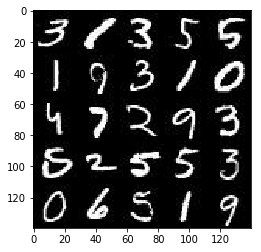

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

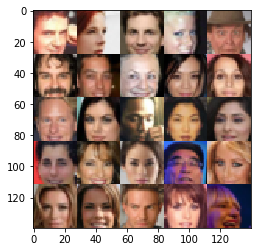

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.1.0
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    real_input = tf.placeholder(tf.float32, (None, image_width, image_height, image_channels), name="input_real")
    z_input = tf.placeholder(tf.float32, (None, z_dim), name="input_z")
    l_rate = tf.placeholder(tf.float32, name="l_rate")
    return real_input, z_input, l_rate


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [53]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    alpha = 0.2
    # TODO: Implement Function
    with tf.variable_scope("discriminator", reuse=reuse):
        #input layer is either 28x28x3(Ce) or 28x28x1 (MNIST)
        # use 3x3 filters, go up to 64
        conv1 = tf.layers.conv2d(images, 64, 5, strides=2, padding="same", kernel_initializer=tf.contrib.layers.xavier_initializer())
        conv1_relu = tf.maximum(alpha*conv1, conv1)
        
        conv2 = tf.layers.conv2d(conv1_relu, 128, 5, strides=2, padding="same", kernel_initializer=tf.contrib.layers.xavier_initializer())
        #assuming we are just using discriminator to train generator. 
        conv2_batch = tf.layers.batch_normalization(conv2, training=True)
        conv2_relu = tf.maximum(alpha * conv2_batch, conv2_batch)
        
        conv3 = tf.layers.conv2d(conv2_relu, 256, 5, strides=2, padding="same", kernel_initializer=tf.contrib.layers.xavier_initializer())
        conv3_batch = tf.layers.batch_normalization(conv3, training=True)
        conv3_relu = tf.maximum(alpha * conv3_batch, conv3_batch)
        
        conv4 = tf.layers.conv2d(conv3_relu, 512, 5, strides=2, padding="same", kernel_initializer=tf.contrib.layers.xavier_initializer())
        conv4_batch = tf.layers.batch_normalization(conv4, training=True)
        conv4_relu = tf.maximum(alpha * conv4_batch, conv4_batch)
        
        #flatten
        flat = tf.reshape(conv4_relu, (-1, 2*2*512))
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)
        

        return out, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [54]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    alpha = 0.2
    
    #there is an inverse relationship to when we re-use variables
    # and when we train the model. If we train the model, then we don't want to 
    # re-use variables. When we generate samples, we want to re-use variables
    # because...?
    
    with tf.variable_scope("generator", reuse=not is_train):
        #first fully connected layer
        #multiple of final image size. 2 x 2 x 512
        fc_1 = tf.layers.dense(z, 2*2*512)
        
        #reshape it
        fc_1 = tf.reshape(fc_1, (-1, 2, 2, 512))
        fc_1 = tf.layers.batch_normalization(fc_1, training=is_train)
        fc_1 = tf.maximum(alpha * fc_1, fc_1)
        # 2 x 2 x 512
        
        #print(fc_1.get_shape())
        
     
     
        fc_2 = tf.layers.conv2d_transpose(fc_1, 256, 2, strides=2, padding="same")
        fc_2 = tf.layers.batch_normalization(fc_2, training=is_train)
        fc_2 = tf.maximum(alpha * fc_2, fc_2)
        #4 x 4 x 256
        #print(fc_2.get_shape())
        
        # note: going from 4x4 to 7x7 researched at 
        # https://discussions.udacity.com/t/project5-discriminator-and-genarator-layers/249101/9
        fc_3 = tf.layers.conv2d_transpose(fc_2, 128, 4, strides=1, padding="valid")
        fc_3 = tf.layers.batch_normalization(fc_3, training=is_train)
        fc_3 = tf.maximum(alpha * fc_3, fc_3)
        #7 x 7 x 128
        
        #print(fc_3.get_shape())

        #14 x 14 x 64
        
        fc_4= tf.layers.conv2d_transpose(fc_3, 64, 5, strides=2, padding="same")
        fc_4 = tf.layers.batch_normalization(fc_4, training=is_train)
        fc_4 = tf.maximum(alpha * fc_4, fc_4)
        
        #print(fc_4.get_shape())
        
        #output_layer - 28 x 28 x output_dim
        logits = tf.layers.conv2d_transpose(fc_4, out_channel_dim, 5, strides=2, padding="same")
        
        #print(logits.get_shape())
        
        
        out = tf.tanh(logits)
        
    
        return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [55]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    
    smooth = 0.1
    real_labels = tf.ones_like(input_real) * (1 - smooth)
    fake_labels = tf.zeros_like(input_z)
    
    g_output = generator(input_z, out_channel_dim, is_train=True)
    d_output_real, d_logits_real = discriminator(input_real, reuse=False)
    d_output_fake, d_logits_fake = discriminator(g_output, reuse=True)
    
    #evaluate accuracy of discriminator on predicting real images. Labels should be 1 for real
    d_loss_real =  tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, 
                                                                          labels=tf.ones_like(d_logits_real) * (1-smooth)))
    
    #evaluate discriminator on predicting fake images. Labels should be 0 for fake
    d_loss_fake = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, 
                                                                         labels=tf.zeros_like(d_logits_fake) ))
    
    d_loss = d_loss_real + d_loss_fake
    
    #evaluate on how well generator fooled discriminator. Use the fake image input / logits, and see how many 
    # the generator successfully fooled the discriminator with (labels = 1)
    g_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, 
                                                                    labels=tf.ones_like(d_logits_fake)))
    
    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [56]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    
    t_variables = tf.trainable_variables()
    g_variables = [var for var in t_variables if var.name.startswith("generator")]
    d_variables = [var for var in t_variables if var.name.startswith("discriminator")]
    
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):

        d_train_opt = tf.train.AdamOptimizer(learning_rate=learning_rate, beta1=beta1).minimize(d_loss, var_list=d_variables)
        g_train_opt= tf.train.AdamOptimizer(learning_rate=learning_rate, beta1=beta1).minimize(g_loss, var_list=g_variables)
    
    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [57]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [58]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
    #by default, assume RGB channel
    image_channels = 3
    if(data_image_mode == "L"):
        image_channels = 1
    
    steps = 0
    
    input_real, input_z, l_rate = model_inputs(data_shape[1], data_shape[2], image_channels, z_dim)
    d_loss, g_loss = model_loss(input_real, input_z, image_channels)
    d_opt, g_opt = model_opt(d_loss, g_loss, l_rate, beta1)
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for batch_images in get_batches(batch_size):
            # TODO: Train Model
            
            #per Udacity forum https://discussions.udacity.com/t/why-am-i-getting-outputs-like-this/411930/2
            # forgot to scale from -0.5 to 0.5 in batch inputs to the needed output -1 to 1 for tanh
            batch_images = batch_images * 2
            batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))

           

            _ = sess.run(d_opt, feed_dict = {input_real: batch_images, 
                                            input_z: batch_z,
                                            l_rate: learning_rate        
                                            })
            _ = sess.run(g_opt, feed_dict = {input_real: batch_images, input_z: batch_z, l_rate: learning_rate})

            if steps % 500 == 0:
                show_generator_output(sess, 1, input_z, image_channels, data_image_mode)
                train_loss_d = sess.run(d_loss, {input_z: batch_z, input_real: batch_images, l_rate: learning_rate})
                train_loss_g = g_loss.eval({input_z: batch_z, l_rate: learning_rate})
                print("Discriminator Loss: {:.4f}...".format(train_loss_d),
                      "Generator Loss: {:.4f}".format(train_loss_g))

        # at end of each epoch, caclulate losses and them out
       
                

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

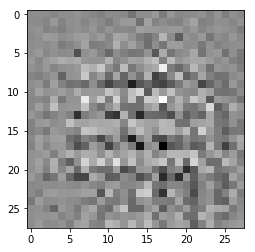

Discriminator Loss: 7.6601... Generator Loss: 5.8201


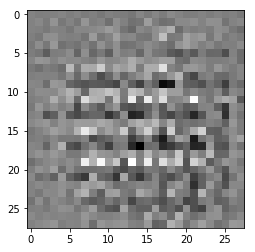

Discriminator Loss: 14.6387... Generator Loss: 0.0000


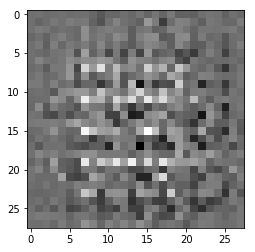

Discriminator Loss: 1.5528... Generator Loss: 2.5330


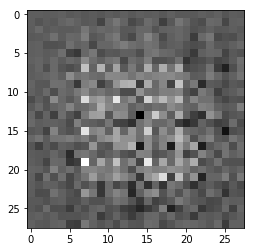

Discriminator Loss: 2.9639... Generator Loss: 0.2550


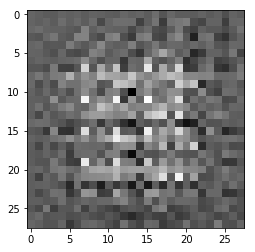

Discriminator Loss: 6.1010... Generator Loss: 14.2293


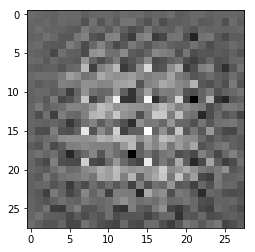

Discriminator Loss: 0.9738... Generator Loss: 4.2028


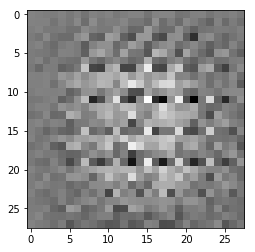

Discriminator Loss: 12.8425... Generator Loss: 0.0000


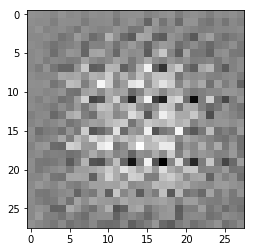

Discriminator Loss: 0.6518... Generator Loss: 1.4808


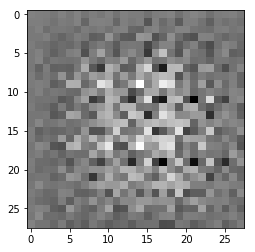

Discriminator Loss: 0.8395... Generator Loss: 5.4477


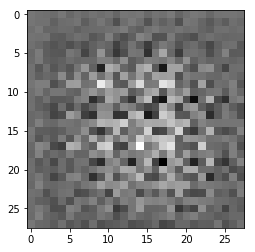

Discriminator Loss: 0.4403... Generator Loss: 3.0922


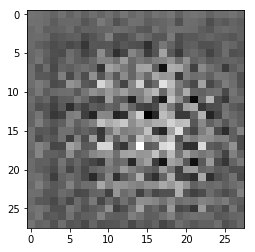

Discriminator Loss: 1.5552... Generator Loss: 0.3647


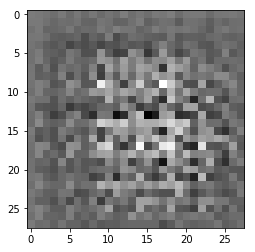

Discriminator Loss: 1.0891... Generator Loss: 6.4368


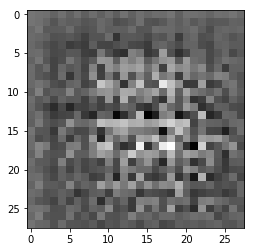

Discriminator Loss: 0.3883... Generator Loss: 5.4278


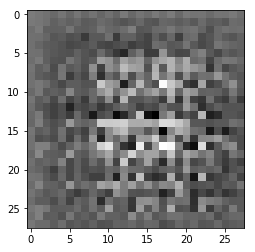

Discriminator Loss: 0.4460... Generator Loss: 2.6970


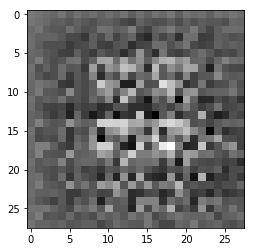

Discriminator Loss: 1.0910... Generator Loss: 0.6812


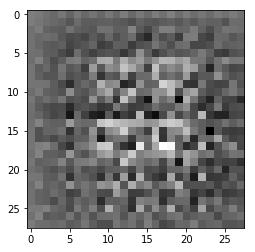

Discriminator Loss: 1.7508... Generator Loss: 9.0544


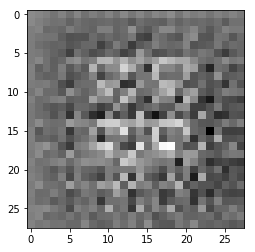

Discriminator Loss: 0.3495... Generator Loss: 7.1292


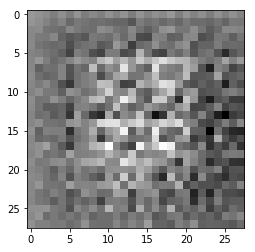

Discriminator Loss: 0.7158... Generator Loss: 1.3572


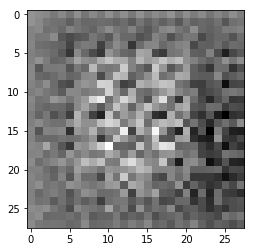

Discriminator Loss: 0.5561... Generator Loss: 1.7227


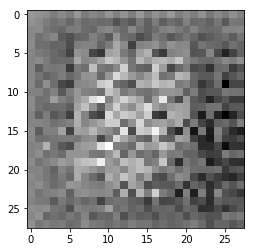

Discriminator Loss: 0.7832... Generator Loss: 2.7540


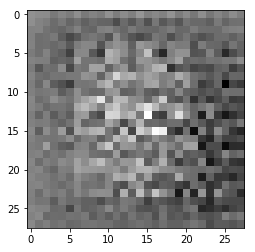

Discriminator Loss: 4.3946... Generator Loss: 0.0180


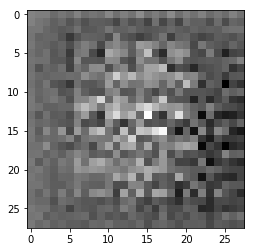

Discriminator Loss: 2.4016... Generator Loss: 7.4986


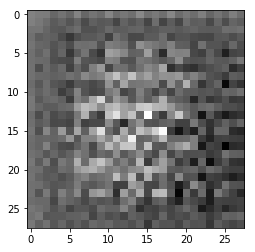

Discriminator Loss: 0.5582... Generator Loss: 4.9523


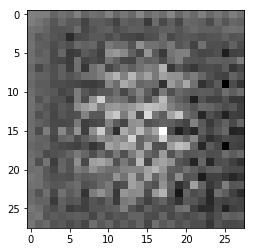

Discriminator Loss: 0.6633... Generator Loss: 1.3162


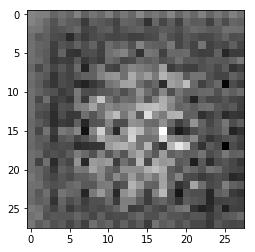

Discriminator Loss: 0.9955... Generator Loss: 0.7605


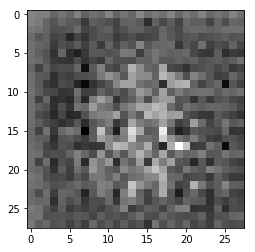

Discriminator Loss: 1.0141... Generator Loss: 3.3649


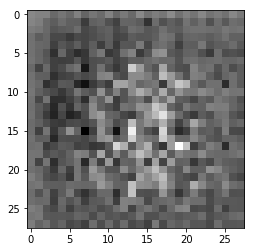

Discriminator Loss: 2.9429... Generator Loss: 0.0876


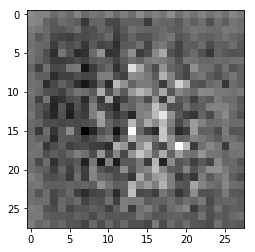

Discriminator Loss: 2.1250... Generator Loss: 5.2871


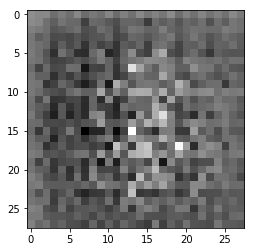

Discriminator Loss: 0.7141... Generator Loss: 2.7705


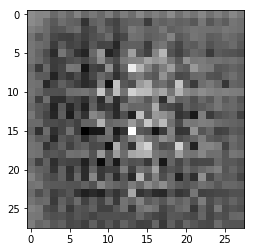

Discriminator Loss: 1.8531... Generator Loss: 0.2546


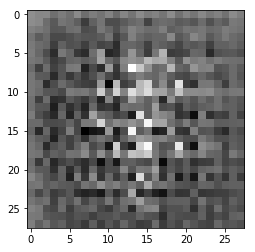

Discriminator Loss: 0.6204... Generator Loss: 3.3448


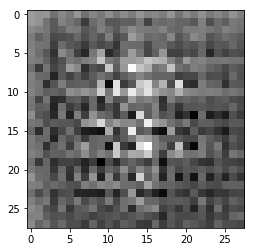

Discriminator Loss: 0.5645... Generator Loss: 3.3985


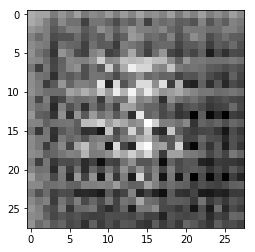

Discriminator Loss: 0.6281... Generator Loss: 1.4849


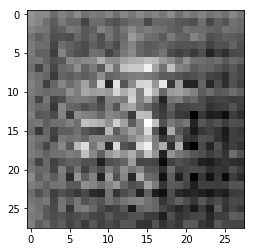

Discriminator Loss: 0.6201... Generator Loss: 1.4815


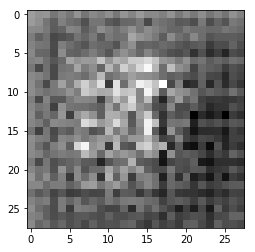

Discriminator Loss: 0.5620... Generator Loss: 2.2940


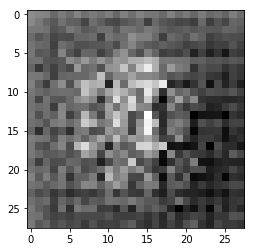

Discriminator Loss: 0.6191... Generator Loss: 1.6984


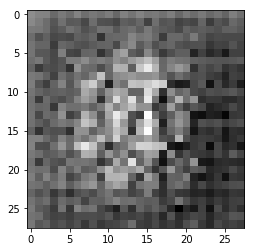

Discriminator Loss: 0.5656... Generator Loss: 2.1699


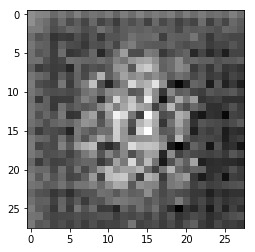

Discriminator Loss: 1.0601... Generator Loss: 0.7483


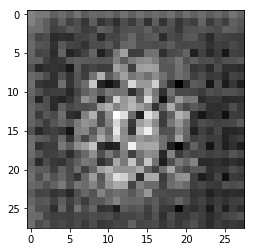

Discriminator Loss: 1.7380... Generator Loss: 5.9948


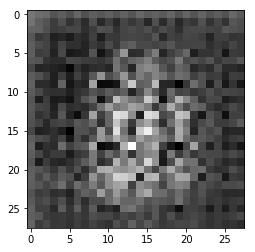

Discriminator Loss: 1.6434... Generator Loss: 0.3572


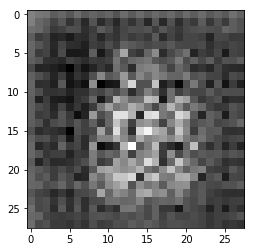

Discriminator Loss: 1.1831... Generator Loss: 6.3401


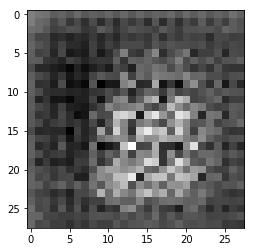

Discriminator Loss: 0.4062... Generator Loss: 4.7551


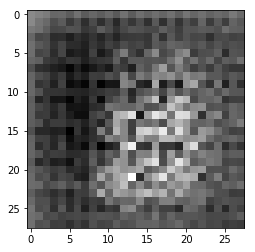

Discriminator Loss: 0.5207... Generator Loss: 2.1122


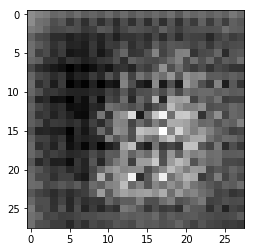

Discriminator Loss: 0.8721... Generator Loss: 0.9840


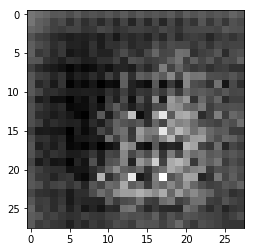

Discriminator Loss: 0.5252... Generator Loss: 5.6241


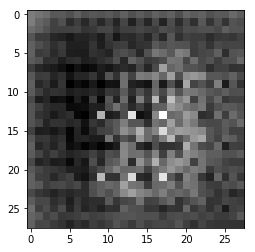

Discriminator Loss: 0.4481... Generator Loss: 4.3284


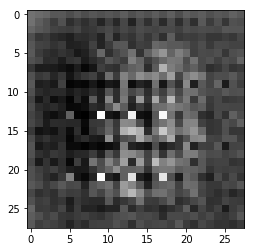

Discriminator Loss: 3.2774... Generator Loss: 0.0576


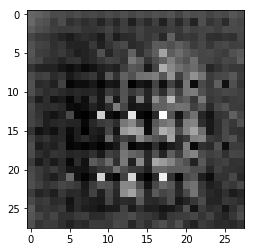

Discriminator Loss: 2.4970... Generator Loss: 7.4525


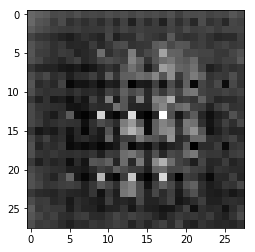

Discriminator Loss: 0.6613... Generator Loss: 5.1683


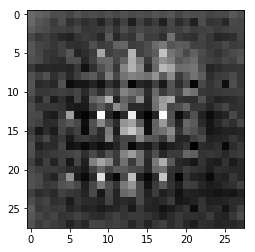

Discriminator Loss: 0.6932... Generator Loss: 1.3530


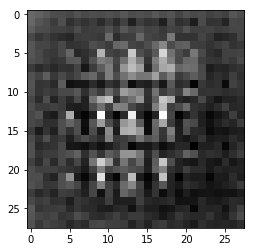

Discriminator Loss: 0.8756... Generator Loss: 0.9870


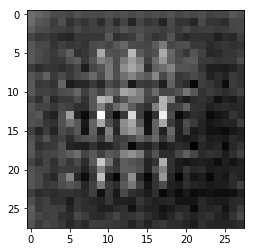

Discriminator Loss: 0.4868... Generator Loss: 4.0350


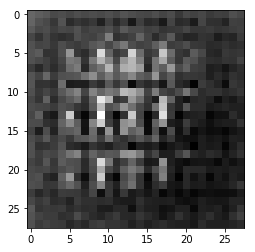

Discriminator Loss: 0.4641... Generator Loss: 4.4105


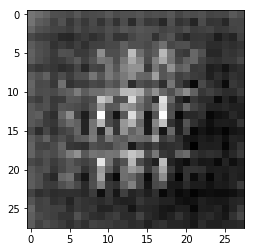

Discriminator Loss: 0.4784... Generator Loss: 2.2320


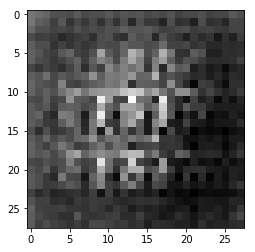

Discriminator Loss: 1.0306... Generator Loss: 0.7685


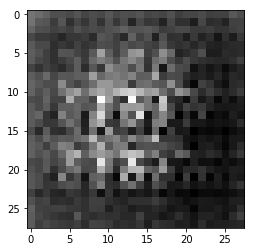

Discriminator Loss: 1.0948... Generator Loss: 6.3328


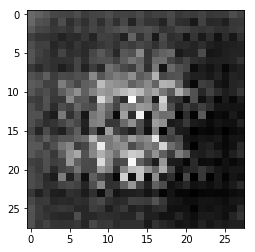

Discriminator Loss: 0.3875... Generator Loss: 3.8803


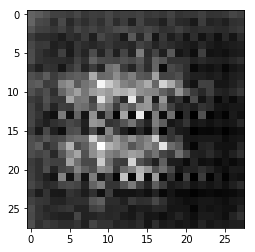

Discriminator Loss: 1.6360... Generator Loss: 0.3624


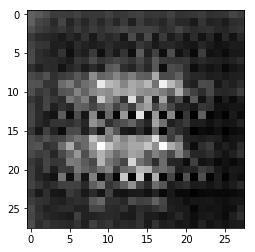

Discriminator Loss: 1.8610... Generator Loss: 8.2039


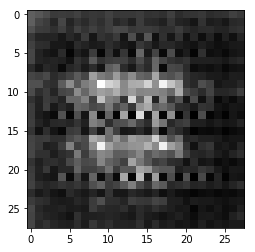

Discriminator Loss: 0.4411... Generator Loss: 6.6687


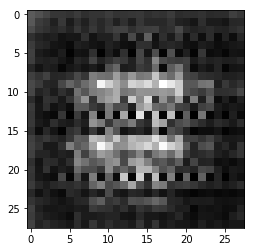

Discriminator Loss: 0.6757... Generator Loss: 1.6441


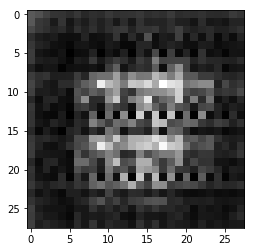

Discriminator Loss: 1.4635... Generator Loss: 0.5060


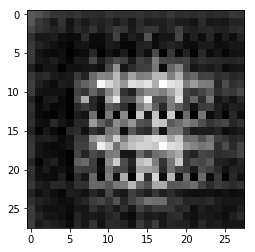

Discriminator Loss: 0.7019... Generator Loss: 6.1932


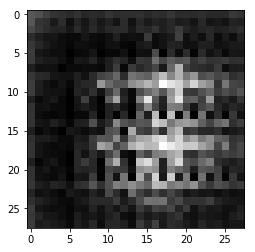

Discriminator Loss: 0.5845... Generator Loss: 5.5210


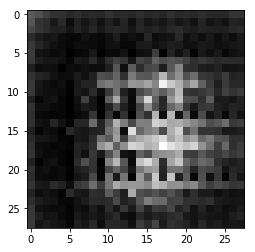

Discriminator Loss: 0.4524... Generator Loss: 2.4304


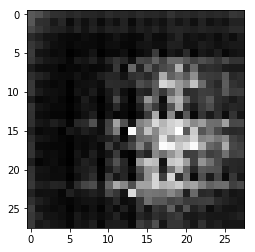

Discriminator Loss: 1.9819... Generator Loss: 0.2266


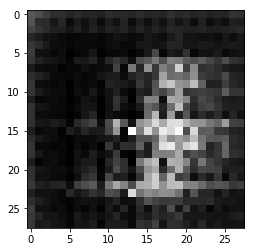

Discriminator Loss: 1.4832... Generator Loss: 6.5854


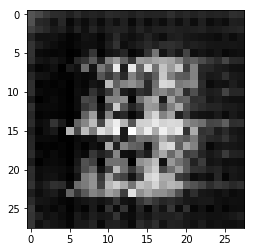

Discriminator Loss: 0.7268... Generator Loss: 4.9674


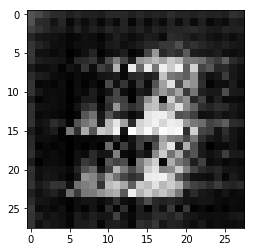

Discriminator Loss: 0.8029... Generator Loss: 1.2507


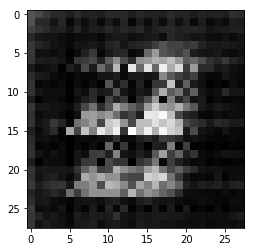

Discriminator Loss: 1.1020... Generator Loss: 0.7856


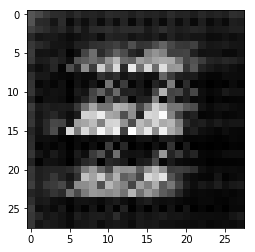

Discriminator Loss: 0.7614... Generator Loss: 2.9678


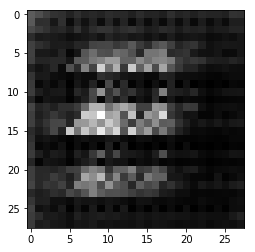

Discriminator Loss: 0.7345... Generator Loss: 1.5457


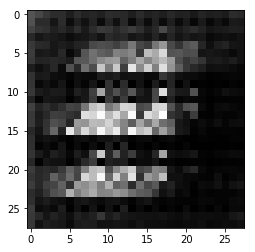

Discriminator Loss: 0.5956... Generator Loss: 1.6692


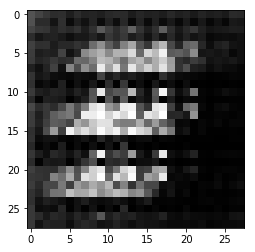

Discriminator Loss: 0.4238... Generator Loss: 3.2992


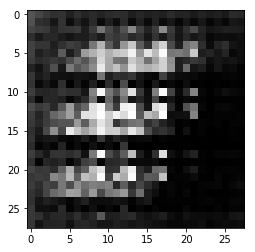

Discriminator Loss: 0.5408... Generator Loss: 1.9451


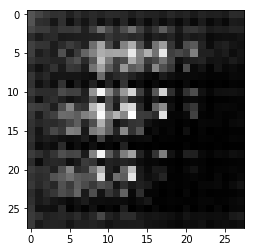

Discriminator Loss: 1.0741... Generator Loss: 0.7455


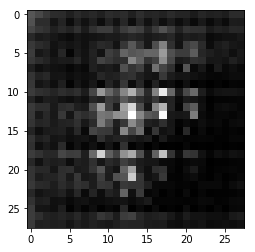

Discriminator Loss: 1.7686... Generator Loss: 8.7715


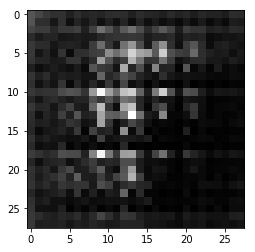

Discriminator Loss: 0.4159... Generator Loss: 5.7488


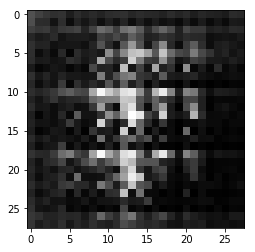

Discriminator Loss: 1.3684... Generator Loss: 1.1305


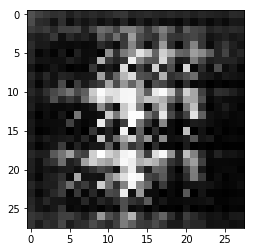

Discriminator Loss: 0.3595... Generator Loss: 5.9648


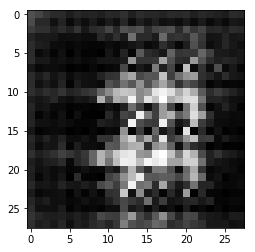

Discriminator Loss: 0.5259... Generator Loss: 4.4009


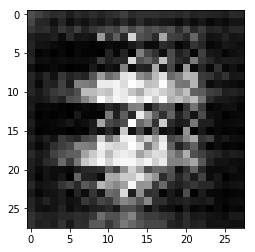

Discriminator Loss: 2.5085... Generator Loss: 0.1897


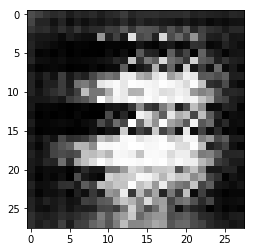

Discriminator Loss: 2.0273... Generator Loss: 6.4202


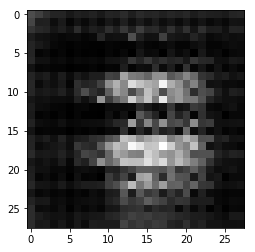

Discriminator Loss: 0.8069... Generator Loss: 5.0533


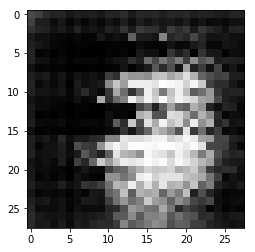

Discriminator Loss: 0.5253... Generator Loss: 2.7271


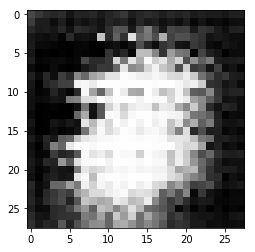

Discriminator Loss: 0.7765... Generator Loss: 1.1553


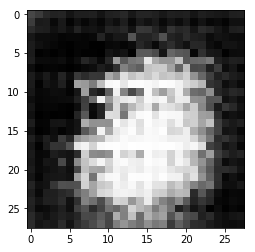

Discriminator Loss: 0.7504... Generator Loss: 1.2599


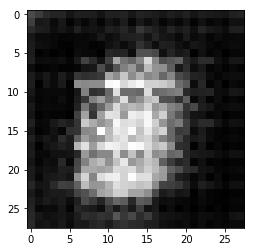

Discriminator Loss: 0.7679... Generator Loss: 2.0578


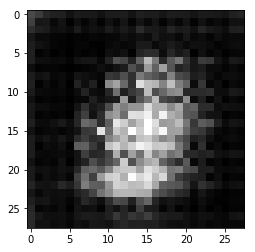

Discriminator Loss: 1.0390... Generator Loss: 1.1781


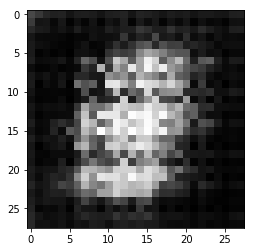

Discriminator Loss: 1.0342... Generator Loss: 0.8107


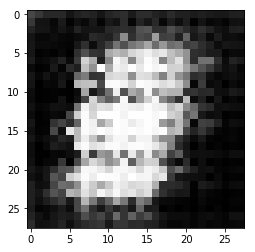

Discriminator Loss: 0.7040... Generator Loss: 3.3402


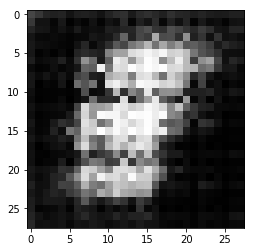

Discriminator Loss: 0.5157... Generator Loss: 2.2144


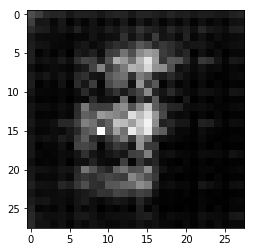

Discriminator Loss: 0.8323... Generator Loss: 1.1029


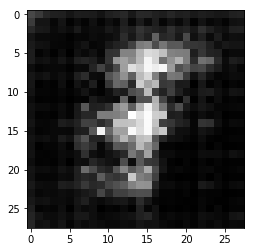

Discriminator Loss: 1.1351... Generator Loss: 5.3065


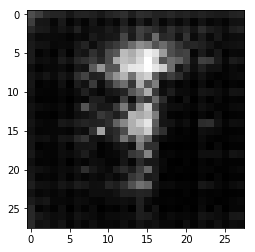

Discriminator Loss: 0.4880... Generator Loss: 2.4382


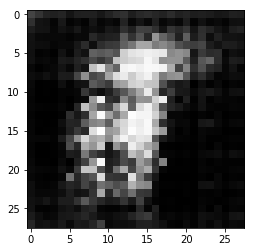

Discriminator Loss: 0.9708... Generator Loss: 0.8195


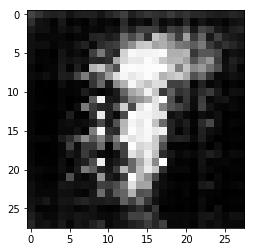

Discriminator Loss: 0.7807... Generator Loss: 6.3919


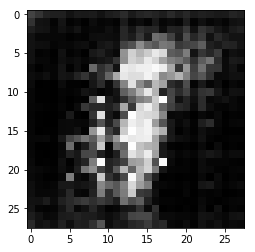

Discriminator Loss: 0.3623... Generator Loss: 4.3640


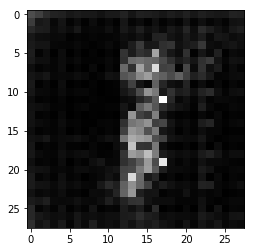

Discriminator Loss: 1.5224... Generator Loss: 0.5088


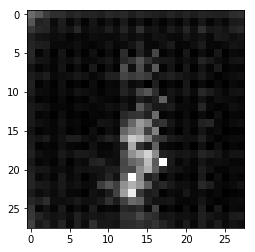

Discriminator Loss: 1.2097... Generator Loss: 6.8317


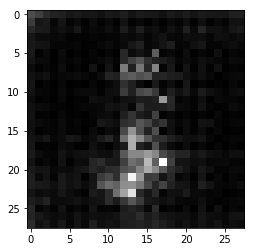

Discriminator Loss: 0.4569... Generator Loss: 4.1394


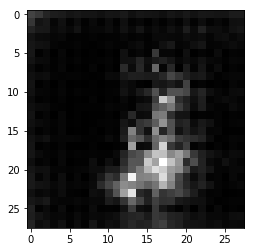

Discriminator Loss: 0.9371... Generator Loss: 0.9214


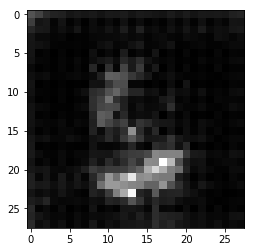

Discriminator Loss: 0.5639... Generator Loss: 2.0641


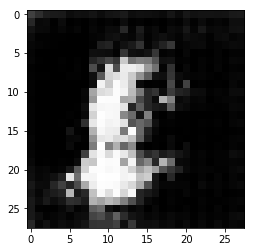

Discriminator Loss: 0.6504... Generator Loss: 2.4178


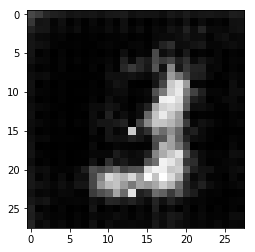

Discriminator Loss: 0.7453... Generator Loss: 1.2890


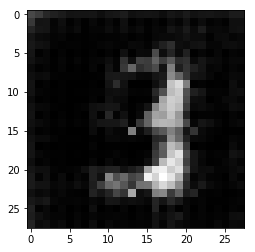

Discriminator Loss: 0.8005... Generator Loss: 2.7226


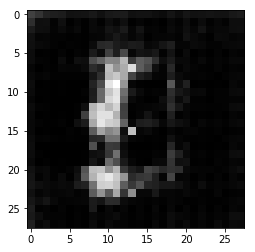

Discriminator Loss: 1.1964... Generator Loss: 0.5739


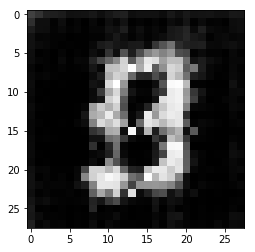

Discriminator Loss: 1.0903... Generator Loss: 5.3807


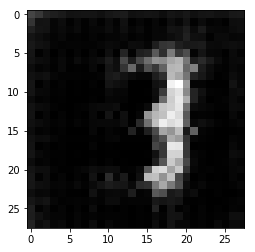

Discriminator Loss: 0.4445... Generator Loss: 3.0312


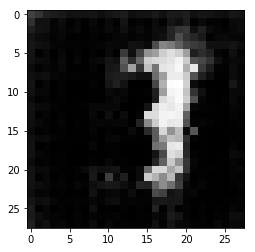

Discriminator Loss: 0.6143... Generator Loss: 1.6004


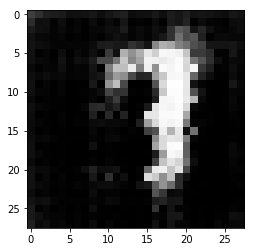

Discriminator Loss: 0.4990... Generator Loss: 2.1159


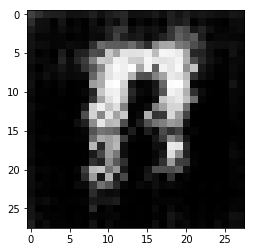

Discriminator Loss: 0.4590... Generator Loss: 3.2338


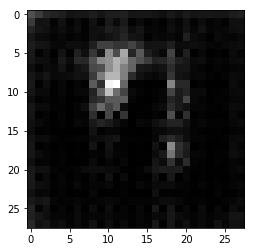

Discriminator Loss: 0.4099... Generator Loss: 3.3910


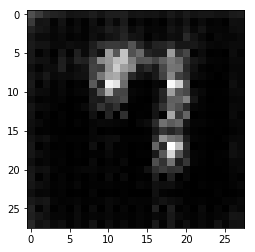

Discriminator Loss: 0.4176... Generator Loss: 2.6693


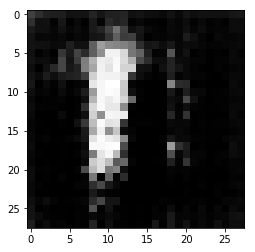

Discriminator Loss: 0.4128... Generator Loss: 2.7963


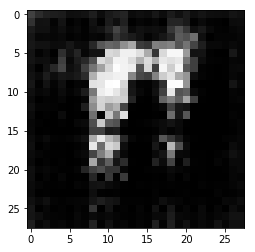

Discriminator Loss: 0.3946... Generator Loss: 3.4251


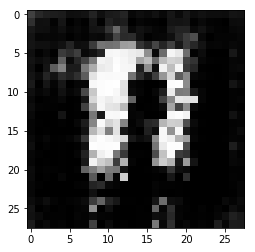

Discriminator Loss: 0.3798... Generator Loss: 3.5868


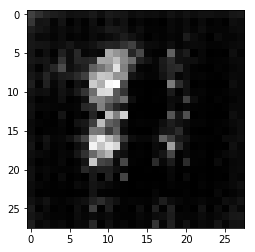

Discriminator Loss: 0.4182... Generator Loss: 2.7696


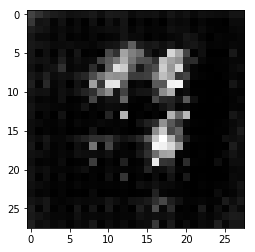

Discriminator Loss: 0.5452... Generator Loss: 1.8106


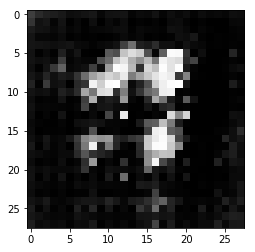

Discriminator Loss: 0.5512... Generator Loss: 5.7305


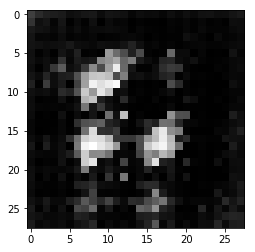

Discriminator Loss: 0.4187... Generator Loss: 2.7985


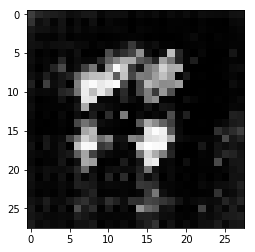

Discriminator Loss: 1.4209... Generator Loss: 0.5020


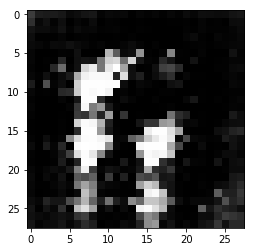

Discriminator Loss: 4.0023... Generator Loss: 13.3401


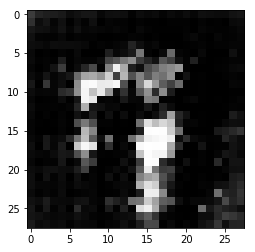

Discriminator Loss: 0.7207... Generator Loss: 9.5364


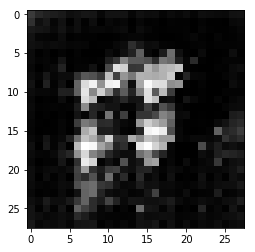

Discriminator Loss: 0.4309... Generator Loss: 4.8524


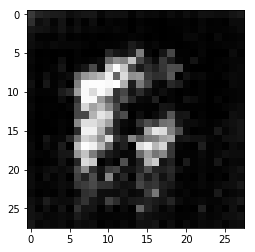

Discriminator Loss: 0.6681... Generator Loss: 2.2055


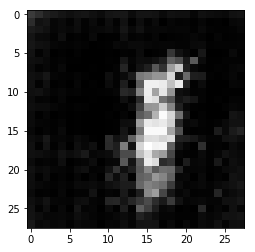

Discriminator Loss: 0.6617... Generator Loss: 1.7420


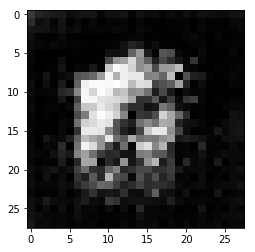

Discriminator Loss: 0.4890... Generator Loss: 2.1610


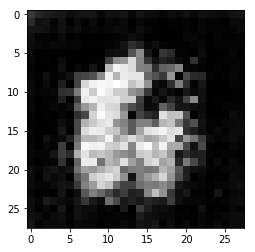

Discriminator Loss: 0.5010... Generator Loss: 2.0779


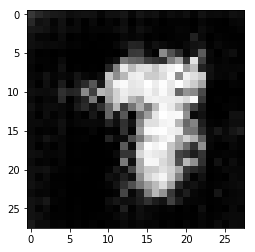

Discriminator Loss: 0.5150... Generator Loss: 2.0969


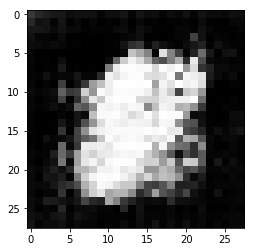

Discriminator Loss: 0.8888... Generator Loss: 1.0175


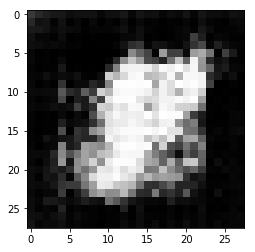

Discriminator Loss: 1.6154... Generator Loss: 0.4519


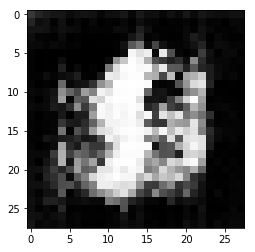

Discriminator Loss: 0.9785... Generator Loss: 1.8747


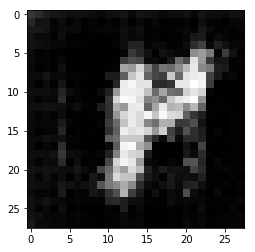

Discriminator Loss: 1.2447... Generator Loss: 0.6855


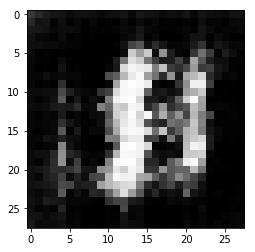

Discriminator Loss: 0.7007... Generator Loss: 1.8422


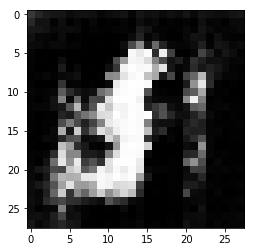

Discriminator Loss: 0.8005... Generator Loss: 1.3939


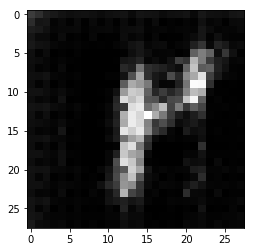

Discriminator Loss: 0.4562... Generator Loss: 2.5089


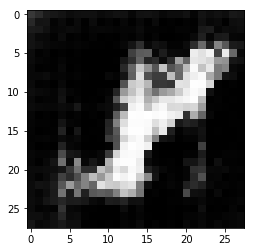

Discriminator Loss: 0.5242... Generator Loss: 2.1133


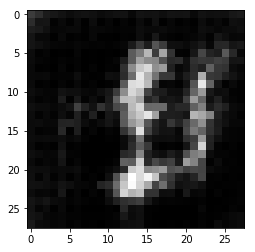

Discriminator Loss: 1.1101... Generator Loss: 0.8647


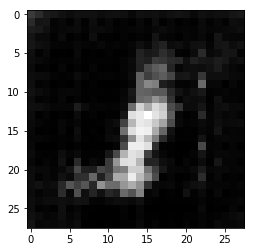

Discriminator Loss: 0.8676... Generator Loss: 3.3733


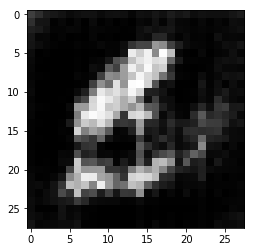

Discriminator Loss: 1.1071... Generator Loss: 0.9355


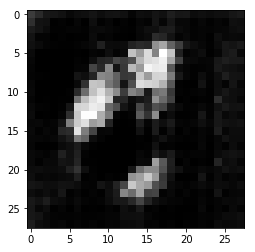

Discriminator Loss: 1.1172... Generator Loss: 2.4360


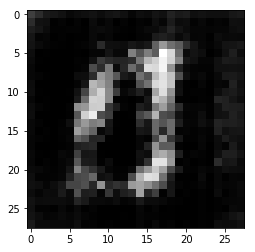

Discriminator Loss: 0.7323... Generator Loss: 1.6683


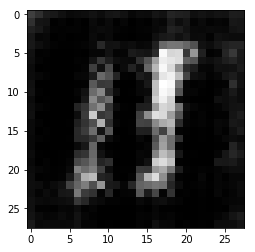

Discriminator Loss: 0.6464... Generator Loss: 2.4115


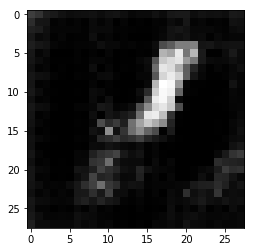

Discriminator Loss: 0.8108... Generator Loss: 1.1828


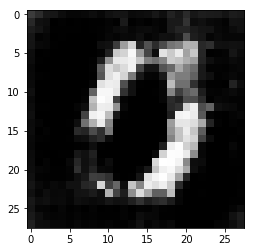

Discriminator Loss: 0.7286... Generator Loss: 1.8896


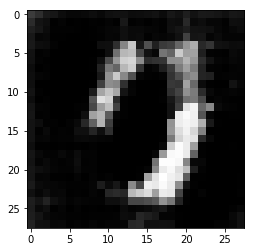

Discriminator Loss: 1.0350... Generator Loss: 0.9537


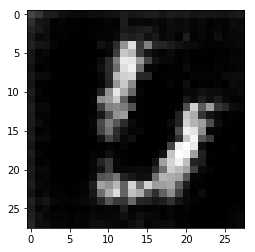

Discriminator Loss: 0.8549... Generator Loss: 2.7402


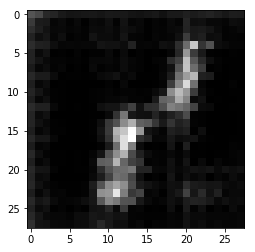

Discriminator Loss: 1.1955... Generator Loss: 0.7748


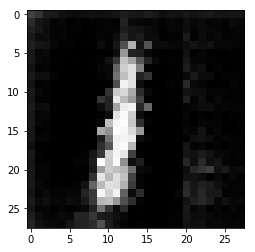

Discriminator Loss: 0.5127... Generator Loss: 4.4913


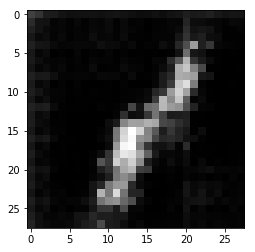

Discriminator Loss: 0.4719... Generator Loss: 3.7910


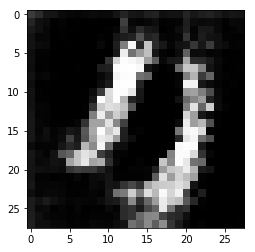

Discriminator Loss: 0.7286... Generator Loss: 1.8008


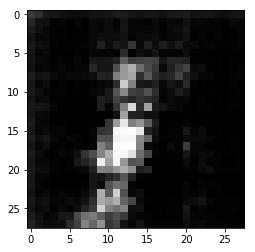

Discriminator Loss: 0.8944... Generator Loss: 3.0594


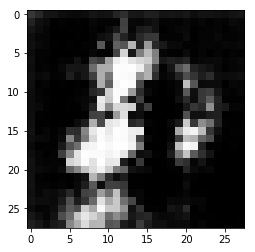

Discriminator Loss: 1.6374... Generator Loss: 0.4114


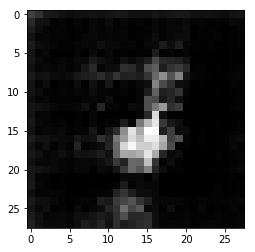

Discriminator Loss: 1.1602... Generator Loss: 6.2556


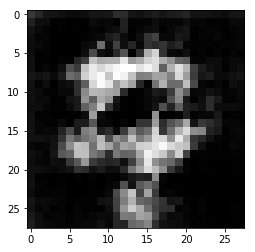

Discriminator Loss: 0.6210... Generator Loss: 2.0678


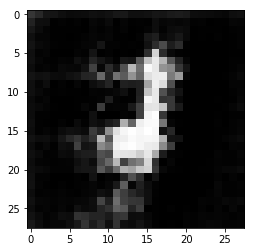

Discriminator Loss: 1.0396... Generator Loss: 1.3862


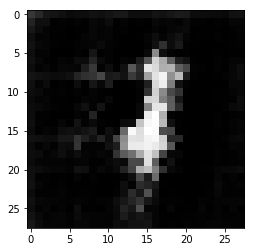

Discriminator Loss: 0.6159... Generator Loss: 4.2469


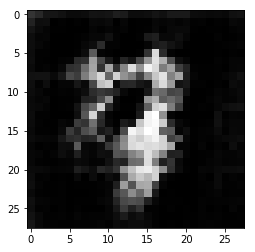

Discriminator Loss: 0.4810... Generator Loss: 3.3184


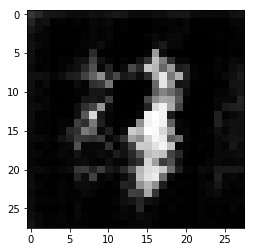

Discriminator Loss: 0.8147... Generator Loss: 1.2789


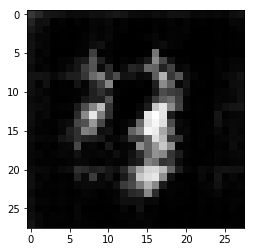

Discriminator Loss: 0.6425... Generator Loss: 4.3799


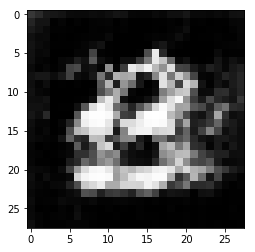

Discriminator Loss: 0.7906... Generator Loss: 1.1496


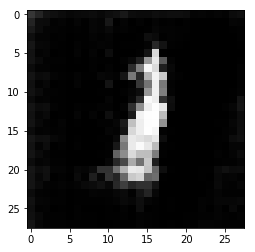

Discriminator Loss: 0.6447... Generator Loss: 2.9044


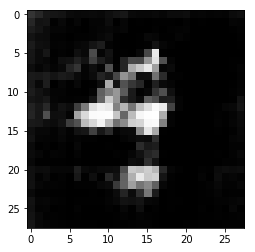

Discriminator Loss: 0.6511... Generator Loss: 1.4620


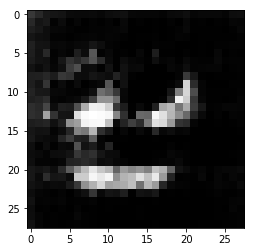

Discriminator Loss: 0.5006... Generator Loss: 2.5014


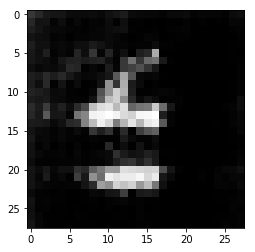

Discriminator Loss: 0.4741... Generator Loss: 2.4735


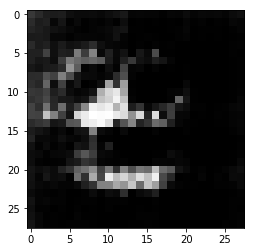

Discriminator Loss: 0.4938... Generator Loss: 2.4246


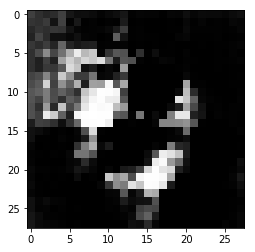

Discriminator Loss: 0.4402... Generator Loss: 3.3893


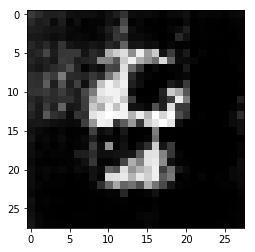

Discriminator Loss: 0.4544... Generator Loss: 2.7914


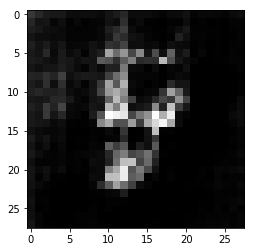

Discriminator Loss: 1.1537... Generator Loss: 0.6786


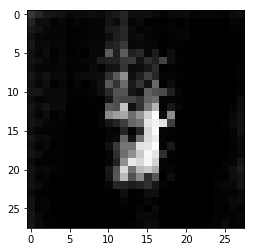

Discriminator Loss: 1.1128... Generator Loss: 6.4008


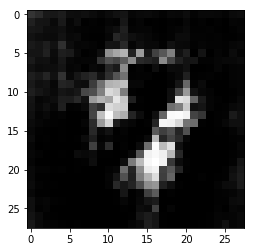

Discriminator Loss: 0.4572... Generator Loss: 3.3646


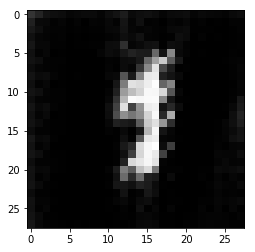

Discriminator Loss: 0.7606... Generator Loss: 1.4103


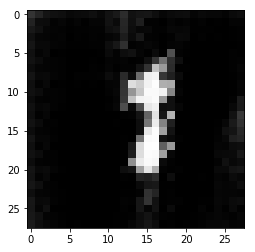

Discriminator Loss: 0.4884... Generator Loss: 3.3249


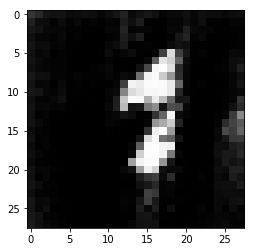

Discriminator Loss: 0.4858... Generator Loss: 3.8245


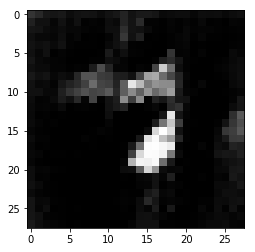

Discriminator Loss: 0.5209... Generator Loss: 2.0045


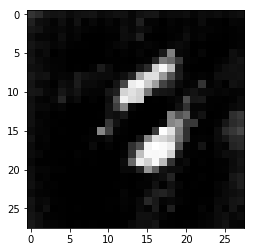

Discriminator Loss: 0.5149... Generator Loss: 2.1229


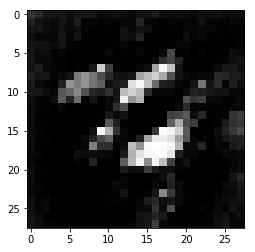

Discriminator Loss: 0.4200... Generator Loss: 3.9470


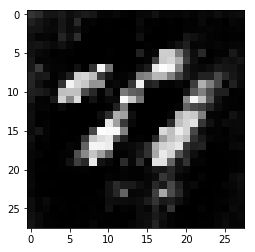

Discriminator Loss: 0.4788... Generator Loss: 2.5142


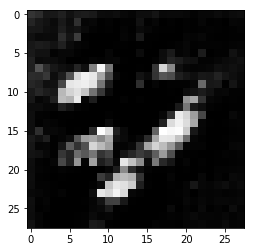

Discriminator Loss: 0.5950... Generator Loss: 1.7309


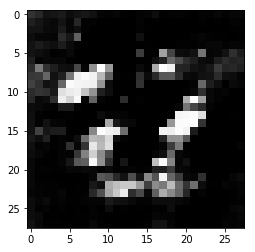

Discriminator Loss: 0.9276... Generator Loss: 0.9816


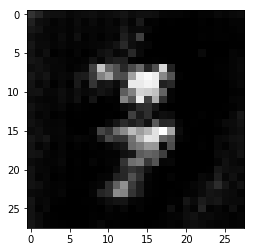

Discriminator Loss: 0.8923... Generator Loss: 4.2617


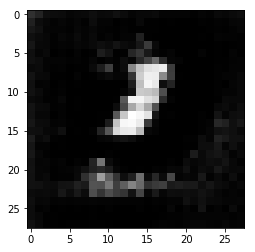

Discriminator Loss: 3.7840... Generator Loss: 0.0525


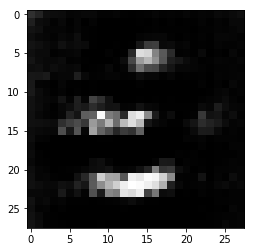

Discriminator Loss: 2.9191... Generator Loss: 6.9443


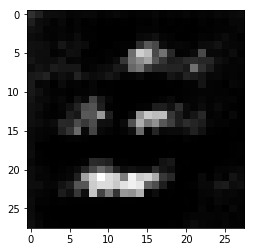

Discriminator Loss: 1.0146... Generator Loss: 4.4593


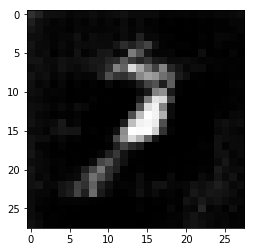

Discriminator Loss: 3.2024... Generator Loss: 0.0891


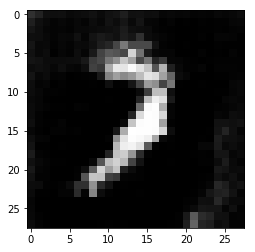

Discriminator Loss: 1.2517... Generator Loss: 1.2977


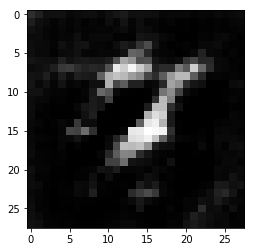

Discriminator Loss: 1.2158... Generator Loss: 2.0362


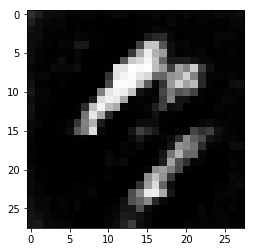

Discriminator Loss: 0.9391... Generator Loss: 1.1372


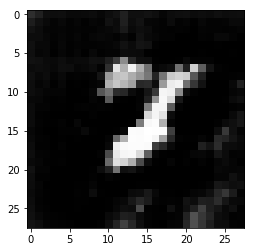

Discriminator Loss: 0.9106... Generator Loss: 1.0106


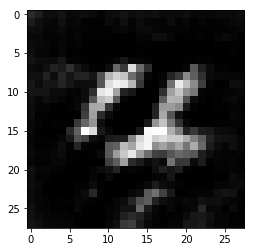

Discriminator Loss: 0.7603... Generator Loss: 2.9722


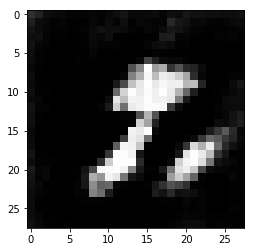

Discriminator Loss: 1.0399... Generator Loss: 1.1229


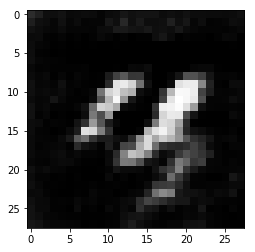

Discriminator Loss: 0.8525... Generator Loss: 1.4531


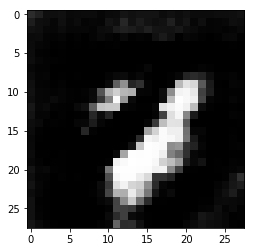

Discriminator Loss: 0.5632... Generator Loss: 2.8247


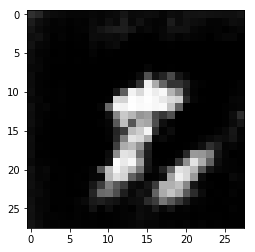

Discriminator Loss: 0.6438... Generator Loss: 2.0489


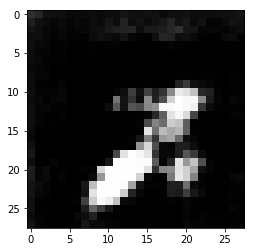

Discriminator Loss: 0.9154... Generator Loss: 1.1373


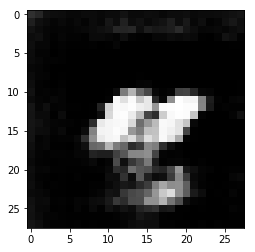

Discriminator Loss: 0.6950... Generator Loss: 2.4292


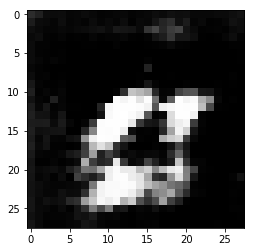

Discriminator Loss: 0.6029... Generator Loss: 2.0746


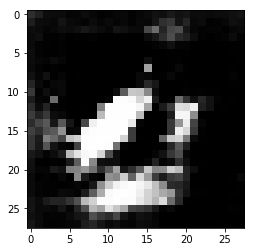

Discriminator Loss: 0.8427... Generator Loss: 1.1596


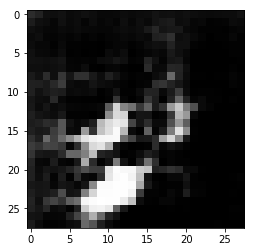

Discriminator Loss: 0.7143... Generator Loss: 4.0408


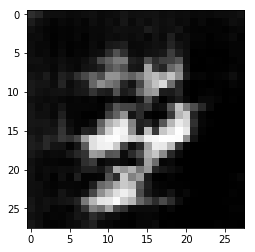

Discriminator Loss: 0.8631... Generator Loss: 1.6717


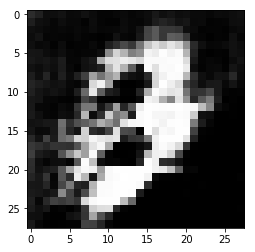

Discriminator Loss: 1.5111... Generator Loss: 0.6383


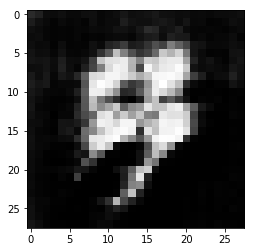

Discriminator Loss: 1.8130... Generator Loss: 6.0998


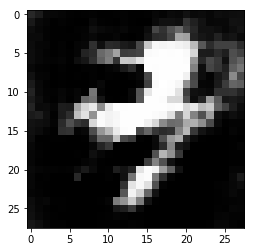

Discriminator Loss: 1.5127... Generator Loss: 0.6454


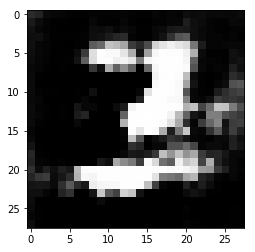

Discriminator Loss: 0.7577... Generator Loss: 2.1447


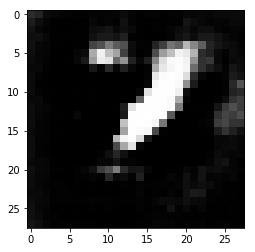

Discriminator Loss: 0.6113... Generator Loss: 2.5720


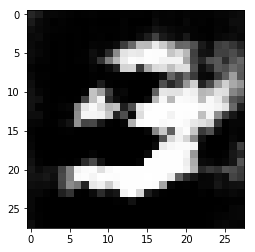

Discriminator Loss: 0.5965... Generator Loss: 1.9137


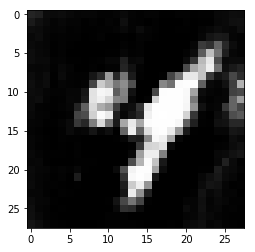

Discriminator Loss: 0.6747... Generator Loss: 1.4607


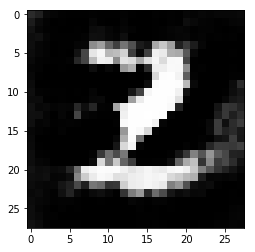

Discriminator Loss: 0.6323... Generator Loss: 1.8407


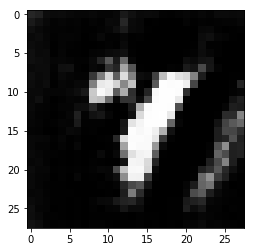

Discriminator Loss: 0.6270... Generator Loss: 1.8160


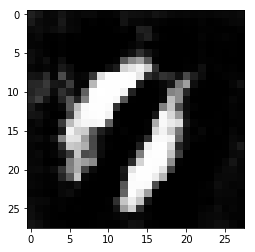

Discriminator Loss: 0.7718... Generator Loss: 1.4147


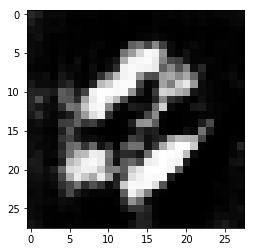

Discriminator Loss: 0.8956... Generator Loss: 1.4494


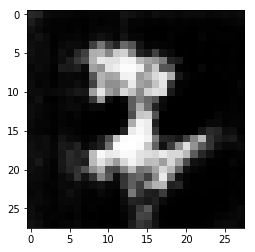

Discriminator Loss: 0.9134... Generator Loss: 1.2413


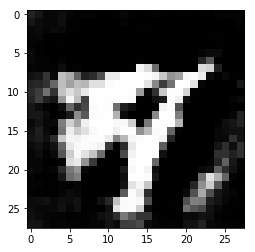

Discriminator Loss: 0.8237... Generator Loss: 1.3298


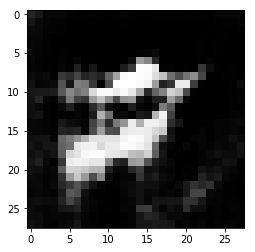

Discriminator Loss: 0.6502... Generator Loss: 2.8761


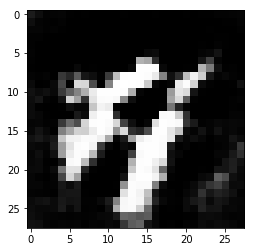

Discriminator Loss: 0.7343... Generator Loss: 1.4584


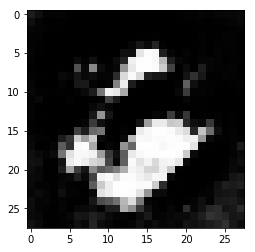

Discriminator Loss: 0.7399... Generator Loss: 2.1812


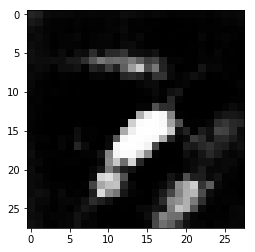

Discriminator Loss: 0.5941... Generator Loss: 1.9994


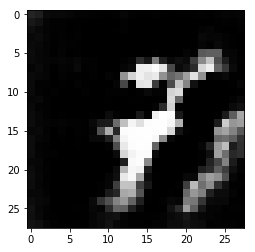

Discriminator Loss: 1.2636... Generator Loss: 0.6665


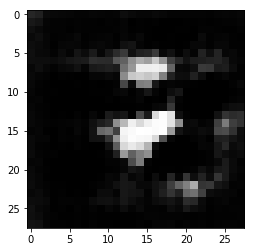

Discriminator Loss: 1.0294... Generator Loss: 4.9487


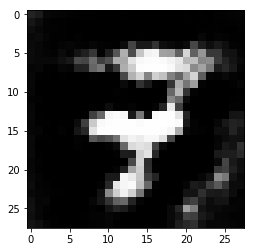

Discriminator Loss: 0.7099... Generator Loss: 1.7980


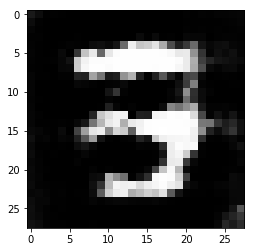

Discriminator Loss: 0.8541... Generator Loss: 1.2168


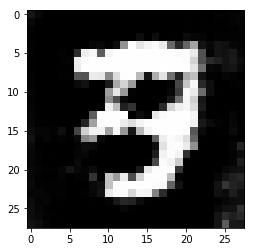

Discriminator Loss: 0.4587... Generator Loss: 3.1710


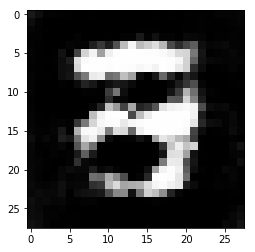

Discriminator Loss: 0.5323... Generator Loss: 2.8493


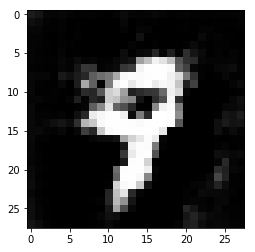

Discriminator Loss: 0.6280... Generator Loss: 1.6351


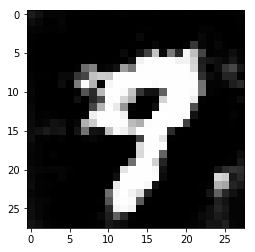

Discriminator Loss: 0.7581... Generator Loss: 1.3567


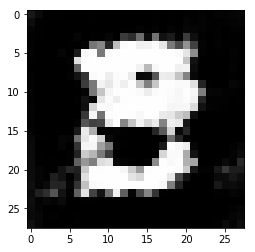

Discriminator Loss: 0.9214... Generator Loss: 1.4933


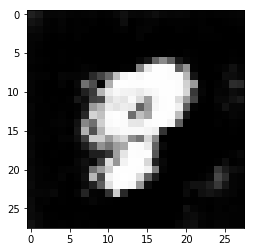

Discriminator Loss: 1.0075... Generator Loss: 1.2816


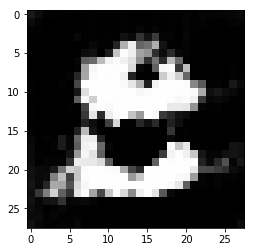

Discriminator Loss: 0.8665... Generator Loss: 3.3813


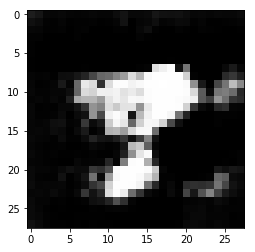

Discriminator Loss: 1.9170... Generator Loss: 0.3281


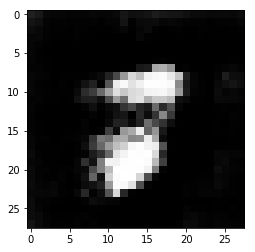

Discriminator Loss: 2.3248... Generator Loss: 7.5251


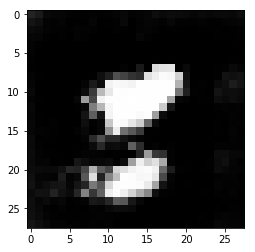

Discriminator Loss: 0.4482... Generator Loss: 4.2227


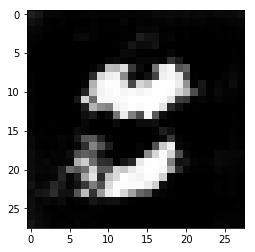

Discriminator Loss: 0.9545... Generator Loss: 1.1311


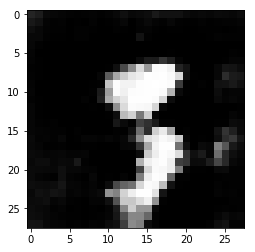

Discriminator Loss: 0.8444... Generator Loss: 1.2230


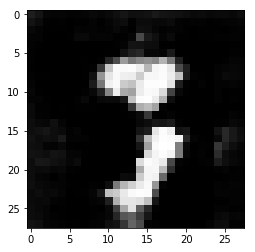

Discriminator Loss: 0.6180... Generator Loss: 2.1295


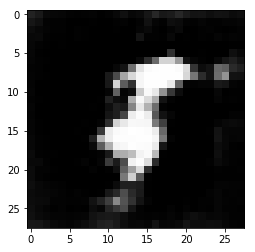

Discriminator Loss: 0.9367... Generator Loss: 1.3875


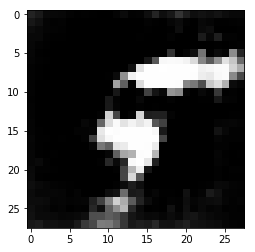

Discriminator Loss: 0.8653... Generator Loss: 1.3403


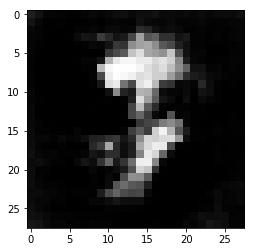

Discriminator Loss: 0.7596... Generator Loss: 1.9396


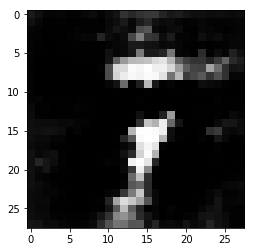

Discriminator Loss: 1.0033... Generator Loss: 0.9670


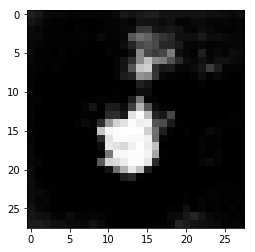

Discriminator Loss: 0.6090... Generator Loss: 2.2094


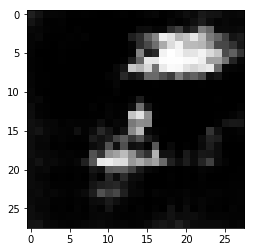

Discriminator Loss: 1.0145... Generator Loss: 0.9413


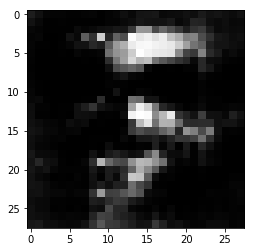

Discriminator Loss: 0.9549... Generator Loss: 1.0732


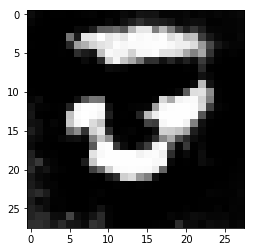

Discriminator Loss: 0.7444... Generator Loss: 2.5051


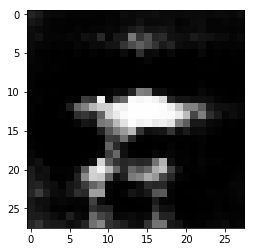

Discriminator Loss: 1.4428... Generator Loss: 0.5894


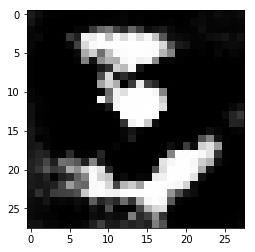

Discriminator Loss: 0.4621... Generator Loss: 3.6492


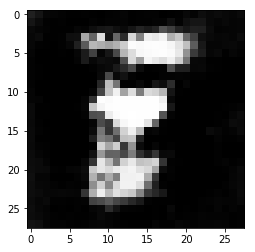

Discriminator Loss: 0.5387... Generator Loss: 3.6089


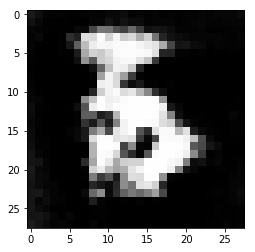

Discriminator Loss: 0.8084... Generator Loss: 1.6260


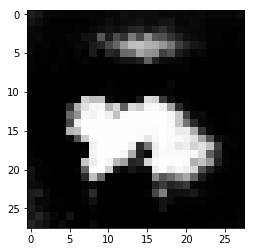

Discriminator Loss: 1.3602... Generator Loss: 0.7492


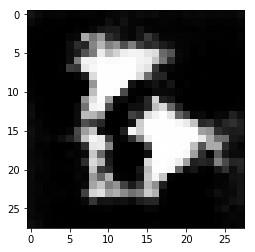

Discriminator Loss: 1.2103... Generator Loss: 0.9198


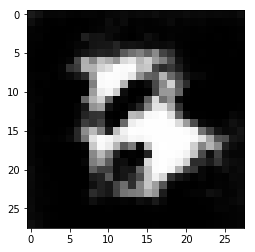

Discriminator Loss: 1.5251... Generator Loss: 3.4755


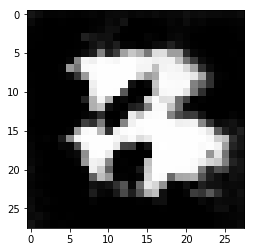

Discriminator Loss: 1.2963... Generator Loss: 0.6257


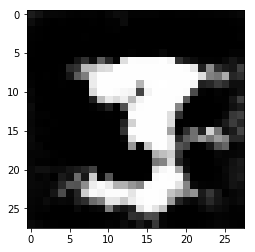

Discriminator Loss: 0.5961... Generator Loss: 2.4438


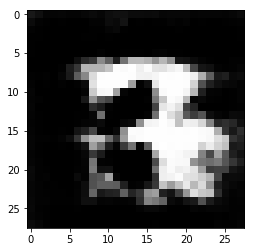

Discriminator Loss: 0.5064... Generator Loss: 2.6826


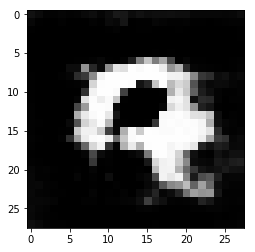

Discriminator Loss: 0.5308... Generator Loss: 2.2704


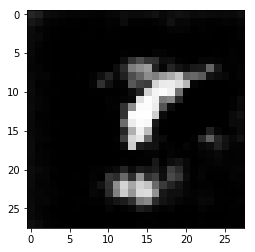

Discriminator Loss: 0.6093... Generator Loss: 1.6962


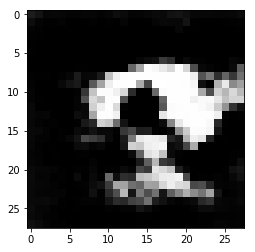

Discriminator Loss: 1.6796... Generator Loss: 0.3956


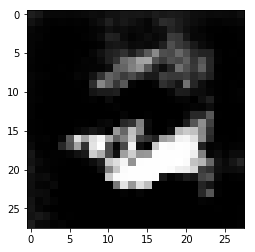

Discriminator Loss: 1.8333... Generator Loss: 4.6638


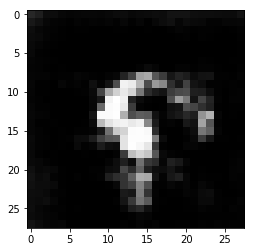

Discriminator Loss: 1.5284... Generator Loss: 0.4081


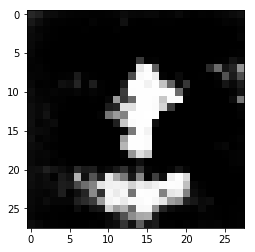

Discriminator Loss: 0.9819... Generator Loss: 1.2356


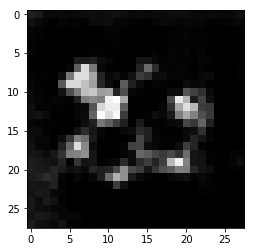

Discriminator Loss: 0.9556... Generator Loss: 1.4316


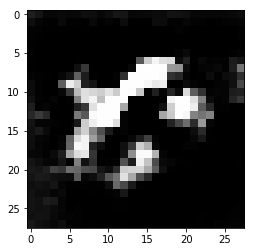

Discriminator Loss: 0.8180... Generator Loss: 1.9499


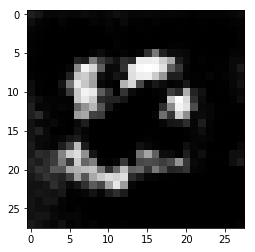

Discriminator Loss: 0.7618... Generator Loss: 1.5245


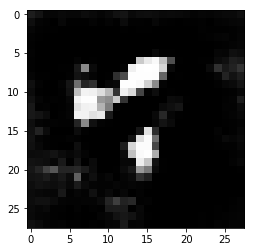

Discriminator Loss: 0.7610... Generator Loss: 1.2953


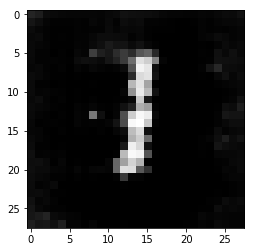

Discriminator Loss: 0.6793... Generator Loss: 2.5680


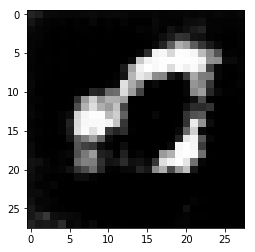

Discriminator Loss: 0.6069... Generator Loss: 1.9129


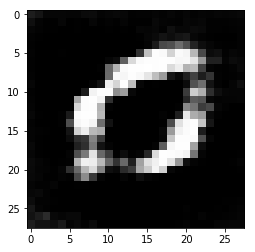

Discriminator Loss: 0.6583... Generator Loss: 1.9776


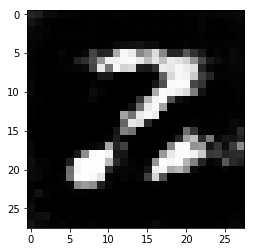

Discriminator Loss: 0.7625... Generator Loss: 1.8569


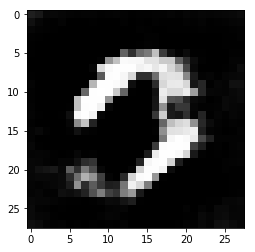

Discriminator Loss: 1.0932... Generator Loss: 0.8753


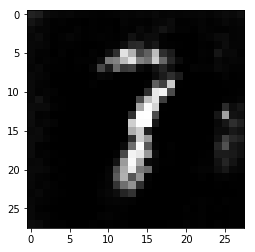

Discriminator Loss: 1.1478... Generator Loss: 3.1798


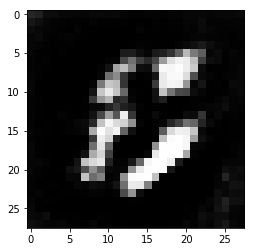

Discriminator Loss: 1.2448... Generator Loss: 0.7243


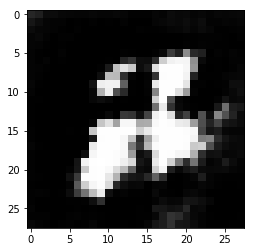

Discriminator Loss: 1.0352... Generator Loss: 3.2572


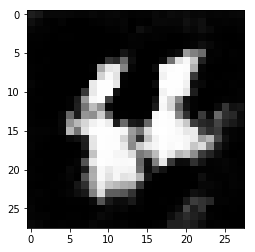

Discriminator Loss: 0.8010... Generator Loss: 1.5527


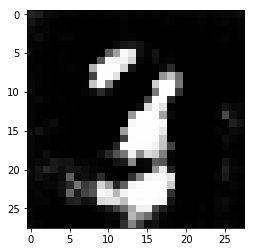

Discriminator Loss: 1.1040... Generator Loss: 0.9002


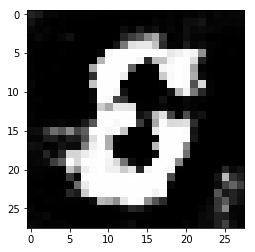

Discriminator Loss: 1.0378... Generator Loss: 3.6782


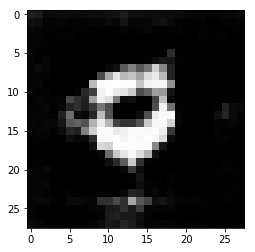

Discriminator Loss: 1.6251... Generator Loss: 0.4436


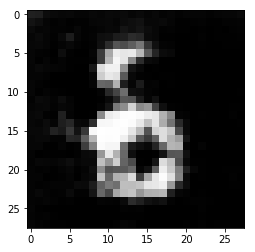

Discriminator Loss: 0.7283... Generator Loss: 2.3918


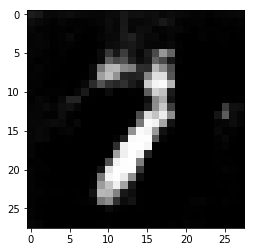

Discriminator Loss: 0.7145... Generator Loss: 2.0126


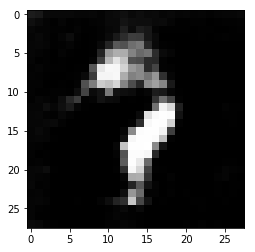

Discriminator Loss: 0.8087... Generator Loss: 1.3910


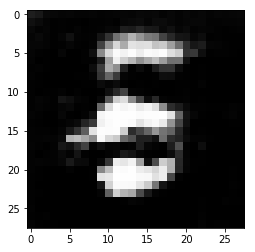

Discriminator Loss: 1.2477... Generator Loss: 0.7113


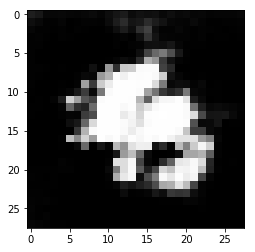

Discriminator Loss: 1.2754... Generator Loss: 2.9849


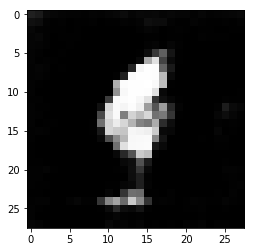

Discriminator Loss: 1.6431... Generator Loss: 0.3964


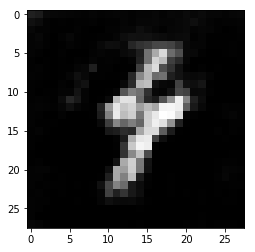

Discriminator Loss: 0.6984... Generator Loss: 2.9080


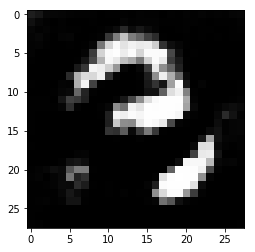

Discriminator Loss: 0.7973... Generator Loss: 1.3090


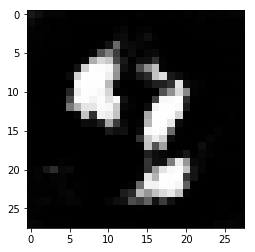

Discriminator Loss: 0.6876... Generator Loss: 1.4751


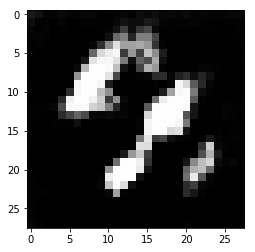

Discriminator Loss: 0.7012... Generator Loss: 1.9821


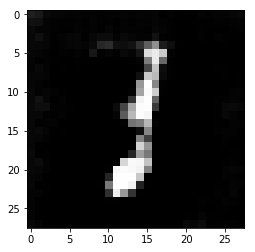

Discriminator Loss: 0.7860... Generator Loss: 1.2643


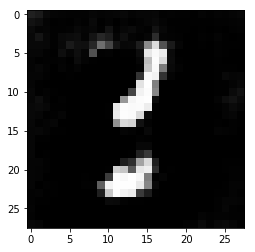

Discriminator Loss: 0.8107... Generator Loss: 1.5660


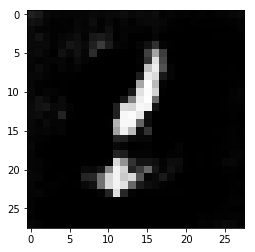

Discriminator Loss: 0.8918... Generator Loss: 1.2732


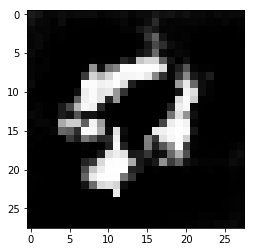

Discriminator Loss: 0.8973... Generator Loss: 1.2594


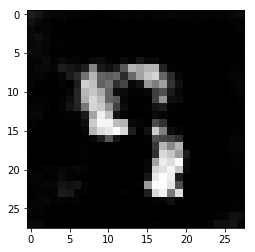

Discriminator Loss: 1.0345... Generator Loss: 2.8580


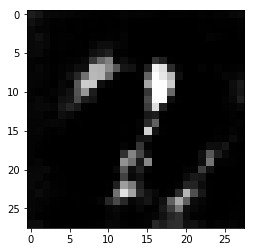

Discriminator Loss: 1.2293... Generator Loss: 0.7269


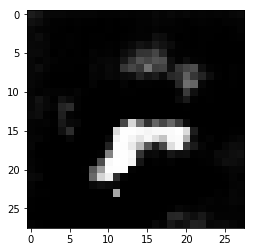

Discriminator Loss: 0.8064... Generator Loss: 2.6892


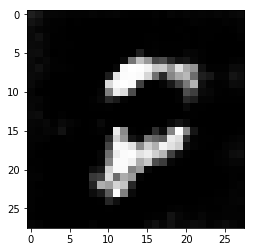

Discriminator Loss: 0.6555... Generator Loss: 1.9727


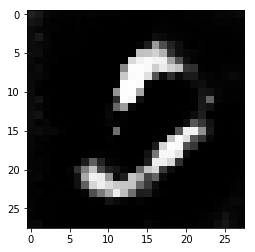

Discriminator Loss: 0.9583... Generator Loss: 1.0068


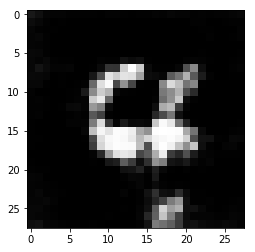

Discriminator Loss: 0.8021... Generator Loss: 2.5936


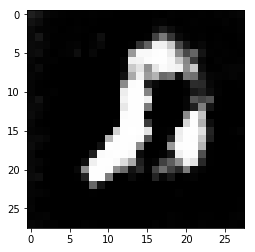

Discriminator Loss: 1.0991... Generator Loss: 0.8648


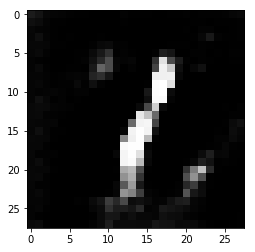

Discriminator Loss: 0.7813... Generator Loss: 1.5358


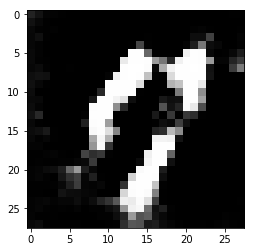

Discriminator Loss: 0.8844... Generator Loss: 1.2872


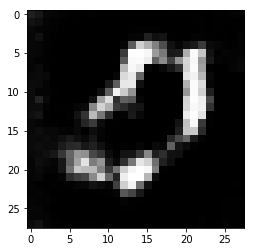

Discriminator Loss: 0.9028... Generator Loss: 1.1542


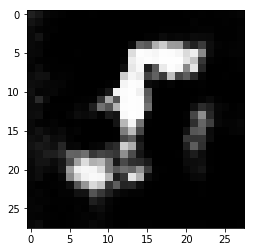

Discriminator Loss: 0.9405... Generator Loss: 1.2058


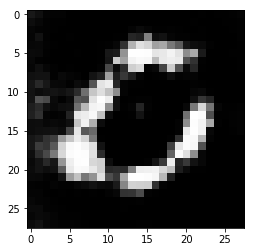

Discriminator Loss: 0.7997... Generator Loss: 1.8217


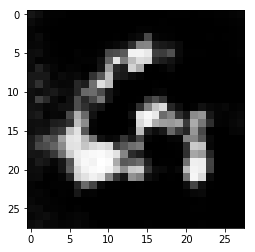

Discriminator Loss: 1.2113... Generator Loss: 0.7074


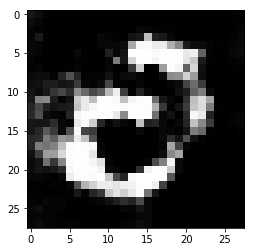

Discriminator Loss: 1.5285... Generator Loss: 6.3080


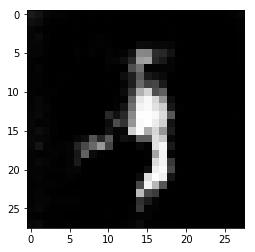

Discriminator Loss: 1.6509... Generator Loss: 0.5421


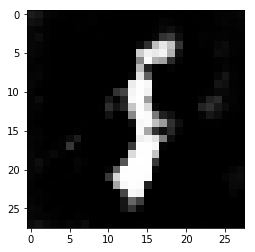

Discriminator Loss: 0.6401... Generator Loss: 1.7922


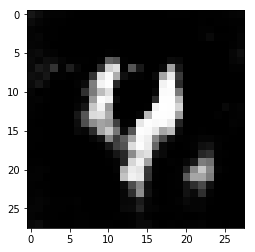

Discriminator Loss: 0.8059... Generator Loss: 2.8596


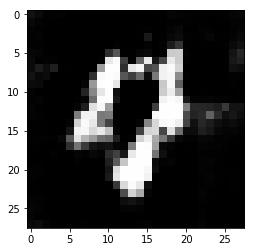

Discriminator Loss: 1.1845... Generator Loss: 0.7551


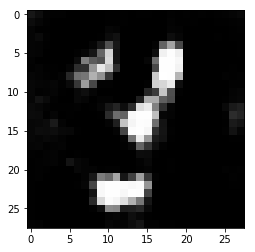

Discriminator Loss: 0.7853... Generator Loss: 2.0269


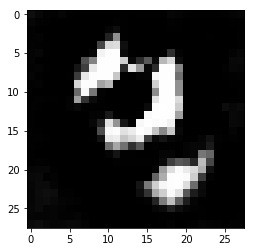

Discriminator Loss: 0.6137... Generator Loss: 2.3551


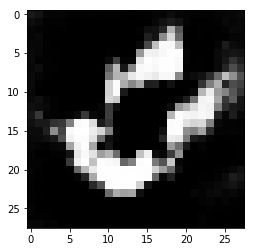

Discriminator Loss: 0.8601... Generator Loss: 1.0971


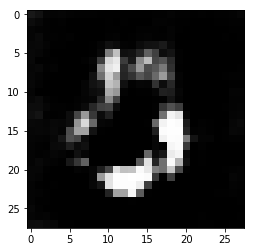

Discriminator Loss: 0.8138... Generator Loss: 1.7138


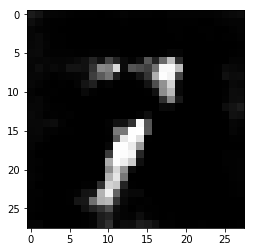

Discriminator Loss: 0.8143... Generator Loss: 1.1733


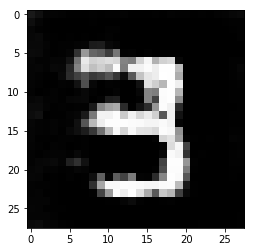

Discriminator Loss: 0.9576... Generator Loss: 0.9755


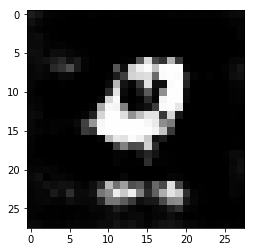

Discriminator Loss: 1.1310... Generator Loss: 3.4951


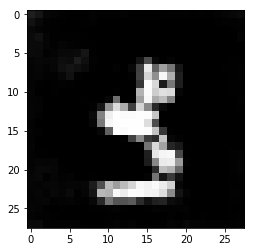

Discriminator Loss: 1.6638... Generator Loss: 0.4803


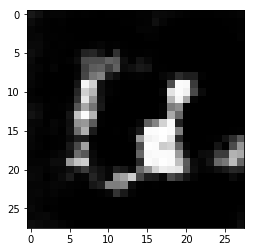

Discriminator Loss: 0.8428... Generator Loss: 3.2715


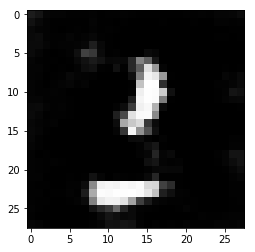

Discriminator Loss: 0.7369... Generator Loss: 1.6384


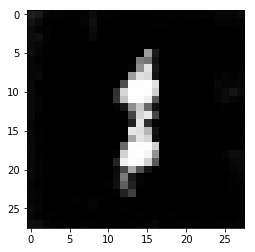

Discriminator Loss: 0.8857... Generator Loss: 1.1177


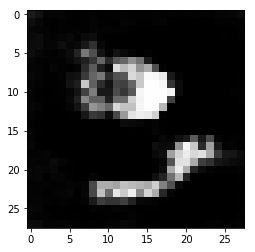

Discriminator Loss: 0.9256... Generator Loss: 1.3507


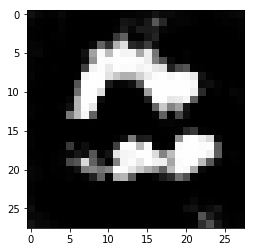

Discriminator Loss: 0.9242... Generator Loss: 1.1913


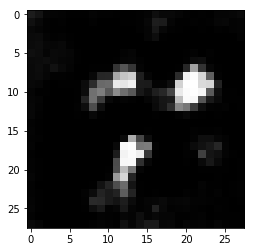

Discriminator Loss: 0.8388... Generator Loss: 2.3790


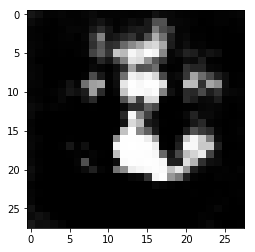

Discriminator Loss: 0.8833... Generator Loss: 1.0894


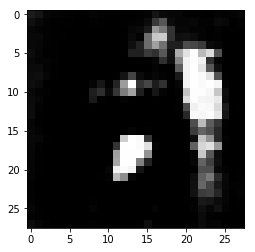

Discriminator Loss: 0.6154... Generator Loss: 1.9952


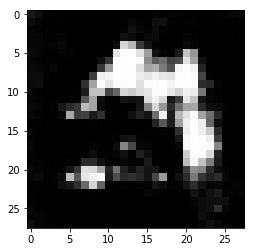

Discriminator Loss: 0.6750... Generator Loss: 1.8114


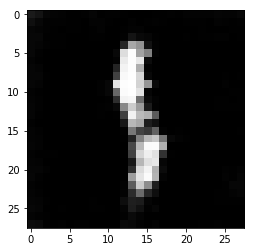

Discriminator Loss: 0.6235... Generator Loss: 1.9577


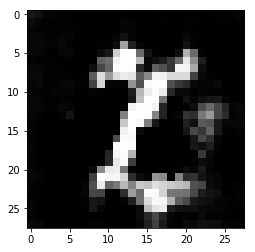

Discriminator Loss: 1.0801... Generator Loss: 0.8160


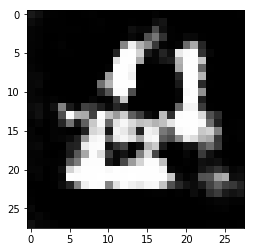

Discriminator Loss: 0.8808... Generator Loss: 3.4247


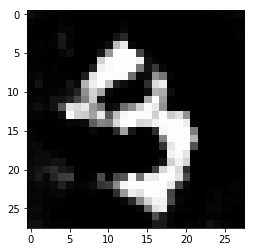

Discriminator Loss: 1.2250... Generator Loss: 0.7407


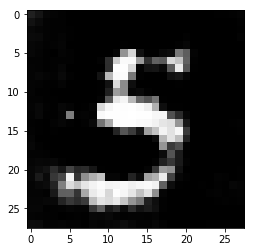

Discriminator Loss: 0.8463... Generator Loss: 2.3911


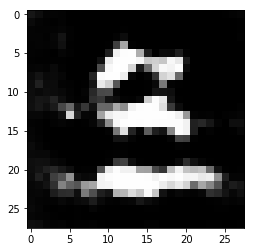

Discriminator Loss: 0.7574... Generator Loss: 1.9715


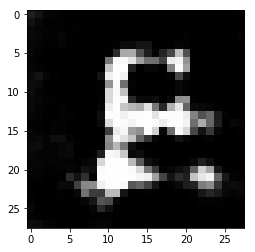

Discriminator Loss: 1.0016... Generator Loss: 1.1282


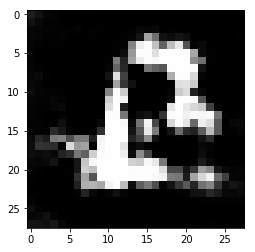

Discriminator Loss: 0.7439... Generator Loss: 2.3795


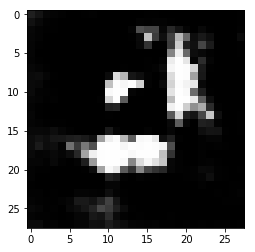

Discriminator Loss: 0.7332... Generator Loss: 1.7031


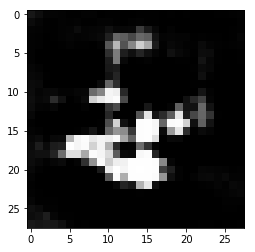

Discriminator Loss: 0.8875... Generator Loss: 1.1513


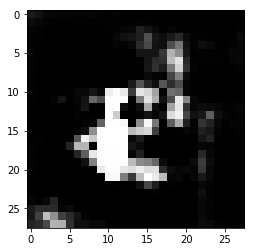

Discriminator Loss: 0.9710... Generator Loss: 4.0908


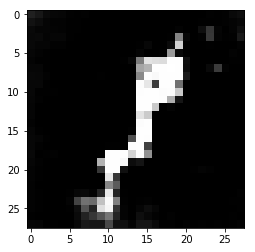

Discriminator Loss: 1.7474... Generator Loss: 0.4392


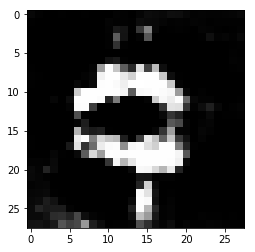

Discriminator Loss: 1.0167... Generator Loss: 4.8204


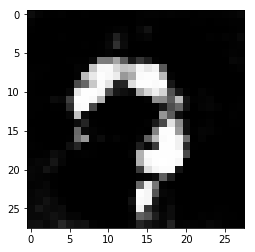

Discriminator Loss: 0.7074... Generator Loss: 1.8943


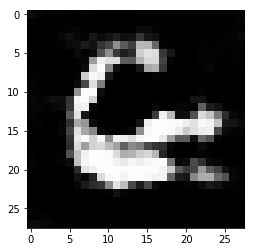

Discriminator Loss: 1.0919... Generator Loss: 0.8164


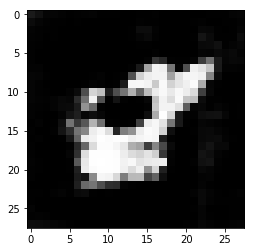

Discriminator Loss: 1.0054... Generator Loss: 3.3990


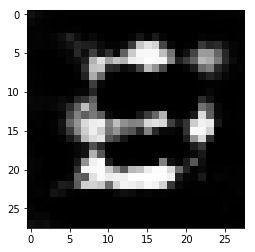

Discriminator Loss: 1.2306... Generator Loss: 0.6962


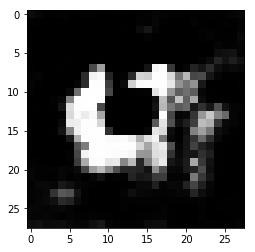

Discriminator Loss: 0.8322... Generator Loss: 1.6438


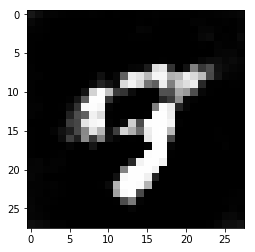

Discriminator Loss: 1.0126... Generator Loss: 0.9870


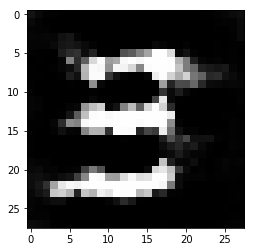

Discriminator Loss: 0.8809... Generator Loss: 2.6771


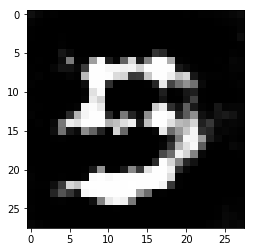

Discriminator Loss: 0.7843... Generator Loss: 1.5418


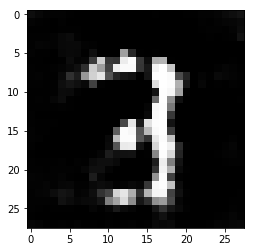

Discriminator Loss: 1.0656... Generator Loss: 0.8850


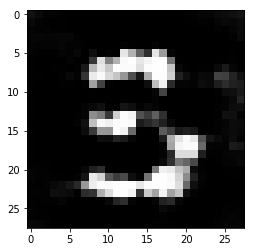

Discriminator Loss: 0.7822... Generator Loss: 2.5848


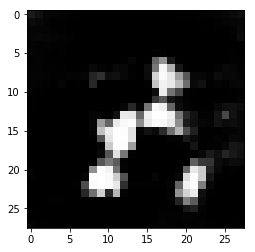

Discriminator Loss: 0.6524... Generator Loss: 1.8272


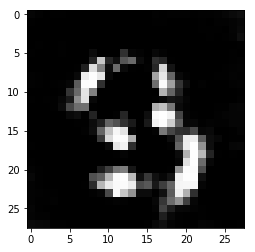

Discriminator Loss: 0.6656... Generator Loss: 1.5282


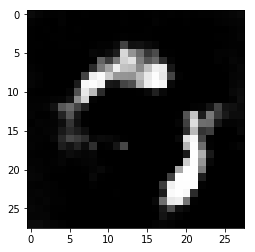

Discriminator Loss: 0.8889... Generator Loss: 1.1375


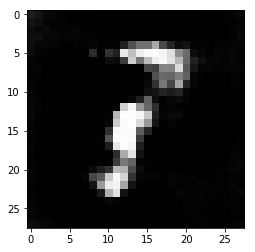

Discriminator Loss: 0.7326... Generator Loss: 1.7358


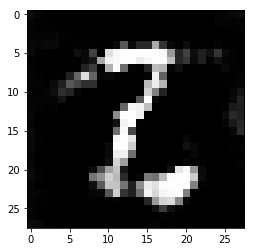

Discriminator Loss: 0.8527... Generator Loss: 1.2224


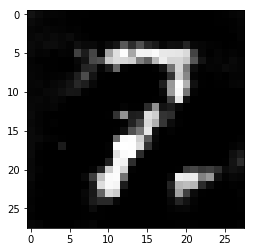

Discriminator Loss: 1.1528... Generator Loss: 0.7582


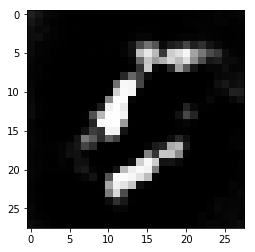

Discriminator Loss: 0.9199... Generator Loss: 2.5527


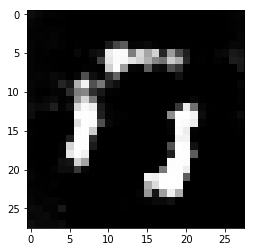

Discriminator Loss: 1.3446... Generator Loss: 0.6863


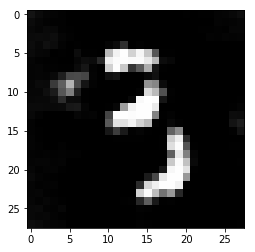

Discriminator Loss: 0.6829... Generator Loss: 3.0519


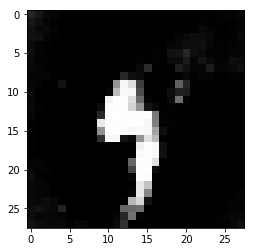

Discriminator Loss: 0.6271... Generator Loss: 2.1751


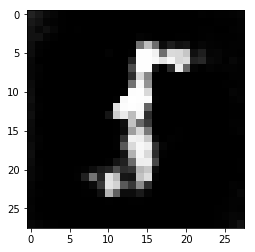

Discriminator Loss: 1.0982... Generator Loss: 0.8355


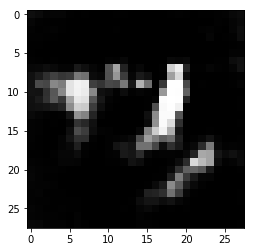

Discriminator Loss: 0.8379... Generator Loss: 1.5565


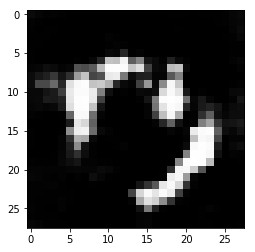

Discriminator Loss: 0.9669... Generator Loss: 1.6248


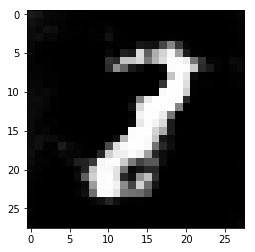

Discriminator Loss: 0.8991... Generator Loss: 1.0004


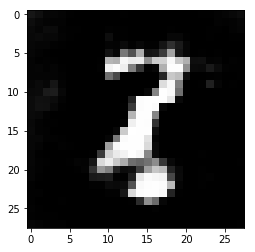

Discriminator Loss: 0.7668... Generator Loss: 1.6060


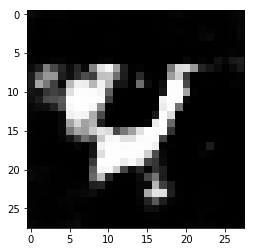

Discriminator Loss: 0.9384... Generator Loss: 1.2851


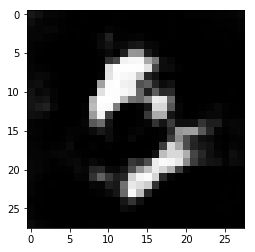

Discriminator Loss: 1.0643... Generator Loss: 1.6904


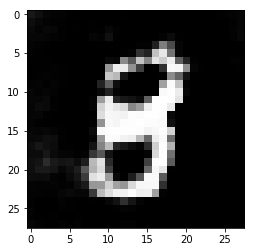

Discriminator Loss: 0.9514... Generator Loss: 0.9999


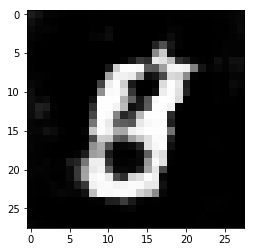

Discriminator Loss: 0.7377... Generator Loss: 3.1693


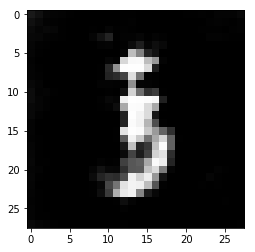

Discriminator Loss: 2.0119... Generator Loss: 0.3340


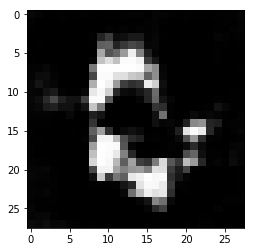

Discriminator Loss: 2.4133... Generator Loss: 7.7238


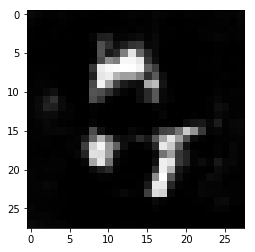

Discriminator Loss: 1.1831... Generator Loss: 1.1885


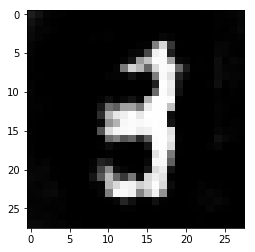

Discriminator Loss: 0.8299... Generator Loss: 1.3081


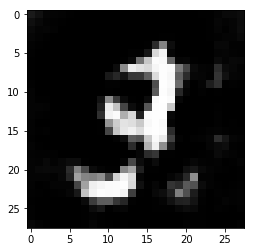

Discriminator Loss: 0.7242... Generator Loss: 2.7462


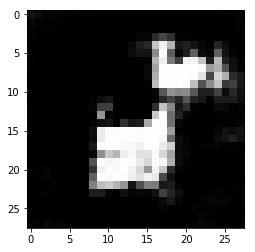

Discriminator Loss: 0.7058... Generator Loss: 1.9333


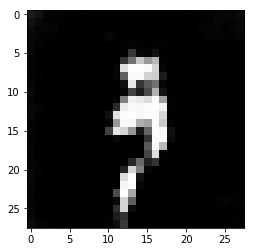

Discriminator Loss: 1.2068... Generator Loss: 0.6714


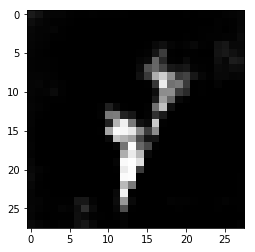

Discriminator Loss: 0.9449... Generator Loss: 1.5831


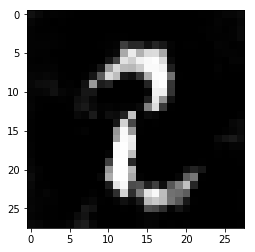

Discriminator Loss: 1.0621... Generator Loss: 1.1588


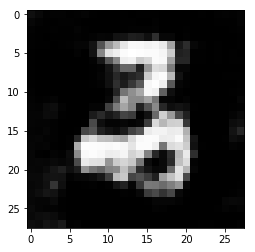

Discriminator Loss: 0.9642... Generator Loss: 1.0320


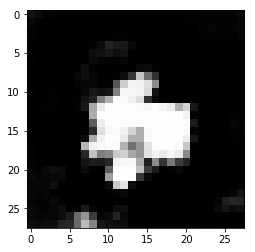

Discriminator Loss: 0.9002... Generator Loss: 2.2524


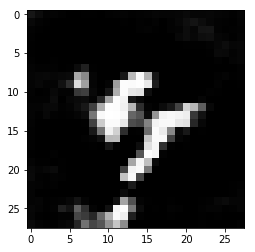

Discriminator Loss: 0.7463... Generator Loss: 1.5132


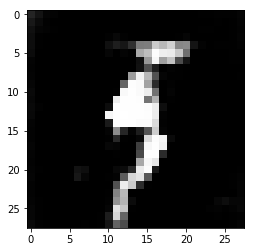

Discriminator Loss: 0.7413... Generator Loss: 1.3084


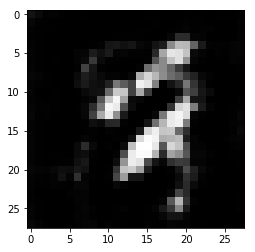

Discriminator Loss: 0.9233... Generator Loss: 1.1702


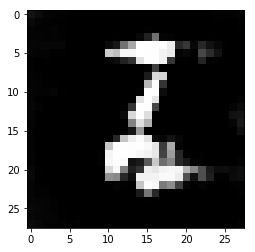

Discriminator Loss: 1.0617... Generator Loss: 0.9928


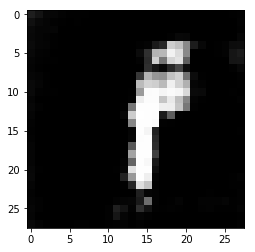

Discriminator Loss: 0.8489... Generator Loss: 1.4845


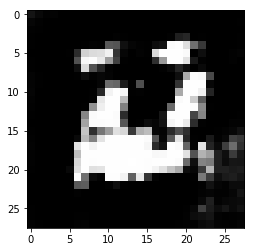

Discriminator Loss: 0.9825... Generator Loss: 0.8780


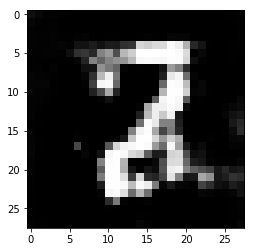

Discriminator Loss: 1.1972... Generator Loss: 1.5879


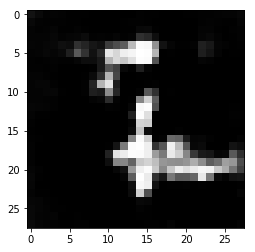

Discriminator Loss: 0.9413... Generator Loss: 1.0629


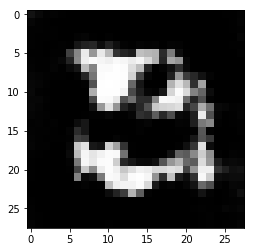

Discriminator Loss: 0.9593... Generator Loss: 1.2288


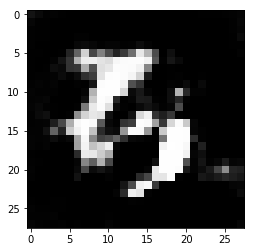

Discriminator Loss: 1.0311... Generator Loss: 1.5405


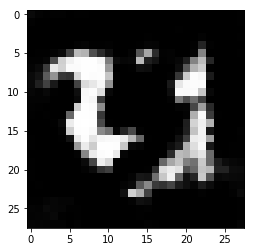

Discriminator Loss: 1.8635... Generator Loss: 0.4450


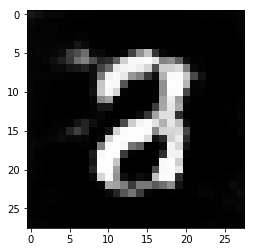

Discriminator Loss: 1.7724... Generator Loss: 5.4485


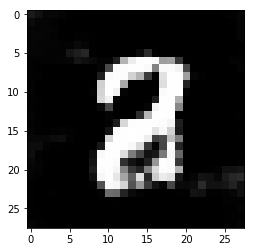

Discriminator Loss: 0.5836... Generator Loss: 2.8447


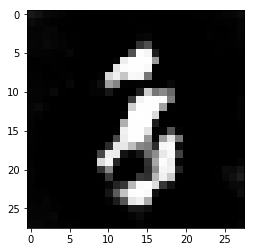

Discriminator Loss: 0.9150... Generator Loss: 1.1124


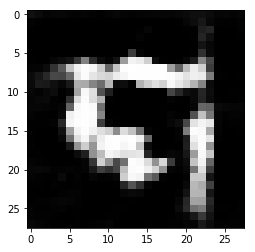

Discriminator Loss: 0.7063... Generator Loss: 1.6388


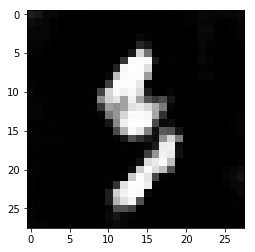

Discriminator Loss: 0.6419... Generator Loss: 2.5705


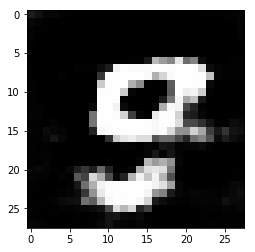

Discriminator Loss: 0.6039... Generator Loss: 2.1546


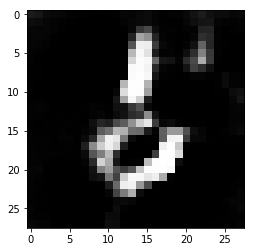

Discriminator Loss: 0.7817... Generator Loss: 1.2278


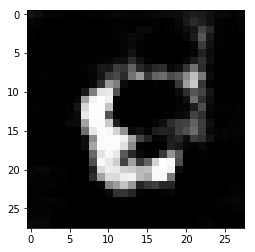

Discriminator Loss: 0.7139... Generator Loss: 1.7513


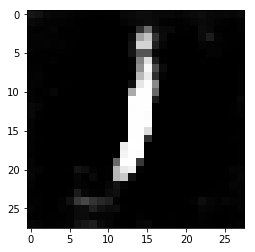

Discriminator Loss: 0.7447... Generator Loss: 1.4411


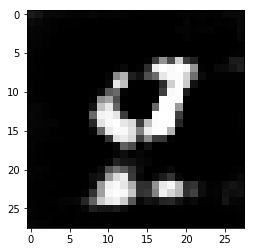

Discriminator Loss: 0.9099... Generator Loss: 1.4174


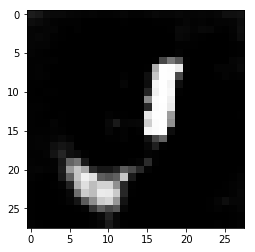

Discriminator Loss: 1.6956... Generator Loss: 0.3771


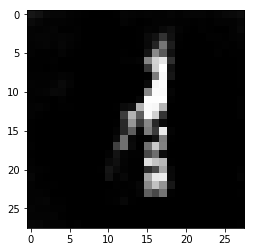

Discriminator Loss: 1.6991... Generator Loss: 4.1975


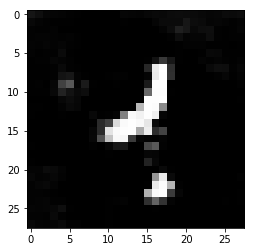

Discriminator Loss: 1.1915... Generator Loss: 0.7724


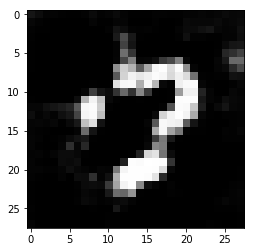

Discriminator Loss: 1.0169... Generator Loss: 0.9529


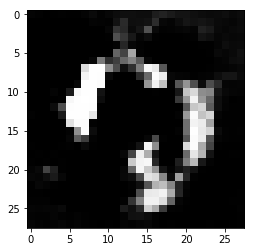

Discriminator Loss: 0.9330... Generator Loss: 1.8830


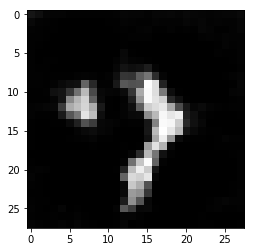

Discriminator Loss: 0.9594... Generator Loss: 1.9524


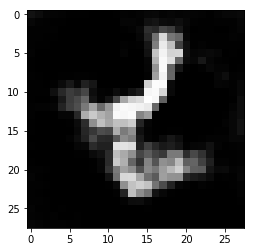

Discriminator Loss: 1.0598... Generator Loss: 1.0486


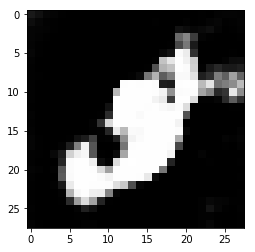

Discriminator Loss: 0.7532... Generator Loss: 2.1397


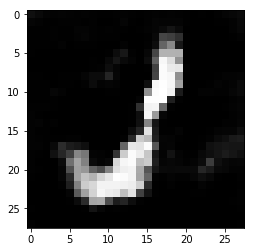

Discriminator Loss: 0.7166... Generator Loss: 1.9112


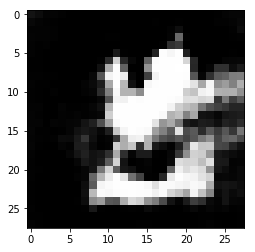

Discriminator Loss: 0.8707... Generator Loss: 1.2840


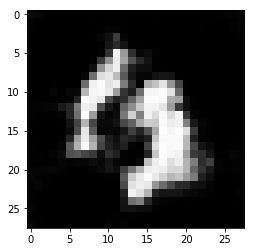

Discriminator Loss: 0.5372... Generator Loss: 2.1977


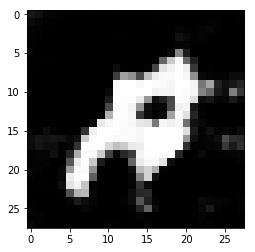

Discriminator Loss: 0.5933... Generator Loss: 1.9907


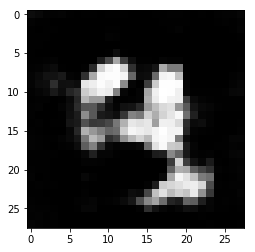

Discriminator Loss: 0.7151... Generator Loss: 1.4574


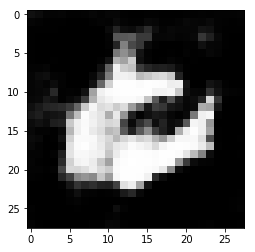

Discriminator Loss: 0.6504... Generator Loss: 2.3924


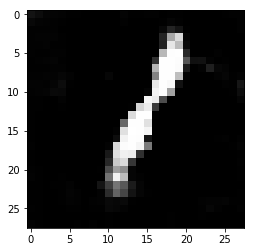

Discriminator Loss: 0.7008... Generator Loss: 1.6380


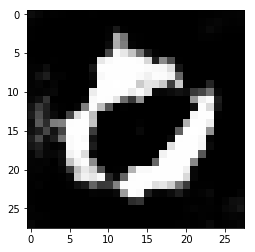

Discriminator Loss: 1.0182... Generator Loss: 0.8001


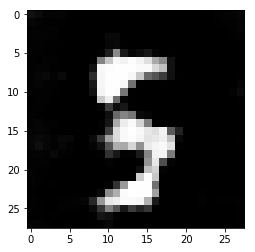

Discriminator Loss: 0.8250... Generator Loss: 2.0732


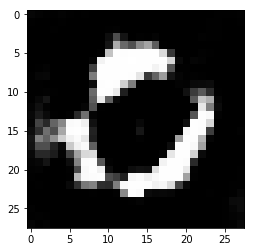

Discriminator Loss: 1.4875... Generator Loss: 0.4840


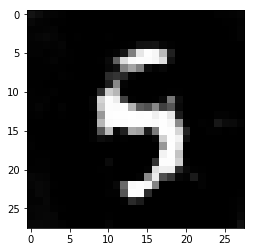

Discriminator Loss: 1.3096... Generator Loss: 2.8189


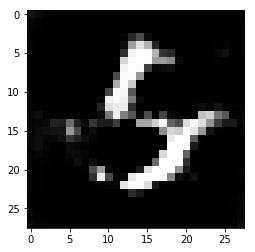

Discriminator Loss: 1.5387... Generator Loss: 0.4859


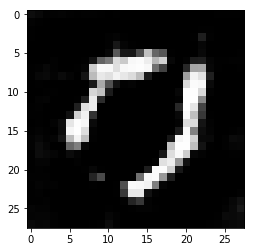

Discriminator Loss: 1.0259... Generator Loss: 2.4578


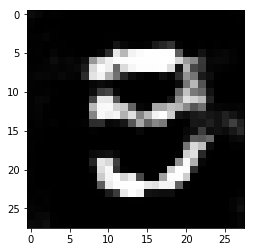

Discriminator Loss: 0.8726... Generator Loss: 1.3235


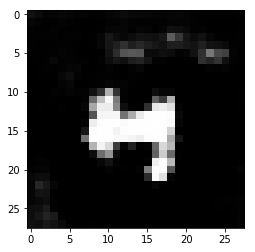

Discriminator Loss: 0.8158... Generator Loss: 1.2119


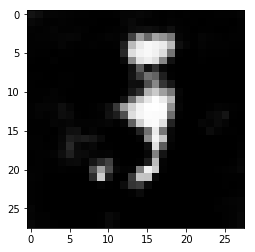

Discriminator Loss: 0.6736... Generator Loss: 1.8818


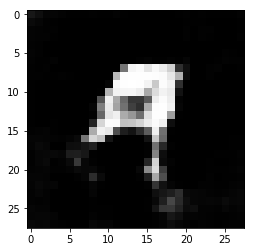

Discriminator Loss: 0.8558... Generator Loss: 1.2050


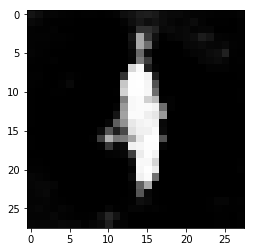

Discriminator Loss: 1.1596... Generator Loss: 0.7371


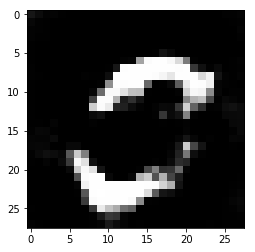

Discriminator Loss: 0.8772... Generator Loss: 2.0748


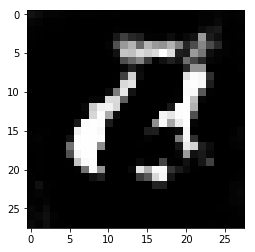

Discriminator Loss: 1.1950... Generator Loss: 0.7396


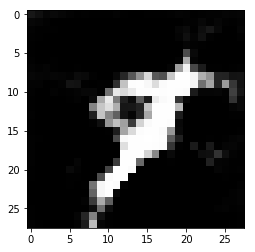

Discriminator Loss: 1.1350... Generator Loss: 2.3273


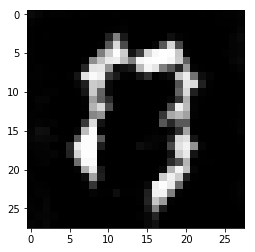

Discriminator Loss: 0.7355... Generator Loss: 1.5860


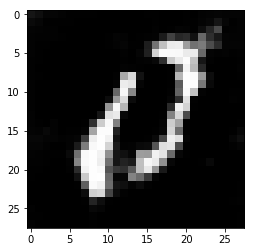

Discriminator Loss: 1.1480... Generator Loss: 0.7656


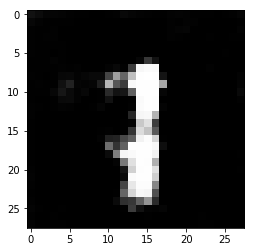

Discriminator Loss: 0.8991... Generator Loss: 2.2620


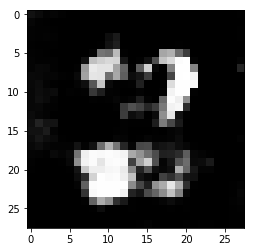

Discriminator Loss: 0.7813... Generator Loss: 1.3301


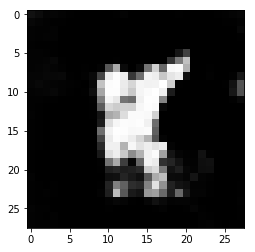

Discriminator Loss: 0.7861... Generator Loss: 1.3953


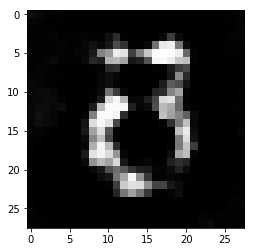

Discriminator Loss: 0.7997... Generator Loss: 1.3029


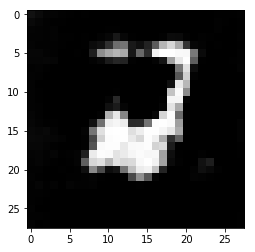

Discriminator Loss: 0.7614... Generator Loss: 1.8148


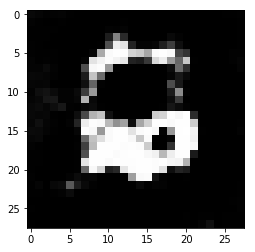

Discriminator Loss: 1.4964... Generator Loss: 0.5172


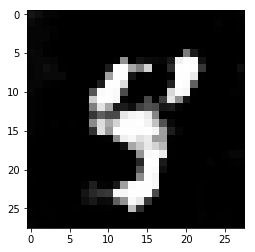

Discriminator Loss: 1.3369... Generator Loss: 3.5872


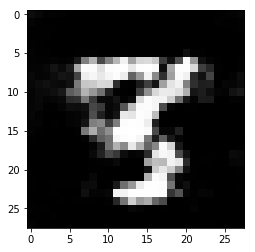

Discriminator Loss: 1.5620... Generator Loss: 0.5512


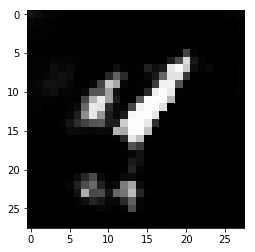

Discriminator Loss: 0.7086... Generator Loss: 1.9325


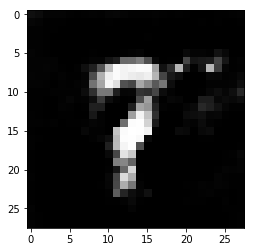

Discriminator Loss: 0.8199... Generator Loss: 1.9940


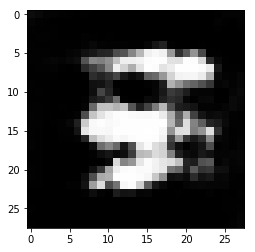

Discriminator Loss: 1.2990... Generator Loss: 0.6819


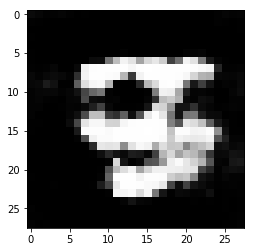

Discriminator Loss: 0.8169... Generator Loss: 1.8019


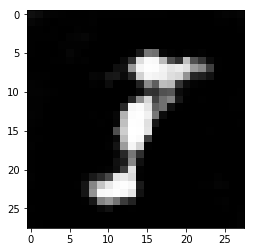

Discriminator Loss: 0.8907... Generator Loss: 1.2477


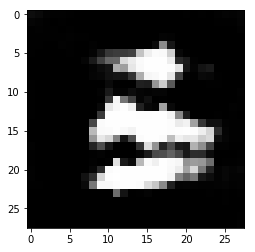

Discriminator Loss: 0.8790... Generator Loss: 1.2592


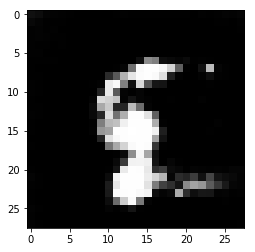

Discriminator Loss: 0.7779... Generator Loss: 1.4618


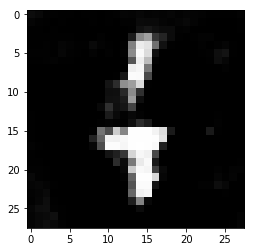

Discriminator Loss: 1.0881... Generator Loss: 0.8594


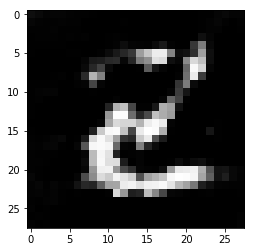

Discriminator Loss: 0.9388... Generator Loss: 1.5156


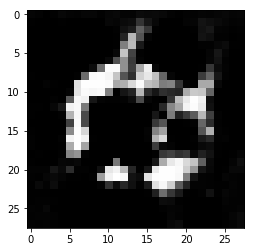

Discriminator Loss: 0.7371... Generator Loss: 1.6281


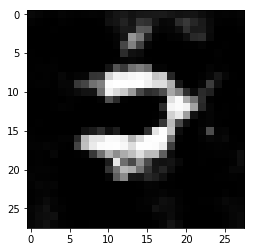

Discriminator Loss: 0.8759... Generator Loss: 1.2756


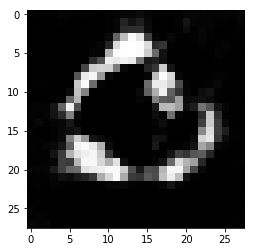

Discriminator Loss: 0.9041... Generator Loss: 1.1705


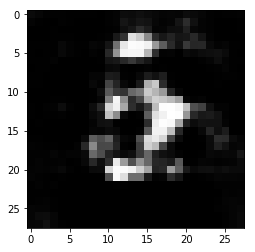

Discriminator Loss: 0.9366... Generator Loss: 1.0962


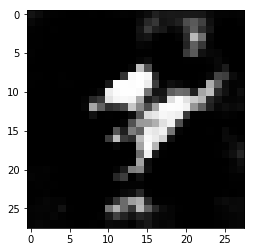

Discriminator Loss: 0.7643... Generator Loss: 1.6572


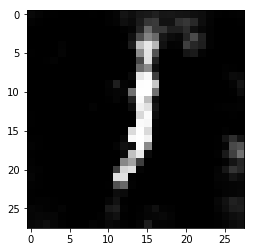

Discriminator Loss: 1.1001... Generator Loss: 0.8673


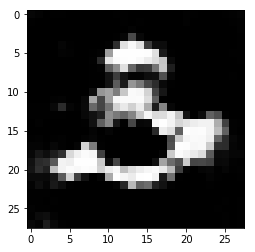

Discriminator Loss: 0.7350... Generator Loss: 2.3462


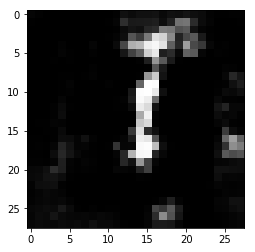

Discriminator Loss: 1.3919... Generator Loss: 0.5482


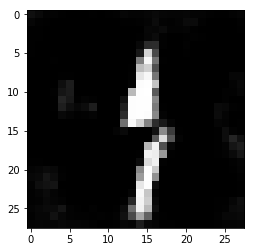

Discriminator Loss: 1.8242... Generator Loss: 5.3849


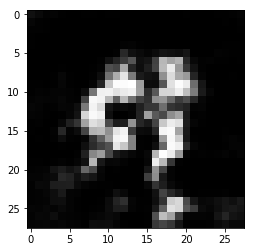

Discriminator Loss: 1.3740... Generator Loss: 0.6455


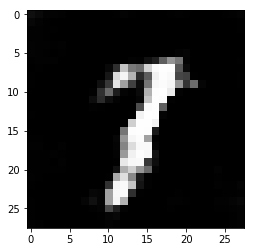

Discriminator Loss: 0.7730... Generator Loss: 1.4134


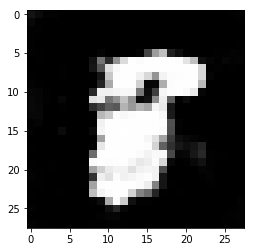

Discriminator Loss: 0.7873... Generator Loss: 2.4614


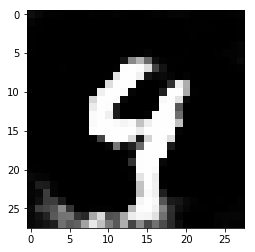

Discriminator Loss: 1.0321... Generator Loss: 0.9957


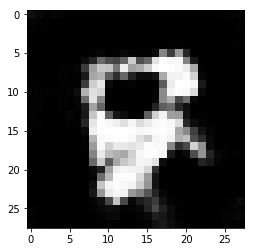

Discriminator Loss: 0.9303... Generator Loss: 1.2914


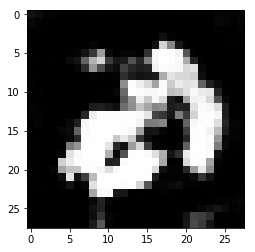

Discriminator Loss: 0.9999... Generator Loss: 1.0166


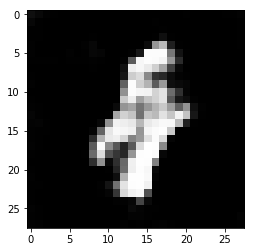

Discriminator Loss: 1.0387... Generator Loss: 1.1647


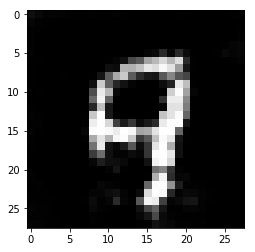

Discriminator Loss: 0.9237... Generator Loss: 2.1406


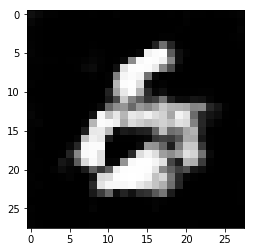

Discriminator Loss: 0.9265... Generator Loss: 1.1188


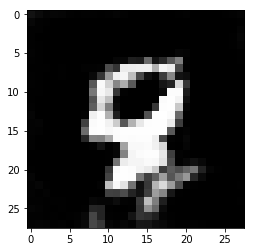

Discriminator Loss: 0.9337... Generator Loss: 1.2732


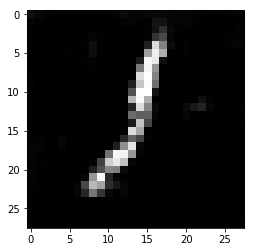

Discriminator Loss: 0.6764... Generator Loss: 1.8635


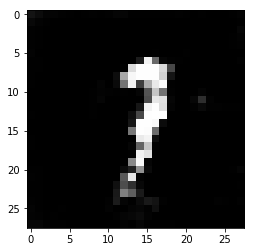

Discriminator Loss: 0.9073... Generator Loss: 1.0131


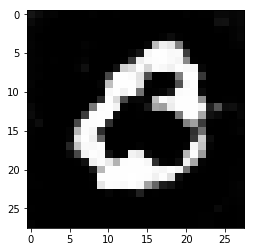

Discriminator Loss: 0.6636... Generator Loss: 1.6874


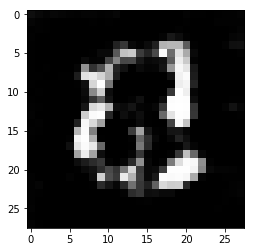

Discriminator Loss: 0.7856... Generator Loss: 1.8668


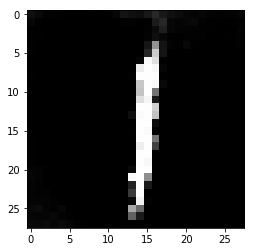

Discriminator Loss: 1.1570... Generator Loss: 0.6872


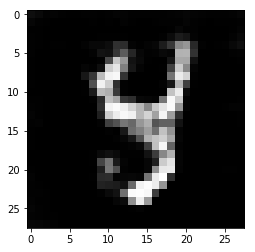

Discriminator Loss: 0.7392... Generator Loss: 1.5243


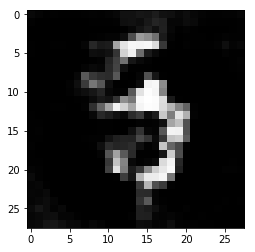

Discriminator Loss: 0.7133... Generator Loss: 1.6492


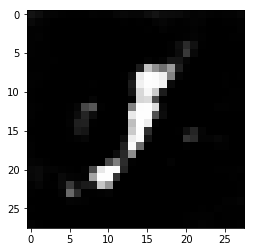

Discriminator Loss: 0.8405... Generator Loss: 1.1463


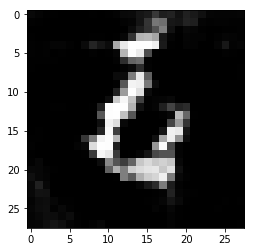

Discriminator Loss: 0.8980... Generator Loss: 1.2674


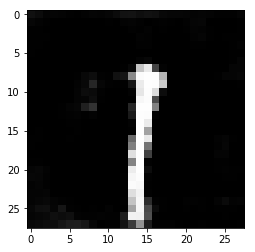

Discriminator Loss: 0.9490... Generator Loss: 1.1686


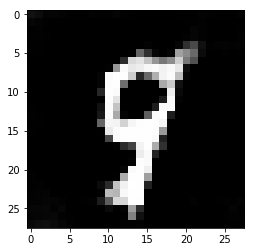

Discriminator Loss: 0.9528... Generator Loss: 0.9626


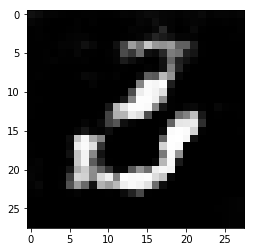

Discriminator Loss: 0.9357... Generator Loss: 1.1121


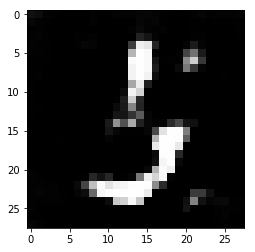

Discriminator Loss: 0.7908... Generator Loss: 1.6193


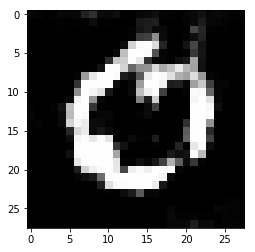

Discriminator Loss: 0.8870... Generator Loss: 1.1535


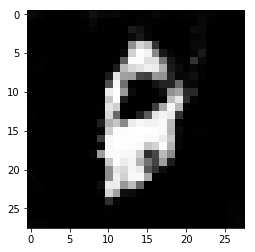

Discriminator Loss: 0.7773... Generator Loss: 2.0336


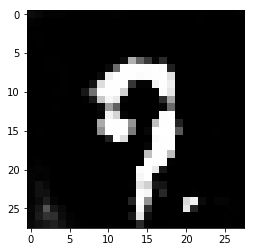

Discriminator Loss: 1.8957... Generator Loss: 0.3268


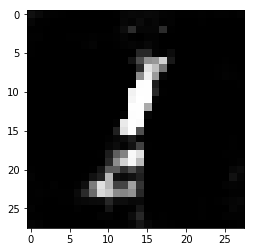

Discriminator Loss: 3.2265... Generator Loss: 6.6426


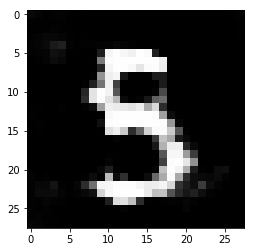

Discriminator Loss: 1.0318... Generator Loss: 1.4071


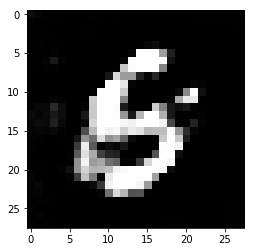

Discriminator Loss: 1.3589... Generator Loss: 0.5577


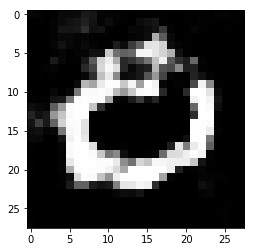

Discriminator Loss: 0.7083... Generator Loss: 2.1427


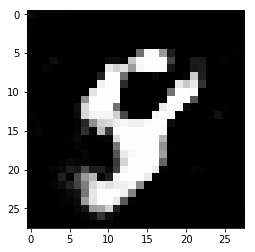

Discriminator Loss: 0.7013... Generator Loss: 2.0390


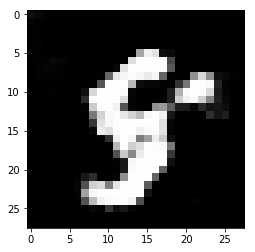

Discriminator Loss: 1.0235... Generator Loss: 0.8517


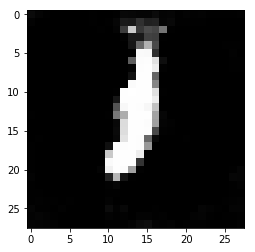

Discriminator Loss: 0.8463... Generator Loss: 1.2490


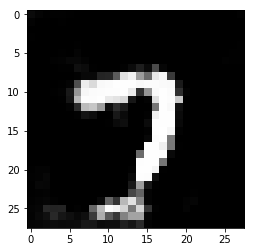

Discriminator Loss: 0.6899... Generator Loss: 1.7932


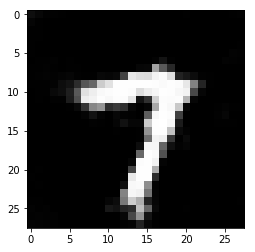

Discriminator Loss: 0.7635... Generator Loss: 1.2850


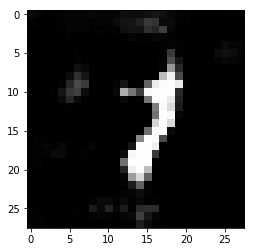

Discriminator Loss: 0.8453... Generator Loss: 1.1411


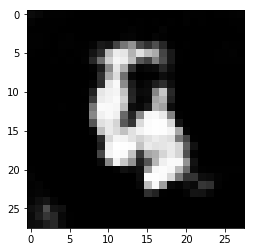

Discriminator Loss: 0.9678... Generator Loss: 0.9655


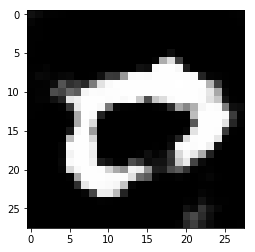

Discriminator Loss: 0.8274... Generator Loss: 1.6009


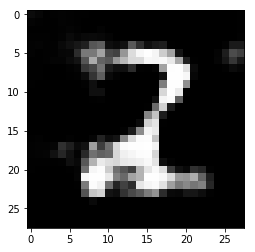

Discriminator Loss: 0.9321... Generator Loss: 1.2086


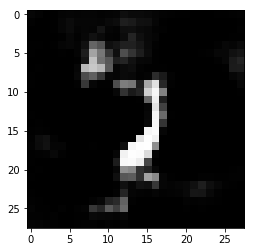

Discriminator Loss: 1.0974... Generator Loss: 0.7568


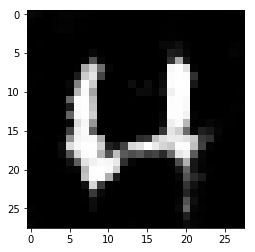

Discriminator Loss: 0.9983... Generator Loss: 1.4561


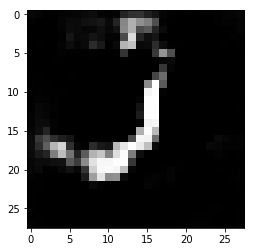

Discriminator Loss: 1.2413... Generator Loss: 0.7417


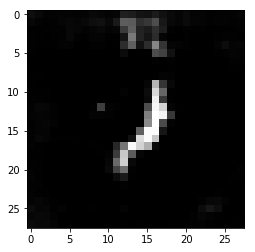

Discriminator Loss: 0.9628... Generator Loss: 1.3082


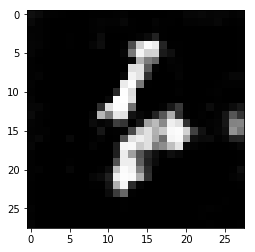

Discriminator Loss: 1.3319... Generator Loss: 0.5737


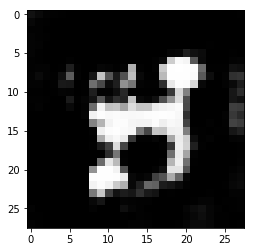

Discriminator Loss: 0.7207... Generator Loss: 2.3371


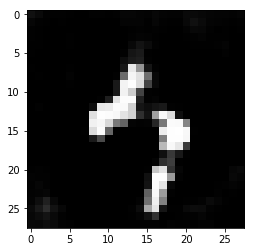

Discriminator Loss: 0.8070... Generator Loss: 1.4950


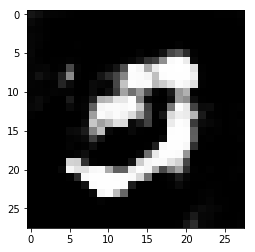

Discriminator Loss: 0.9509... Generator Loss: 1.0902


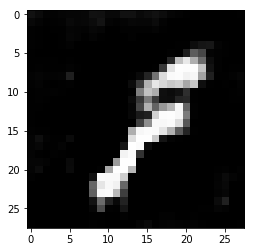

Discriminator Loss: 1.1645... Generator Loss: 3.2429


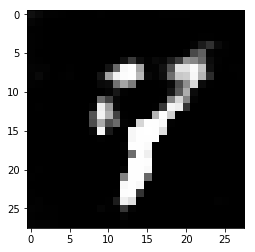

Discriminator Loss: 0.8309... Generator Loss: 1.5487


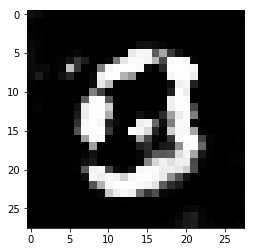

Discriminator Loss: 0.9046... Generator Loss: 1.2115


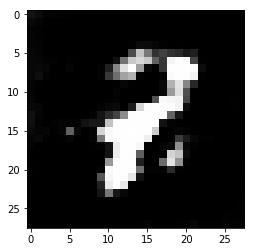

Discriminator Loss: 0.6841... Generator Loss: 2.2673


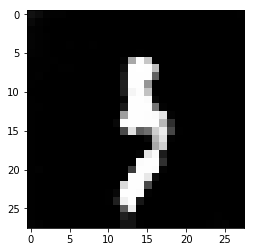

Discriminator Loss: 0.8323... Generator Loss: 1.3078


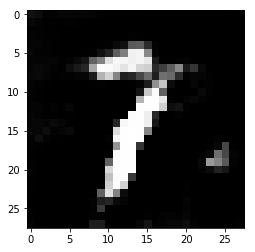

Discriminator Loss: 0.6812... Generator Loss: 1.6076


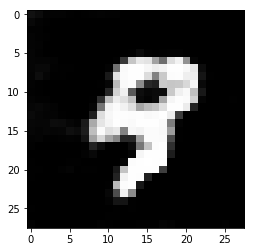

Discriminator Loss: 0.8175... Generator Loss: 1.6577


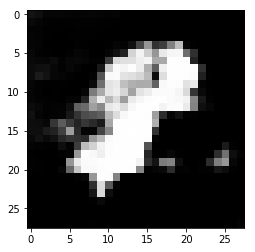

Discriminator Loss: 0.6715... Generator Loss: 1.5672


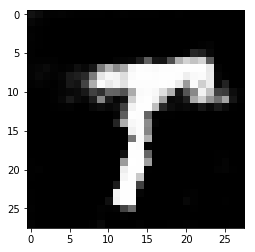

Discriminator Loss: 0.9803... Generator Loss: 0.9457


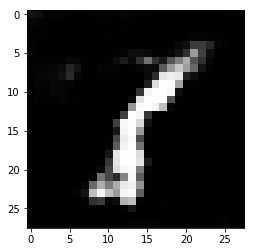

Discriminator Loss: 0.6570... Generator Loss: 1.9935


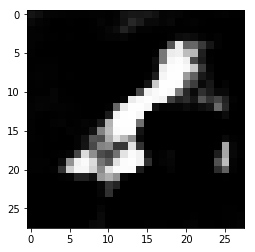

Discriminator Loss: 1.0231... Generator Loss: 0.9841


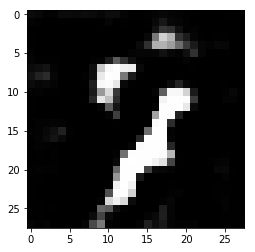

Discriminator Loss: 0.7576... Generator Loss: 1.2486


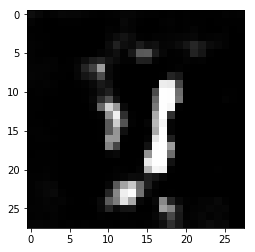

Discriminator Loss: 0.7059... Generator Loss: 1.5610


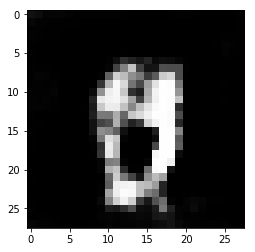

Discriminator Loss: 0.6811... Generator Loss: 1.8356


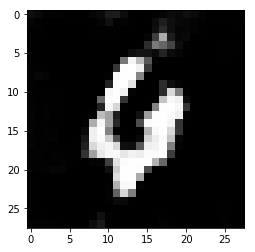

Discriminator Loss: 0.8917... Generator Loss: 1.0675


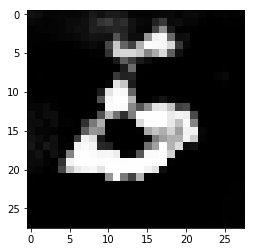

Discriminator Loss: 0.6783... Generator Loss: 1.7522


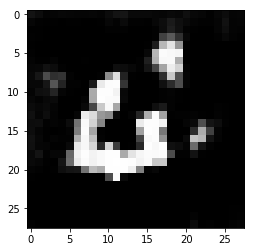

Discriminator Loss: 0.8238... Generator Loss: 1.2262


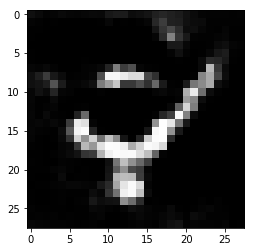

Discriminator Loss: 0.8422... Generator Loss: 1.3332


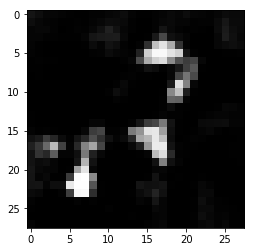

Discriminator Loss: 1.0611... Generator Loss: 0.7946


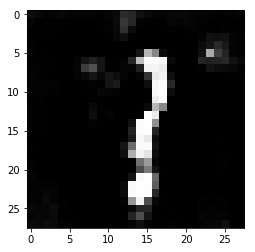

Discriminator Loss: 0.8633... Generator Loss: 3.4231


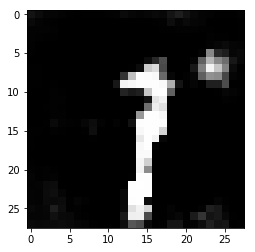

Discriminator Loss: 1.4196... Generator Loss: 0.5615


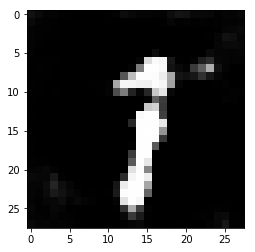

Discriminator Loss: 0.6400... Generator Loss: 2.2309


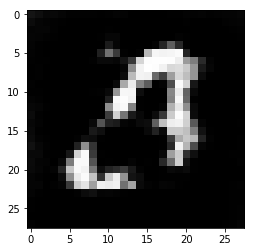

Discriminator Loss: 0.8374... Generator Loss: 1.8002


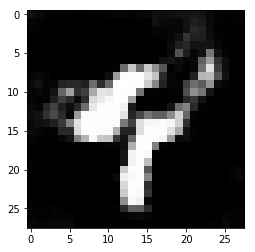

Discriminator Loss: 1.2663... Generator Loss: 0.6529


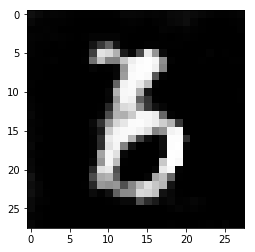

Discriminator Loss: 1.0283... Generator Loss: 1.2291


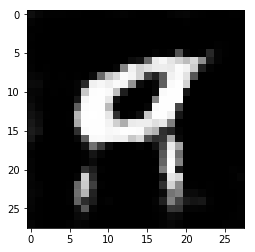

Discriminator Loss: 0.9035... Generator Loss: 1.3760


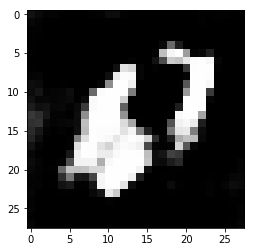

Discriminator Loss: 1.1172... Generator Loss: 0.8840


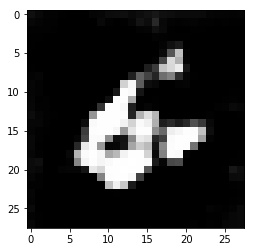

Discriminator Loss: 0.8117... Generator Loss: 1.4337


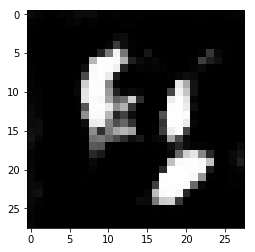

Discriminator Loss: 0.8645... Generator Loss: 1.6810


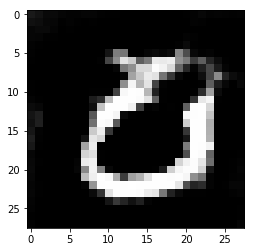

Discriminator Loss: 1.4243... Generator Loss: 0.5123


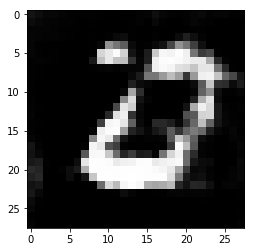

Discriminator Loss: 2.2981... Generator Loss: 5.1414


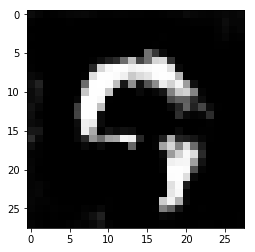

Discriminator Loss: 1.1936... Generator Loss: 0.7518


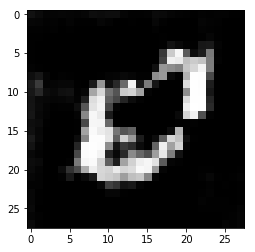

Discriminator Loss: 0.6948... Generator Loss: 1.6294


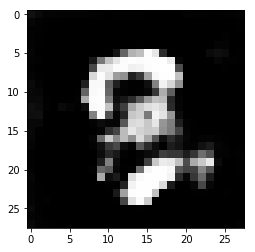

Discriminator Loss: 0.6556... Generator Loss: 2.1031


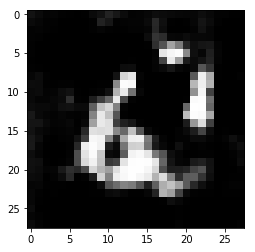

Discriminator Loss: 0.9429... Generator Loss: 1.0555


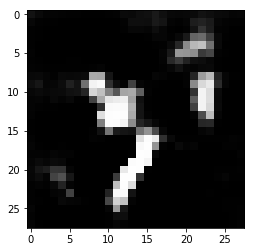

Discriminator Loss: 0.8161... Generator Loss: 1.5540


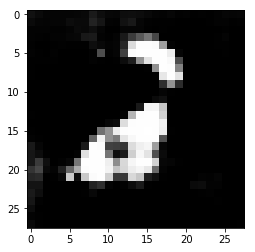

Discriminator Loss: 0.6981... Generator Loss: 1.4797


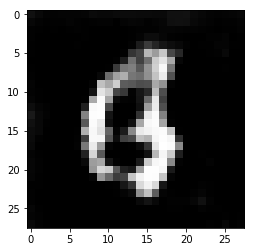

Discriminator Loss: 0.8084... Generator Loss: 1.1624


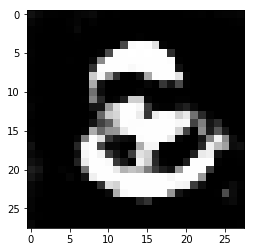

Discriminator Loss: 0.7375... Generator Loss: 1.6283


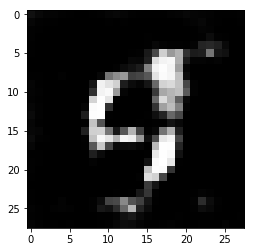

Discriminator Loss: 0.7663... Generator Loss: 1.3745


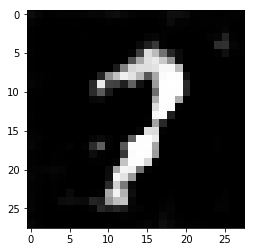

Discriminator Loss: 1.2269... Generator Loss: 0.6478


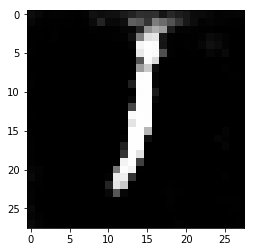

Discriminator Loss: 0.6919... Generator Loss: 1.6184


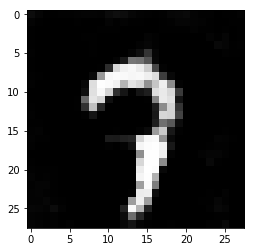

Discriminator Loss: 0.9726... Generator Loss: 0.9660


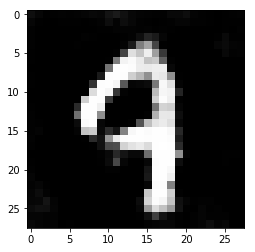

Discriminator Loss: 1.0802... Generator Loss: 0.9037


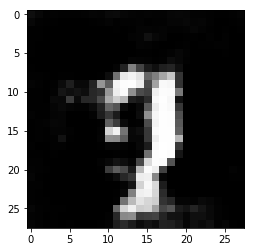

Discriminator Loss: 0.9276... Generator Loss: 1.5442


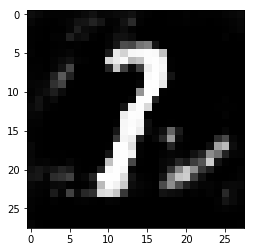

Discriminator Loss: 1.2004... Generator Loss: 0.6376


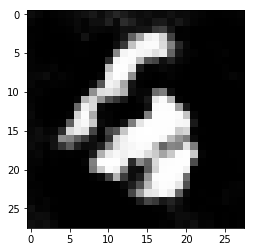

Discriminator Loss: 0.6268... Generator Loss: 1.8033


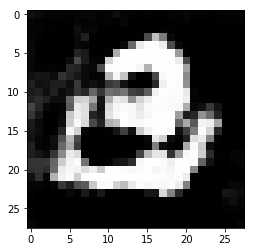

Discriminator Loss: 0.7319... Generator Loss: 1.7404


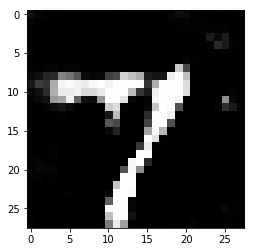

Discriminator Loss: 0.8469... Generator Loss: 1.1763


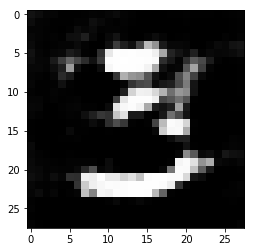

Discriminator Loss: 1.1453... Generator Loss: 0.7469


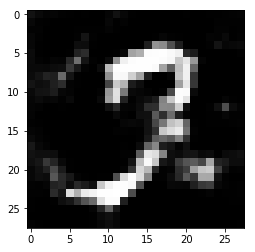

Discriminator Loss: 0.7044... Generator Loss: 1.9002


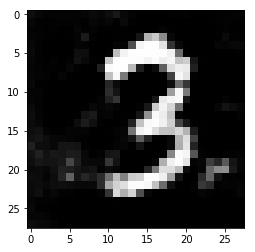

Discriminator Loss: 0.7717... Generator Loss: 1.5513


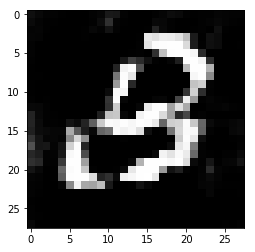

Discriminator Loss: 0.8913... Generator Loss: 1.1022


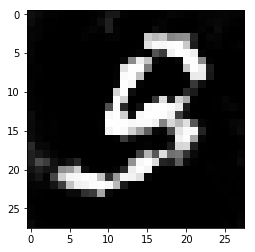

Discriminator Loss: 0.8811... Generator Loss: 2.2364


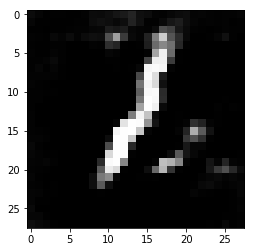

Discriminator Loss: 1.0495... Generator Loss: 0.9572


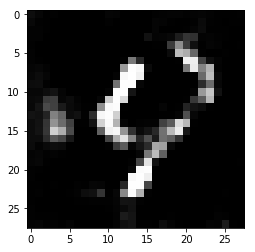

Discriminator Loss: 0.8653... Generator Loss: 1.2104


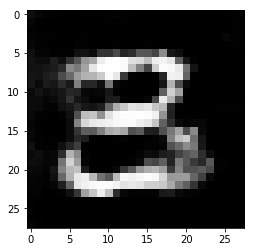

Discriminator Loss: 0.7513... Generator Loss: 2.3886


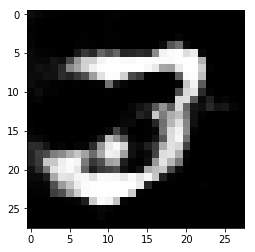

Discriminator Loss: 0.8728... Generator Loss: 1.2269


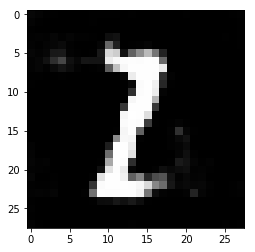

Discriminator Loss: 0.9593... Generator Loss: 0.9269


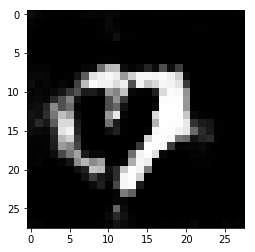

Discriminator Loss: 0.9070... Generator Loss: 3.2867


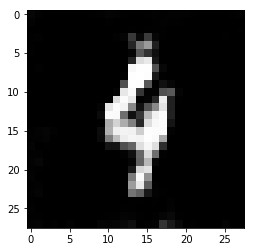

Discriminator Loss: 1.1426... Generator Loss: 0.7107


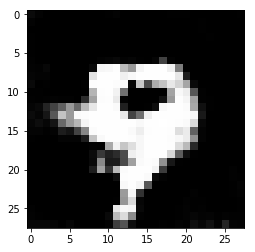

Discriminator Loss: 0.8025... Generator Loss: 1.7723


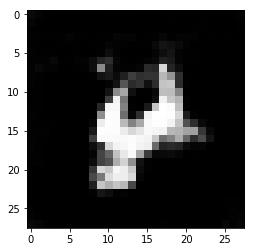

Discriminator Loss: 0.8065... Generator Loss: 1.2706


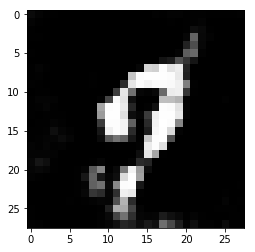

Discriminator Loss: 0.7222... Generator Loss: 1.4022


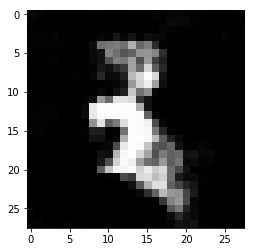

Discriminator Loss: 0.7430... Generator Loss: 1.4836


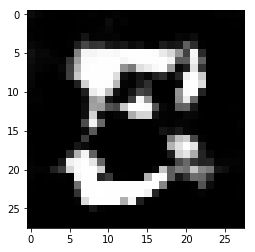

Discriminator Loss: 0.9897... Generator Loss: 0.8993


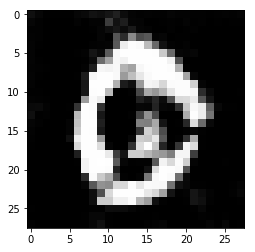

Discriminator Loss: 0.9165... Generator Loss: 1.1346


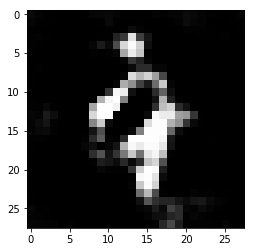

Discriminator Loss: 1.0049... Generator Loss: 0.8954


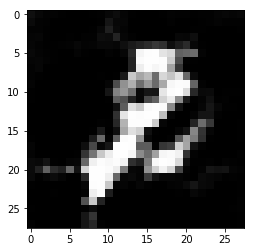

Discriminator Loss: 0.7063... Generator Loss: 1.8694


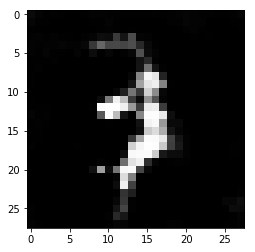

Discriminator Loss: 0.8627... Generator Loss: 1.1385


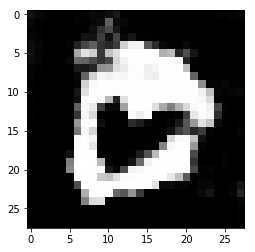

Discriminator Loss: 0.8768... Generator Loss: 1.5127


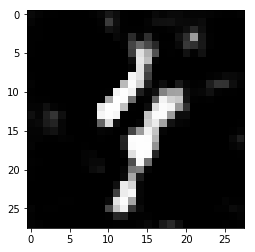

Discriminator Loss: 1.0268... Generator Loss: 0.8687


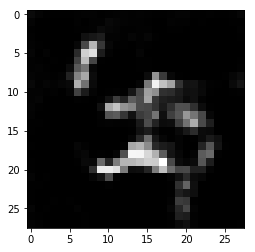

Discriminator Loss: 0.7792... Generator Loss: 1.4853


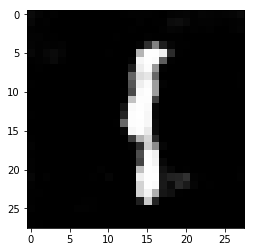

Discriminator Loss: 1.0014... Generator Loss: 1.2497


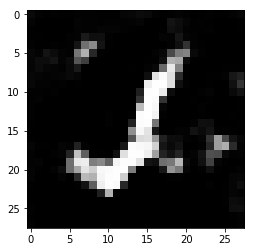

Discriminator Loss: 1.6233... Generator Loss: 0.4462


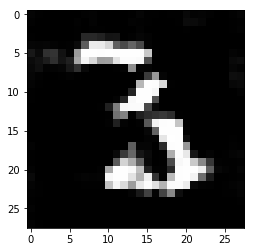

Discriminator Loss: 1.1983... Generator Loss: 3.5421


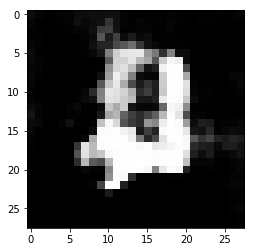

Discriminator Loss: 1.0605... Generator Loss: 0.9549


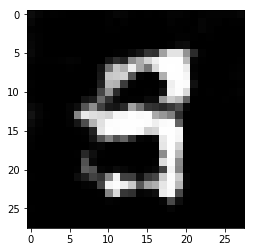

Discriminator Loss: 0.9486... Generator Loss: 1.3292


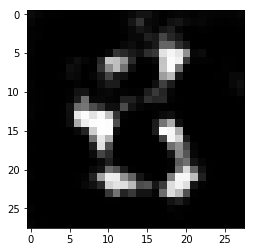

Discriminator Loss: 0.8302... Generator Loss: 1.5862


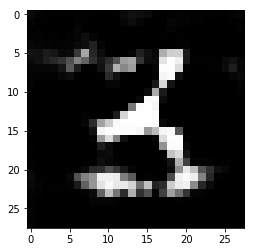

Discriminator Loss: 0.9651... Generator Loss: 0.9626


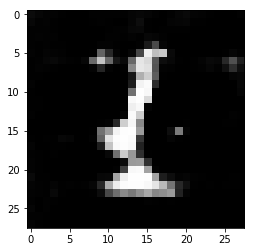

Discriminator Loss: 0.7215... Generator Loss: 1.6395


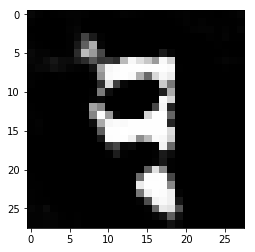

Discriminator Loss: 1.0799... Generator Loss: 0.8631


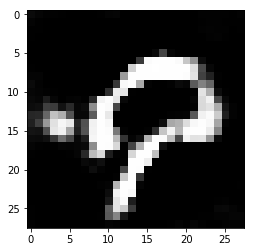

Discriminator Loss: 0.9024... Generator Loss: 1.5022


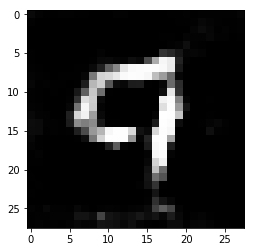

Discriminator Loss: 0.7626... Generator Loss: 1.7327


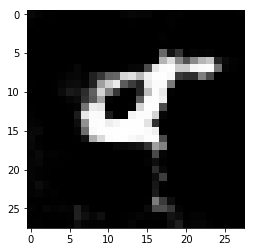

Discriminator Loss: 0.8570... Generator Loss: 1.1593


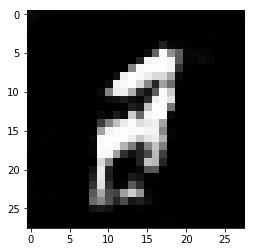

Discriminator Loss: 0.7367... Generator Loss: 1.4430


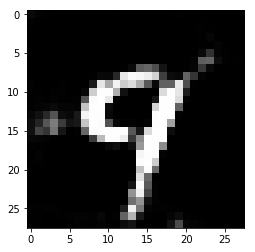

Discriminator Loss: 0.6525... Generator Loss: 1.9359


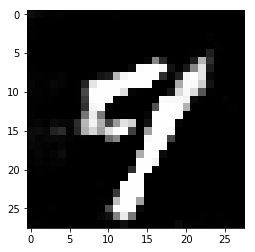

Discriminator Loss: 0.7333... Generator Loss: 1.4547


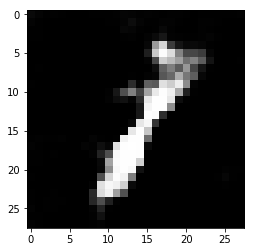

Discriminator Loss: 0.9299... Generator Loss: 1.0046


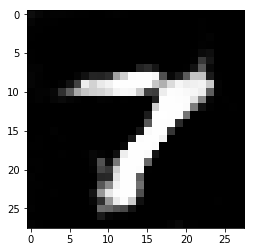

Discriminator Loss: 0.7053... Generator Loss: 1.5764


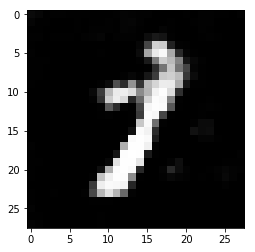

Discriminator Loss: 1.0431... Generator Loss: 0.8606


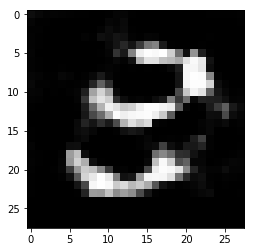

Discriminator Loss: 0.8750... Generator Loss: 2.1917


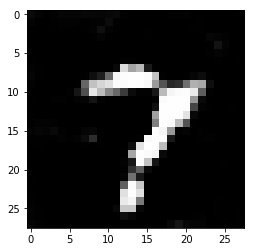

Discriminator Loss: 1.2967... Generator Loss: 0.6404


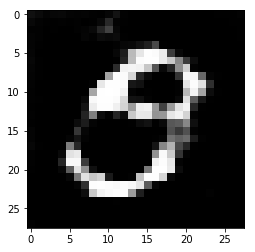

Discriminator Loss: 0.8164... Generator Loss: 2.7580


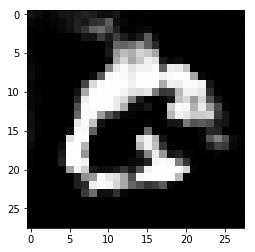

Discriminator Loss: 0.9396... Generator Loss: 1.1774


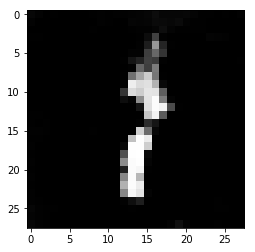

Discriminator Loss: 0.7801... Generator Loss: 1.3293


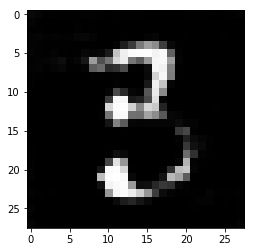

Discriminator Loss: 0.7911... Generator Loss: 1.3988


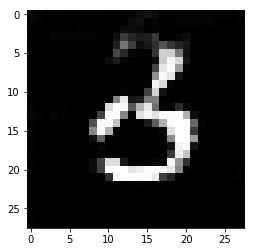

Discriminator Loss: 0.6897... Generator Loss: 1.7137


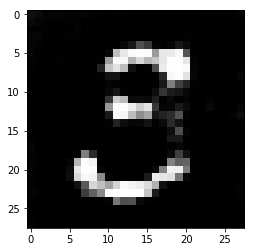

Discriminator Loss: 0.8130... Generator Loss: 1.2627


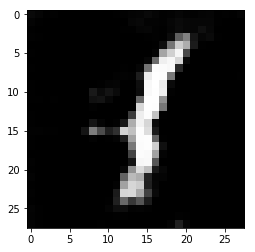

Discriminator Loss: 0.8362... Generator Loss: 1.2117


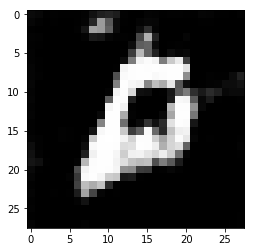

Discriminator Loss: 0.8698... Generator Loss: 1.3383


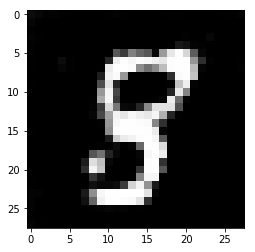

Discriminator Loss: 0.8982... Generator Loss: 1.1833


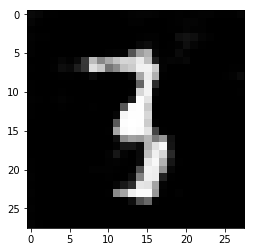

Discriminator Loss: 0.7718... Generator Loss: 1.3526


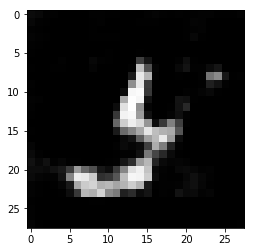

Discriminator Loss: 1.0118... Generator Loss: 0.9024


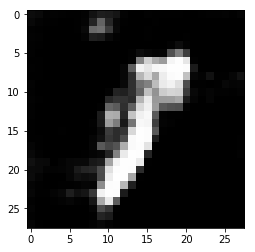

Discriminator Loss: 0.8318... Generator Loss: 1.9060


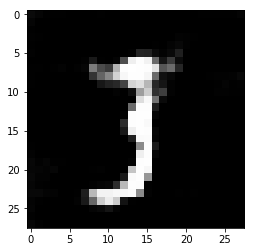

Discriminator Loss: 0.9554... Generator Loss: 0.9505


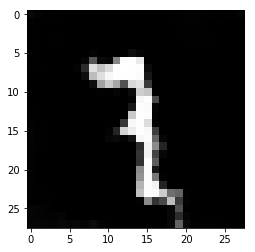

Discriminator Loss: 1.2565... Generator Loss: 1.8959


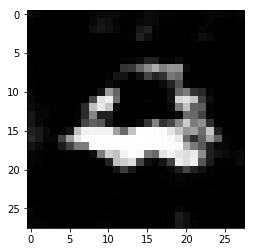

Discriminator Loss: 0.9275... Generator Loss: 1.2213


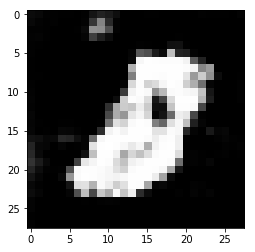

Discriminator Loss: 1.0329... Generator Loss: 1.0796


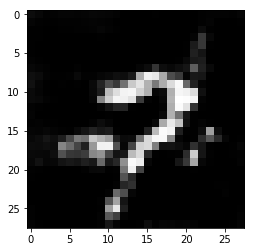

Discriminator Loss: 0.7278... Generator Loss: 1.8769


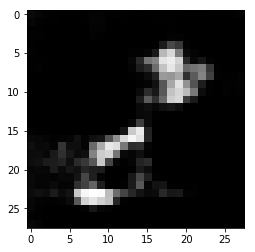

Discriminator Loss: 0.7809... Generator Loss: 1.6720


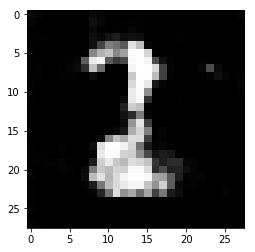

Discriminator Loss: 1.3821... Generator Loss: 0.7095


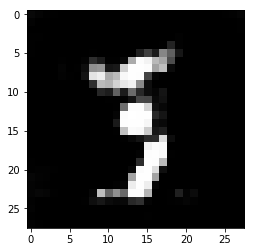

Discriminator Loss: 0.8205... Generator Loss: 1.7084


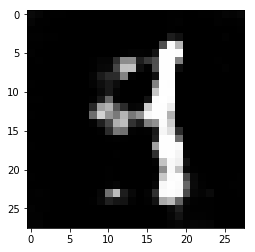

Discriminator Loss: 1.0107... Generator Loss: 1.0749


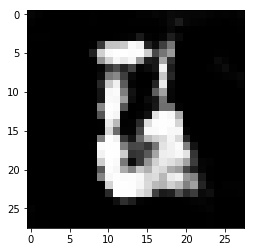

Discriminator Loss: 1.0458... Generator Loss: 0.8465


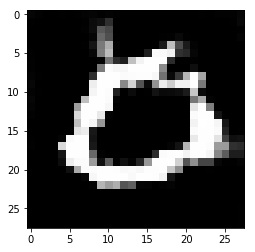

Discriminator Loss: 0.8859... Generator Loss: 2.0087


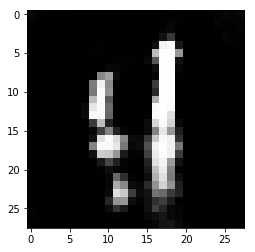

Discriminator Loss: 1.6508... Generator Loss: 0.4191


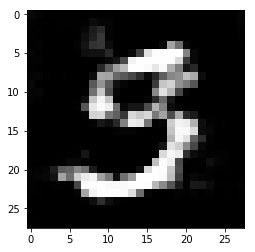

Discriminator Loss: 0.8156... Generator Loss: 2.7267


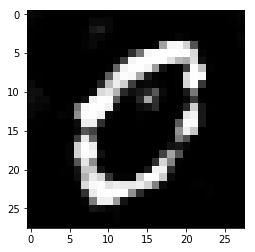

Discriminator Loss: 1.0982... Generator Loss: 0.8707


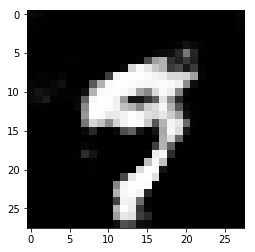

Discriminator Loss: 0.7208... Generator Loss: 1.5748


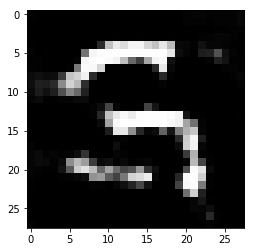

Discriminator Loss: 1.3676... Generator Loss: 0.5273


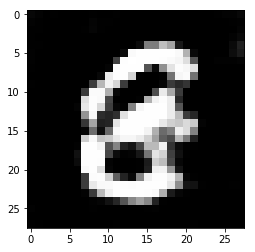

Discriminator Loss: 0.9185... Generator Loss: 1.6095


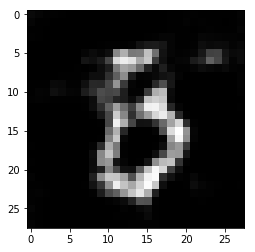

Discriminator Loss: 0.8239... Generator Loss: 1.3190


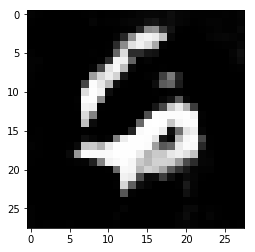

Discriminator Loss: 1.3211... Generator Loss: 0.5839


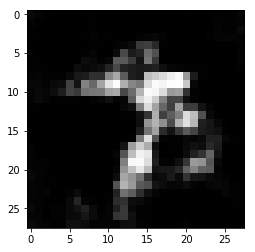

Discriminator Loss: 1.4392... Generator Loss: 3.2936


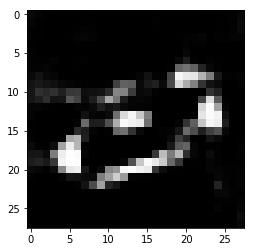

Discriminator Loss: 1.5582... Generator Loss: 0.5194


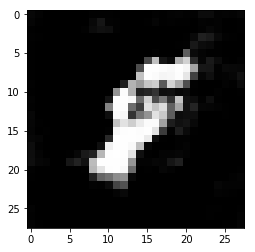

Discriminator Loss: 0.7253... Generator Loss: 2.4764


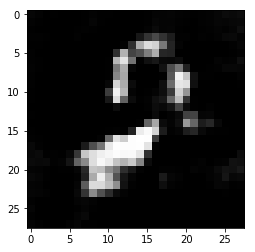

Discriminator Loss: 0.8420... Generator Loss: 1.1600


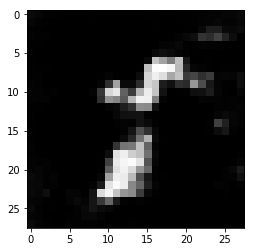

Discriminator Loss: 1.3235... Generator Loss: 0.6112


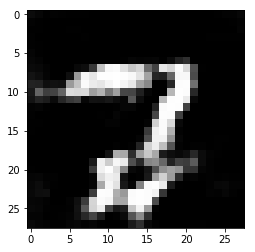

Discriminator Loss: 0.7922... Generator Loss: 1.8399


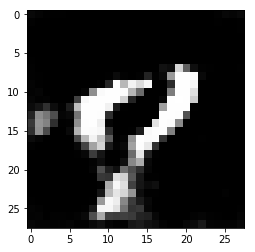

Discriminator Loss: 0.6182... Generator Loss: 1.7798


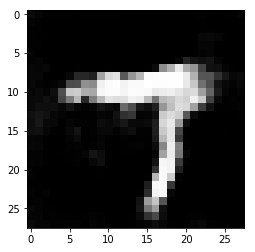

Discriminator Loss: 0.9375... Generator Loss: 1.2317


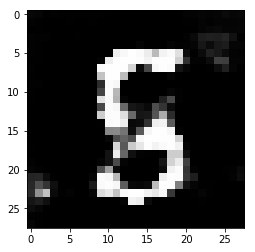

Discriminator Loss: 0.7984... Generator Loss: 1.1951


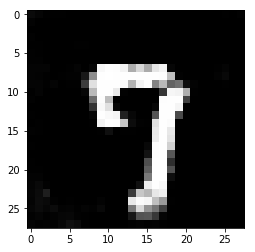

Discriminator Loss: 1.2552... Generator Loss: 0.6044


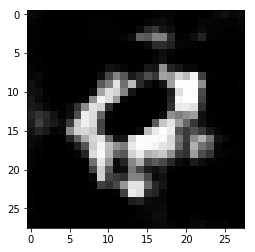

Discriminator Loss: 0.9752... Generator Loss: 2.0376


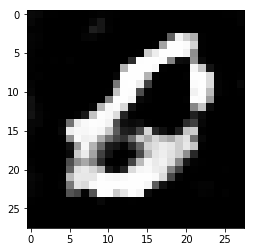

Discriminator Loss: 1.2404... Generator Loss: 0.6410


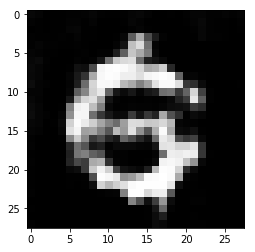

Discriminator Loss: 0.8398... Generator Loss: 1.1688


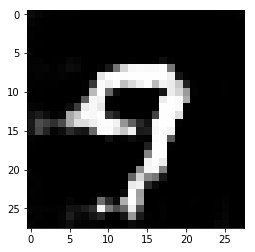

Discriminator Loss: 0.8735... Generator Loss: 1.7771


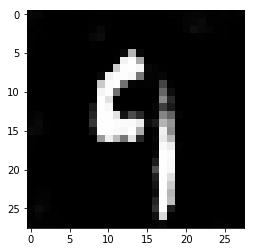

Discriminator Loss: 1.1659... Generator Loss: 0.6969


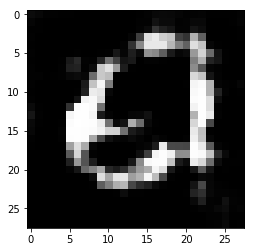

Discriminator Loss: 0.8448... Generator Loss: 1.2326


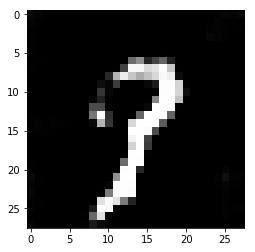

Discriminator Loss: 0.9677... Generator Loss: 1.0765


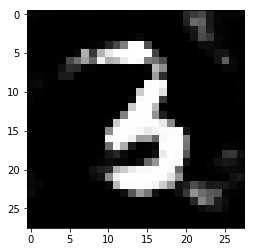

Discriminator Loss: 0.6918... Generator Loss: 2.0924


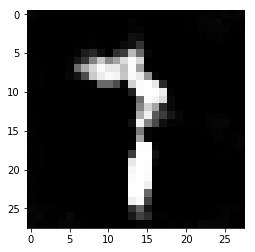

Discriminator Loss: 0.9216... Generator Loss: 1.0759


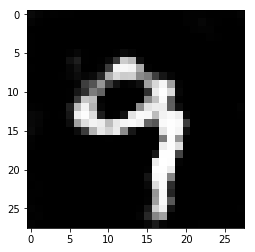

Discriminator Loss: 0.8849... Generator Loss: 2.0987


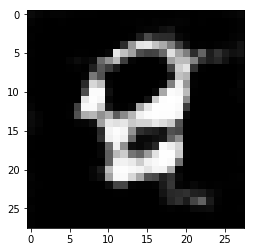

Discriminator Loss: 1.3741... Generator Loss: 0.6741


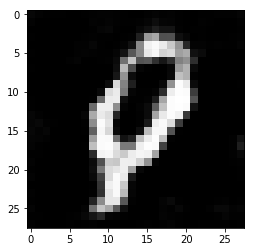

Discriminator Loss: 0.9502... Generator Loss: 2.7561


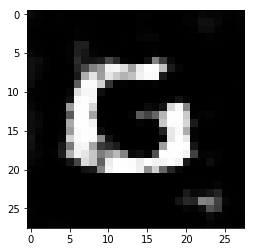

Discriminator Loss: 1.2928... Generator Loss: 0.7485


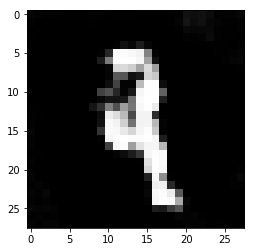

Discriminator Loss: 1.0952... Generator Loss: 2.2389


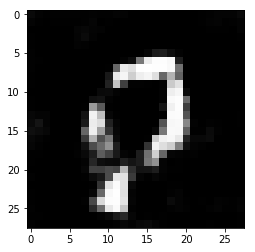

Discriminator Loss: 0.9871... Generator Loss: 1.5326


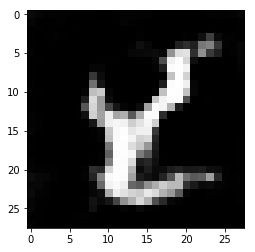

Discriminator Loss: 1.0764... Generator Loss: 0.9571


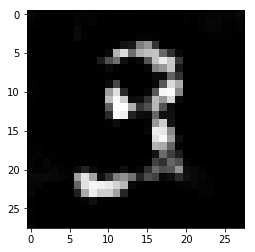

Discriminator Loss: 0.8732... Generator Loss: 1.6669


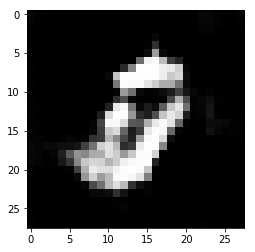

Discriminator Loss: 0.7379... Generator Loss: 1.4468


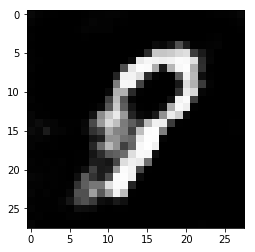

Discriminator Loss: 1.1467... Generator Loss: 0.7323


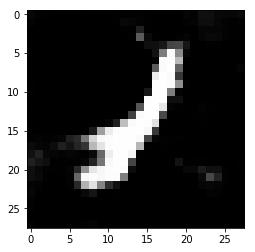

Discriminator Loss: 0.7973... Generator Loss: 2.4064


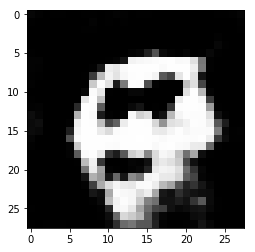

Discriminator Loss: 0.7208... Generator Loss: 1.4287


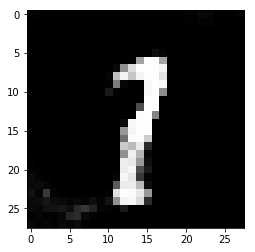

Discriminator Loss: 0.6729... Generator Loss: 1.4593


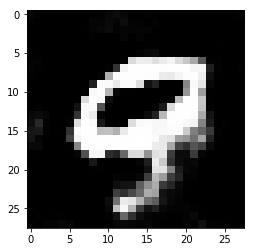

Discriminator Loss: 0.8726... Generator Loss: 1.1008


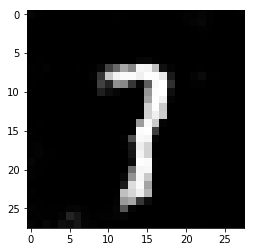

Discriminator Loss: 0.9045... Generator Loss: 1.3501


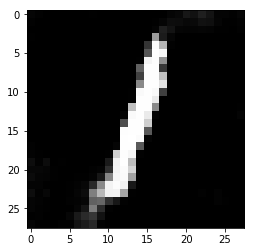

Discriminator Loss: 0.8224... Generator Loss: 1.2202


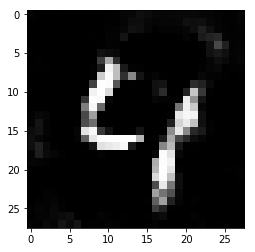

Discriminator Loss: 0.9527... Generator Loss: 0.9339


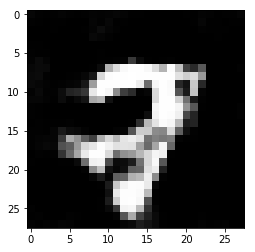

Discriminator Loss: 0.9029... Generator Loss: 1.2632


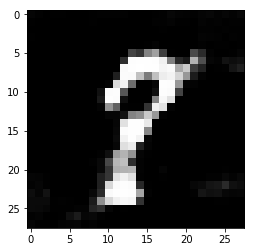

Discriminator Loss: 1.2372... Generator Loss: 0.6329


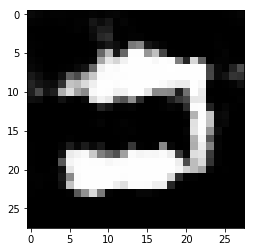

Discriminator Loss: 1.0898... Generator Loss: 3.6710


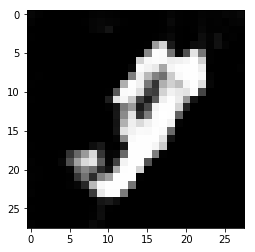

Discriminator Loss: 1.1723... Generator Loss: 0.8128


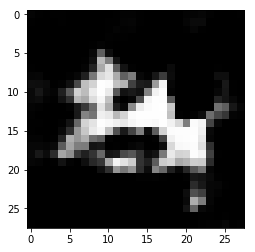

Discriminator Loss: 0.6558... Generator Loss: 1.9882


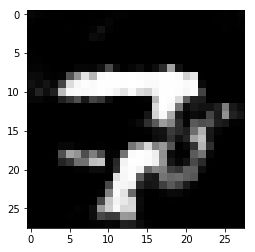

Discriminator Loss: 0.8627... Generator Loss: 1.6201


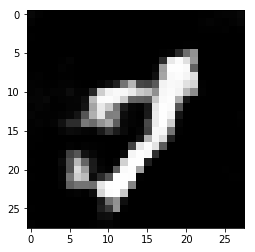

Discriminator Loss: 1.1032... Generator Loss: 0.8008


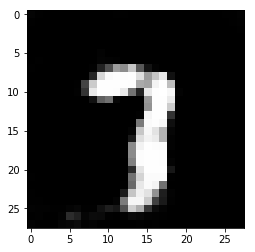

Discriminator Loss: 0.7324... Generator Loss: 1.5491


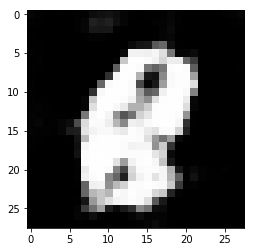

Discriminator Loss: 0.7213... Generator Loss: 1.5617


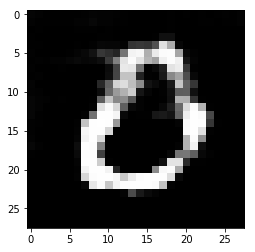

Discriminator Loss: 0.9983... Generator Loss: 0.8311


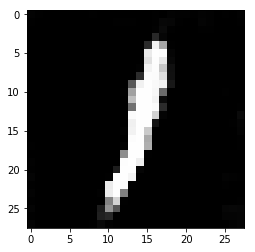

Discriminator Loss: 0.8305... Generator Loss: 1.8989


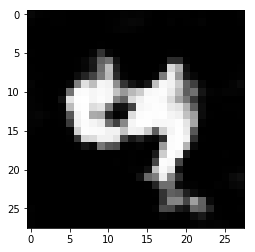

Discriminator Loss: 0.9346... Generator Loss: 0.9651


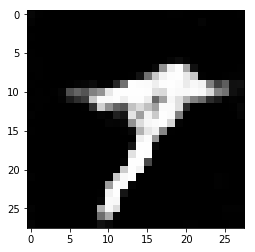

Discriminator Loss: 1.1171... Generator Loss: 0.7034


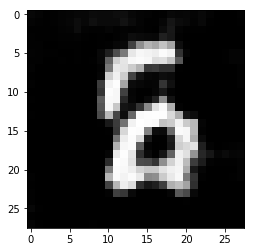

Discriminator Loss: 0.7590... Generator Loss: 1.7617


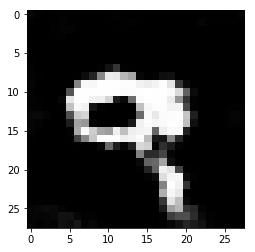

Discriminator Loss: 0.9258... Generator Loss: 1.0159


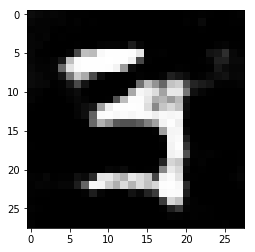

Discriminator Loss: 0.9353... Generator Loss: 1.0014


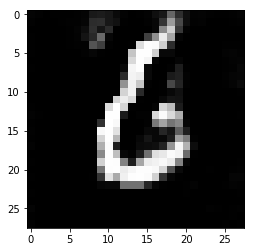

Discriminator Loss: 0.9886... Generator Loss: 2.7386


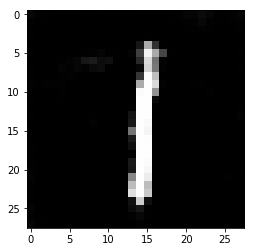

Discriminator Loss: 1.3608... Generator Loss: 0.5672


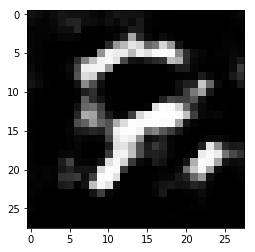

Discriminator Loss: 0.8219... Generator Loss: 1.5293


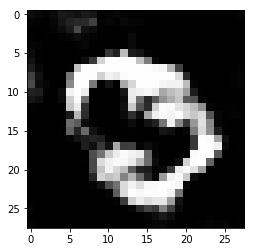

Discriminator Loss: 0.7119... Generator Loss: 1.8390


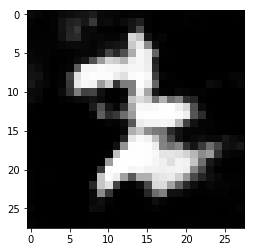

Discriminator Loss: 1.3212... Generator Loss: 0.6109


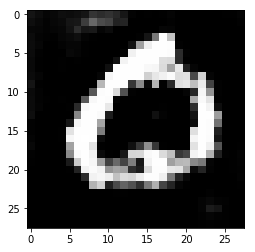

Discriminator Loss: 0.8491... Generator Loss: 1.7929


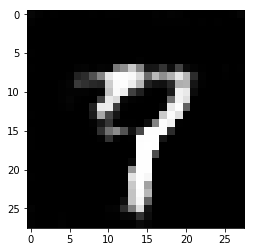

Discriminator Loss: 0.7565... Generator Loss: 1.3326


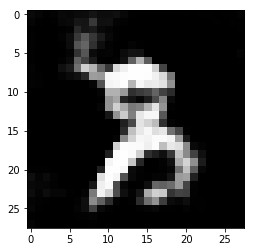

Discriminator Loss: 0.7647... Generator Loss: 1.4148


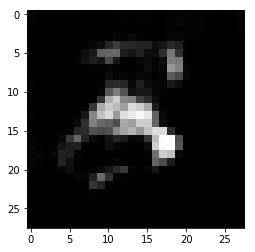

Discriminator Loss: 0.9392... Generator Loss: 1.0422


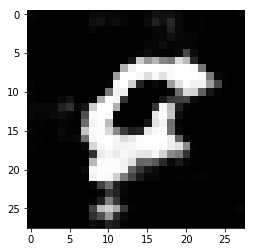

Discriminator Loss: 0.6352... Generator Loss: 2.1061


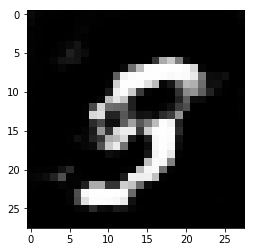

Discriminator Loss: 0.9804... Generator Loss: 0.9751


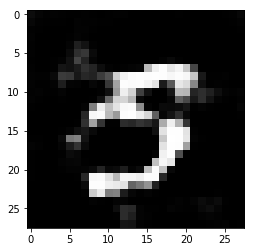

Discriminator Loss: 1.2876... Generator Loss: 0.5985


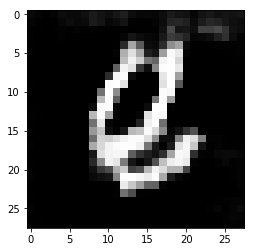

Discriminator Loss: 1.2524... Generator Loss: 3.1740


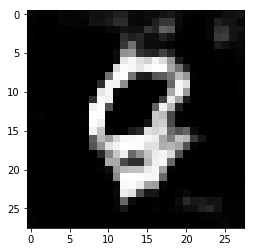

Discriminator Loss: 1.0123... Generator Loss: 1.0084


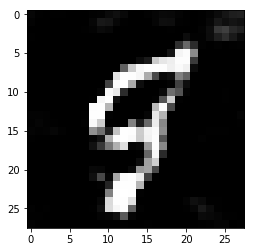

Discriminator Loss: 1.1578... Generator Loss: 0.7170


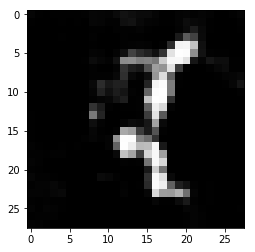

Discriminator Loss: 0.9317... Generator Loss: 2.1652


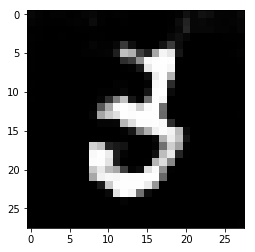

Discriminator Loss: 0.7726... Generator Loss: 1.3996


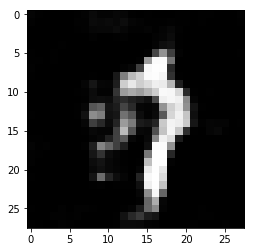

Discriminator Loss: 1.2268... Generator Loss: 0.6228


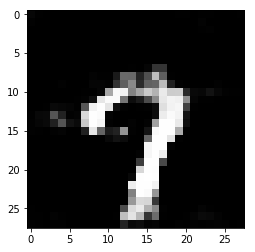

Discriminator Loss: 0.6621... Generator Loss: 2.5378


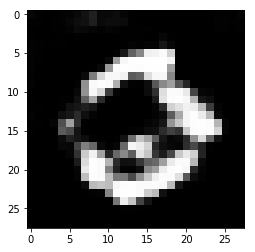

Discriminator Loss: 1.0619... Generator Loss: 0.8187


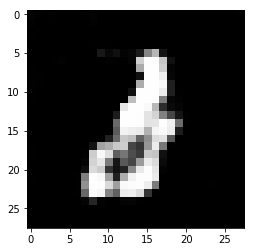

Discriminator Loss: 0.9695... Generator Loss: 0.9540


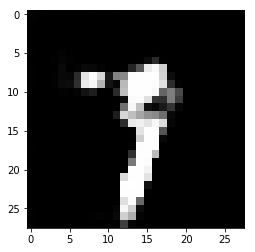

Discriminator Loss: 0.8289... Generator Loss: 1.6896


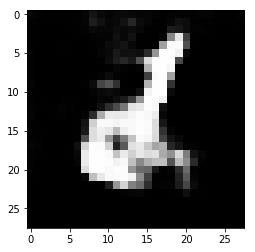

Discriminator Loss: 1.0176... Generator Loss: 0.8616


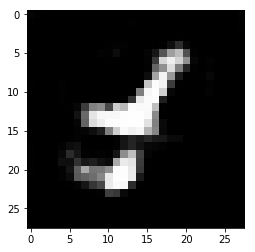

Discriminator Loss: 0.7564... Generator Loss: 2.4966


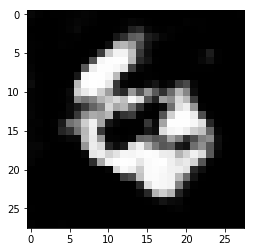

Discriminator Loss: 0.8024... Generator Loss: 1.1594


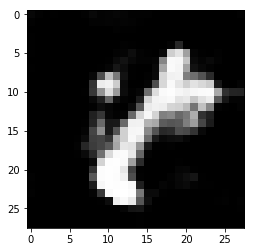

Discriminator Loss: 1.0776... Generator Loss: 0.8456


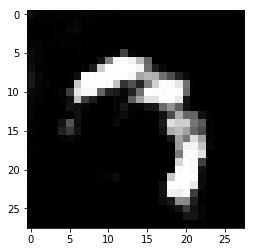

Discriminator Loss: 0.6347... Generator Loss: 1.7661


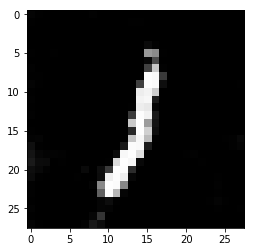

Discriminator Loss: 0.7709... Generator Loss: 1.3205


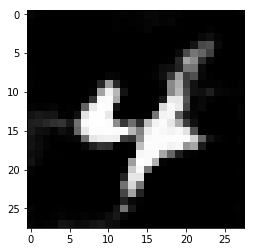

Discriminator Loss: 0.7644... Generator Loss: 1.3350


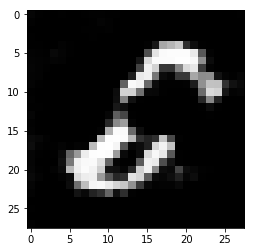

Discriminator Loss: 0.9070... Generator Loss: 1.0146


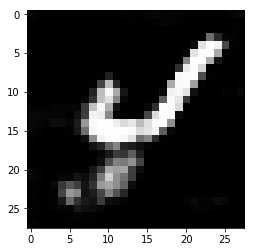

Discriminator Loss: 0.6754... Generator Loss: 1.5989


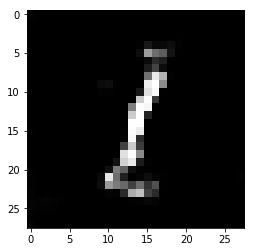

Discriminator Loss: 0.6715... Generator Loss: 1.5619


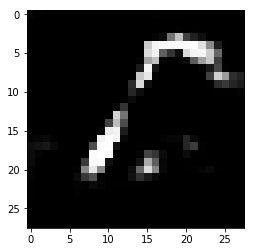

Discriminator Loss: 0.9942... Generator Loss: 0.8604


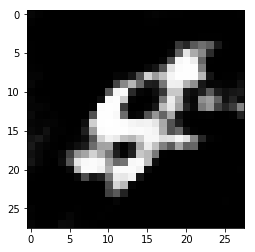

Discriminator Loss: 0.6454... Generator Loss: 1.5603


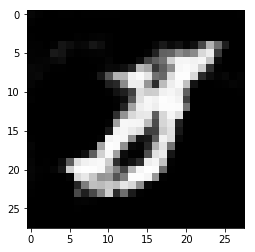

Discriminator Loss: 0.8899... Generator Loss: 1.1197


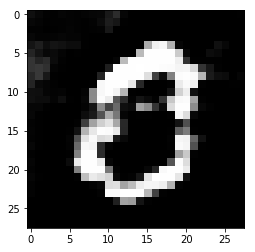

Discriminator Loss: 0.8463... Generator Loss: 1.4597


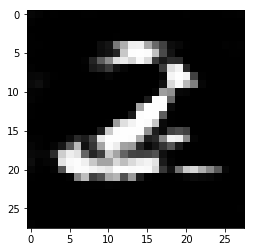

Discriminator Loss: 0.8072... Generator Loss: 1.1980


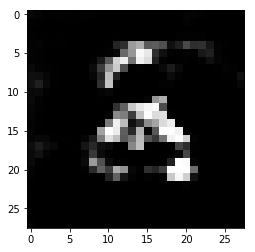

Discriminator Loss: 1.0180... Generator Loss: 0.8303


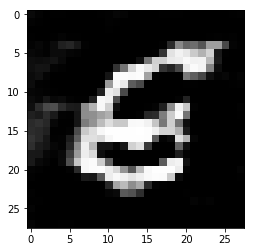

Discriminator Loss: 0.5764... Generator Loss: 2.1909


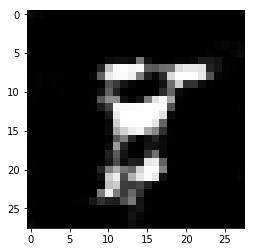

Discriminator Loss: 0.6604... Generator Loss: 1.7423


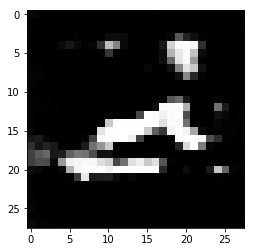

Discriminator Loss: 1.3010... Generator Loss: 0.5865


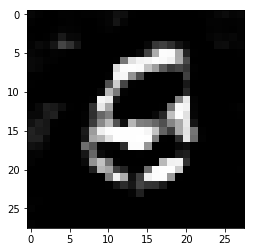

Discriminator Loss: 0.7591... Generator Loss: 2.2584


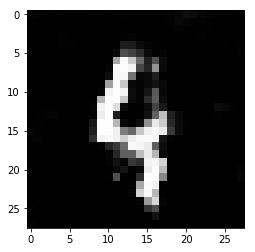

Discriminator Loss: 1.1833... Generator Loss: 0.6827


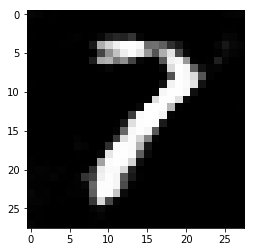

Discriminator Loss: 0.8469... Generator Loss: 1.3893


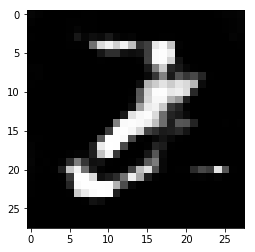

Discriminator Loss: 0.9469... Generator Loss: 1.0841


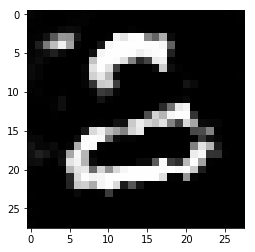

Discriminator Loss: 1.8297... Generator Loss: 0.3370


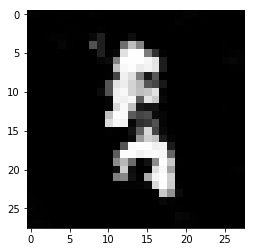

Discriminator Loss: 2.3667... Generator Loss: 5.7998


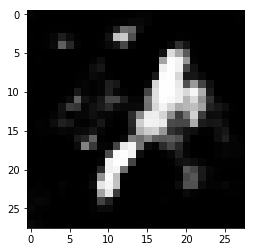

Discriminator Loss: 0.9423... Generator Loss: 1.4606


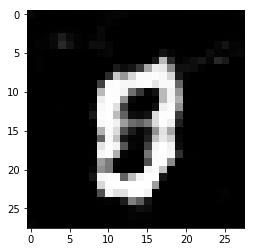

Discriminator Loss: 1.4204... Generator Loss: 0.4980


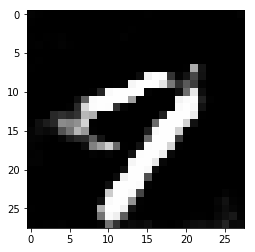

Discriminator Loss: 1.2394... Generator Loss: 2.0237


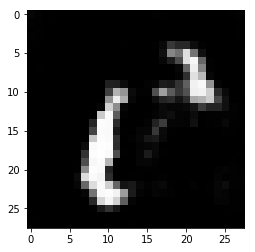

Discriminator Loss: 0.9662... Generator Loss: 1.0720


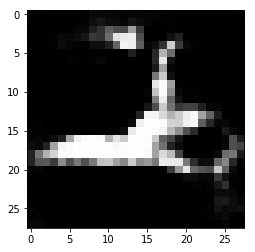

Discriminator Loss: 0.7878... Generator Loss: 1.2569


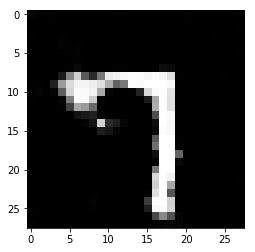

Discriminator Loss: 1.0500... Generator Loss: 0.9853


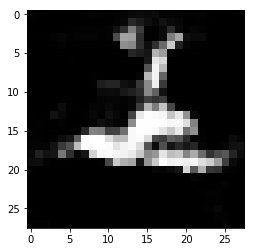

Discriminator Loss: 1.0121... Generator Loss: 1.0486


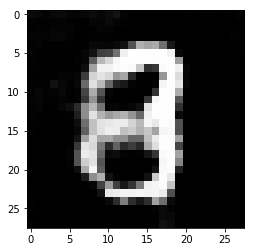

Discriminator Loss: 1.0124... Generator Loss: 0.8629


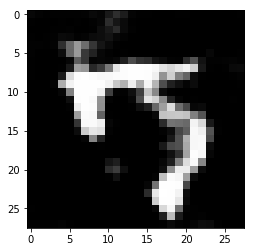

Discriminator Loss: 0.9915... Generator Loss: 1.0567


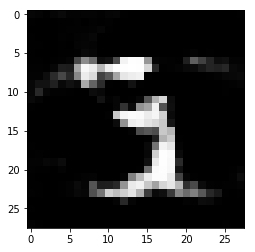

Discriminator Loss: 0.7989... Generator Loss: 1.7010


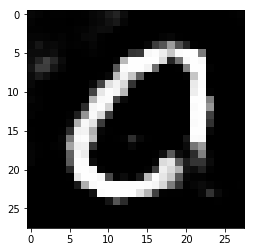

Discriminator Loss: 1.4109... Generator Loss: 0.5473


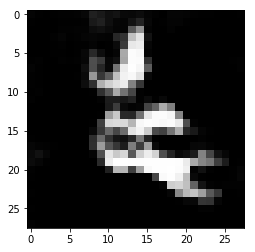

Discriminator Loss: 1.0821... Generator Loss: 3.4892


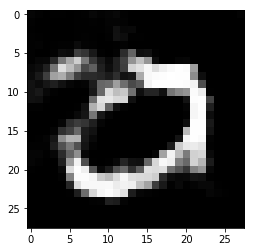

Discriminator Loss: 0.8237... Generator Loss: 1.7553


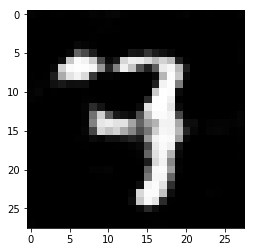

Discriminator Loss: 1.0447... Generator Loss: 1.2601


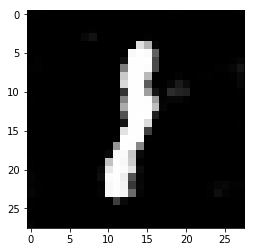

Discriminator Loss: 0.9786... Generator Loss: 1.0346


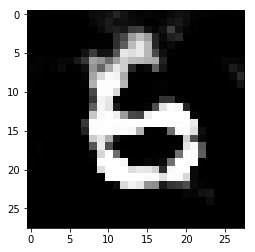

Discriminator Loss: 0.8243... Generator Loss: 1.5975


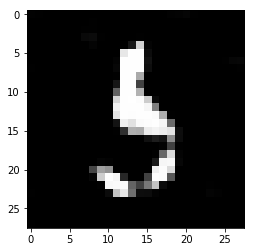

Discriminator Loss: 0.7631... Generator Loss: 1.7174


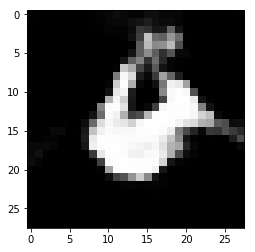

Discriminator Loss: 0.9359... Generator Loss: 0.9729


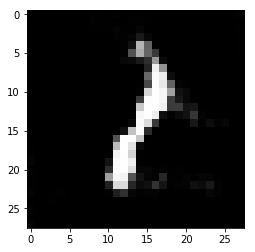

Discriminator Loss: 0.8107... Generator Loss: 2.4356


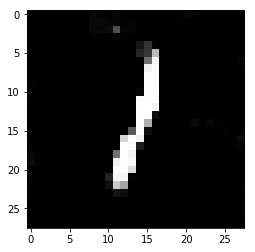

Discriminator Loss: 1.0591... Generator Loss: 0.7876


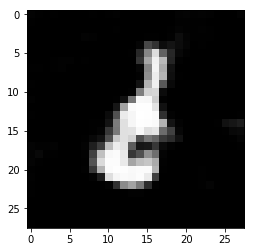

Discriminator Loss: 0.7815... Generator Loss: 1.3167


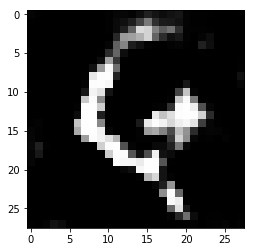

Discriminator Loss: 0.7269... Generator Loss: 2.0058


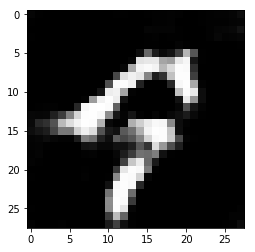

Discriminator Loss: 1.5916... Generator Loss: 0.4174


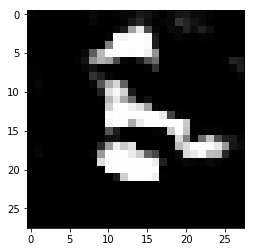

Discriminator Loss: 1.2001... Generator Loss: 2.6317


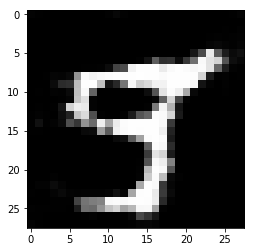

Discriminator Loss: 0.8760... Generator Loss: 1.2043


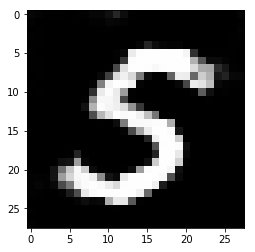

Discriminator Loss: 0.9977... Generator Loss: 0.8880


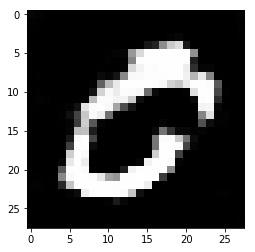

Discriminator Loss: 0.8626... Generator Loss: 1.1010


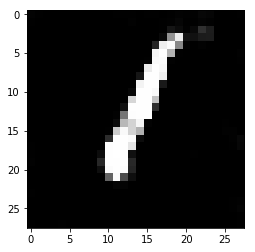

Discriminator Loss: 0.7389... Generator Loss: 1.3488


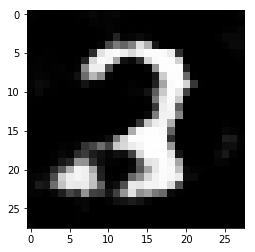

Discriminator Loss: 0.9131... Generator Loss: 0.9700


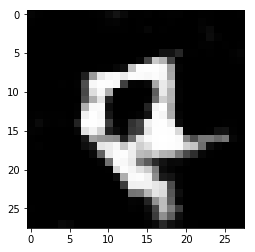

Discriminator Loss: 0.9335... Generator Loss: 1.3662


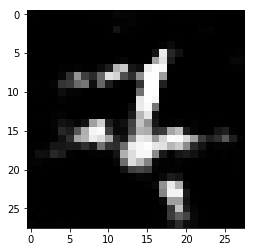

Discriminator Loss: 0.6539... Generator Loss: 1.6338


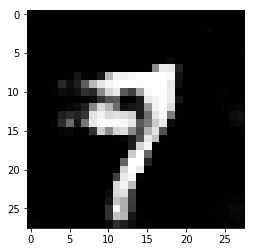

Discriminator Loss: 1.1382... Generator Loss: 0.7199


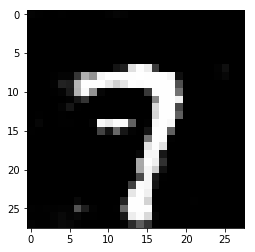

Discriminator Loss: 0.5334... Generator Loss: 2.3573


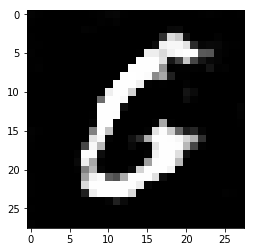

Discriminator Loss: 0.9163... Generator Loss: 0.9765


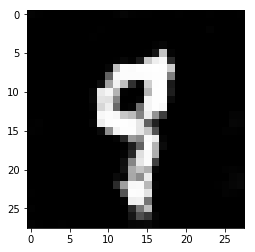

Discriminator Loss: 0.7058... Generator Loss: 1.5826


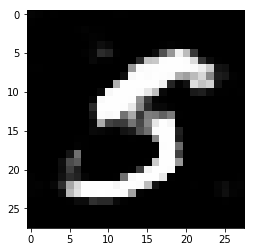

Discriminator Loss: 0.6733... Generator Loss: 1.6507


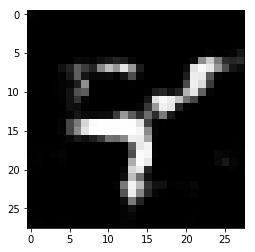

Discriminator Loss: 0.9977... Generator Loss: 0.8285


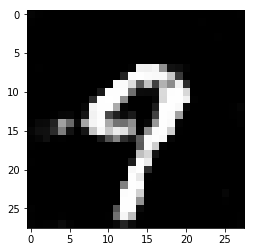

Discriminator Loss: 0.8112... Generator Loss: 1.6057


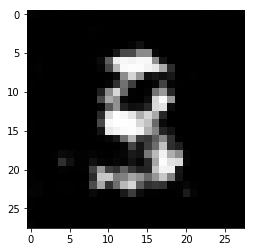

Discriminator Loss: 1.1598... Generator Loss: 0.6594


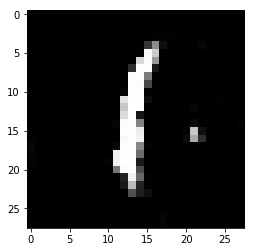

Discriminator Loss: 0.7510... Generator Loss: 1.3435


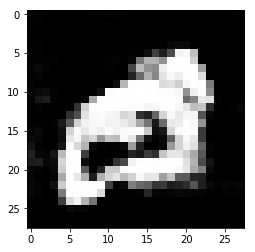

Discriminator Loss: 0.7922... Generator Loss: 1.5404


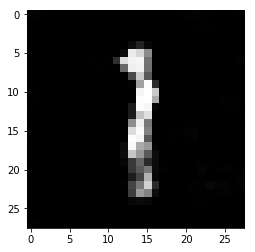

Discriminator Loss: 0.7725... Generator Loss: 1.2790


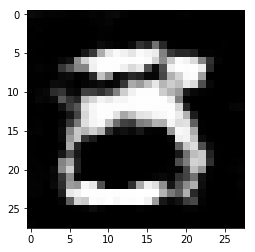

Discriminator Loss: 0.7346... Generator Loss: 1.2795


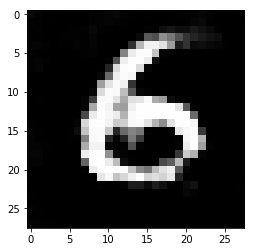

Discriminator Loss: 0.8964... Generator Loss: 1.0973


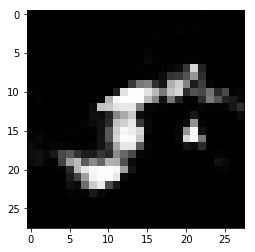

Discriminator Loss: 0.8623... Generator Loss: 1.1694


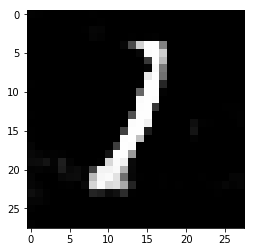

Discriminator Loss: 0.7115... Generator Loss: 2.2589


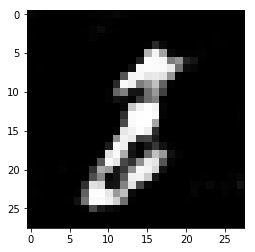

Discriminator Loss: 1.0068... Generator Loss: 0.8779


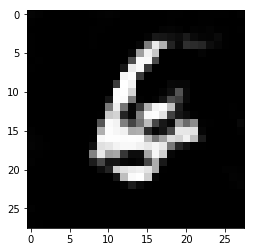

Discriminator Loss: 0.7858... Generator Loss: 1.7220


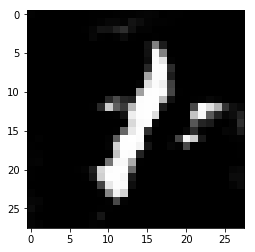

Discriminator Loss: 1.0343... Generator Loss: 0.8071


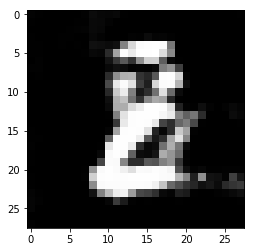

Discriminator Loss: 0.8246... Generator Loss: 3.4269


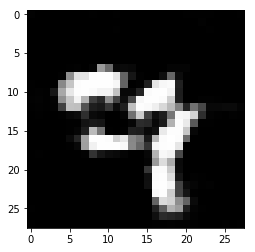

Discriminator Loss: 1.1460... Generator Loss: 0.8112


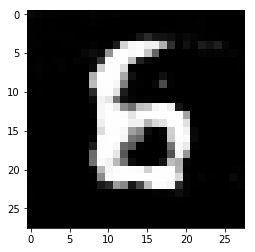

Discriminator Loss: 0.7964... Generator Loss: 1.3215


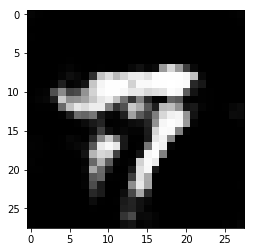

Discriminator Loss: 0.6750... Generator Loss: 2.1516


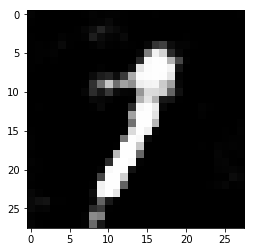

Discriminator Loss: 0.9104... Generator Loss: 1.0149


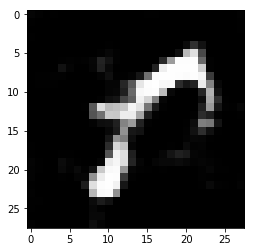

Discriminator Loss: 0.5837... Generator Loss: 2.1574


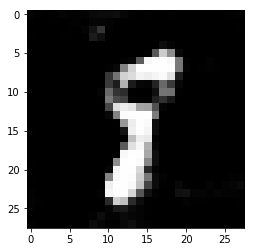

Discriminator Loss: 0.6116... Generator Loss: 1.9412


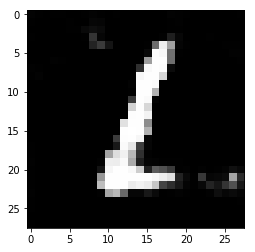

Discriminator Loss: 1.5108... Generator Loss: 0.4586


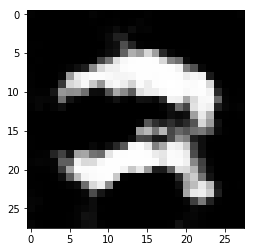

Discriminator Loss: 1.0435... Generator Loss: 2.9074


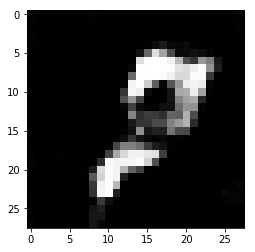

Discriminator Loss: 1.0930... Generator Loss: 0.8943


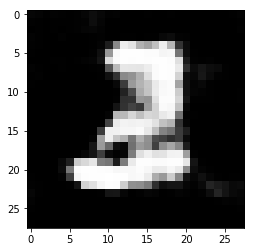

Discriminator Loss: 0.7465... Generator Loss: 1.4776


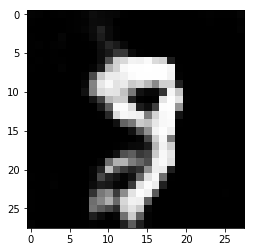

Discriminator Loss: 0.7155... Generator Loss: 1.6750


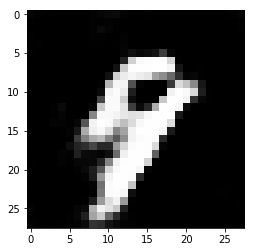

Discriminator Loss: 0.9540... Generator Loss: 0.9934


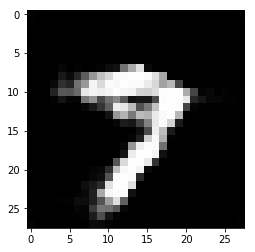

Discriminator Loss: 0.9650... Generator Loss: 1.1818


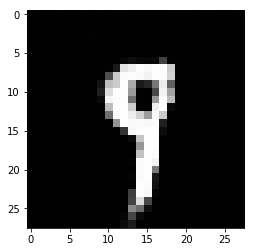

Discriminator Loss: 0.7271... Generator Loss: 1.3563


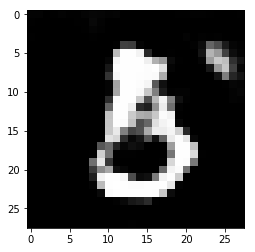

Discriminator Loss: 0.8220... Generator Loss: 1.1809


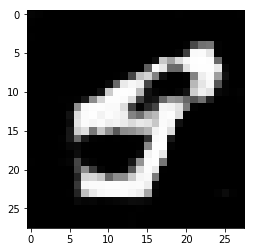

Discriminator Loss: 0.7912... Generator Loss: 1.8235


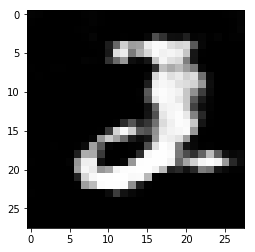

Discriminator Loss: 0.9469... Generator Loss: 0.9230


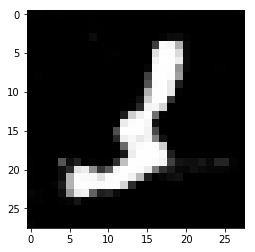

Discriminator Loss: 0.6630... Generator Loss: 1.6211


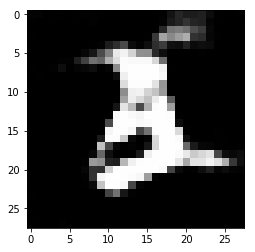

Discriminator Loss: 0.9219... Generator Loss: 1.0720


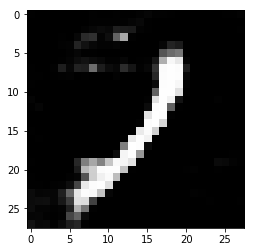

Discriminator Loss: 1.1162... Generator Loss: 0.7422


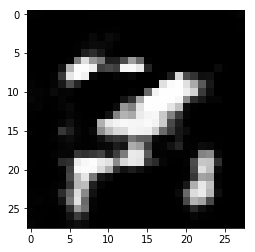

Discriminator Loss: 1.0676... Generator Loss: 1.9669


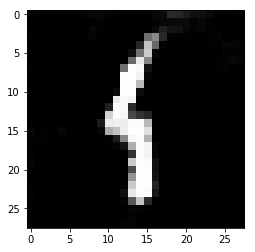

Discriminator Loss: 0.9400... Generator Loss: 0.9337


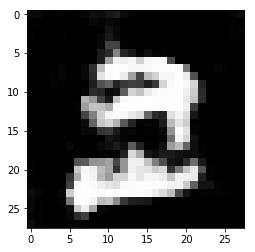

Discriminator Loss: 0.8363... Generator Loss: 1.1558


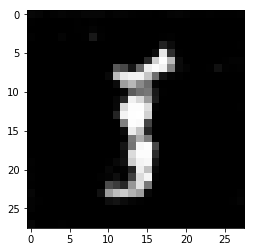

Discriminator Loss: 0.8766... Generator Loss: 1.0923


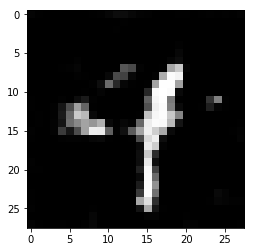

Discriminator Loss: 0.9333... Generator Loss: 1.1884


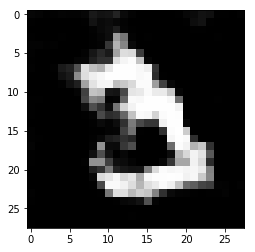

Discriminator Loss: 1.2896... Generator Loss: 0.5464


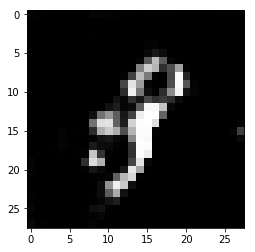

Discriminator Loss: 0.7898... Generator Loss: 1.5500


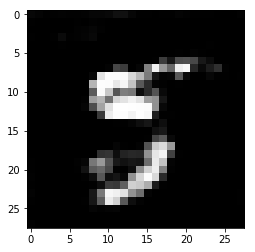

Discriminator Loss: 0.9119... Generator Loss: 1.3389


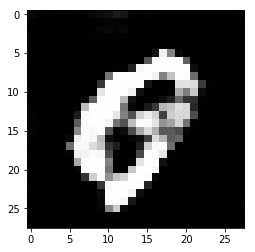

Discriminator Loss: 1.2919... Generator Loss: 0.5744


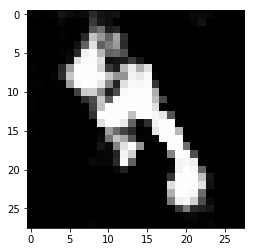

Discriminator Loss: 0.6636... Generator Loss: 1.8184


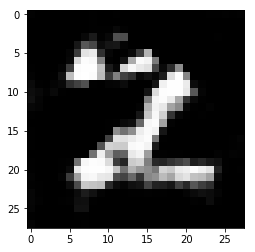

Discriminator Loss: 0.6568... Generator Loss: 1.5055


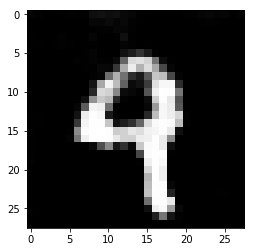

Discriminator Loss: 0.7738... Generator Loss: 1.1711


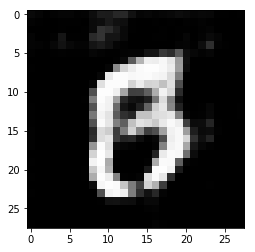

Discriminator Loss: 0.7025... Generator Loss: 1.4351


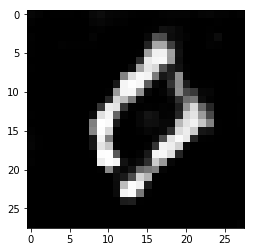

Discriminator Loss: 0.7721... Generator Loss: 1.5353


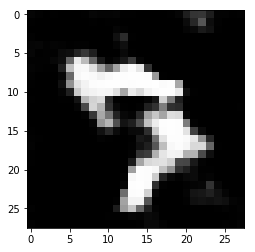

Discriminator Loss: 1.4567... Generator Loss: 0.5855


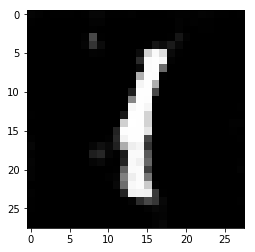

Discriminator Loss: 0.8064... Generator Loss: 2.9539


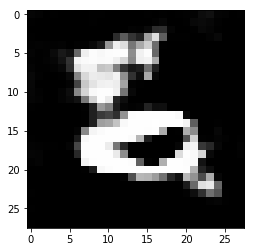

Discriminator Loss: 0.9631... Generator Loss: 0.9406


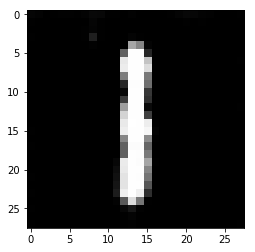

Discriminator Loss: 1.1664... Generator Loss: 0.8322


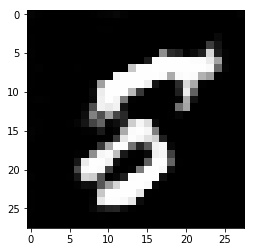

Discriminator Loss: 0.7932... Generator Loss: 2.5468


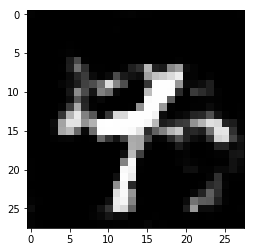

Discriminator Loss: 0.9741... Generator Loss: 0.8963


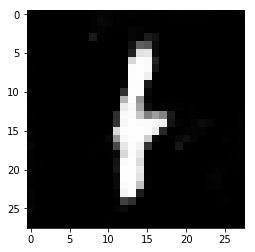

Discriminator Loss: 1.1669... Generator Loss: 0.8131


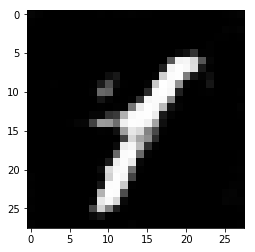

Discriminator Loss: 0.7868... Generator Loss: 1.9712


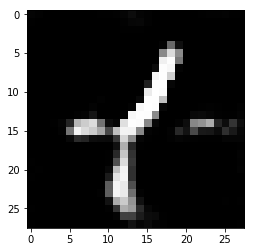

Discriminator Loss: 1.0462... Generator Loss: 0.8205


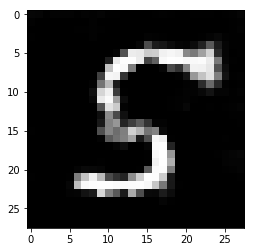

Discriminator Loss: 1.2317... Generator Loss: 1.8622


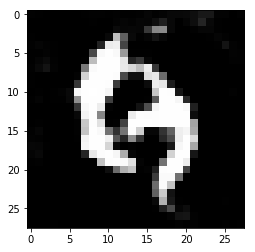

Discriminator Loss: 1.2949... Generator Loss: 0.6570


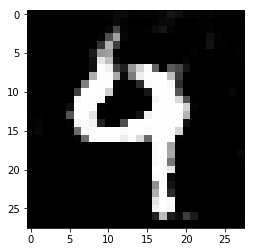

Discriminator Loss: 0.7015... Generator Loss: 2.6185


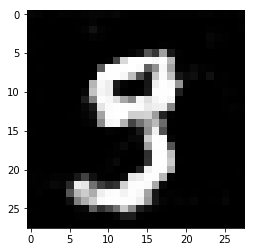

Discriminator Loss: 0.9301... Generator Loss: 1.0956


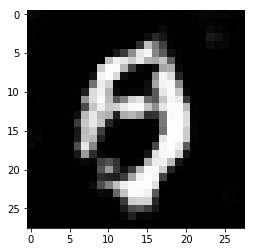

Discriminator Loss: 0.7389... Generator Loss: 1.2936


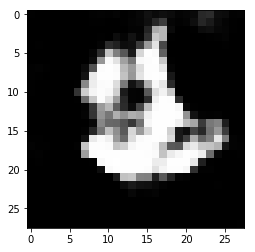

Discriminator Loss: 0.7183... Generator Loss: 1.5861


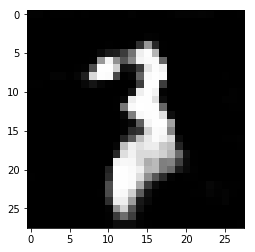

Discriminator Loss: 0.9567... Generator Loss: 0.9473


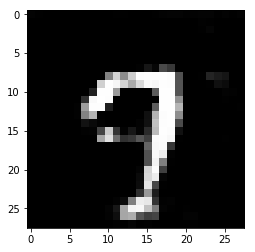

Discriminator Loss: 0.6583... Generator Loss: 1.6270


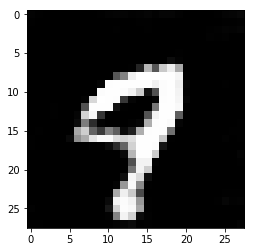

Discriminator Loss: 0.7311... Generator Loss: 1.3570


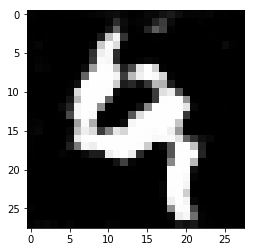

Discriminator Loss: 0.9980... Generator Loss: 0.8542


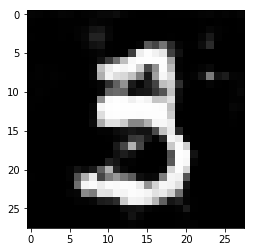

Discriminator Loss: 1.1909... Generator Loss: 2.6855


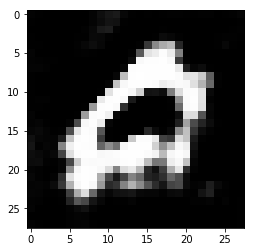

Discriminator Loss: 1.6871... Generator Loss: 0.3744


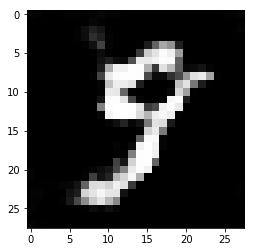

Discriminator Loss: 0.9418... Generator Loss: 1.0342


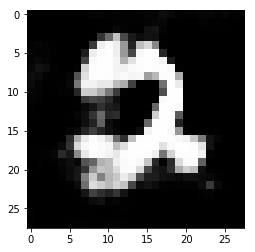

Discriminator Loss: 0.8289... Generator Loss: 1.8170


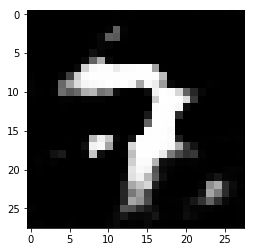

Discriminator Loss: 1.0422... Generator Loss: 0.9138


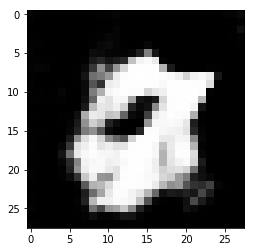

Discriminator Loss: 0.8571... Generator Loss: 1.9693


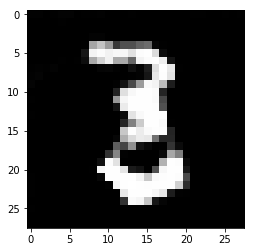

Discriminator Loss: 0.7284... Generator Loss: 1.5372


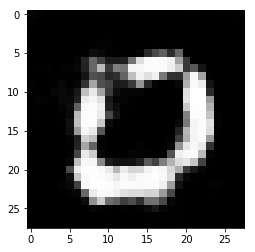

Discriminator Loss: 1.1834... Generator Loss: 0.6774


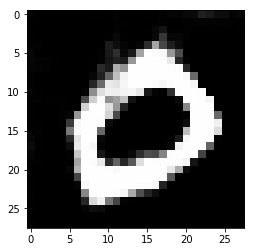

Discriminator Loss: 0.6856... Generator Loss: 1.4140


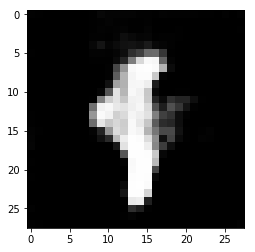

Discriminator Loss: 0.6892... Generator Loss: 2.1401


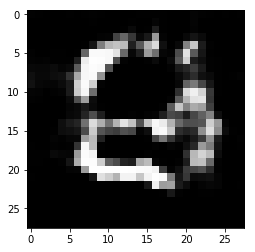

Discriminator Loss: 0.7283... Generator Loss: 1.6456


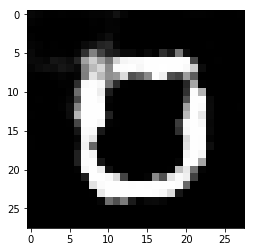

Discriminator Loss: 1.0605... Generator Loss: 0.8329


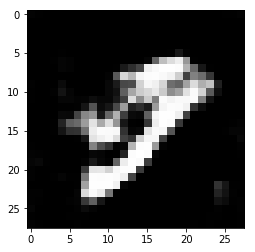

Discriminator Loss: 0.8251... Generator Loss: 1.1651


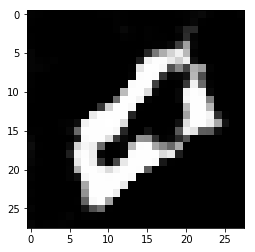

Discriminator Loss: 0.6788... Generator Loss: 1.4774


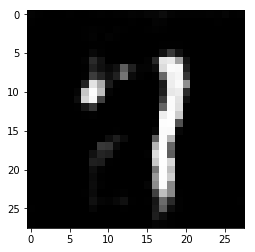

Discriminator Loss: 0.7381... Generator Loss: 1.3628


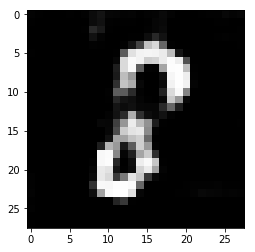

Discriminator Loss: 1.0036... Generator Loss: 0.8389


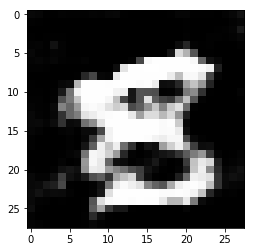

Discriminator Loss: 0.9997... Generator Loss: 2.3229


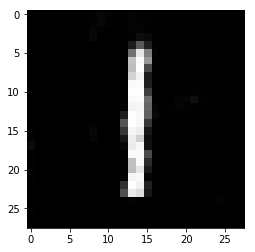

Discriminator Loss: 1.1293... Generator Loss: 0.8155


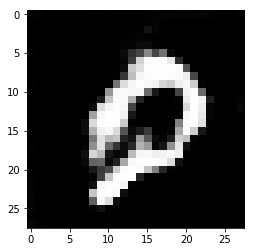

Discriminator Loss: 0.7301... Generator Loss: 1.5234


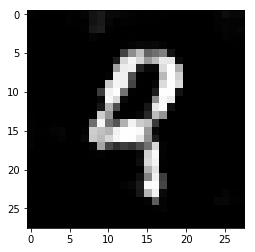

Discriminator Loss: 0.6948... Generator Loss: 1.4536


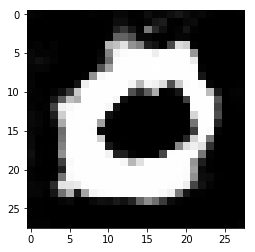

Discriminator Loss: 0.7857... Generator Loss: 1.2369


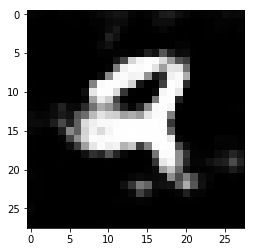

Discriminator Loss: 0.6164... Generator Loss: 1.9951


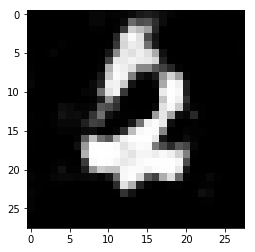

Discriminator Loss: 1.1502... Generator Loss: 0.7018


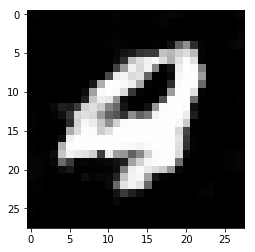

Discriminator Loss: 0.9664... Generator Loss: 1.0036


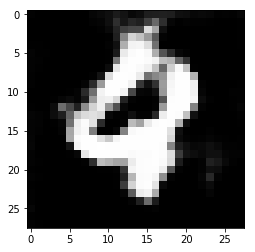

Discriminator Loss: 0.7773... Generator Loss: 2.7438


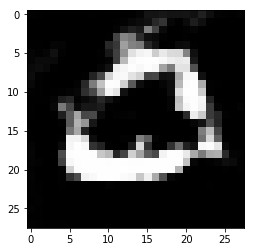

Discriminator Loss: 1.3147... Generator Loss: 0.6097


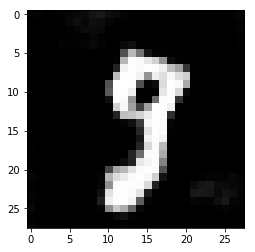

Discriminator Loss: 0.6604... Generator Loss: 1.9538


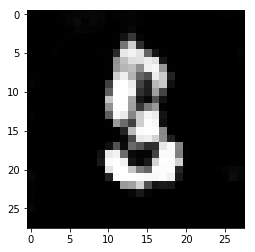

Discriminator Loss: 1.1095... Generator Loss: 0.8443


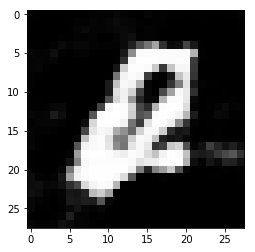

Discriminator Loss: 0.8073... Generator Loss: 1.1722


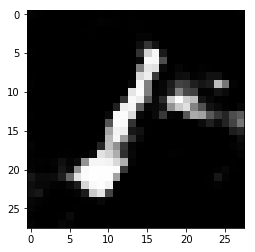

Discriminator Loss: 0.8073... Generator Loss: 1.6728


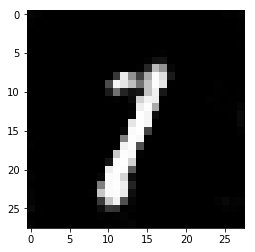

Discriminator Loss: 1.0860... Generator Loss: 0.8758


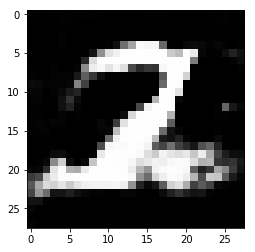

Discriminator Loss: 1.4626... Generator Loss: 0.5219


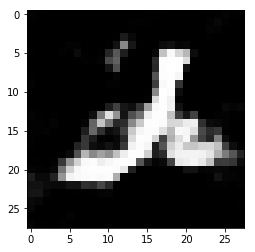

Discriminator Loss: 1.2875... Generator Loss: 3.5796


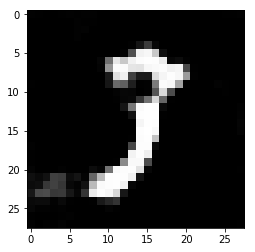

Discriminator Loss: 1.7676... Generator Loss: 0.4325


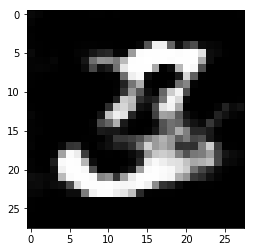

Discriminator Loss: 3.6002... Generator Loss: 5.7206


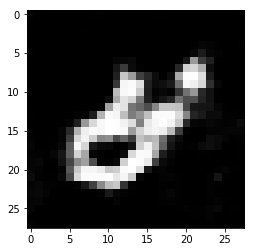

Discriminator Loss: 2.2505... Generator Loss: 0.8318


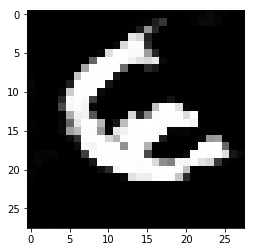

Discriminator Loss: 1.2563... Generator Loss: 1.2647


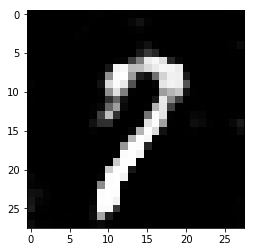

Discriminator Loss: 1.0455... Generator Loss: 1.8691


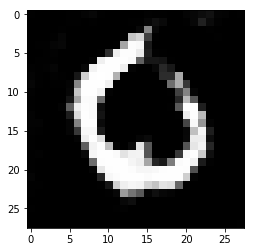

Discriminator Loss: 1.1143... Generator Loss: 1.0558


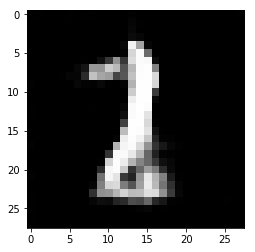

Discriminator Loss: 0.9724... Generator Loss: 0.9620


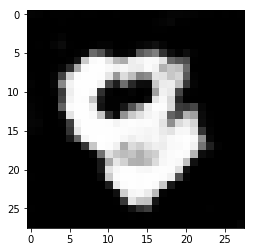

Discriminator Loss: 0.9280... Generator Loss: 1.5512


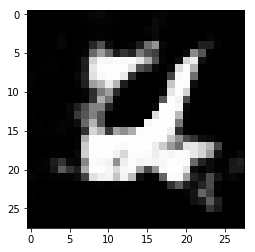

Discriminator Loss: 1.0745... Generator Loss: 0.7768


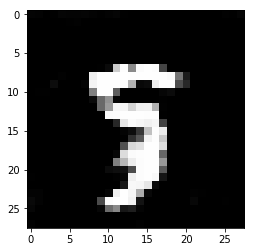

Discriminator Loss: 0.9203... Generator Loss: 1.2283


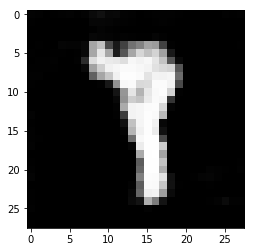

Discriminator Loss: 0.8356... Generator Loss: 1.5562


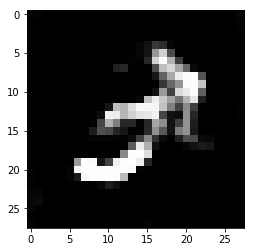

Discriminator Loss: 1.3811... Generator Loss: 0.5106


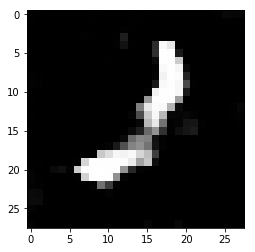

Discriminator Loss: 0.8896... Generator Loss: 1.1821


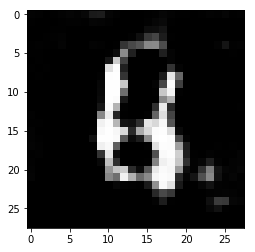

Discriminator Loss: 0.7315... Generator Loss: 1.3707


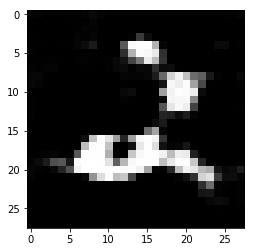

Discriminator Loss: 0.8873... Generator Loss: 1.0820


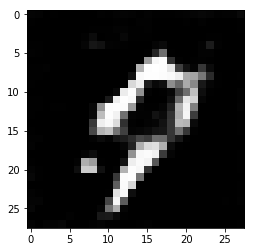

Discriminator Loss: 0.8096... Generator Loss: 1.2127


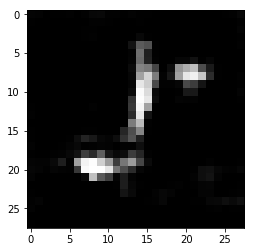

Discriminator Loss: 0.7438... Generator Loss: 1.3169


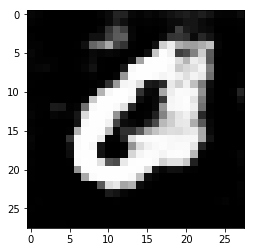

Discriminator Loss: 0.7948... Generator Loss: 1.3257


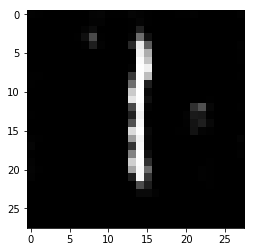

Discriminator Loss: 0.9000... Generator Loss: 0.9658


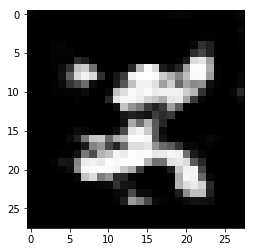

Discriminator Loss: 0.9039... Generator Loss: 0.9843


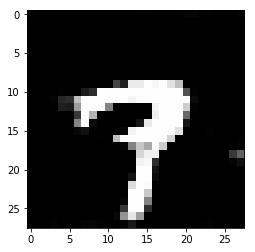

Discriminator Loss: 0.7756... Generator Loss: 1.7099


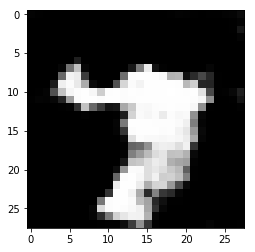

Discriminator Loss: 1.0417... Generator Loss: 0.7960


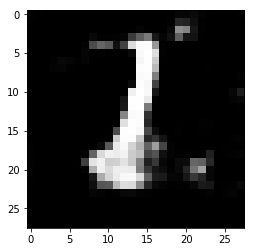

Discriminator Loss: 0.8296... Generator Loss: 1.1744


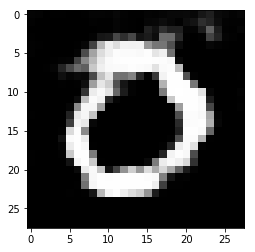

Discriminator Loss: 0.8916... Generator Loss: 1.0153


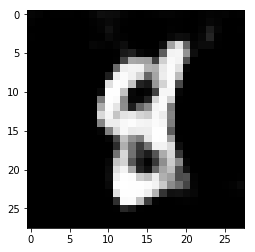

Discriminator Loss: 1.2026... Generator Loss: 0.6760


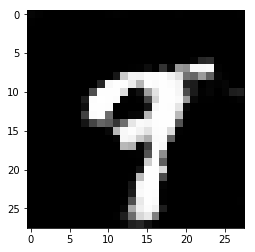

Discriminator Loss: 0.8916... Generator Loss: 2.5789


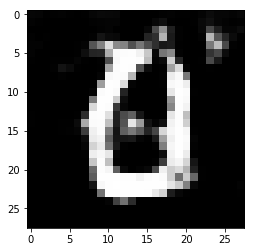

Discriminator Loss: 0.7401... Generator Loss: 1.2881


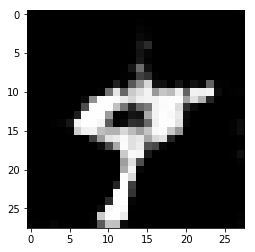

Discriminator Loss: 0.7911... Generator Loss: 1.1506


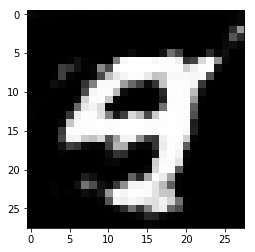

Discriminator Loss: 0.7187... Generator Loss: 1.3721


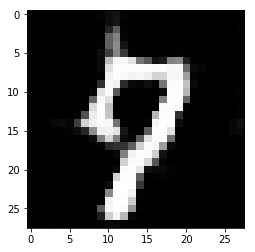

Discriminator Loss: 0.6650... Generator Loss: 1.6963


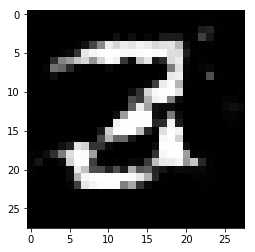

Discriminator Loss: 1.0206... Generator Loss: 0.8778


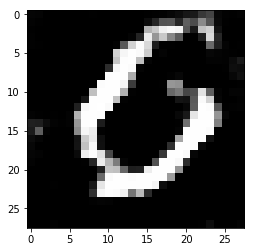

Discriminator Loss: 0.9347... Generator Loss: 0.9862


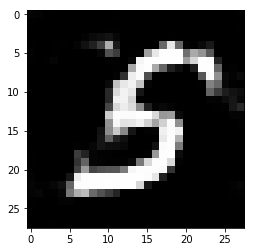

Discriminator Loss: 1.1738... Generator Loss: 0.6581


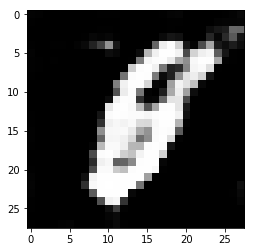

Discriminator Loss: 1.0971... Generator Loss: 2.9489


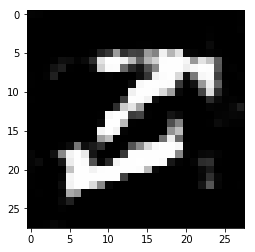

Discriminator Loss: 0.9729... Generator Loss: 0.9080


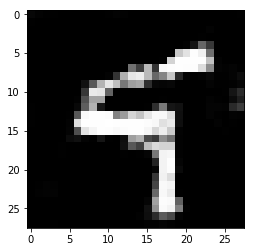

Discriminator Loss: 0.7085... Generator Loss: 1.4548


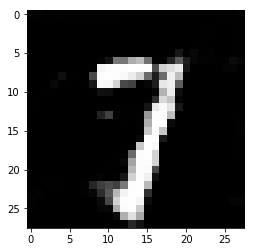

Discriminator Loss: 1.0918... Generator Loss: 0.7525


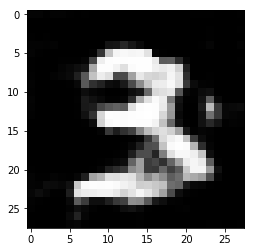

Discriminator Loss: 0.8801... Generator Loss: 1.2826


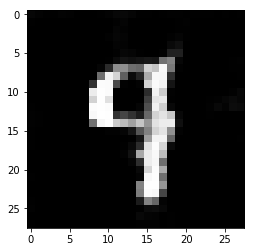

Discriminator Loss: 0.6772... Generator Loss: 1.5146


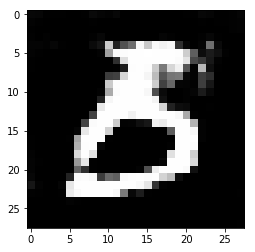

Discriminator Loss: 1.2401... Generator Loss: 0.6096


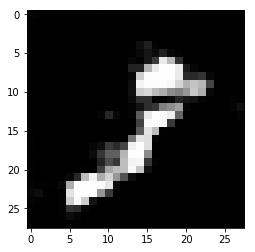

Discriminator Loss: 0.6909... Generator Loss: 1.8539


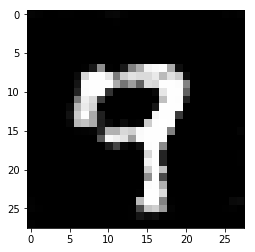

Discriminator Loss: 0.8264... Generator Loss: 1.1474


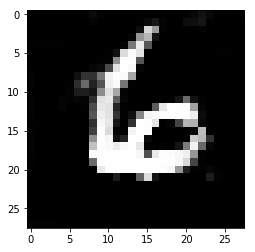

Discriminator Loss: 1.0602... Generator Loss: 0.7254


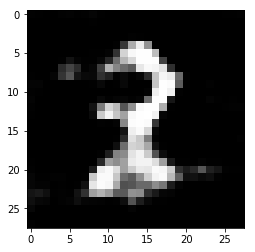

Discriminator Loss: 0.9613... Generator Loss: 1.7227


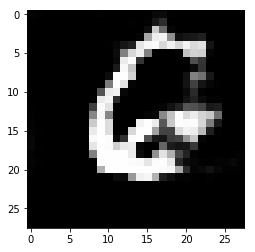

Discriminator Loss: 1.0843... Generator Loss: 0.8050


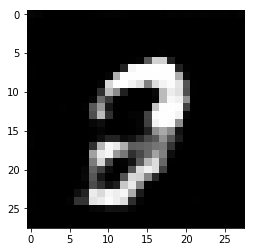

Discriminator Loss: 0.7881... Generator Loss: 1.1575


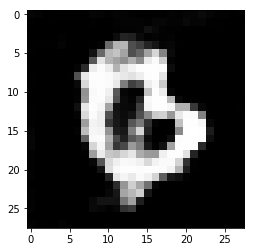

Discriminator Loss: 0.7344... Generator Loss: 1.4725


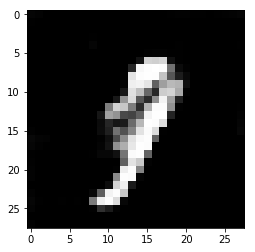

Discriminator Loss: 0.8979... Generator Loss: 0.9689


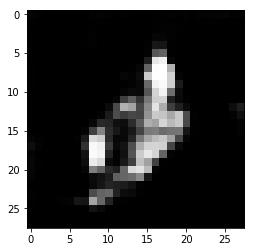

Discriminator Loss: 0.8397... Generator Loss: 1.0648


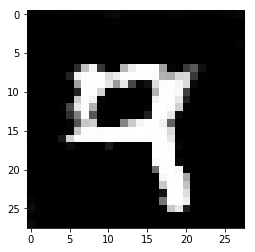

Discriminator Loss: 0.7693... Generator Loss: 1.2821


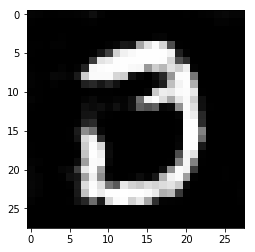

Discriminator Loss: 0.7727... Generator Loss: 1.2306


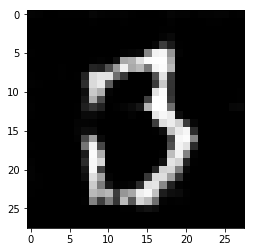

Discriminator Loss: 0.7744... Generator Loss: 1.2002


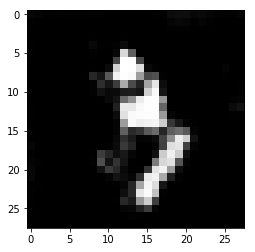

Discriminator Loss: 0.8684... Generator Loss: 1.0109


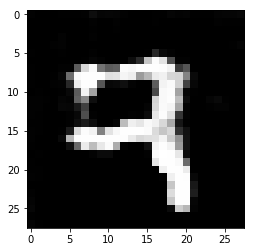

Discriminator Loss: 0.7256... Generator Loss: 1.7035


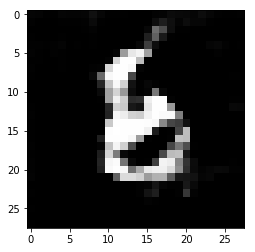

Discriminator Loss: 0.9214... Generator Loss: 0.9663


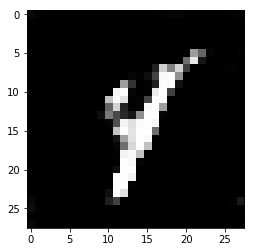

Discriminator Loss: 0.9891... Generator Loss: 0.9081


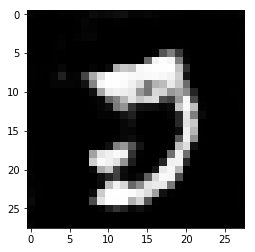

Discriminator Loss: 0.9337... Generator Loss: 0.9523


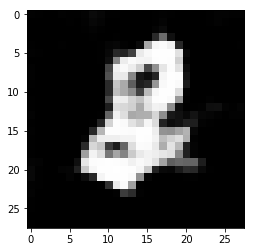

Discriminator Loss: 0.7560... Generator Loss: 1.4371


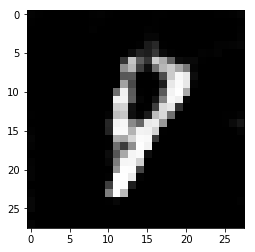

Discriminator Loss: 1.1282... Generator Loss: 0.8805


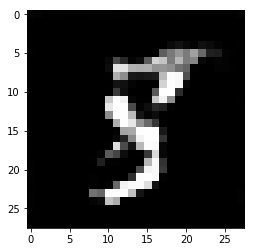

Discriminator Loss: 1.8225... Generator Loss: 0.3438


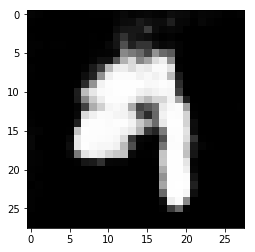

Discriminator Loss: 1.4230... Generator Loss: 4.6856


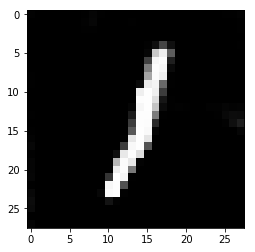

Discriminator Loss: 1.3655... Generator Loss: 0.7261


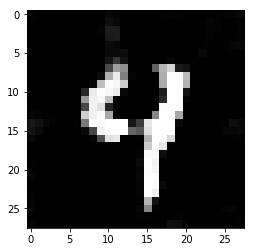

Discriminator Loss: 0.7831... Generator Loss: 2.0492


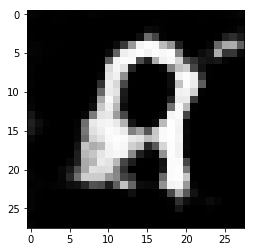

Discriminator Loss: 1.1795... Generator Loss: 0.7920


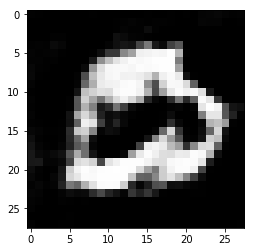

Discriminator Loss: 1.2419... Generator Loss: 2.3169


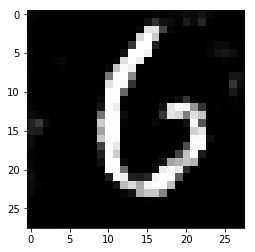

Discriminator Loss: 1.4841... Generator Loss: 0.4950


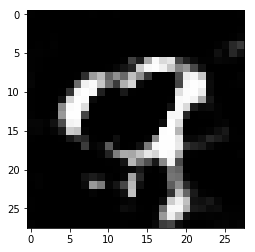

Discriminator Loss: 0.9627... Generator Loss: 0.9080


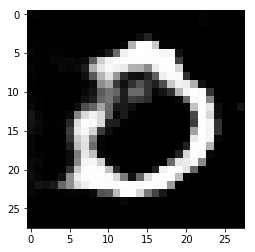

Discriminator Loss: 0.8257... Generator Loss: 1.6403


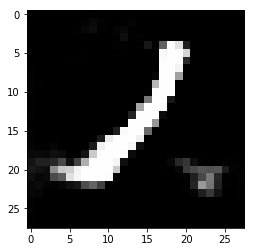

Discriminator Loss: 0.9513... Generator Loss: 0.9302


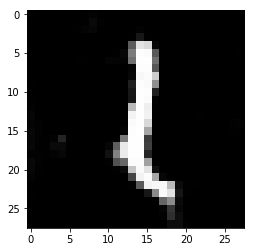

Discriminator Loss: 1.3198... Generator Loss: 0.5438


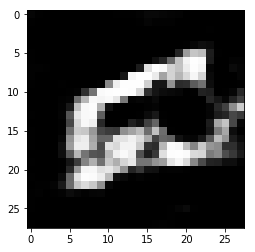

Discriminator Loss: 0.6836... Generator Loss: 2.3605


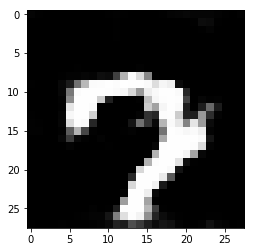

Discriminator Loss: 1.1316... Generator Loss: 0.7137


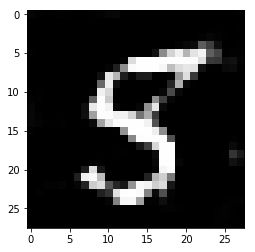

Discriminator Loss: 1.1404... Generator Loss: 0.7534


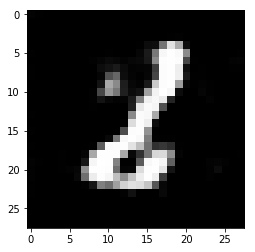

Discriminator Loss: 0.9135... Generator Loss: 1.8646


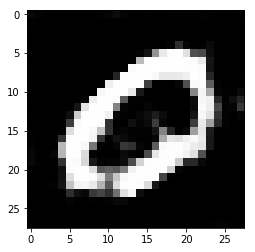

Discriminator Loss: 1.3693... Generator Loss: 0.5911


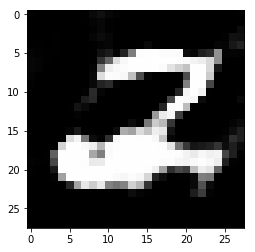

Discriminator Loss: 1.2093... Generator Loss: 1.8916


In [60]:
batch_size = 64
z_dim = 200
learning_rate = .0005
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

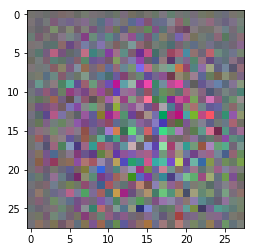

Discriminator Loss: 0.9086... Generator Loss: 4.3108


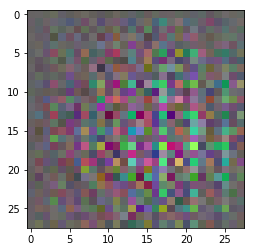

Discriminator Loss: 17.1091... Generator Loss: 0.0000


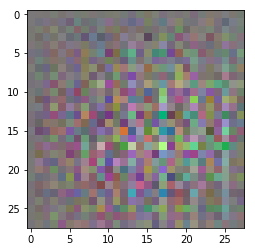

Discriminator Loss: 3.1853... Generator Loss: 5.4690


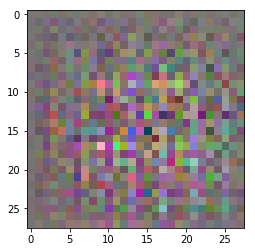

Discriminator Loss: 6.1114... Generator Loss: 0.0096


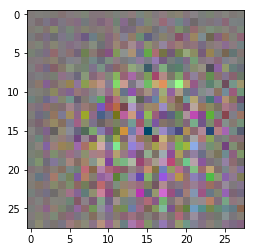

Discriminator Loss: 0.8617... Generator Loss: 10.1154


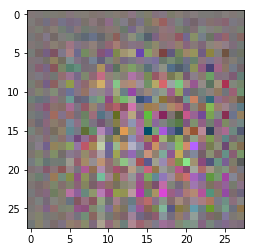

Discriminator Loss: 0.4552... Generator Loss: 8.3472


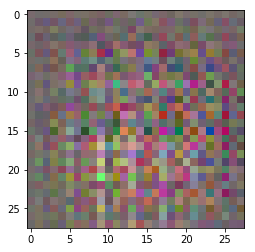

Discriminator Loss: 1.5597... Generator Loss: 0.5302


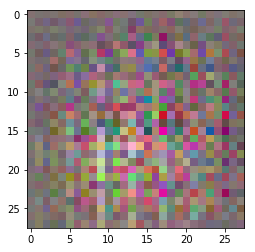

Discriminator Loss: 2.3497... Generator Loss: 10.8490


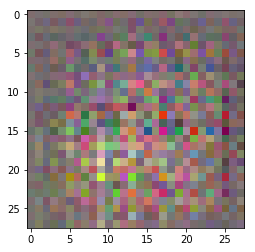

Discriminator Loss: 0.5968... Generator Loss: 5.3272


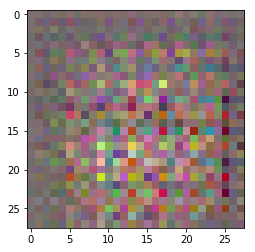

Discriminator Loss: 8.3130... Generator Loss: 0.0006


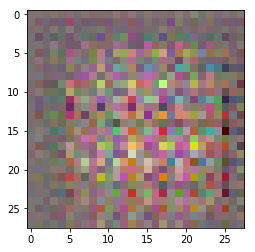

Discriminator Loss: 0.8439... Generator Loss: 6.4318


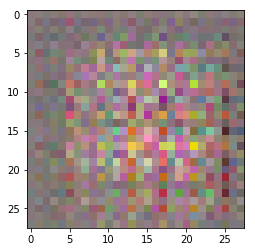

Discriminator Loss: 0.7162... Generator Loss: 5.7076


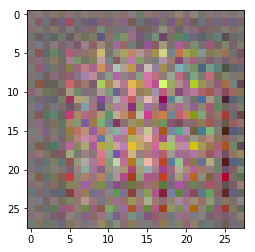

Discriminator Loss: 0.4935... Generator Loss: 2.0785


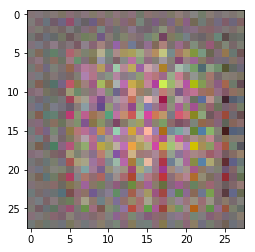

Discriminator Loss: 1.2263... Generator Loss: 0.5766


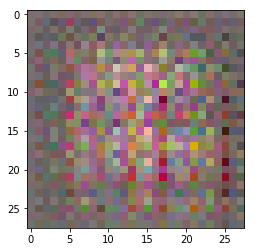

Discriminator Loss: 0.7763... Generator Loss: 6.0915


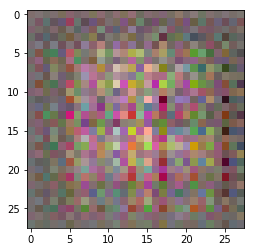

Discriminator Loss: 0.4001... Generator Loss: 5.6852


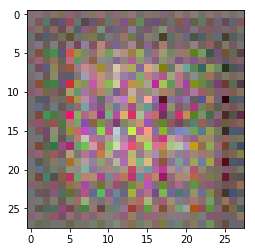

Discriminator Loss: 0.5070... Generator Loss: 2.1459


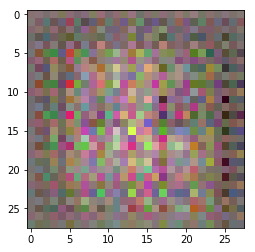

Discriminator Loss: 1.0253... Generator Loss: 0.7420


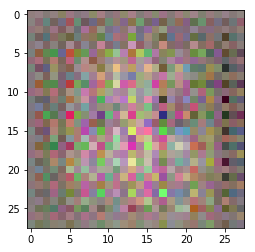

Discriminator Loss: 1.8326... Generator Loss: 7.8429


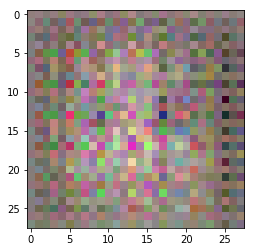

Discriminator Loss: 0.3870... Generator Loss: 5.4267


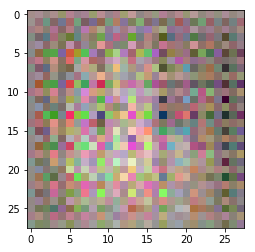

Discriminator Loss: 1.4718... Generator Loss: 0.4452


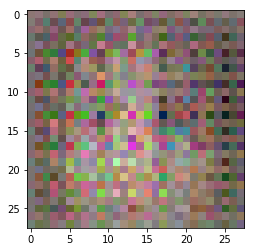

Discriminator Loss: 1.0208... Generator Loss: 7.8926


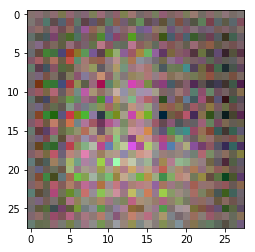

Discriminator Loss: 0.4062... Generator Loss: 6.6418


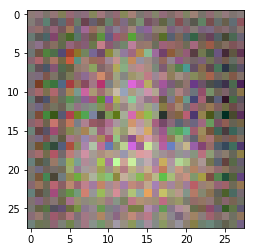

Discriminator Loss: 0.4032... Generator Loss: 4.0330


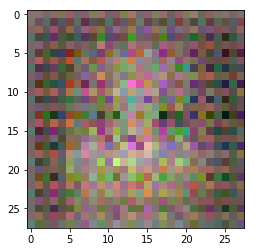

Discriminator Loss: 0.8895... Generator Loss: 0.9734


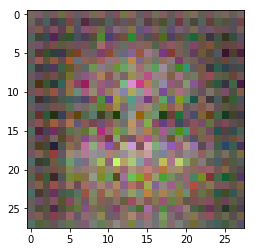

Discriminator Loss: 0.4725... Generator Loss: 4.0110


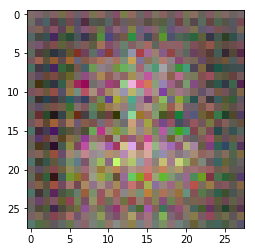

Discriminator Loss: 0.5123... Generator Loss: 2.9562


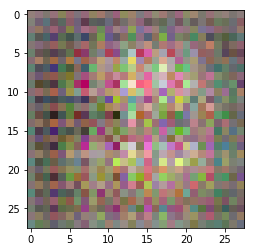

Discriminator Loss: 2.5394... Generator Loss: 0.1354


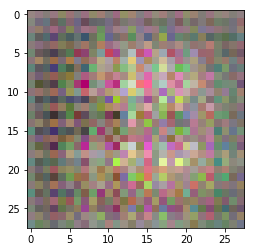

Discriminator Loss: 2.3275... Generator Loss: 8.0574


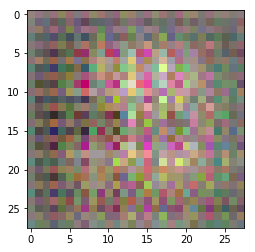

Discriminator Loss: 0.4904... Generator Loss: 6.4139


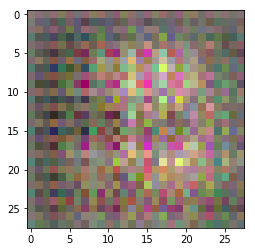

Discriminator Loss: 0.4014... Generator Loss: 4.0856


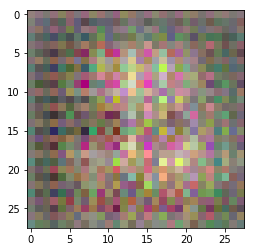

Discriminator Loss: 0.5697... Generator Loss: 2.0315


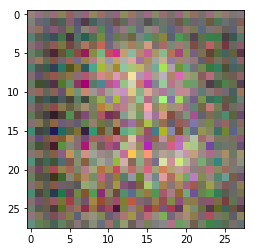

Discriminator Loss: 0.6344... Generator Loss: 1.5391


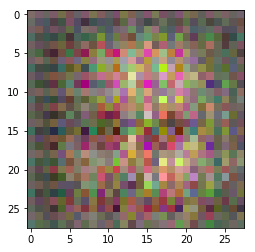

Discriminator Loss: 0.4908... Generator Loss: 2.1711


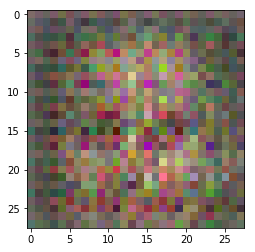

Discriminator Loss: 0.8055... Generator Loss: 1.3637


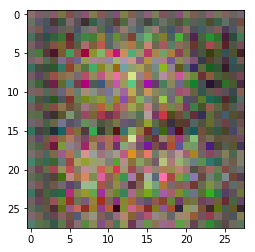

Discriminator Loss: 1.5039... Generator Loss: 0.4573


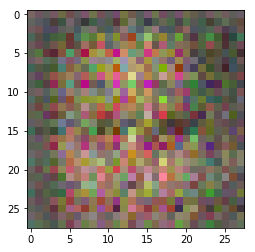

Discriminator Loss: 1.6776... Generator Loss: 5.7108


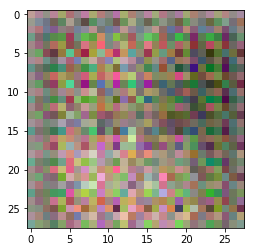

Discriminator Loss: 0.6521... Generator Loss: 1.6827


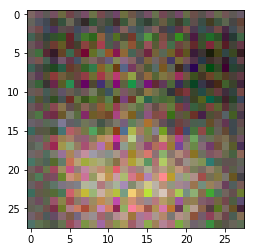

Discriminator Loss: 2.3505... Generator Loss: 0.1558


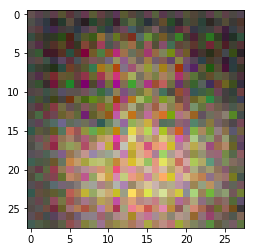

Discriminator Loss: 1.5692... Generator Loss: 5.0110


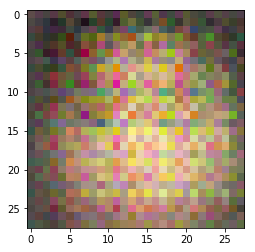

Discriminator Loss: 0.8157... Generator Loss: 1.8300


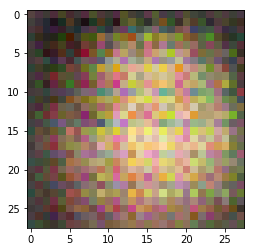

Discriminator Loss: 2.6316... Generator Loss: 0.2245


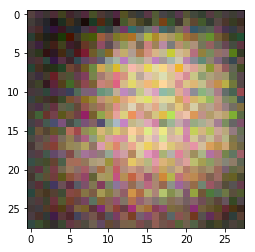

Discriminator Loss: 1.6238... Generator Loss: 2.2370


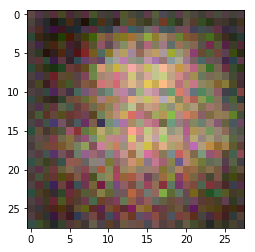

Discriminator Loss: 1.1577... Generator Loss: 2.1412


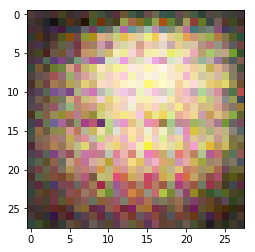

Discriminator Loss: 1.7200... Generator Loss: 0.5298


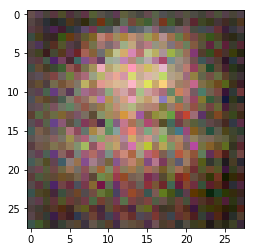

Discriminator Loss: 1.1779... Generator Loss: 3.7659


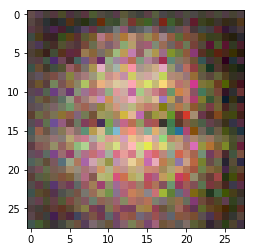

Discriminator Loss: 0.8094... Generator Loss: 2.5740


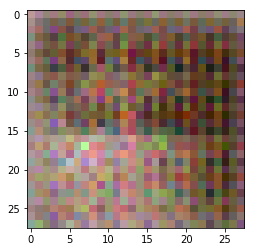

Discriminator Loss: 1.9258... Generator Loss: 0.7541


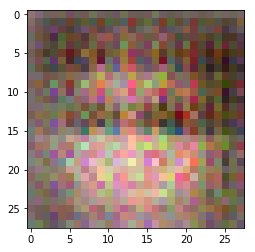

Discriminator Loss: 1.3200... Generator Loss: 2.0515


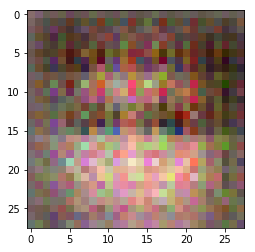

Discriminator Loss: 0.7197... Generator Loss: 2.2661


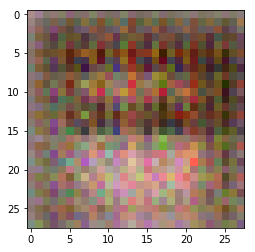

Discriminator Loss: 1.1482... Generator Loss: 0.7474


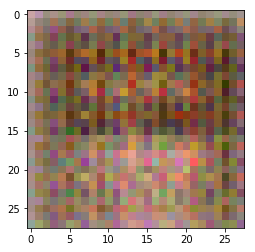

Discriminator Loss: 0.8532... Generator Loss: 3.3531


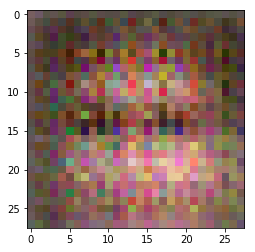

Discriminator Loss: 0.8488... Generator Loss: 1.5119


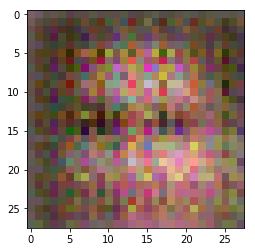

Discriminator Loss: 1.0214... Generator Loss: 1.3716


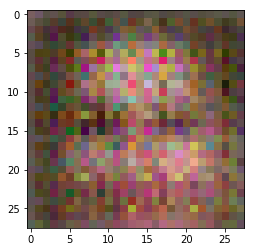

Discriminator Loss: 1.1755... Generator Loss: 1.5961


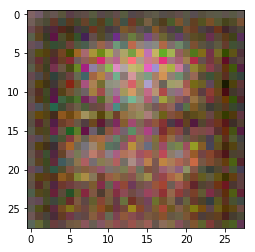

Discriminator Loss: 0.8549... Generator Loss: 2.1469


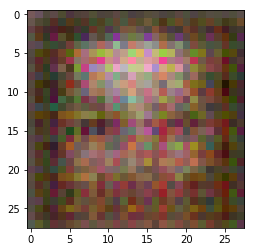

Discriminator Loss: 2.7046... Generator Loss: 0.2016


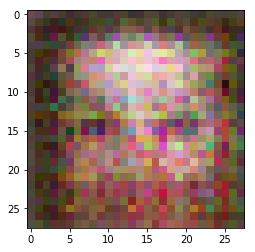

Discriminator Loss: 2.7946... Generator Loss: 7.7732


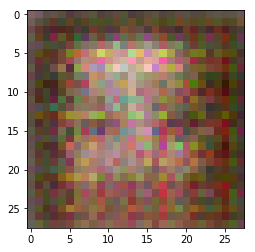

Discriminator Loss: 1.0813... Generator Loss: 5.0731


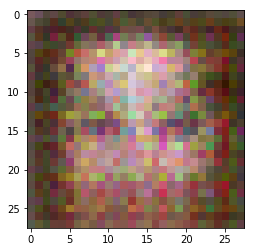

Discriminator Loss: 0.6999... Generator Loss: 1.3907


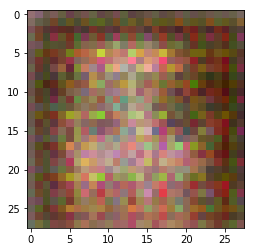

Discriminator Loss: 1.3201... Generator Loss: 0.5296


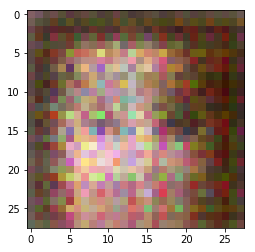

Discriminator Loss: 0.6429... Generator Loss: 1.6034


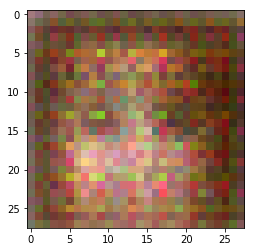

Discriminator Loss: 0.6436... Generator Loss: 2.5202


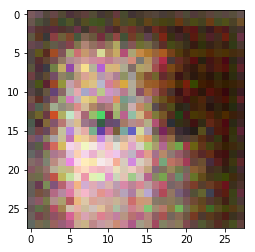

Discriminator Loss: 0.6166... Generator Loss: 1.8942


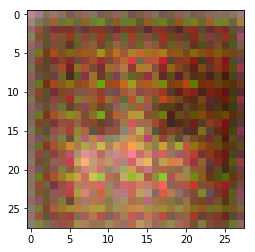

Discriminator Loss: 0.9129... Generator Loss: 0.8808


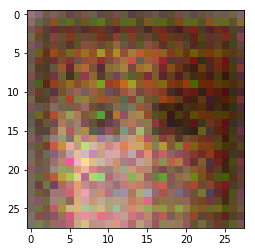

Discriminator Loss: 0.5104... Generator Loss: 2.2326


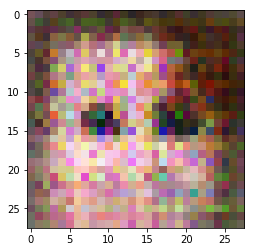

Discriminator Loss: 0.6651... Generator Loss: 1.7006


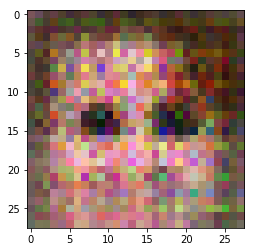

Discriminator Loss: 1.2961... Generator Loss: 0.5778


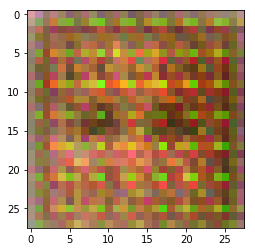

Discriminator Loss: 2.1219... Generator Loss: 0.5286


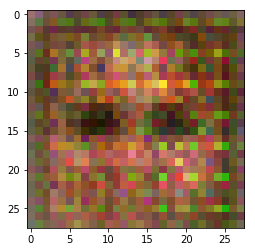

Discriminator Loss: 1.6053... Generator Loss: 3.7315


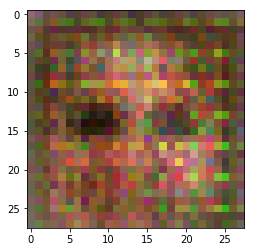

Discriminator Loss: 1.0901... Generator Loss: 2.7895


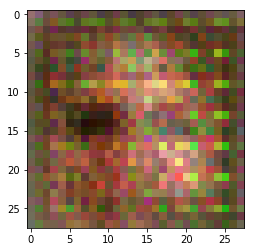

Discriminator Loss: 1.7424... Generator Loss: 0.3767


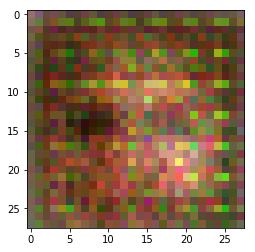

Discriminator Loss: 0.6483... Generator Loss: 4.7717


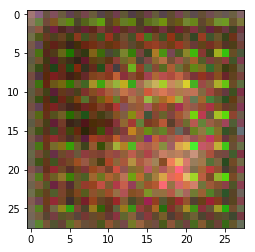

Discriminator Loss: 0.5449... Generator Loss: 3.9565


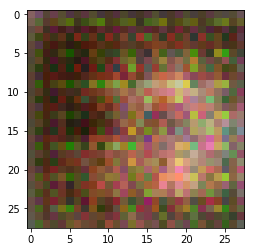

Discriminator Loss: 0.5767... Generator Loss: 1.8751


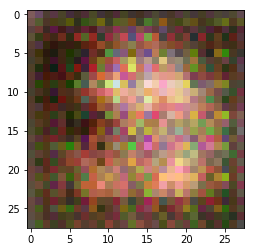

Discriminator Loss: 0.8587... Generator Loss: 1.0339


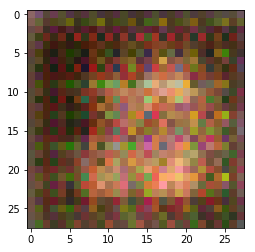

Discriminator Loss: 0.5873... Generator Loss: 2.4449


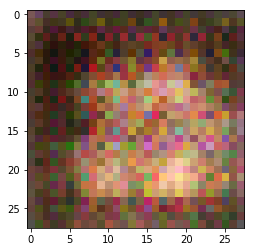

Discriminator Loss: 0.8429... Generator Loss: 1.4691


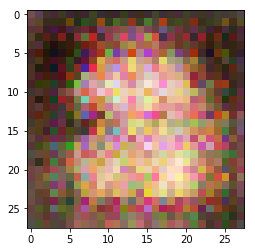

Discriminator Loss: 0.8039... Generator Loss: 2.9539


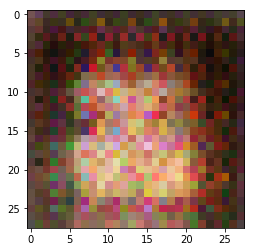

Discriminator Loss: 1.0046... Generator Loss: 0.7763


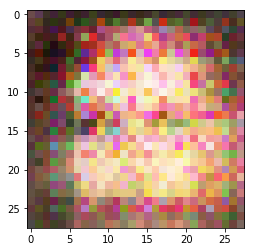

Discriminator Loss: 0.6794... Generator Loss: 2.1609


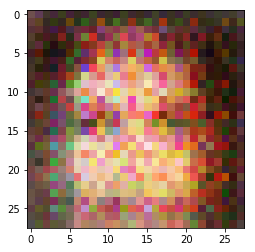

Discriminator Loss: 0.9240... Generator Loss: 1.1710


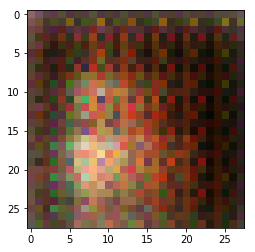

Discriminator Loss: 1.0681... Generator Loss: 4.9489


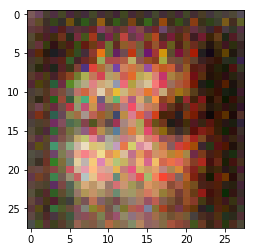

Discriminator Loss: 0.4987... Generator Loss: 3.0505


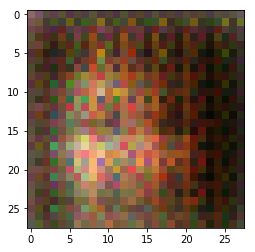

Discriminator Loss: 1.0209... Generator Loss: 0.7843


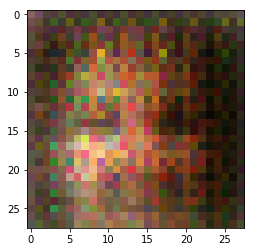

Discriminator Loss: 0.9957... Generator Loss: 4.6022


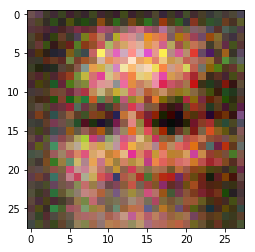

Discriminator Loss: 0.4895... Generator Loss: 2.4508


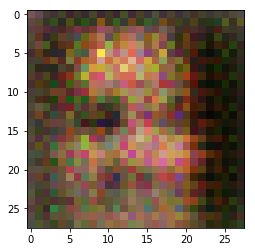

Discriminator Loss: 2.3203... Generator Loss: 0.1769


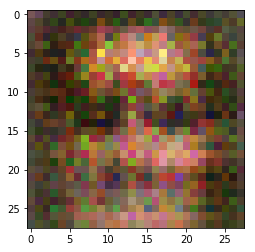

Discriminator Loss: 1.3105... Generator Loss: 4.5339


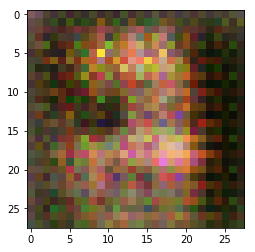

Discriminator Loss: 0.6491... Generator Loss: 3.7734


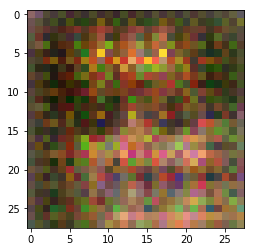

Discriminator Loss: 0.7059... Generator Loss: 1.3591


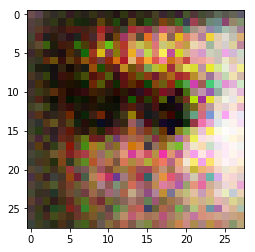

Discriminator Loss: 0.7257... Generator Loss: 1.2432


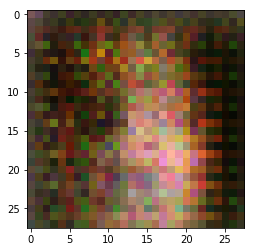

Discriminator Loss: 0.5095... Generator Loss: 2.2290


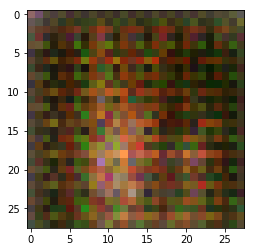

Discriminator Loss: 0.4678... Generator Loss: 2.6728


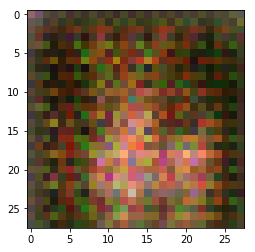

Discriminator Loss: 0.5133... Generator Loss: 2.3218


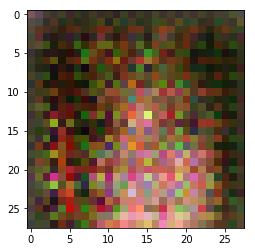

Discriminator Loss: 0.9712... Generator Loss: 0.8167


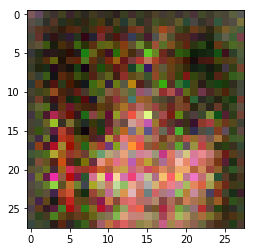

Discriminator Loss: 0.4987... Generator Loss: 5.3939


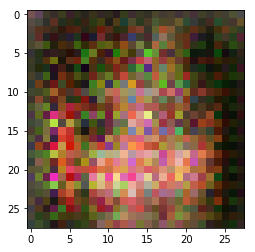

Discriminator Loss: 0.4436... Generator Loss: 4.3611


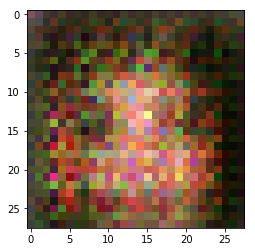

Discriminator Loss: 0.4863... Generator Loss: 2.3592


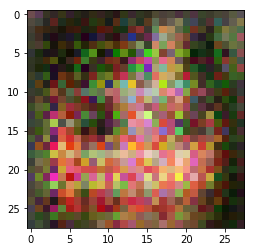

Discriminator Loss: 0.8181... Generator Loss: 1.1429


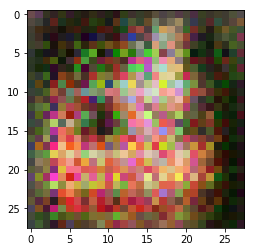

Discriminator Loss: 0.4770... Generator Loss: 3.8923


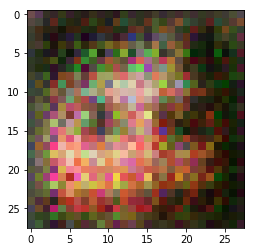

Discriminator Loss: 0.5727... Generator Loss: 2.8488


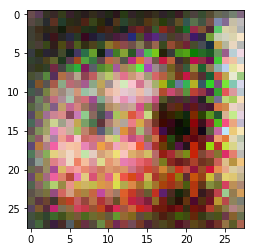

Discriminator Loss: 2.0338... Generator Loss: 0.2457


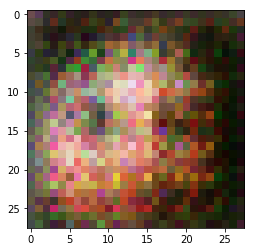

Discriminator Loss: 2.4652... Generator Loss: 8.1104


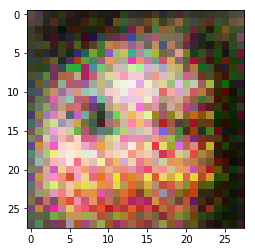

Discriminator Loss: 0.5787... Generator Loss: 6.9623


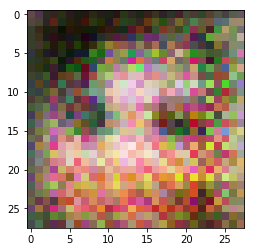

Discriminator Loss: 0.4188... Generator Loss: 3.9755


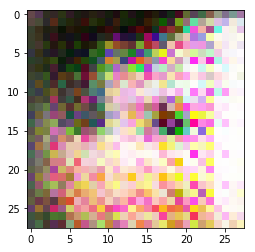

Discriminator Loss: 0.6527... Generator Loss: 1.9042


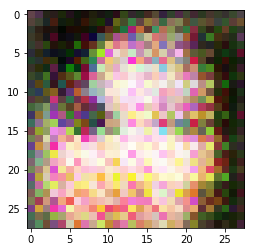

Discriminator Loss: 0.6904... Generator Loss: 1.5511


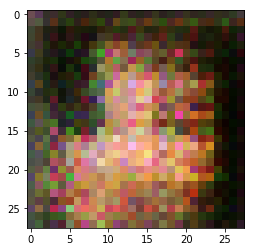

Discriminator Loss: 0.5376... Generator Loss: 2.0733


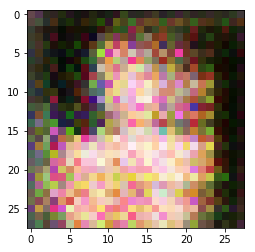

Discriminator Loss: 0.4833... Generator Loss: 2.7692


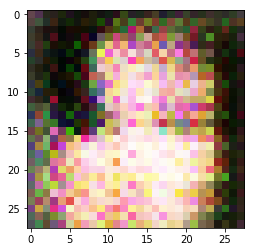

Discriminator Loss: 0.5189... Generator Loss: 2.5434


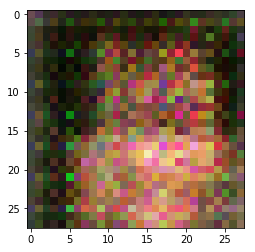

Discriminator Loss: 0.5392... Generator Loss: 1.9293


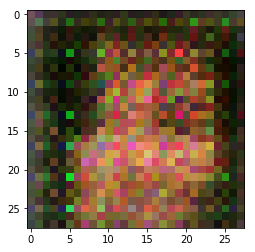

Discriminator Loss: 0.6135... Generator Loss: 1.7283


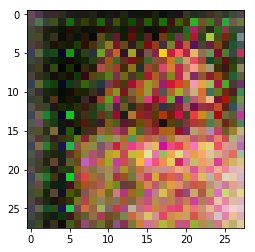

Discriminator Loss: 0.9019... Generator Loss: 1.1607


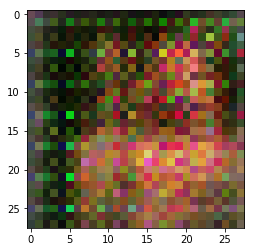

Discriminator Loss: 0.7333... Generator Loss: 2.2253


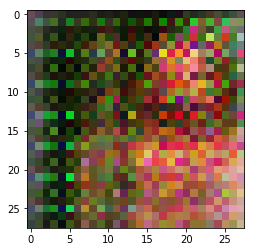

Discriminator Loss: 1.5455... Generator Loss: 0.5322


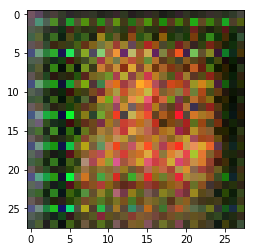

Discriminator Loss: 0.6690... Generator Loss: 4.4904


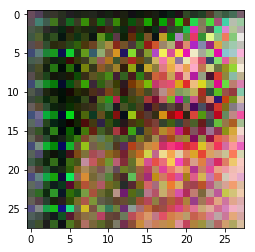

Discriminator Loss: 0.4285... Generator Loss: 4.6758


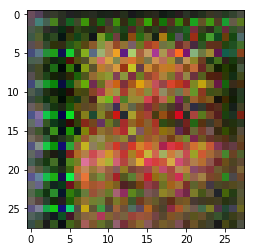

Discriminator Loss: 0.4752... Generator Loss: 2.8705


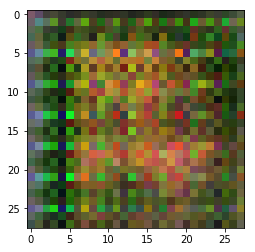

Discriminator Loss: 0.6438... Generator Loss: 1.9093


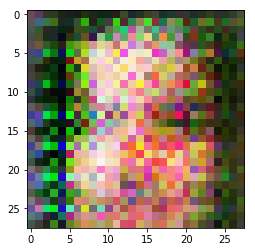

Discriminator Loss: 0.6003... Generator Loss: 1.9654


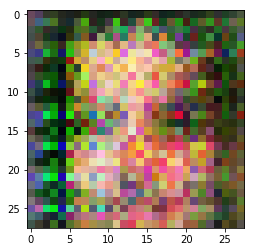

Discriminator Loss: 0.8553... Generator Loss: 1.1686


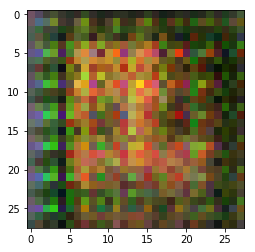

Discriminator Loss: 0.6343... Generator Loss: 1.5591


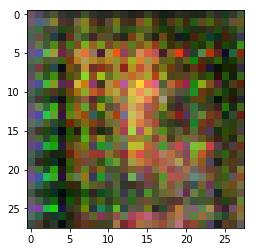

Discriminator Loss: 0.7226... Generator Loss: 1.4716


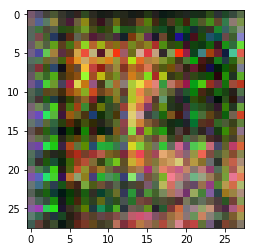

Discriminator Loss: 0.8294... Generator Loss: 3.5711


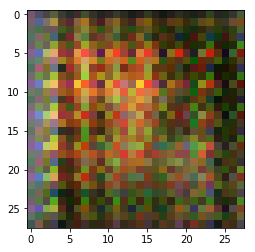

Discriminator Loss: 1.1065... Generator Loss: 0.8457


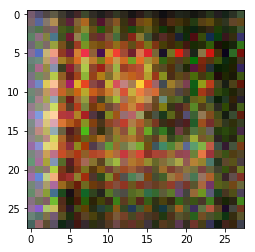

Discriminator Loss: 0.8101... Generator Loss: 4.4462


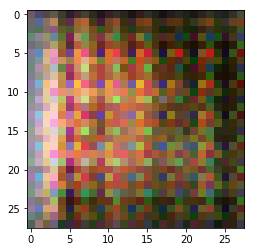

Discriminator Loss: 1.6582... Generator Loss: 0.4335


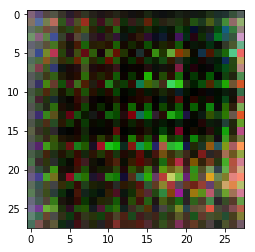

Discriminator Loss: 1.1114... Generator Loss: 6.4512


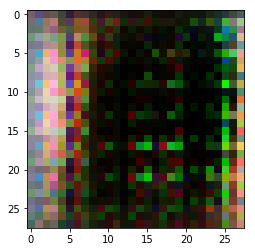

Discriminator Loss: 0.6441... Generator Loss: 4.2839


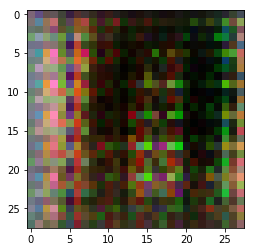

Discriminator Loss: 0.9287... Generator Loss: 1.5964


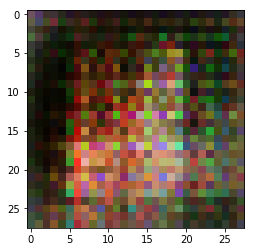

Discriminator Loss: 1.0781... Generator Loss: 0.8468


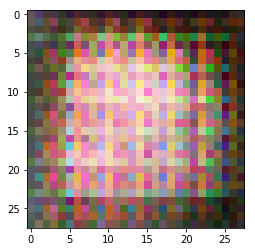

Discriminator Loss: 1.0258... Generator Loss: 2.4996


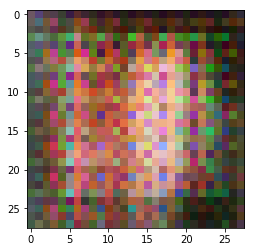

Discriminator Loss: 1.1605... Generator Loss: 0.8449


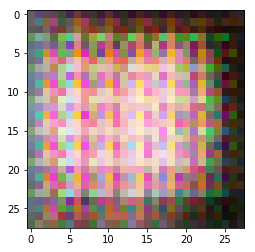

Discriminator Loss: 1.2252... Generator Loss: 1.1432


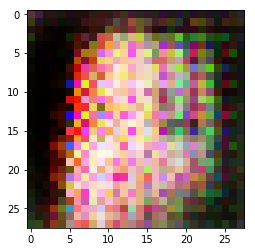

Discriminator Loss: 1.0803... Generator Loss: 5.6357


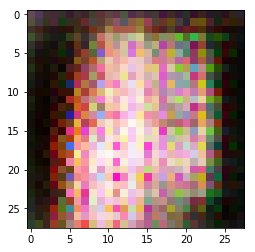

Discriminator Loss: 1.7905... Generator Loss: 0.5838


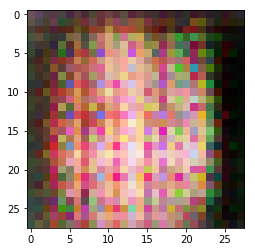

Discriminator Loss: 2.0179... Generator Loss: 6.9164


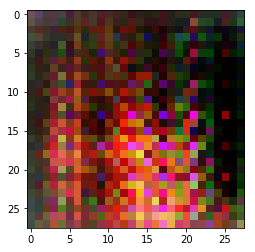

Discriminator Loss: 0.6549... Generator Loss: 3.0097


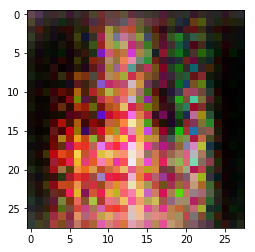

Discriminator Loss: 1.6406... Generator Loss: 0.4980


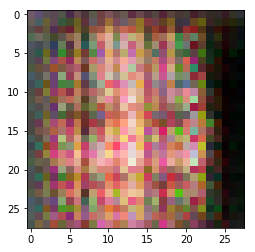

Discriminator Loss: 0.5406... Generator Loss: 3.4159


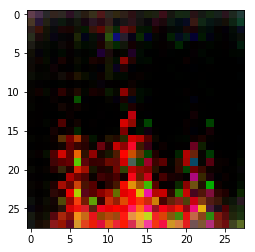

Discriminator Loss: 0.5734... Generator Loss: 4.0091


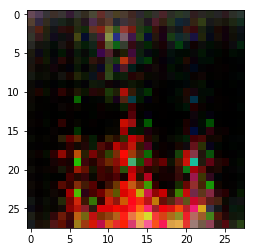

Discriminator Loss: 0.5001... Generator Loss: 2.6965


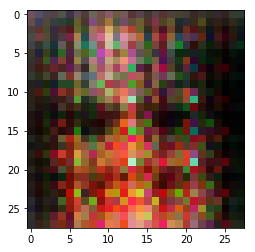

Discriminator Loss: 1.3913... Generator Loss: 0.5757


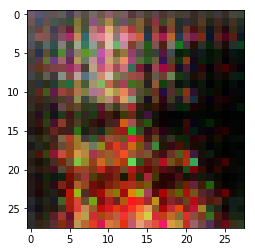

Discriminator Loss: 0.5177... Generator Loss: 2.9170


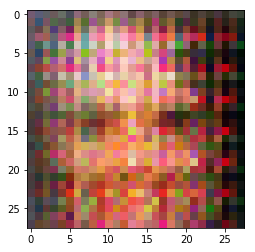

Discriminator Loss: 0.5460... Generator Loss: 2.6141


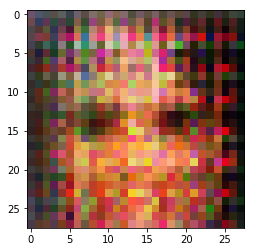

Discriminator Loss: 1.9253... Generator Loss: 0.3234


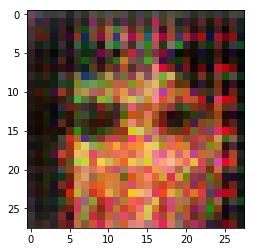

Discriminator Loss: 1.6993... Generator Loss: 7.4804


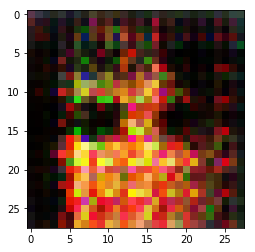

Discriminator Loss: 0.8156... Generator Loss: 6.1366


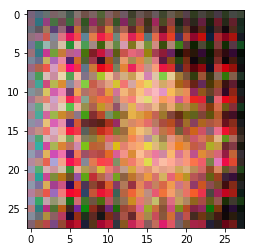

Discriminator Loss: 0.4255... Generator Loss: 3.2743


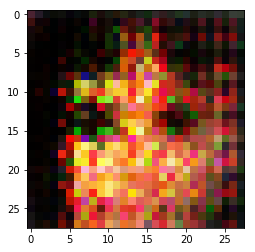

Discriminator Loss: 1.8592... Generator Loss: 0.2759


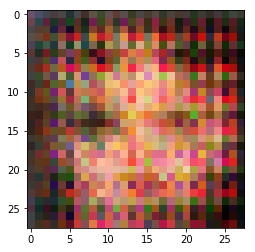

Discriminator Loss: 0.5264... Generator Loss: 3.0555


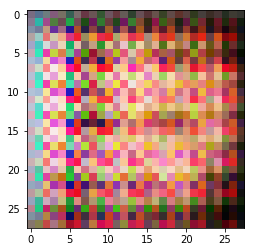

Discriminator Loss: 0.6171... Generator Loss: 3.4010


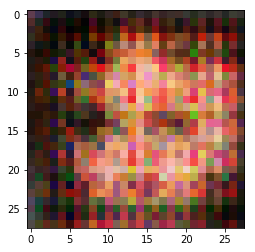

Discriminator Loss: 0.5394... Generator Loss: 2.1523


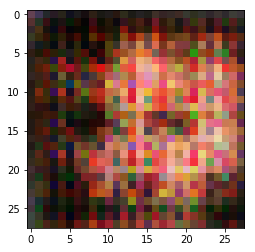

Discriminator Loss: 1.9759... Generator Loss: 0.2462


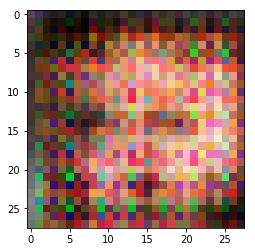

Discriminator Loss: 1.6905... Generator Loss: 7.2934


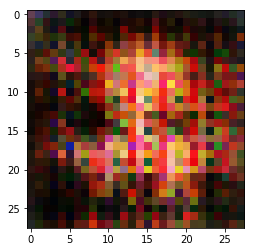

Discriminator Loss: 0.7670... Generator Loss: 6.5904


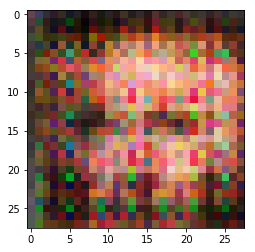

Discriminator Loss: 0.3972... Generator Loss: 4.2347


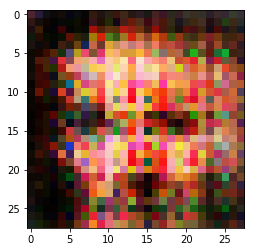

Discriminator Loss: 0.6432... Generator Loss: 1.9127


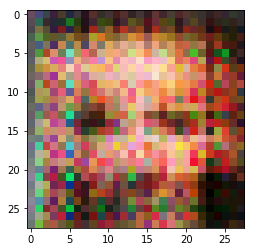

Discriminator Loss: 0.9759... Generator Loss: 0.9633


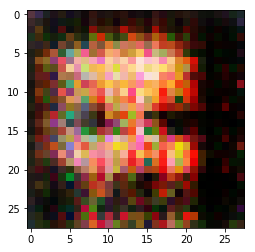

Discriminator Loss: 0.4665... Generator Loss: 2.7111


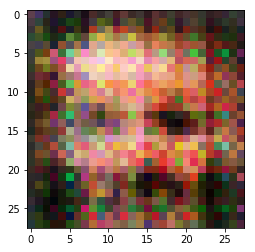

Discriminator Loss: 0.5385... Generator Loss: 2.7620


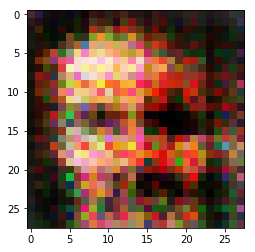

Discriminator Loss: 1.5817... Generator Loss: 0.4768


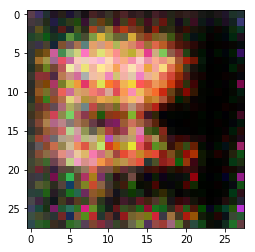

Discriminator Loss: 1.1849... Generator Loss: 2.7773


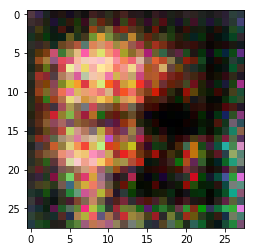

Discriminator Loss: 0.8270... Generator Loss: 1.9029


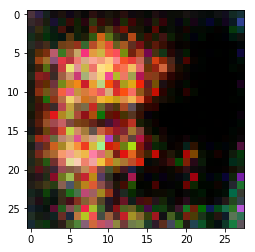

Discriminator Loss: 0.8954... Generator Loss: 1.1035


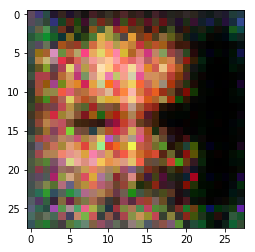

Discriminator Loss: 0.5872... Generator Loss: 2.7854


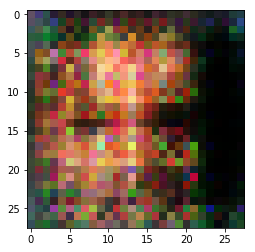

Discriminator Loss: 0.6671... Generator Loss: 1.6114


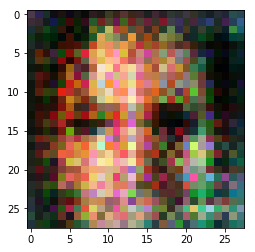

Discriminator Loss: 1.2597... Generator Loss: 0.6597


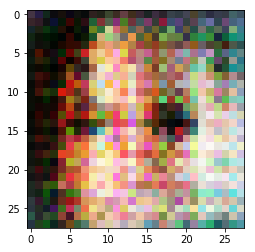

Discriminator Loss: 1.1344... Generator Loss: 2.1763


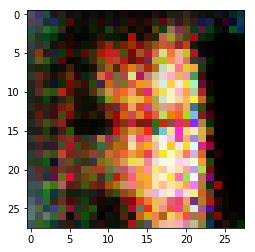

Discriminator Loss: 0.9032... Generator Loss: 1.3313


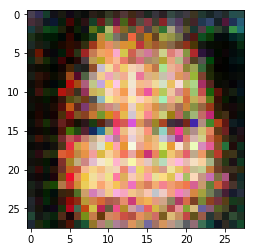

Discriminator Loss: 0.8002... Generator Loss: 1.4698


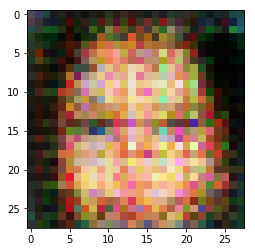

Discriminator Loss: 0.9732... Generator Loss: 1.0239


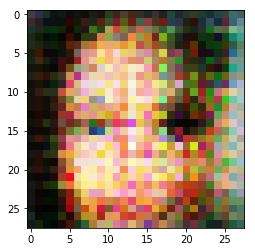

Discriminator Loss: 0.9058... Generator Loss: 1.5904


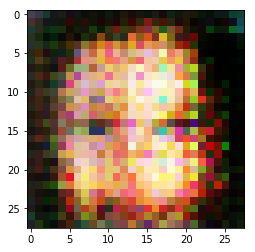

Discriminator Loss: 0.8710... Generator Loss: 1.2039


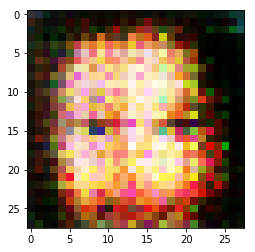

Discriminator Loss: 0.6577... Generator Loss: 1.9776


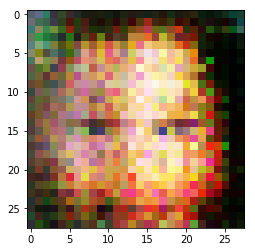

Discriminator Loss: 0.9167... Generator Loss: 0.9620


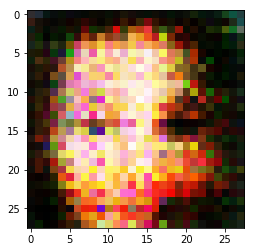

Discriminator Loss: 0.9336... Generator Loss: 2.9657


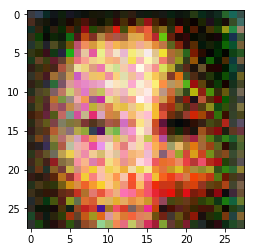

Discriminator Loss: 0.8391... Generator Loss: 1.1303


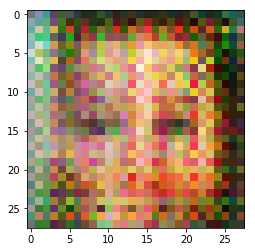

Discriminator Loss: 1.4545... Generator Loss: 0.4492


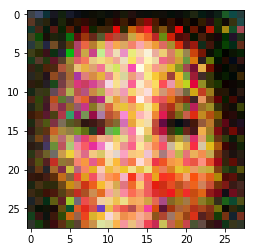

Discriminator Loss: 1.5859... Generator Loss: 5.1817


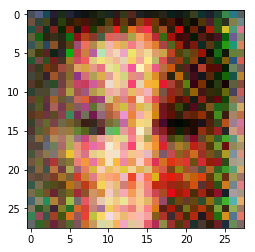

Discriminator Loss: 0.7163... Generator Loss: 2.1451


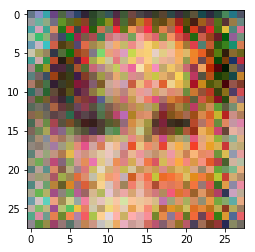

Discriminator Loss: 1.8107... Generator Loss: 0.3163


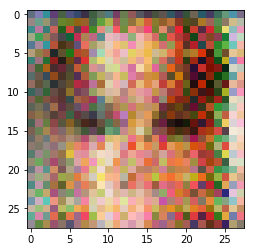

Discriminator Loss: 0.8001... Generator Loss: 3.5870


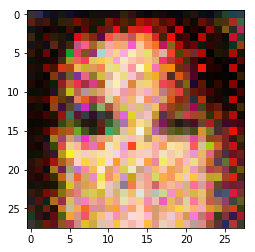

Discriminator Loss: 0.7516... Generator Loss: 2.6174


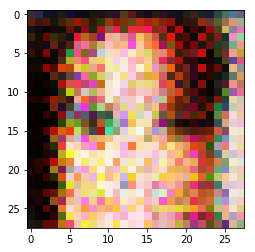

Discriminator Loss: 0.9428... Generator Loss: 0.9204


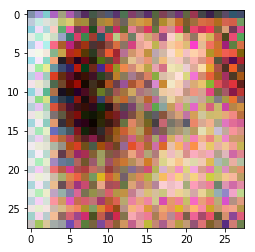

Discriminator Loss: 1.0664... Generator Loss: 0.7898


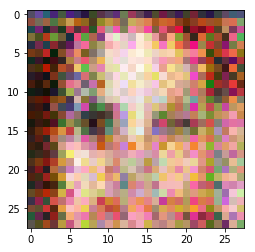

Discriminator Loss: 0.8177... Generator Loss: 1.6476


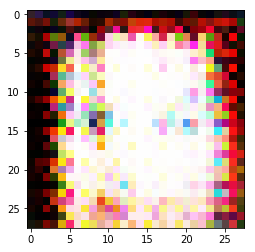

Discriminator Loss: 0.8099... Generator Loss: 1.2420


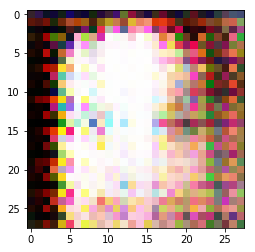

Discriminator Loss: 0.6876... Generator Loss: 1.4258


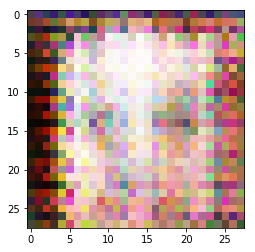

Discriminator Loss: 0.7230... Generator Loss: 1.3738


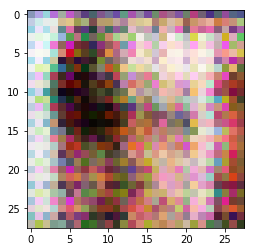

Discriminator Loss: 0.9057... Generator Loss: 1.0333


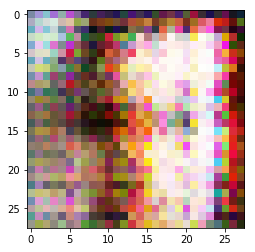

Discriminator Loss: 0.9734... Generator Loss: 1.0820


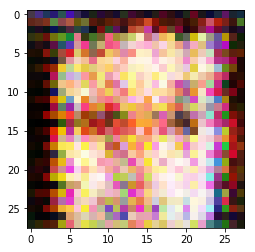

Discriminator Loss: 1.4527... Generator Loss: 0.6903


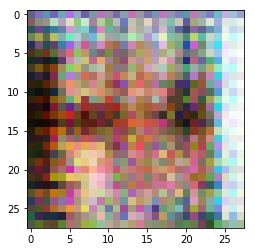

Discriminator Loss: 0.9634... Generator Loss: 2.7157


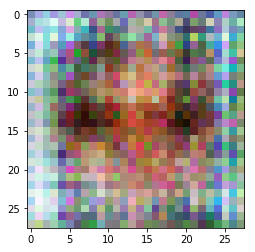

Discriminator Loss: 1.1923... Generator Loss: 0.6529


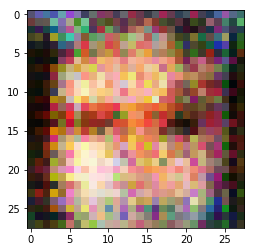

Discriminator Loss: 0.8603... Generator Loss: 1.6553


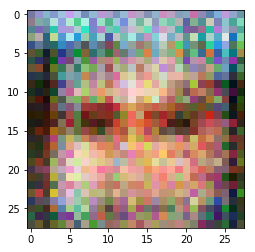

Discriminator Loss: 1.3082... Generator Loss: 0.6783


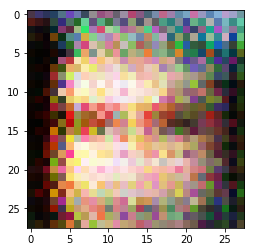

Discriminator Loss: 1.1277... Generator Loss: 1.3192


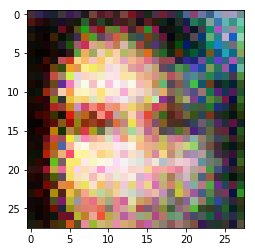

Discriminator Loss: 1.3033... Generator Loss: 0.9586


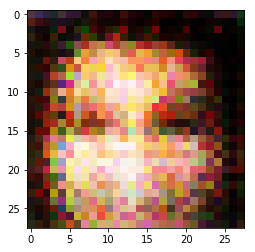

Discriminator Loss: 2.3469... Generator Loss: 0.7760


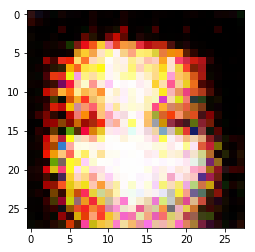

Discriminator Loss: 2.4453... Generator Loss: 3.5721


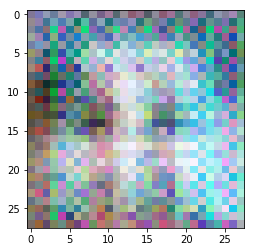

Discriminator Loss: 1.4189... Generator Loss: 0.9609


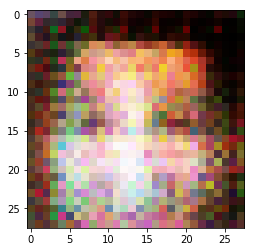

Discriminator Loss: 1.4905... Generator Loss: 0.8658


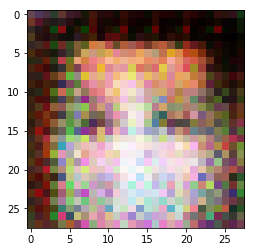

Discriminator Loss: 0.7026... Generator Loss: 2.6318


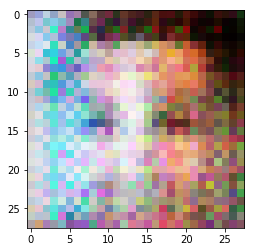

Discriminator Loss: 0.6291... Generator Loss: 1.9004


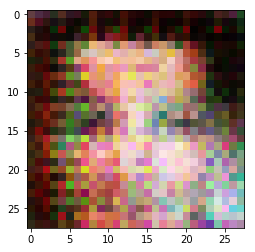

Discriminator Loss: 1.1340... Generator Loss: 0.8391


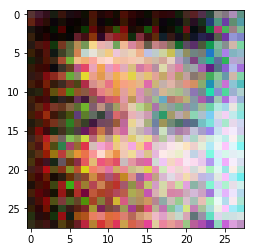

Discriminator Loss: 1.1867... Generator Loss: 1.7029


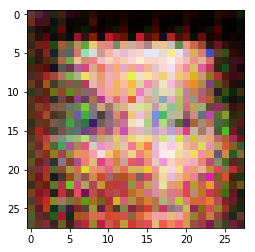

Discriminator Loss: 1.2958... Generator Loss: 0.7220


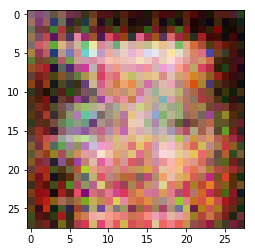

Discriminator Loss: 1.2250... Generator Loss: 1.9986


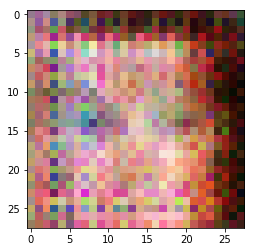

Discriminator Loss: 1.0478... Generator Loss: 0.8638


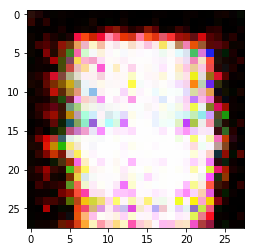

Discriminator Loss: 1.1108... Generator Loss: 1.0961


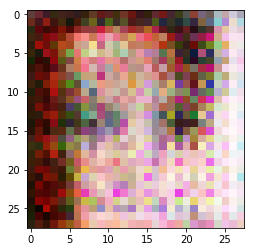

Discriminator Loss: 1.4267... Generator Loss: 0.5543


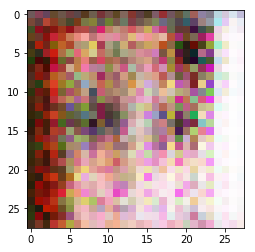

Discriminator Loss: 1.4763... Generator Loss: 2.9028


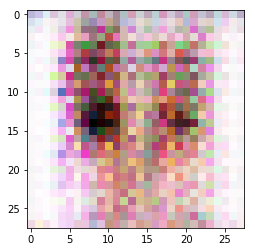

Discriminator Loss: 1.2599... Generator Loss: 0.6702


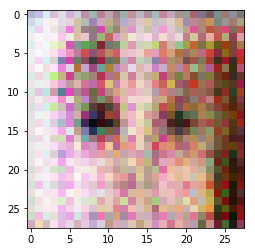

Discriminator Loss: 0.8636... Generator Loss: 1.3072


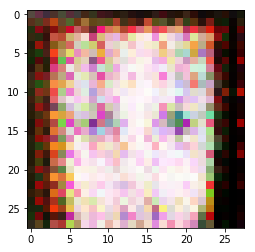

Discriminator Loss: 0.8481... Generator Loss: 1.6117


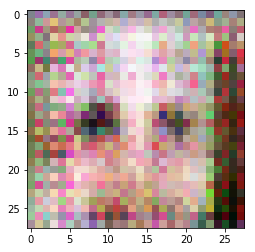

Discriminator Loss: 1.3142... Generator Loss: 0.5369


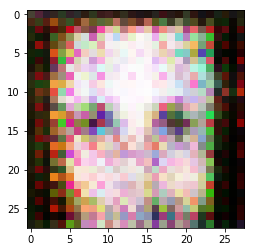

Discriminator Loss: 1.0830... Generator Loss: 2.4351


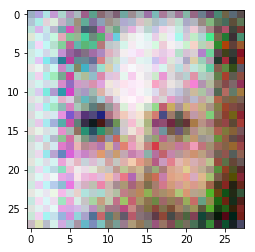

Discriminator Loss: 1.5281... Generator Loss: 0.4147


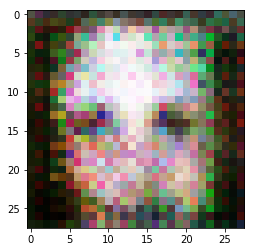

Discriminator Loss: 0.9682... Generator Loss: 2.7853


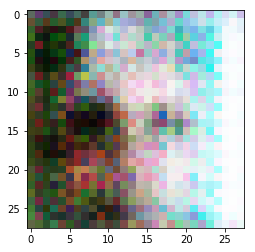

Discriminator Loss: 1.0547... Generator Loss: 0.9067


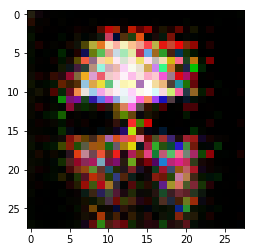

Discriminator Loss: 1.2462... Generator Loss: 0.7173


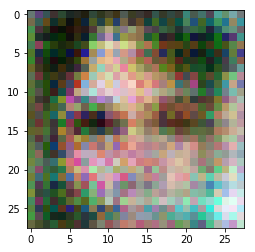

Discriminator Loss: 1.2220... Generator Loss: 2.1643


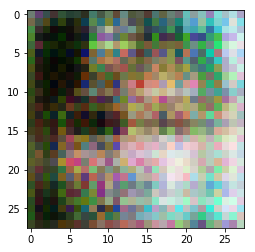

Discriminator Loss: 1.1709... Generator Loss: 0.9262


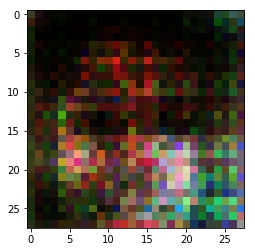

Discriminator Loss: 0.9902... Generator Loss: 2.0654


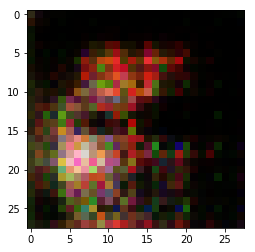

Discriminator Loss: 0.8182... Generator Loss: 1.2156


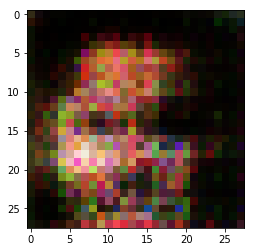

Discriminator Loss: 1.1001... Generator Loss: 1.0644


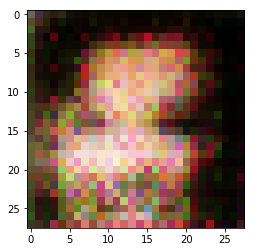

Discriminator Loss: 1.3413... Generator Loss: 1.1888


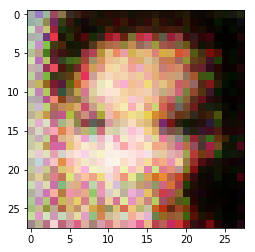

Discriminator Loss: 1.6513... Generator Loss: 0.5160


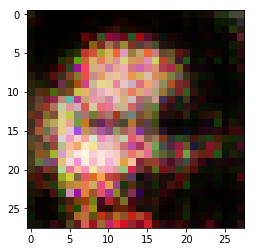

Discriminator Loss: 1.4227... Generator Loss: 1.3494


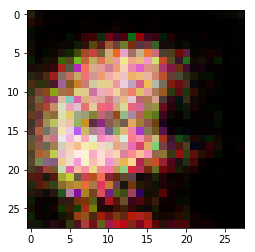

Discriminator Loss: 1.6614... Generator Loss: 0.4123


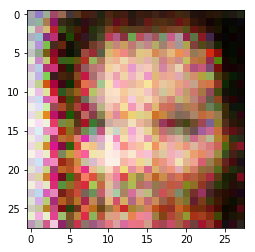

Discriminator Loss: 0.8433... Generator Loss: 2.1428


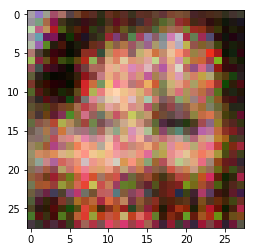

Discriminator Loss: 0.9771... Generator Loss: 1.0888


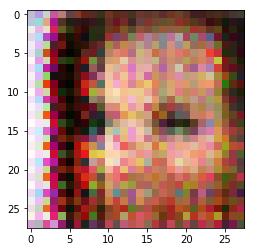

Discriminator Loss: 1.3702... Generator Loss: 0.6364


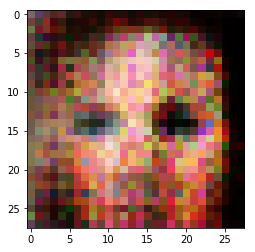

Discriminator Loss: 0.9515... Generator Loss: 2.5691


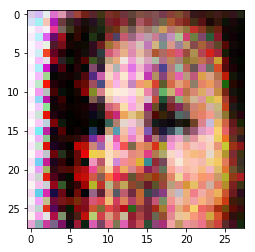

Discriminator Loss: 1.0025... Generator Loss: 1.0192


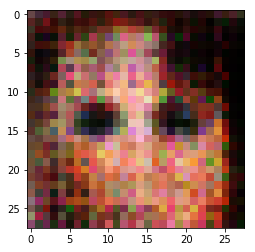

Discriminator Loss: 1.5374... Generator Loss: 0.4470


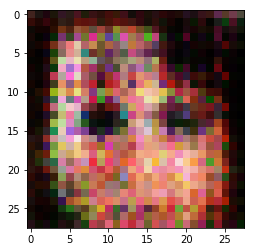

Discriminator Loss: 1.7432... Generator Loss: 3.0689


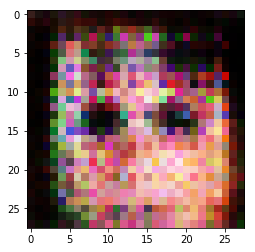

Discriminator Loss: 1.2084... Generator Loss: 0.9883


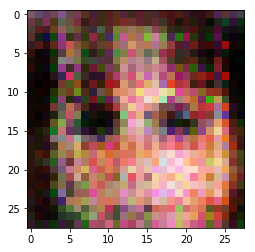

Discriminator Loss: 1.0635... Generator Loss: 0.8056


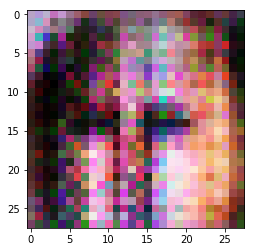

Discriminator Loss: 0.9830... Generator Loss: 1.9630


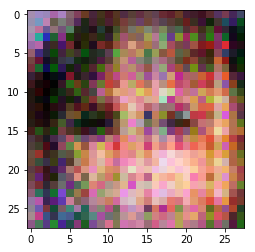

Discriminator Loss: 1.1993... Generator Loss: 0.6925


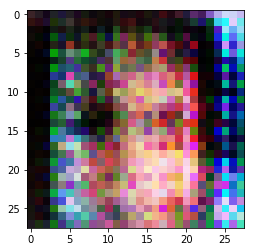

Discriminator Loss: 1.0905... Generator Loss: 0.8993


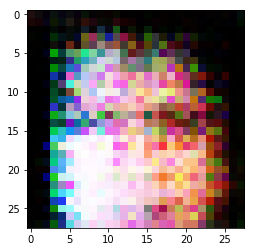

Discriminator Loss: 0.8672... Generator Loss: 2.1436


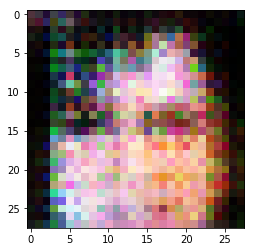

Discriminator Loss: 1.2061... Generator Loss: 0.7020


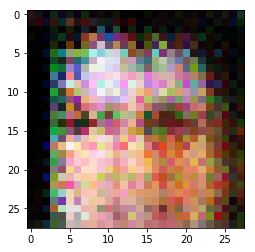

Discriminator Loss: 1.0694... Generator Loss: 1.4846


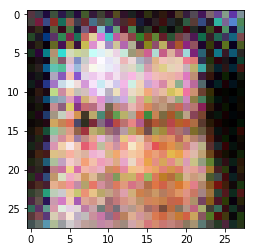

Discriminator Loss: 0.9850... Generator Loss: 1.4169


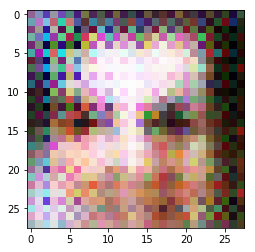

Discriminator Loss: 1.1483... Generator Loss: 0.8250


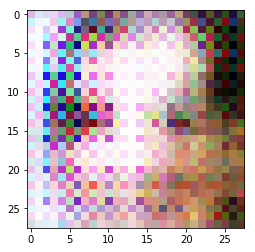

Discriminator Loss: 1.4324... Generator Loss: 0.6792


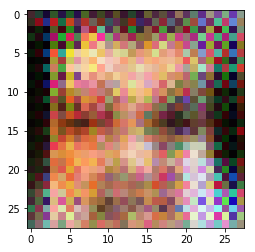

Discriminator Loss: 1.5596... Generator Loss: 3.9188


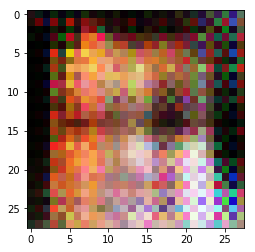

Discriminator Loss: 1.1684... Generator Loss: 0.9657


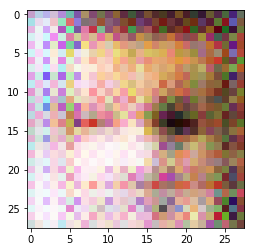

Discriminator Loss: 1.3627... Generator Loss: 0.9001


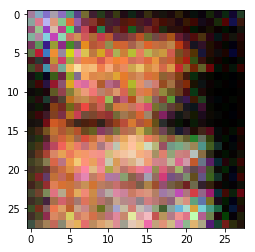

Discriminator Loss: 1.0799... Generator Loss: 3.3866


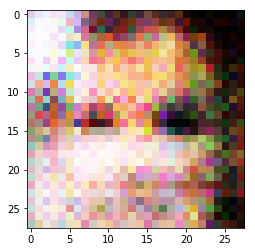

Discriminator Loss: 0.9477... Generator Loss: 1.0119


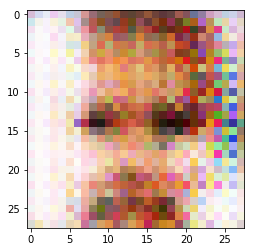

Discriminator Loss: 0.9653... Generator Loss: 1.2579


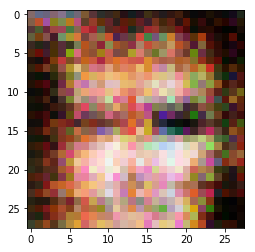

Discriminator Loss: 0.9525... Generator Loss: 1.9426


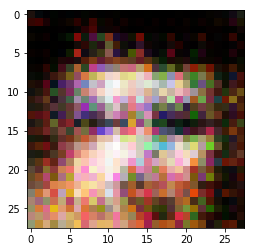

Discriminator Loss: 1.1264... Generator Loss: 0.8495


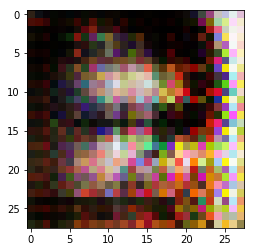

Discriminator Loss: 0.9127... Generator Loss: 1.3742


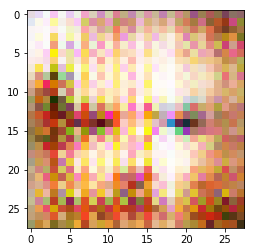

Discriminator Loss: 0.9988... Generator Loss: 0.9522


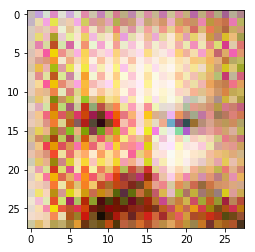

Discriminator Loss: 0.9209... Generator Loss: 3.1632


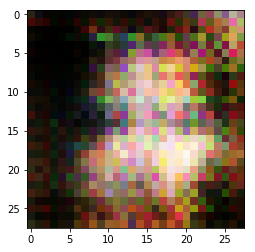

Discriminator Loss: 1.9598... Generator Loss: 0.3070


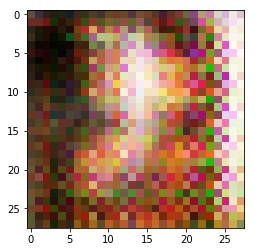

Discriminator Loss: 1.8389... Generator Loss: 4.1092


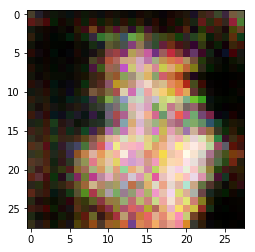

Discriminator Loss: 0.8266... Generator Loss: 2.2156


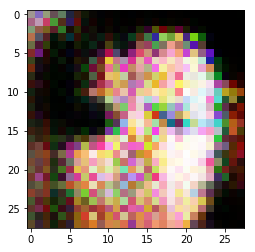

Discriminator Loss: 1.3267... Generator Loss: 0.5383


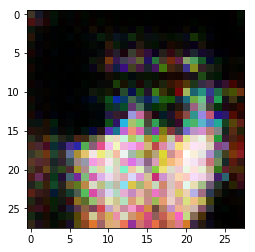

Discriminator Loss: 1.0889... Generator Loss: 1.0455


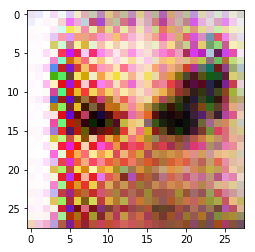

Discriminator Loss: 1.0486... Generator Loss: 1.3772


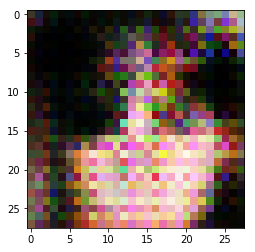

Discriminator Loss: 1.2467... Generator Loss: 0.7665


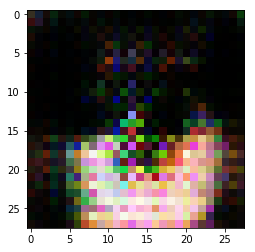

Discriminator Loss: 1.1693... Generator Loss: 2.0979


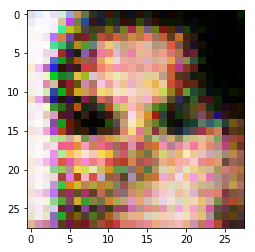

Discriminator Loss: 0.8902... Generator Loss: 1.0192


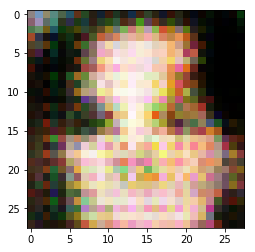

Discriminator Loss: 1.0224... Generator Loss: 1.6202


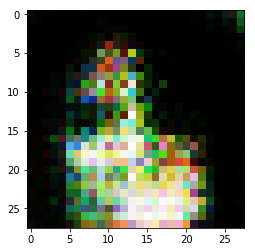

Discriminator Loss: 1.6393... Generator Loss: 0.4490


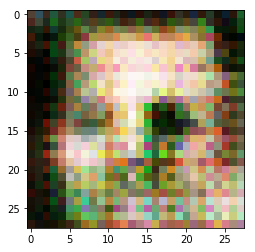

Discriminator Loss: 1.3704... Generator Loss: 1.3555


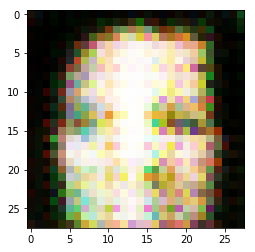

Discriminator Loss: 1.5490... Generator Loss: 0.6080


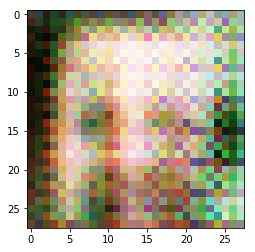

Discriminator Loss: 1.2432... Generator Loss: 1.7423


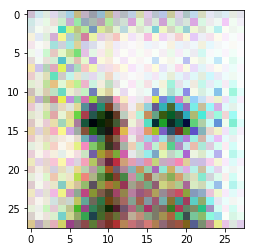

Discriminator Loss: 0.7843... Generator Loss: 1.3952


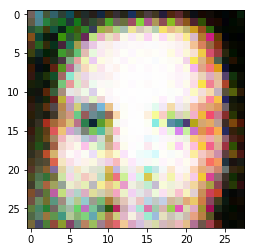

Discriminator Loss: 0.8051... Generator Loss: 1.1949


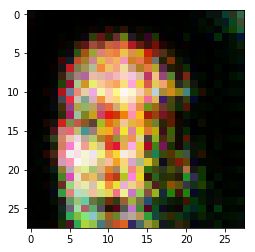

Discriminator Loss: 0.8815... Generator Loss: 1.1154


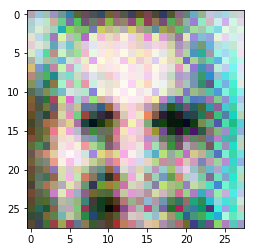

Discriminator Loss: 0.9627... Generator Loss: 1.2944


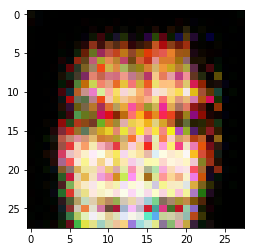

Discriminator Loss: 1.4242... Generator Loss: 0.4950


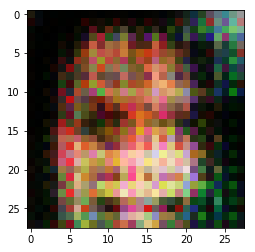

Discriminator Loss: 1.2611... Generator Loss: 1.2329


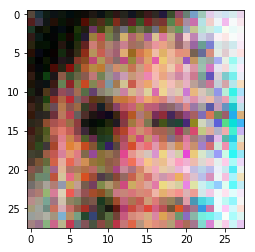

Discriminator Loss: 1.6239... Generator Loss: 0.4514


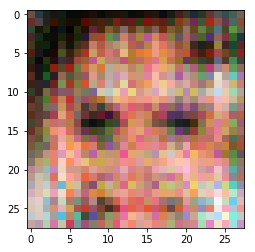

Discriminator Loss: 1.4717... Generator Loss: 2.4564


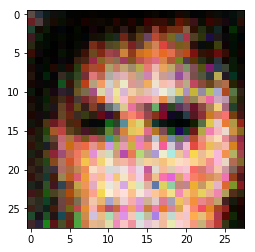

Discriminator Loss: 1.4345... Generator Loss: 0.5279


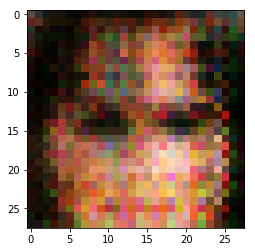

Discriminator Loss: 1.0785... Generator Loss: 3.4890


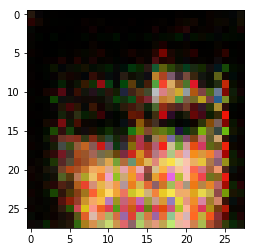

Discriminator Loss: 0.9412... Generator Loss: 1.2649


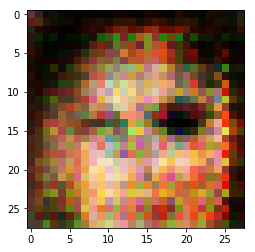

Discriminator Loss: 0.8960... Generator Loss: 1.0101


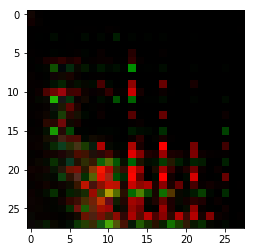

Discriminator Loss: 0.7159... Generator Loss: 1.9076


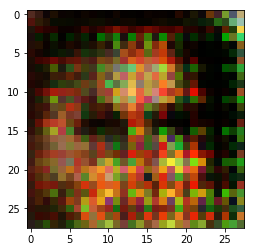

Discriminator Loss: 1.0110... Generator Loss: 0.9274


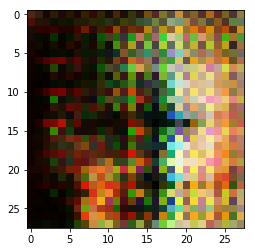

Discriminator Loss: 0.8968... Generator Loss: 1.2703


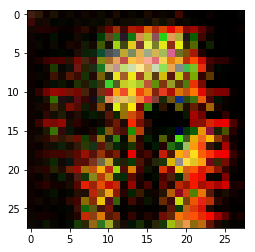

Discriminator Loss: 0.9069... Generator Loss: 1.2253


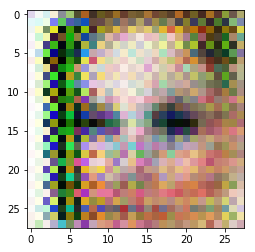

Discriminator Loss: 0.9458... Generator Loss: 1.1321


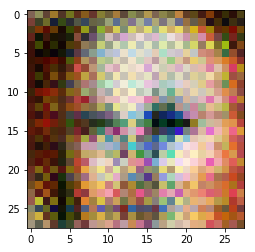

Discriminator Loss: 0.7472... Generator Loss: 1.7390


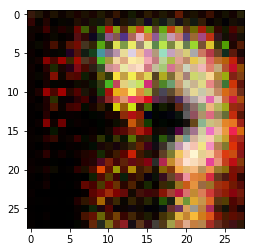

Discriminator Loss: 1.4581... Generator Loss: 0.5625


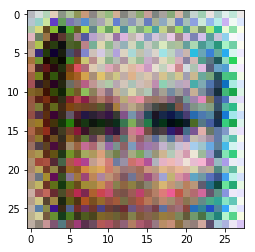

Discriminator Loss: 1.2134... Generator Loss: 3.7441


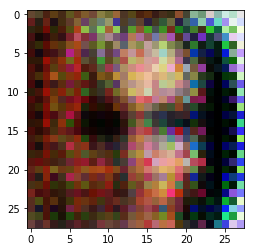

Discriminator Loss: 0.6287... Generator Loss: 1.7423


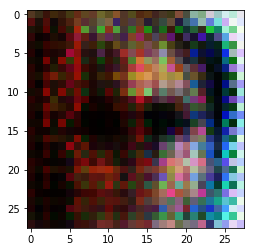

Discriminator Loss: 1.1120... Generator Loss: 0.7477


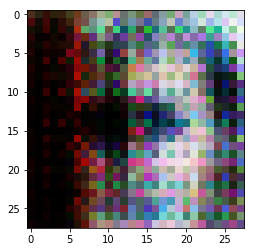

Discriminator Loss: 1.0339... Generator Loss: 3.1268


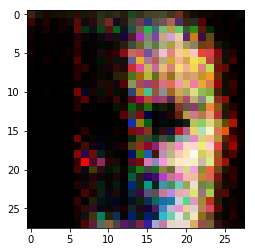

Discriminator Loss: 0.5897... Generator Loss: 2.2186


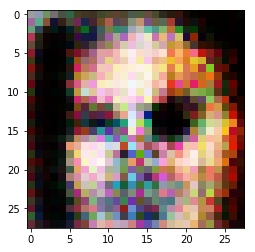

Discriminator Loss: 0.9584... Generator Loss: 0.8947


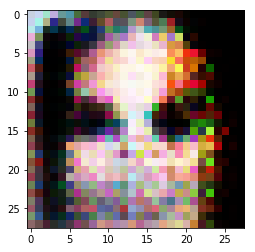

Discriminator Loss: 0.8105... Generator Loss: 1.8675


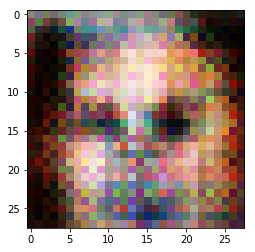

Discriminator Loss: 0.7756... Generator Loss: 1.6555


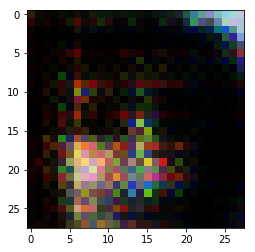

Discriminator Loss: 2.3977... Generator Loss: 0.1819


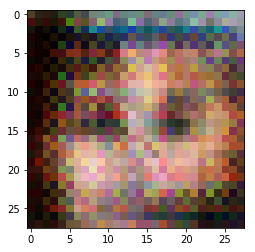

Discriminator Loss: 2.8735... Generator Loss: 5.4341


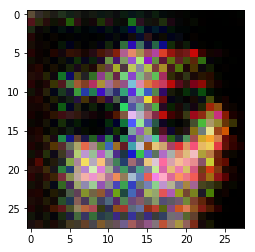

Discriminator Loss: 1.0272... Generator Loss: 3.3657


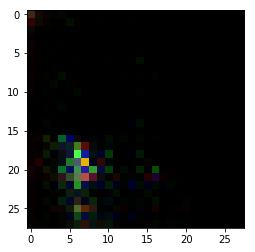

Discriminator Loss: 0.9454... Generator Loss: 1.0033


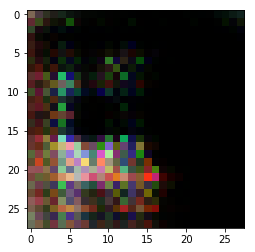

Discriminator Loss: 0.9918... Generator Loss: 0.9132


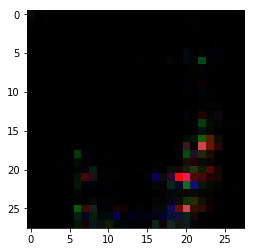

Discriminator Loss: 0.7237... Generator Loss: 2.1496


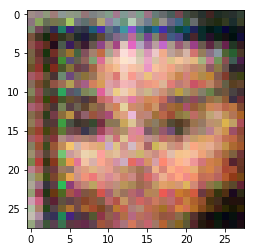

Discriminator Loss: 0.8798... Generator Loss: 1.4499


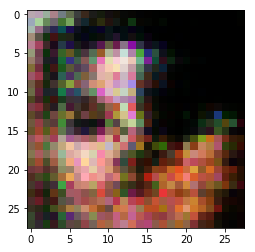

Discriminator Loss: 0.9520... Generator Loss: 1.0406


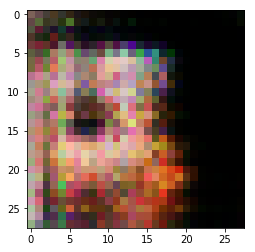

Discriminator Loss: 1.0245... Generator Loss: 1.0037


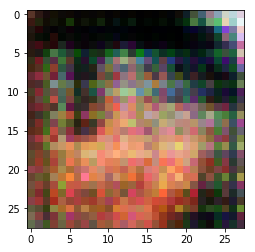

Discriminator Loss: 1.2963... Generator Loss: 0.7065


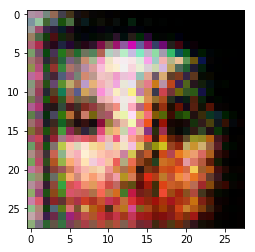

Discriminator Loss: 1.3702... Generator Loss: 2.0192


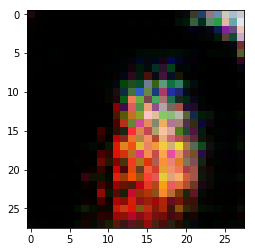

Discriminator Loss: 1.2208... Generator Loss: 0.7019


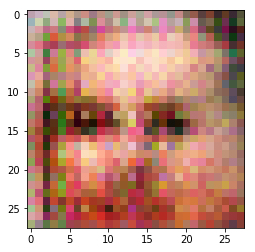

Discriminator Loss: 0.8168... Generator Loss: 2.1946


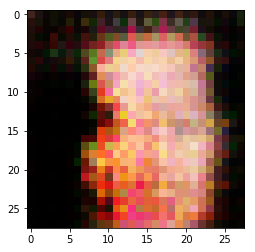

Discriminator Loss: 0.7992... Generator Loss: 1.3745


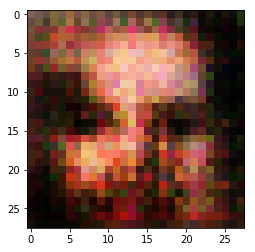

Discriminator Loss: 0.7384... Generator Loss: 1.7265


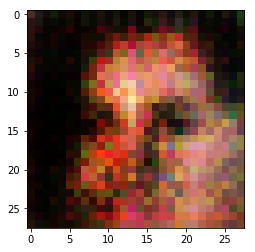

Discriminator Loss: 0.7526... Generator Loss: 1.5093


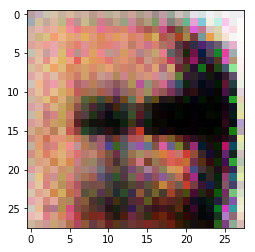

Discriminator Loss: 1.3406... Generator Loss: 0.6024


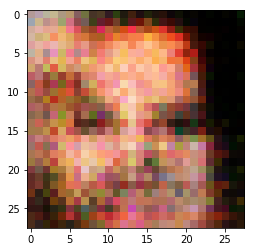

Discriminator Loss: 1.1463... Generator Loss: 1.9035


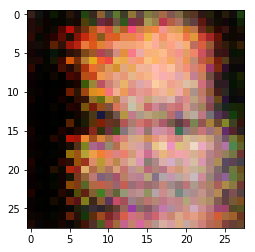

Discriminator Loss: 1.6999... Generator Loss: 0.5425


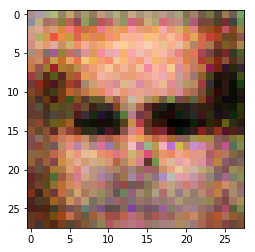

Discriminator Loss: 0.9722... Generator Loss: 2.4868


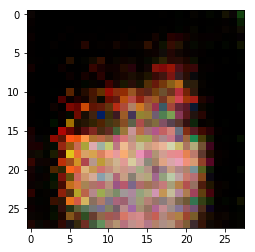

Discriminator Loss: 1.2840... Generator Loss: 0.5818


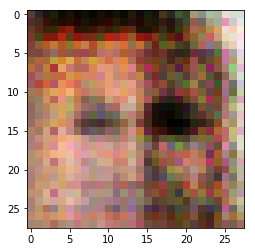

Discriminator Loss: 0.9694... Generator Loss: 1.7900


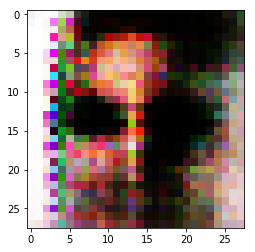

Discriminator Loss: 1.8445... Generator Loss: 0.2972


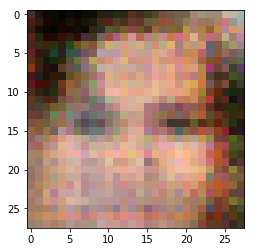

Discriminator Loss: 1.5498... Generator Loss: 2.4103


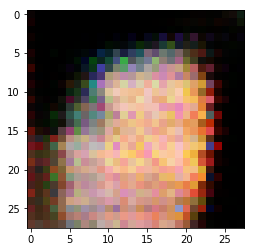

Discriminator Loss: 1.0744... Generator Loss: 0.9149


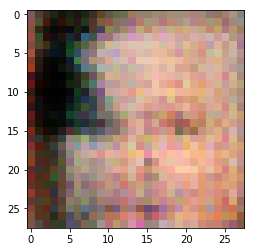

Discriminator Loss: 1.1858... Generator Loss: 0.7162


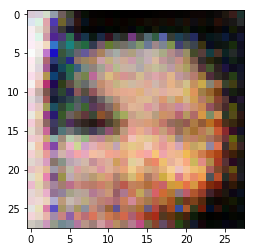

Discriminator Loss: 1.0153... Generator Loss: 1.1259


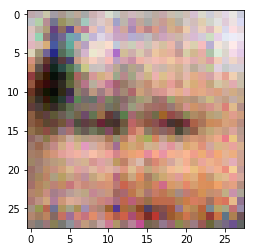

Discriminator Loss: 0.7807... Generator Loss: 1.4217


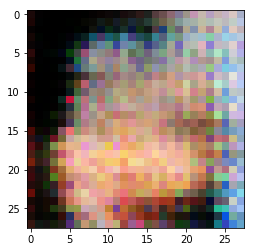

Discriminator Loss: 0.7389... Generator Loss: 1.5168


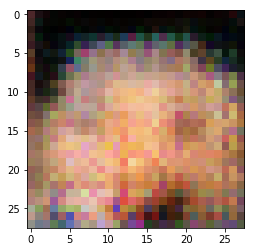

Discriminator Loss: 0.7778... Generator Loss: 1.2178


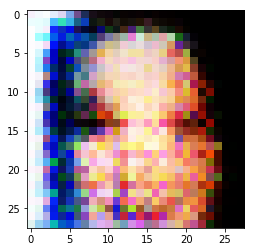

Discriminator Loss: 0.9007... Generator Loss: 2.1828


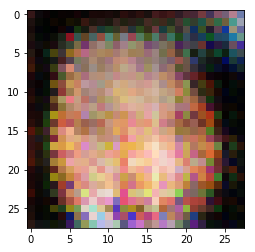

Discriminator Loss: 0.8794... Generator Loss: 1.1627


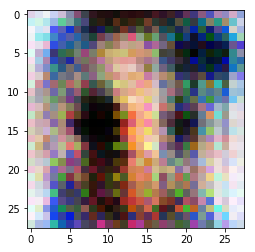

Discriminator Loss: 1.3538... Generator Loss: 0.6419


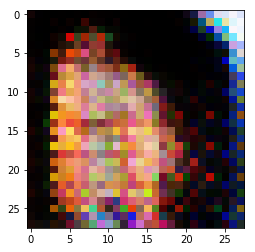

Discriminator Loss: 1.0649... Generator Loss: 1.3121


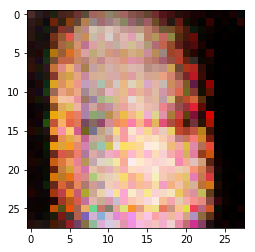

Discriminator Loss: 0.9450... Generator Loss: 1.4062


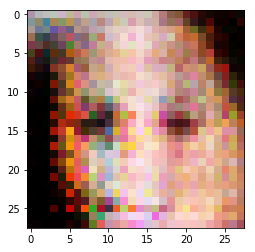

Discriminator Loss: 0.5586... Generator Loss: 2.3972


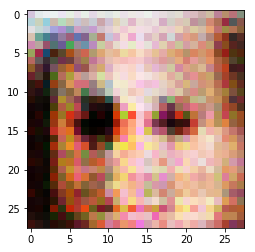

Discriminator Loss: 1.0627... Generator Loss: 1.0201


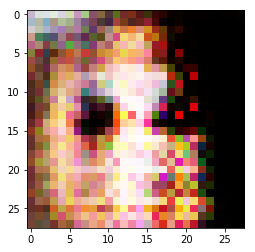

Discriminator Loss: 1.6594... Generator Loss: 5.0368


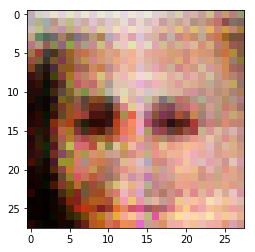

Discriminator Loss: 0.9011... Generator Loss: 1.3914


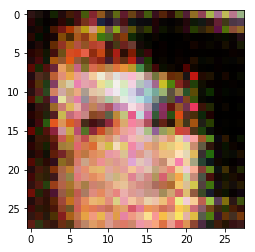

Discriminator Loss: 0.7208... Generator Loss: 1.4257


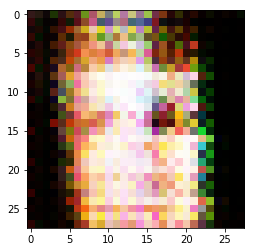

Discriminator Loss: 0.7909... Generator Loss: 2.9865


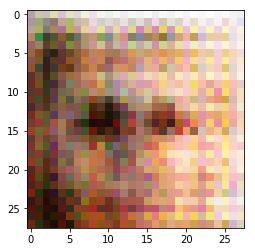

Discriminator Loss: 0.6423... Generator Loss: 1.5752


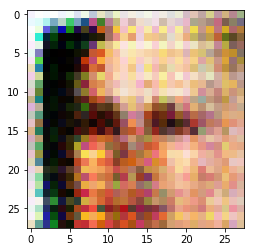

Discriminator Loss: 0.8188... Generator Loss: 1.2838


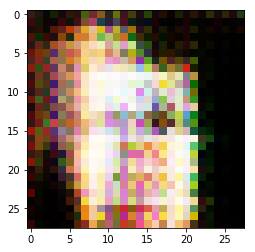

Discriminator Loss: 0.8523... Generator Loss: 2.0449


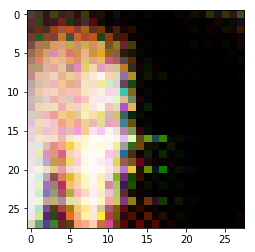

Discriminator Loss: 1.6892... Generator Loss: 0.4722


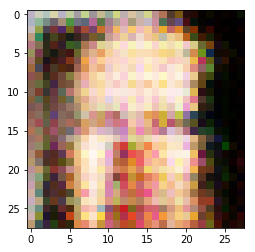

Discriminator Loss: 0.8705... Generator Loss: 4.1916


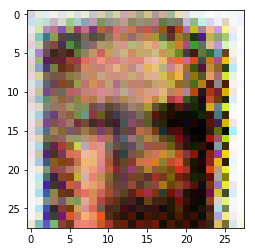

Discriminator Loss: 0.4757... Generator Loss: 2.9880


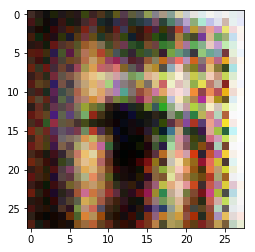

Discriminator Loss: 0.6822... Generator Loss: 1.5763


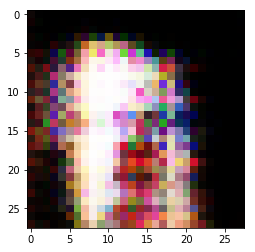

Discriminator Loss: 0.6259... Generator Loss: 1.7286


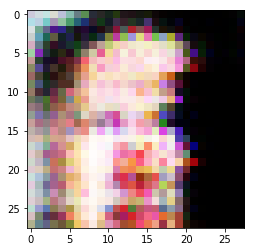

Discriminator Loss: 0.6327... Generator Loss: 1.9107


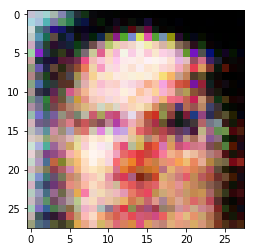

Discriminator Loss: 0.7626... Generator Loss: 1.3375


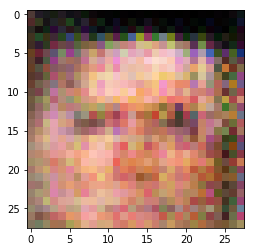

Discriminator Loss: 0.9408... Generator Loss: 1.7190


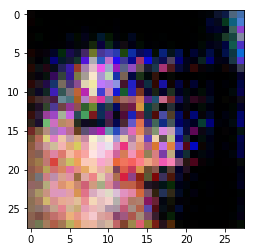

Discriminator Loss: 1.1121... Generator Loss: 0.7299


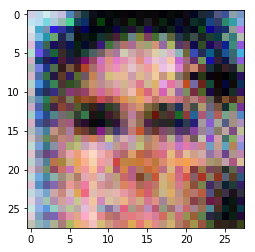

Discriminator Loss: 0.9773... Generator Loss: 2.5014


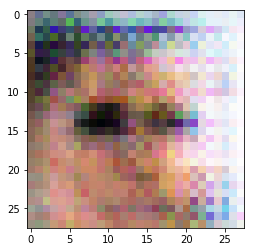

Discriminator Loss: 1.6716... Generator Loss: 0.3948


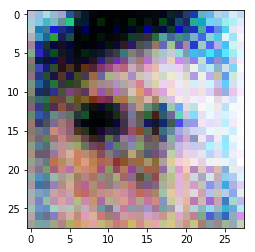

Discriminator Loss: 2.0951... Generator Loss: 4.7217


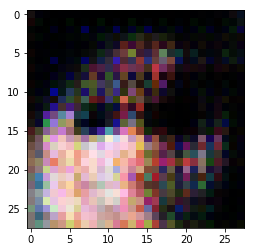

Discriminator Loss: 0.7552... Generator Loss: 3.1599


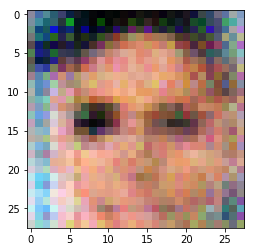

Discriminator Loss: 0.7331... Generator Loss: 1.3312


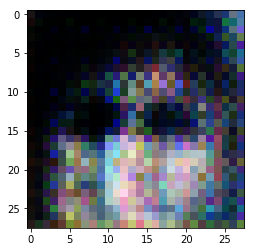

Discriminator Loss: 0.7870... Generator Loss: 1.1849


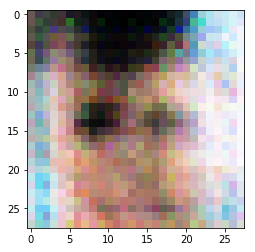

Discriminator Loss: 0.5707... Generator Loss: 2.0451


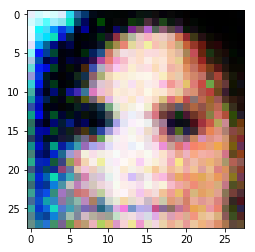

Discriminator Loss: 0.5764... Generator Loss: 2.3639


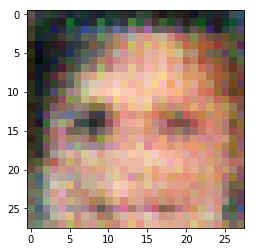

Discriminator Loss: 0.6766... Generator Loss: 1.4639


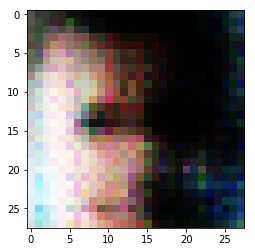

Discriminator Loss: 1.0296... Generator Loss: 0.8561


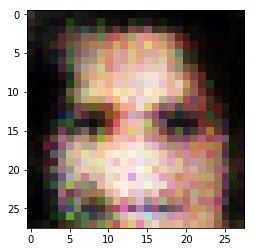

Discriminator Loss: 0.9569... Generator Loss: 1.1120


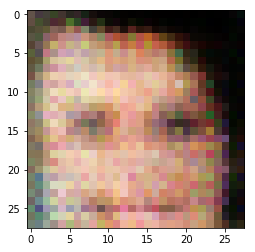

Discriminator Loss: 0.8509... Generator Loss: 1.4754


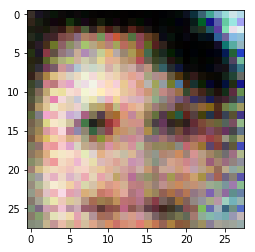

Discriminator Loss: 1.3523... Generator Loss: 0.6495


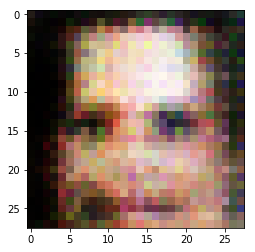

Discriminator Loss: 1.4024... Generator Loss: 3.1216


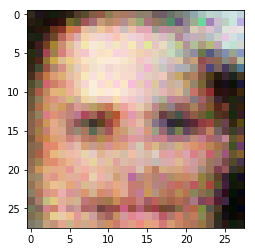

Discriminator Loss: 0.9216... Generator Loss: 0.8997


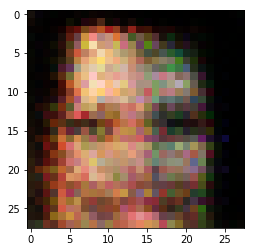

Discriminator Loss: 0.6179... Generator Loss: 1.8784


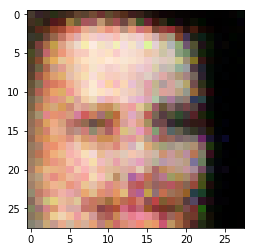

Discriminator Loss: 0.6009... Generator Loss: 2.3098


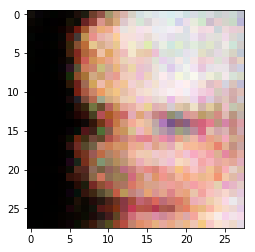

Discriminator Loss: 0.9944... Generator Loss: 0.9494


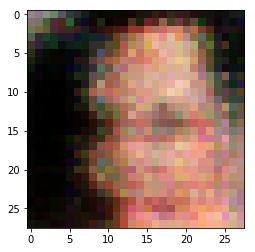

Discriminator Loss: 1.1637... Generator Loss: 2.7377


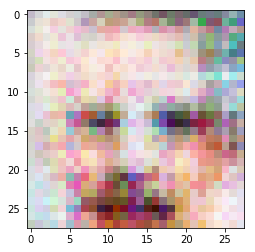

Discriminator Loss: 0.8025... Generator Loss: 1.2341


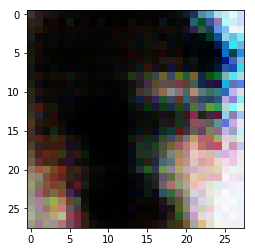

Discriminator Loss: 0.6938... Generator Loss: 1.7493


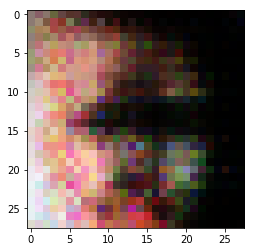

Discriminator Loss: 0.8082... Generator Loss: 1.4651


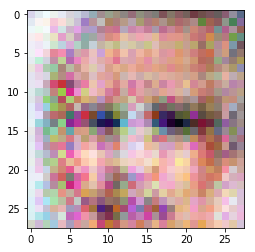

Discriminator Loss: 1.0120... Generator Loss: 1.2521


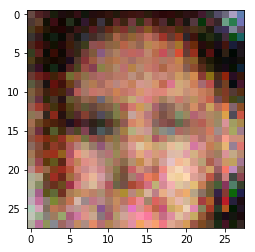

Discriminator Loss: 1.8009... Generator Loss: 0.3450


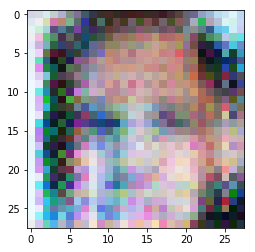

Discriminator Loss: 2.3163... Generator Loss: 4.2369


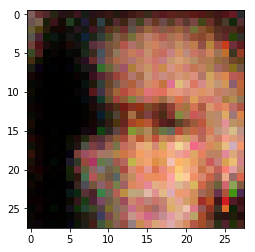

Discriminator Loss: 0.7055... Generator Loss: 2.1510


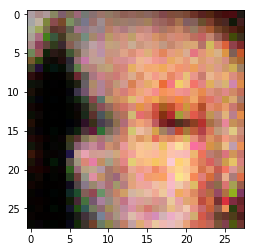

Discriminator Loss: 0.8295... Generator Loss: 1.2480


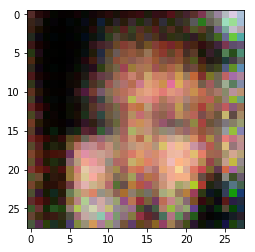

Discriminator Loss: 0.7086... Generator Loss: 1.5903


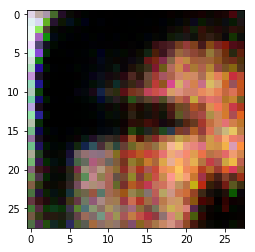

Discriminator Loss: 0.6698... Generator Loss: 2.0049


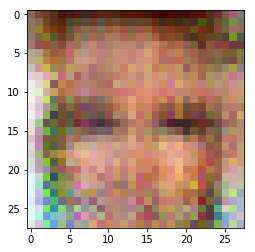

Discriminator Loss: 0.7622... Generator Loss: 1.5666


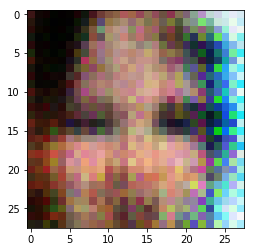

Discriminator Loss: 0.9008... Generator Loss: 1.0661


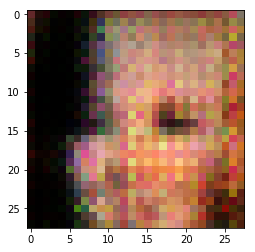

Discriminator Loss: 0.9159... Generator Loss: 1.6039


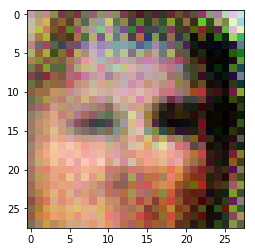

Discriminator Loss: 2.4274... Generator Loss: 0.1846


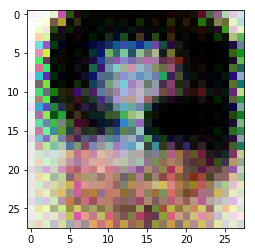

Discriminator Loss: 2.4602... Generator Loss: 5.4288


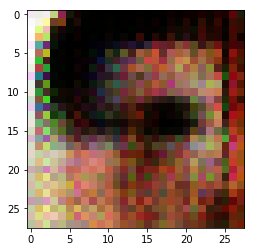

Discriminator Loss: 0.9686... Generator Loss: 2.6005


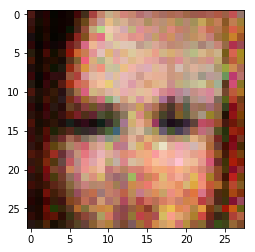

Discriminator Loss: 1.7038... Generator Loss: 0.3931


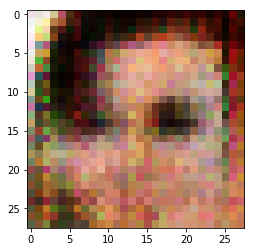

Discriminator Loss: 0.7064... Generator Loss: 1.8021


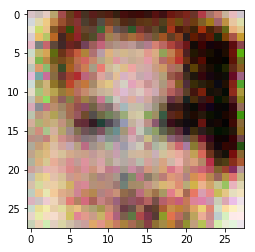

Discriminator Loss: 0.8662... Generator Loss: 2.0464


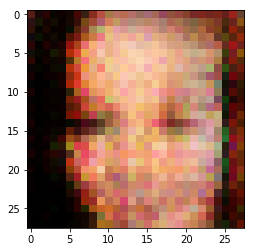

Discriminator Loss: 1.5075... Generator Loss: 0.5883


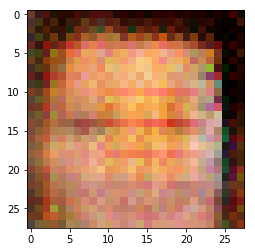

Discriminator Loss: 1.1225... Generator Loss: 1.3967


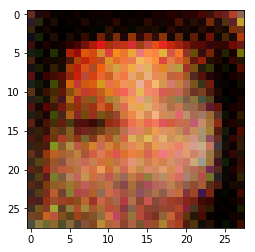

Discriminator Loss: 1.0441... Generator Loss: 1.0426


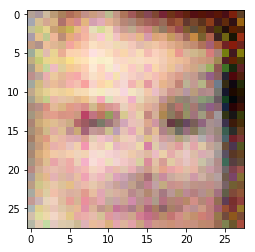

Discriminator Loss: 0.8826... Generator Loss: 1.6944


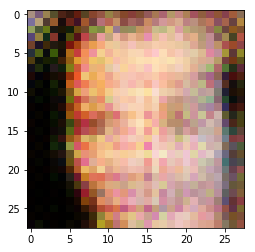

Discriminator Loss: 0.7248... Generator Loss: 1.6142


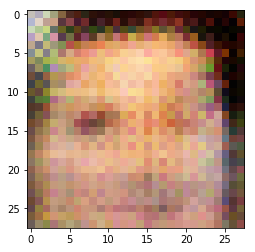

Discriminator Loss: 0.8356... Generator Loss: 1.0736


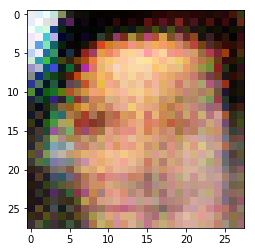

Discriminator Loss: 0.6561... Generator Loss: 2.2111


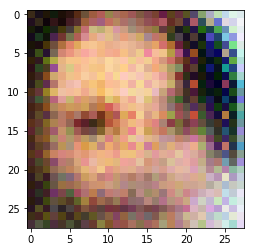

Discriminator Loss: 0.9774... Generator Loss: 0.8595


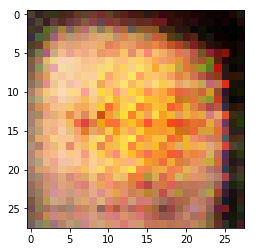

Discriminator Loss: 0.5808... Generator Loss: 2.1177


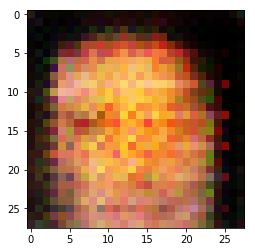

Discriminator Loss: 0.6184... Generator Loss: 2.0237


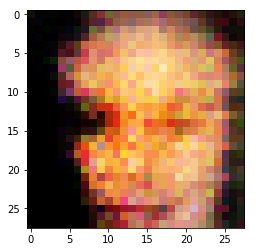

Discriminator Loss: 0.8092... Generator Loss: 1.2112


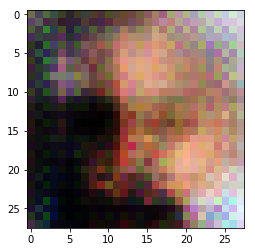

Discriminator Loss: 0.7489... Generator Loss: 1.4285


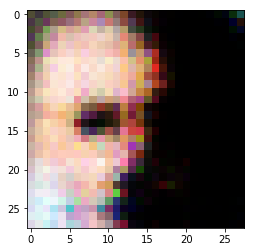

Discriminator Loss: 0.7387... Generator Loss: 2.1041


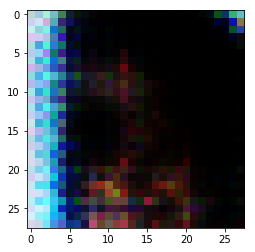

Discriminator Loss: 1.1892... Generator Loss: 0.6727


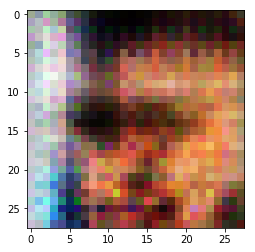

Discriminator Loss: 0.8072... Generator Loss: 2.7151


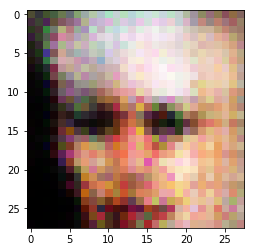

Discriminator Loss: 0.5104... Generator Loss: 2.7990


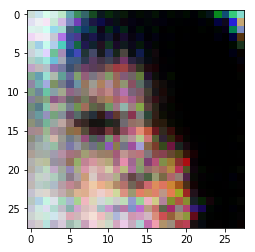

Discriminator Loss: 0.9839... Generator Loss: 0.9044


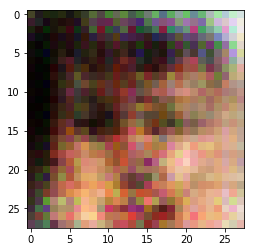

Discriminator Loss: 0.7440... Generator Loss: 1.3235


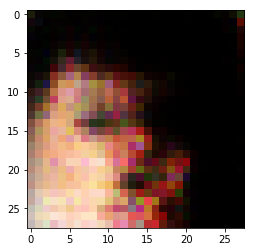

Discriminator Loss: 0.9000... Generator Loss: 2.2059


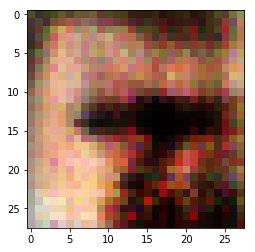

Discriminator Loss: 1.9842... Generator Loss: 0.2873


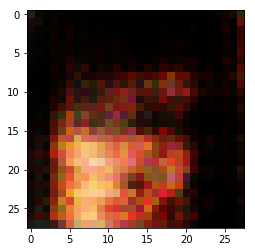

Discriminator Loss: 2.6074... Generator Loss: 4.8341


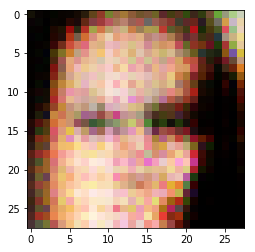

Discriminator Loss: 0.6361... Generator Loss: 3.2890


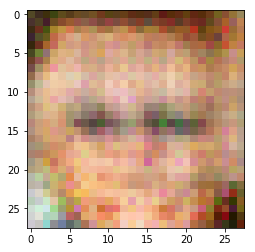

Discriminator Loss: 1.2598... Generator Loss: 0.6599


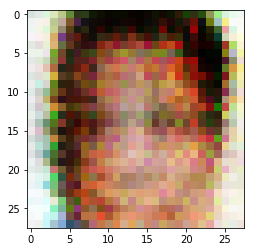

Discriminator Loss: 0.8770... Generator Loss: 1.3240


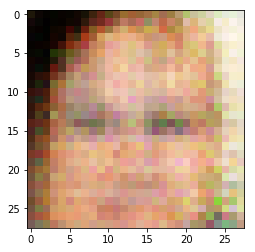

Discriminator Loss: 0.8782... Generator Loss: 1.5586


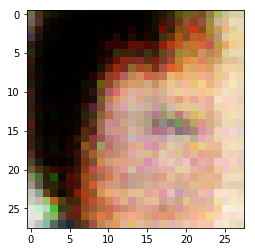

Discriminator Loss: 1.0812... Generator Loss: 1.1516


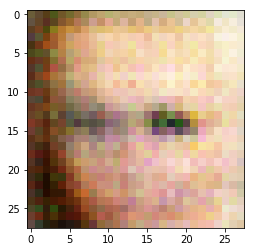

Discriminator Loss: 1.1748... Generator Loss: 0.9222


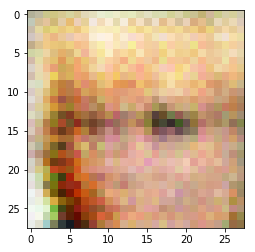

Discriminator Loss: 1.0992... Generator Loss: 1.0562


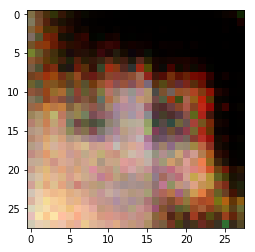

Discriminator Loss: 0.9601... Generator Loss: 0.9829


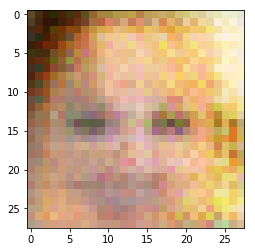

Discriminator Loss: 0.9517... Generator Loss: 2.5637


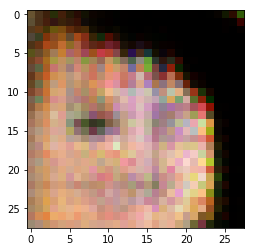

Discriminator Loss: 1.1985... Generator Loss: 0.7764


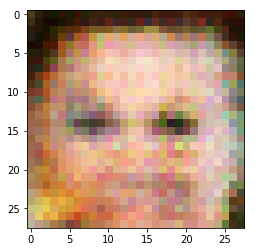

Discriminator Loss: 1.0540... Generator Loss: 1.5030


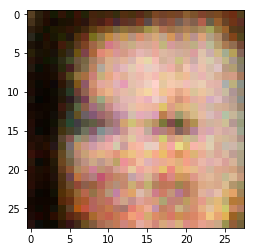

Discriminator Loss: 1.3060... Generator Loss: 0.9023


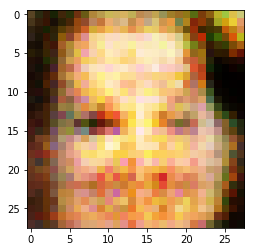

Discriminator Loss: 1.3668... Generator Loss: 0.6599


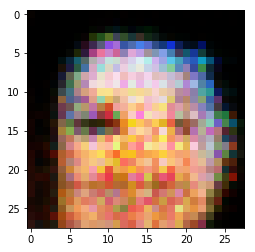

Discriminator Loss: 1.0369... Generator Loss: 1.4220


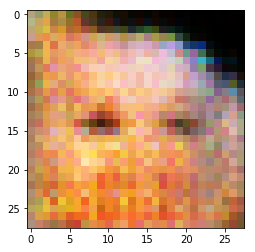

Discriminator Loss: 0.7619... Generator Loss: 2.3543


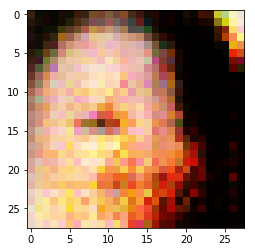

Discriminator Loss: 1.0413... Generator Loss: 0.8526


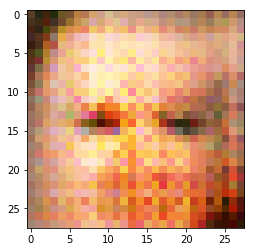

Discriminator Loss: 0.6354... Generator Loss: 1.7259


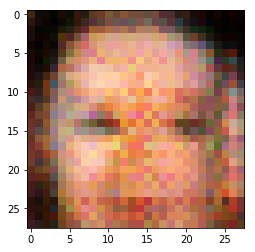

Discriminator Loss: 0.6185... Generator Loss: 2.1987


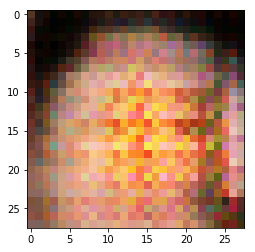

Discriminator Loss: 0.6003... Generator Loss: 2.1294


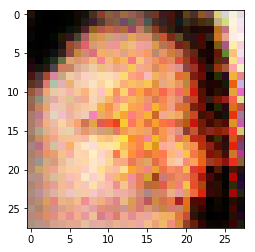

Discriminator Loss: 1.0073... Generator Loss: 1.0056


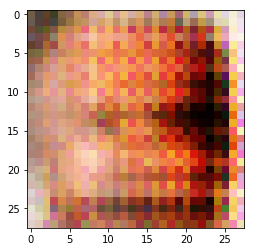

Discriminator Loss: 0.7754... Generator Loss: 1.6259


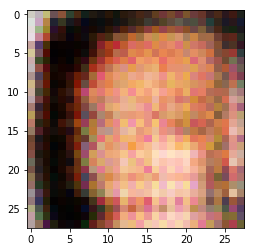

Discriminator Loss: 0.6420... Generator Loss: 1.6033


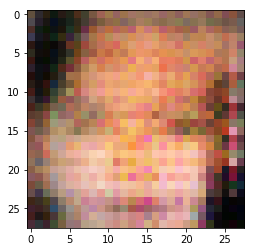

Discriminator Loss: 0.8215... Generator Loss: 1.1000


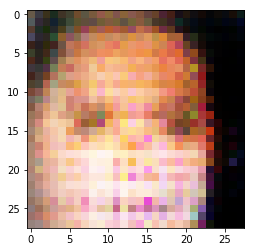

Discriminator Loss: 0.9576... Generator Loss: 3.5242


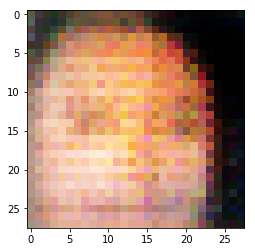

Discriminator Loss: 1.6788... Generator Loss: 0.3971


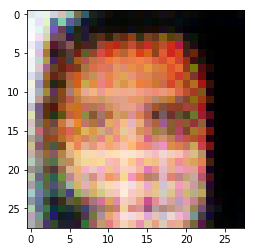

Discriminator Loss: 1.2924... Generator Loss: 4.0721


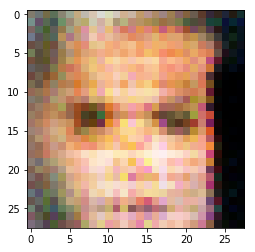

Discriminator Loss: 0.4981... Generator Loss: 2.9449


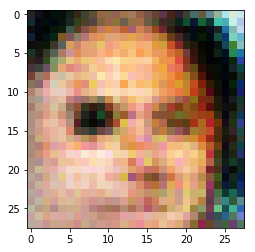

Discriminator Loss: 1.2450... Generator Loss: 0.5934


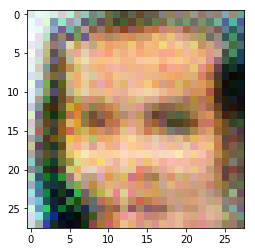

Discriminator Loss: 1.1137... Generator Loss: 0.8164


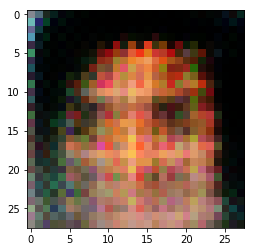

Discriminator Loss: 1.3062... Generator Loss: 1.2844


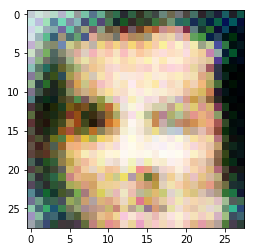

Discriminator Loss: 1.3263... Generator Loss: 0.5933


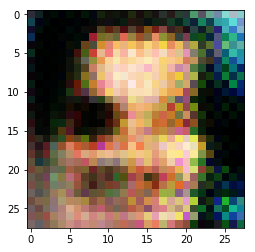

Discriminator Loss: 0.7703... Generator Loss: 2.3368


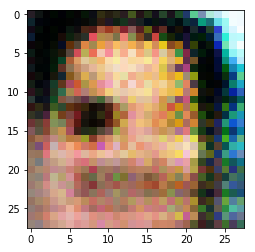

Discriminator Loss: 1.2349... Generator Loss: 0.5864


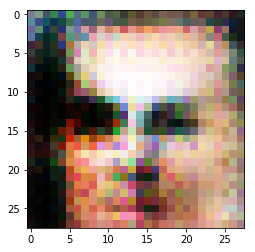

Discriminator Loss: 0.8015... Generator Loss: 3.0856


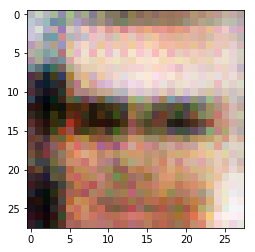

Discriminator Loss: 0.5897... Generator Loss: 1.9430


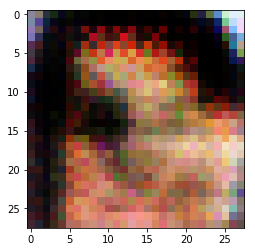

Discriminator Loss: 1.1385... Generator Loss: 0.6813


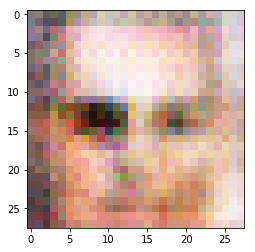

Discriminator Loss: 1.2457... Generator Loss: 3.1538


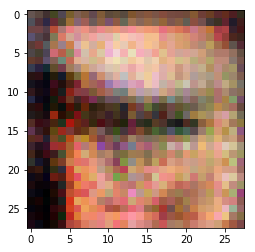

Discriminator Loss: 0.8939... Generator Loss: 1.0481


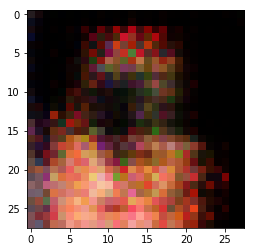

Discriminator Loss: 0.8932... Generator Loss: 1.5159


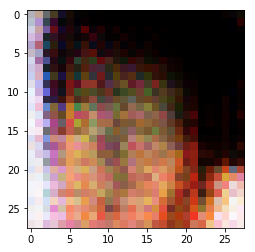

Discriminator Loss: 1.0622... Generator Loss: 0.8929


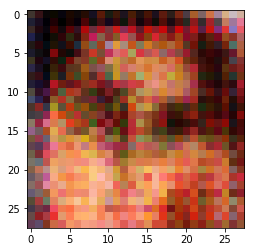

Discriminator Loss: 2.1477... Generator Loss: 0.3078


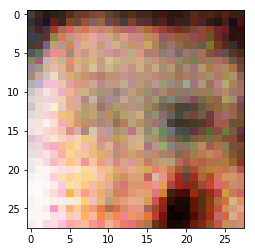

Discriminator Loss: 2.4968... Generator Loss: 6.6177


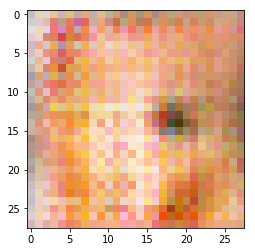

Discriminator Loss: 0.9318... Generator Loss: 4.4640


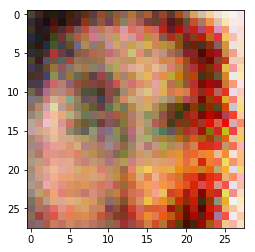

Discriminator Loss: 0.9594... Generator Loss: 1.3448


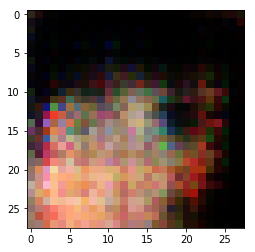

Discriminator Loss: 1.0522... Generator Loss: 0.7833


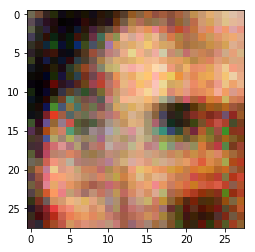

Discriminator Loss: 0.8163... Generator Loss: 1.9461


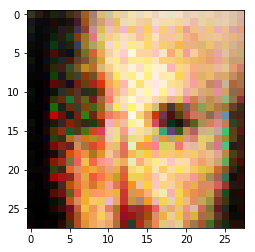

Discriminator Loss: 0.8185... Generator Loss: 1.7828


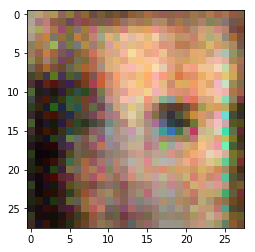

Discriminator Loss: 1.2221... Generator Loss: 0.6229


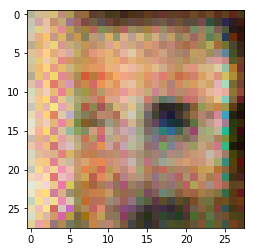

Discriminator Loss: 0.7983... Generator Loss: 1.7799


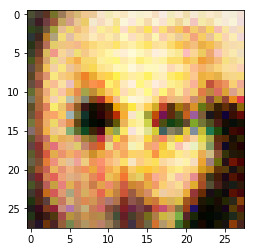

Discriminator Loss: 0.7399... Generator Loss: 1.4899


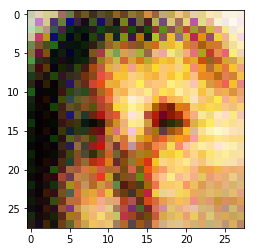

Discriminator Loss: 0.7079... Generator Loss: 1.4120


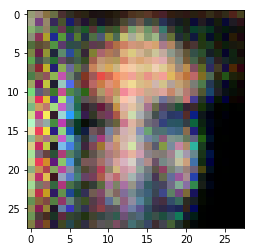

Discriminator Loss: 0.7190... Generator Loss: 1.6608


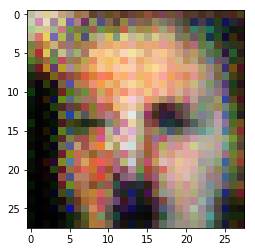

Discriminator Loss: 0.9071... Generator Loss: 0.9464


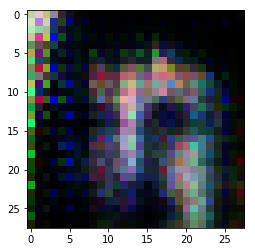

Discriminator Loss: 1.0651... Generator Loss: 0.8556


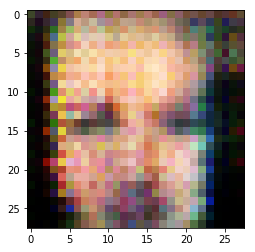

Discriminator Loss: 0.7148... Generator Loss: 2.5308


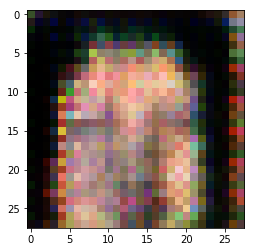

Discriminator Loss: 1.1584... Generator Loss: 0.6818


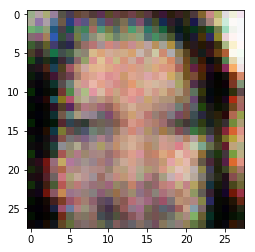

Discriminator Loss: 0.6858... Generator Loss: 2.2159


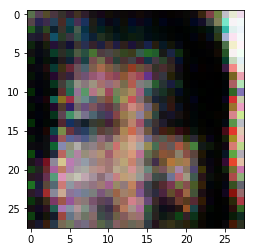

Discriminator Loss: 0.9123... Generator Loss: 0.9672


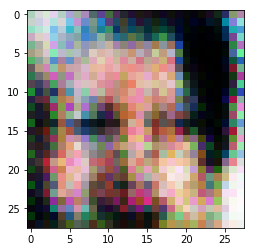

Discriminator Loss: 0.8726... Generator Loss: 1.2730


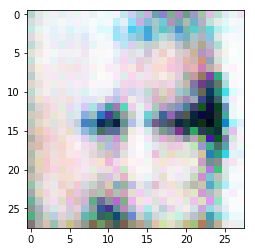

Discriminator Loss: 0.8750... Generator Loss: 1.2908


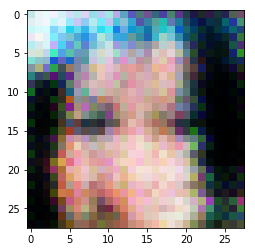

Discriminator Loss: 1.0267... Generator Loss: 0.8862


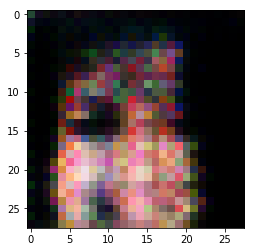

Discriminator Loss: 0.7493... Generator Loss: 1.3521


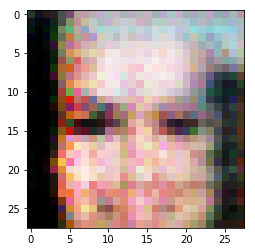

Discriminator Loss: 0.7111... Generator Loss: 1.3431


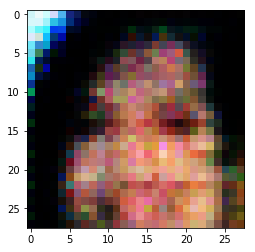

Discriminator Loss: 0.8288... Generator Loss: 1.4410


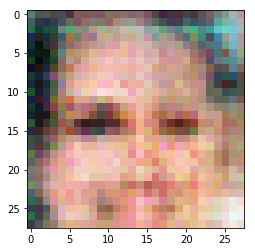

Discriminator Loss: 0.8434... Generator Loss: 1.2870


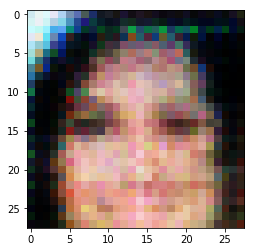

Discriminator Loss: 1.2236... Generator Loss: 0.6611


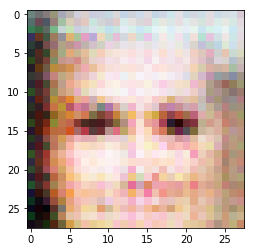

Discriminator Loss: 1.0673... Generator Loss: 1.9486


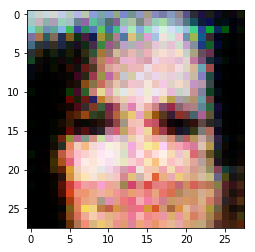

Discriminator Loss: 1.1811... Generator Loss: 0.7123


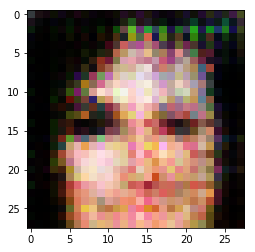

Discriminator Loss: 0.9377... Generator Loss: 2.4273


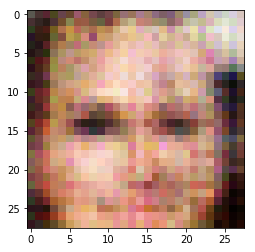

Discriminator Loss: 1.0515... Generator Loss: 0.7530


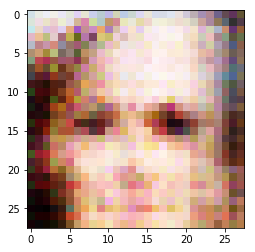

Discriminator Loss: 1.7388... Generator Loss: 5.3012


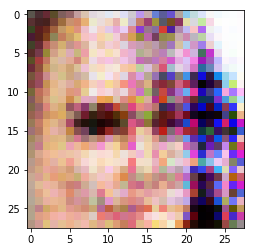

Discriminator Loss: 0.7138... Generator Loss: 1.5513


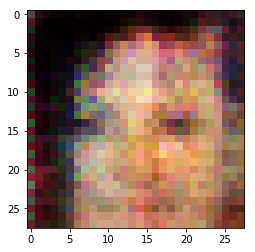

Discriminator Loss: 2.3884... Generator Loss: 0.1803


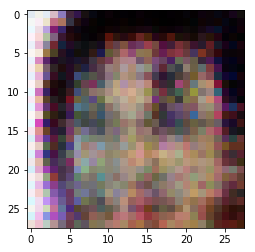

Discriminator Loss: 1.6225... Generator Loss: 4.0464


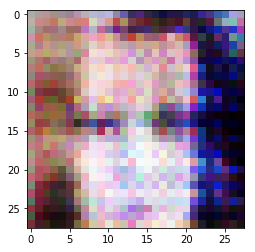

Discriminator Loss: 0.9188... Generator Loss: 1.3228


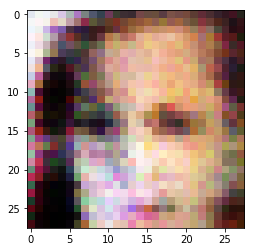

Discriminator Loss: 1.4281... Generator Loss: 0.4832


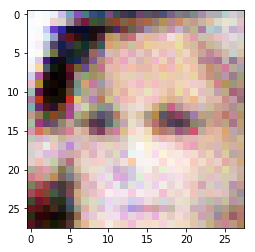

Discriminator Loss: 0.7797... Generator Loss: 2.2419


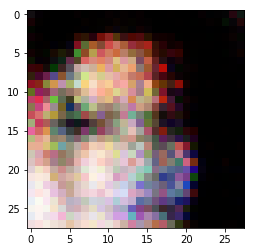

Discriminator Loss: 0.7085... Generator Loss: 2.0044


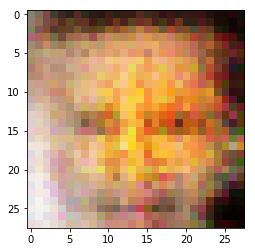

Discriminator Loss: 0.8276... Generator Loss: 1.1748


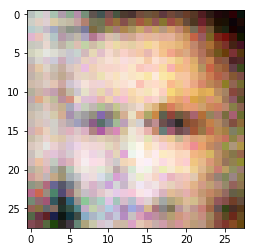

Discriminator Loss: 1.0680... Generator Loss: 0.8078


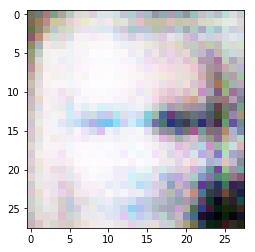

Discriminator Loss: 1.0792... Generator Loss: 1.3395


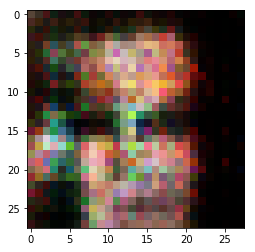

Discriminator Loss: 1.3687... Generator Loss: 1.1164


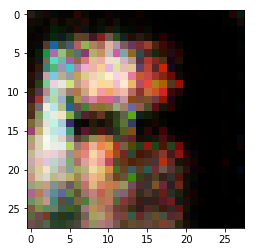

Discriminator Loss: 1.0308... Generator Loss: 1.0380


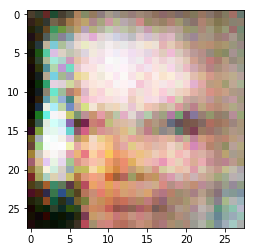

Discriminator Loss: 0.6830... Generator Loss: 2.1954


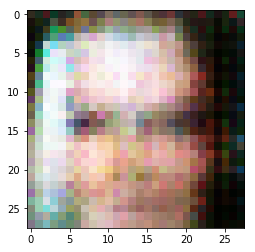

Discriminator Loss: 0.6758... Generator Loss: 1.6543


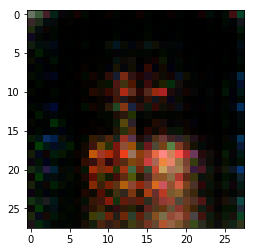

Discriminator Loss: 0.6793... Generator Loss: 1.6621


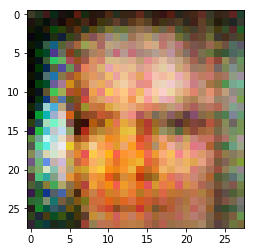

Discriminator Loss: 0.6256... Generator Loss: 1.7089


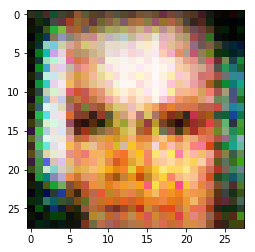

Discriminator Loss: 1.3237... Generator Loss: 0.5376


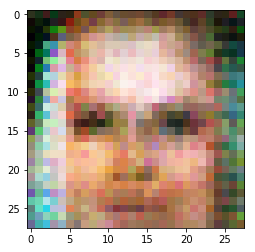

Discriminator Loss: 0.9105... Generator Loss: 3.7888


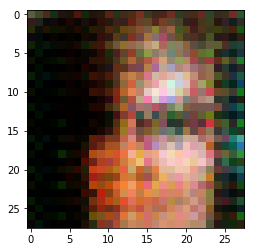

Discriminator Loss: 0.9665... Generator Loss: 0.9331


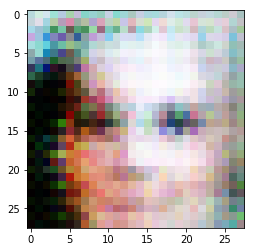

Discriminator Loss: 0.6792... Generator Loss: 2.4294


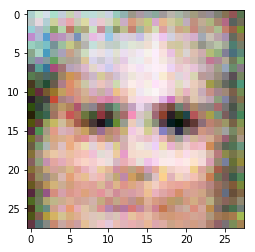

Discriminator Loss: 0.6881... Generator Loss: 1.6539


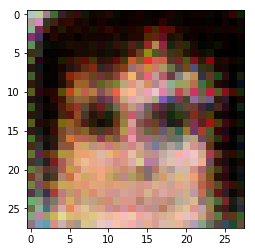

Discriminator Loss: 1.6515... Generator Loss: 0.3950


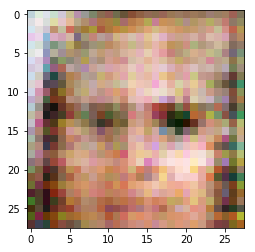

Discriminator Loss: 2.5102... Generator Loss: 6.5111


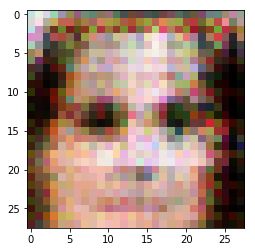

Discriminator Loss: 0.5364... Generator Loss: 3.3068


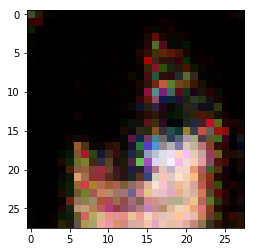

Discriminator Loss: 1.9906... Generator Loss: 0.2601


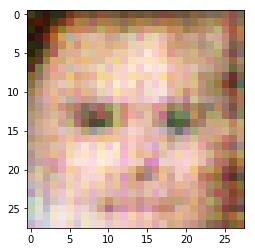

Discriminator Loss: 0.7660... Generator Loss: 2.9370


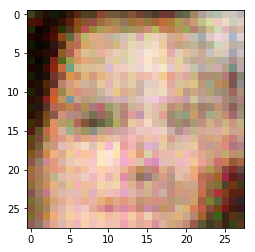

Discriminator Loss: 0.6776... Generator Loss: 2.0266


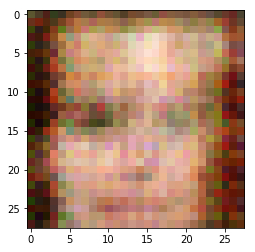

Discriminator Loss: 0.9838... Generator Loss: 0.8199


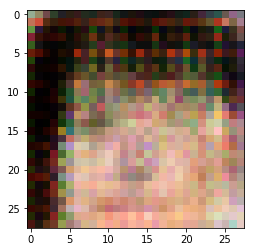

Discriminator Loss: 0.7163... Generator Loss: 1.6669


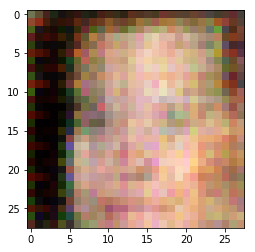

Discriminator Loss: 0.8954... Generator Loss: 1.3987


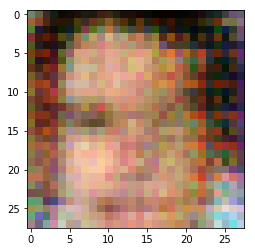

Discriminator Loss: 1.0181... Generator Loss: 0.8198


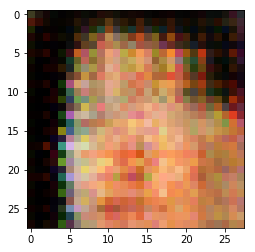

Discriminator Loss: 0.8643... Generator Loss: 1.7744


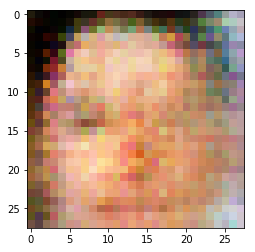

Discriminator Loss: 0.6442... Generator Loss: 2.1193


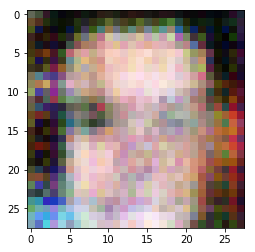

Discriminator Loss: 0.7937... Generator Loss: 1.2090


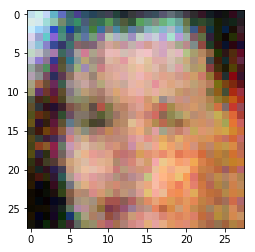

Discriminator Loss: 0.8282... Generator Loss: 1.0701


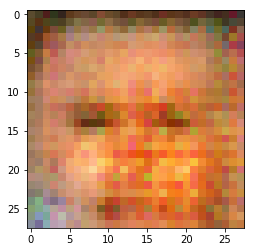

Discriminator Loss: 0.8023... Generator Loss: 1.7144


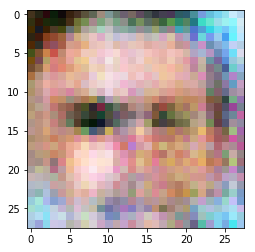

Discriminator Loss: 0.8214... Generator Loss: 1.3789


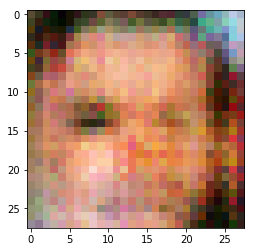

Discriminator Loss: 2.2055... Generator Loss: 0.2249


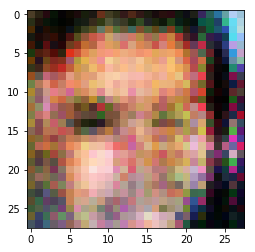

Discriminator Loss: 1.5218... Generator Loss: 3.5818


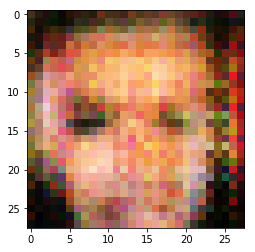

Discriminator Loss: 0.9543... Generator Loss: 1.9504


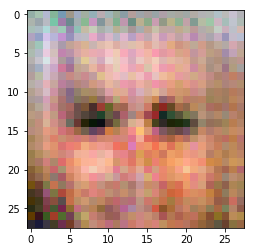

Discriminator Loss: 1.2445... Generator Loss: 0.5925


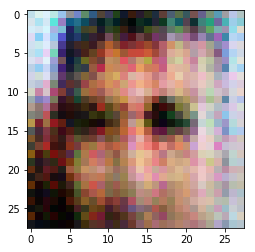

Discriminator Loss: 0.6613... Generator Loss: 1.8940


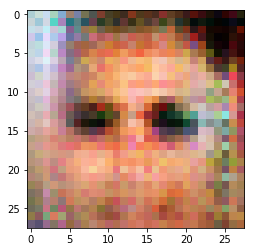

Discriminator Loss: 0.5480... Generator Loss: 2.3648


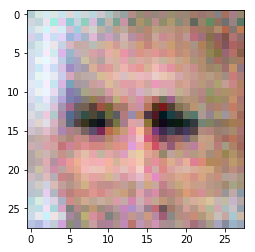

Discriminator Loss: 0.6383... Generator Loss: 1.5404


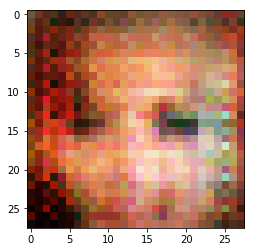

Discriminator Loss: 0.7767... Generator Loss: 1.2039


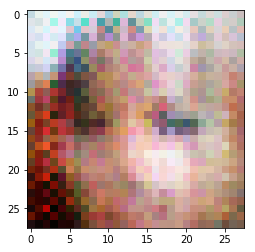

Discriminator Loss: 0.7655... Generator Loss: 1.9220


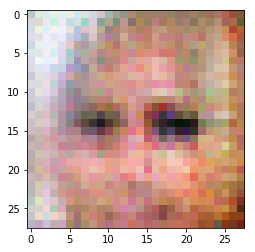

Discriminator Loss: 1.1388... Generator Loss: 0.7790


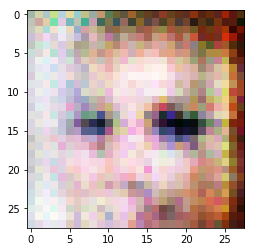

Discriminator Loss: 1.1480... Generator Loss: 0.9814


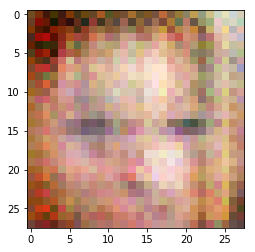

Discriminator Loss: 0.7737... Generator Loss: 2.8653


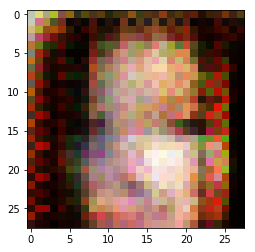

Discriminator Loss: 0.7350... Generator Loss: 1.2650


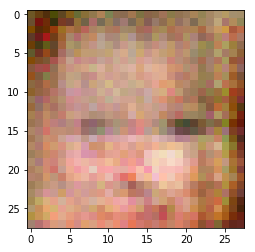

Discriminator Loss: 0.8549... Generator Loss: 1.1450


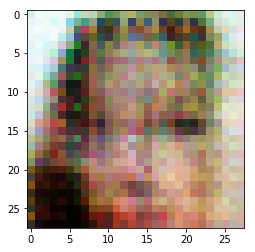

Discriminator Loss: 0.8756... Generator Loss: 1.2744


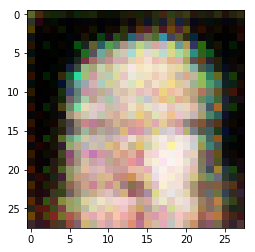

Discriminator Loss: 0.8983... Generator Loss: 2.2068


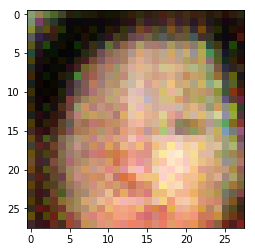

Discriminator Loss: 1.4461... Generator Loss: 0.5016


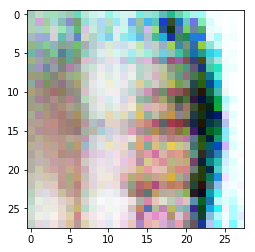

Discriminator Loss: 1.7256... Generator Loss: 4.3516


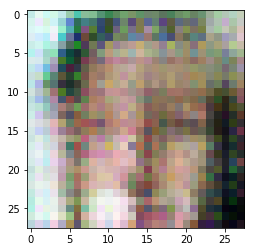

Discriminator Loss: 0.6303... Generator Loss: 1.6318


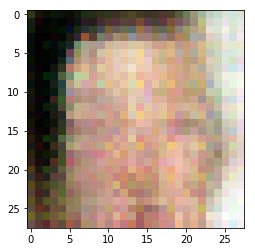

Discriminator Loss: 1.1852... Generator Loss: 0.7097


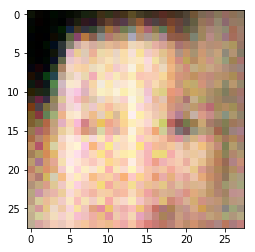

Discriminator Loss: 0.7758... Generator Loss: 1.9890


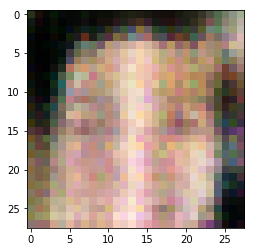

Discriminator Loss: 0.9577... Generator Loss: 1.0952


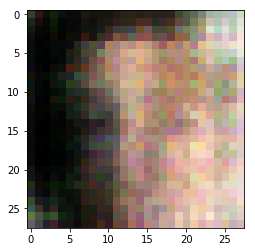

Discriminator Loss: 1.4405... Generator Loss: 0.4921


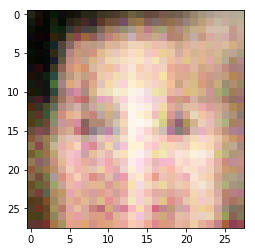

Discriminator Loss: 0.9847... Generator Loss: 3.6388


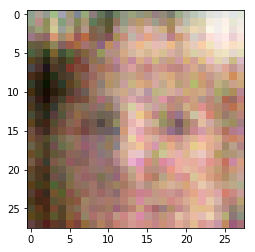

Discriminator Loss: 0.6588... Generator Loss: 1.6303


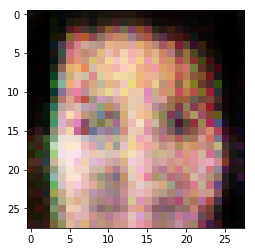

Discriminator Loss: 1.4021... Generator Loss: 0.4869


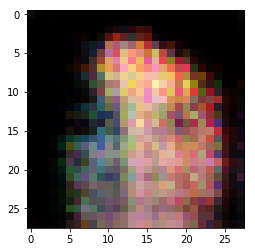

Discriminator Loss: 0.6664... Generator Loss: 3.1823


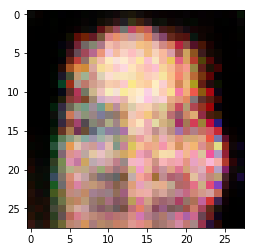

Discriminator Loss: 0.6846... Generator Loss: 1.7314


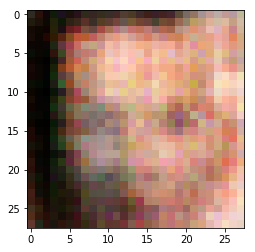

Discriminator Loss: 1.3323... Generator Loss: 0.5391


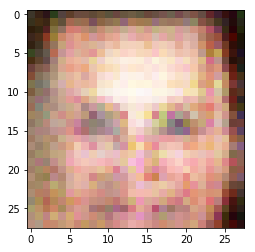

Discriminator Loss: 0.7733... Generator Loss: 1.9205


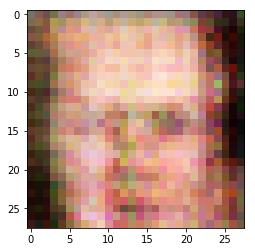

Discriminator Loss: 0.9007... Generator Loss: 1.0510


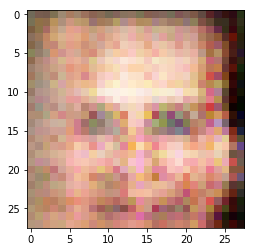

Discriminator Loss: 0.8369... Generator Loss: 1.1308


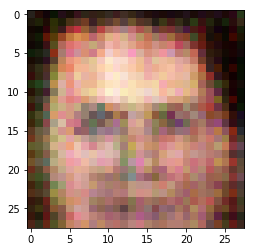

Discriminator Loss: 0.7946... Generator Loss: 2.0481


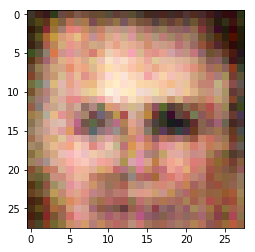

Discriminator Loss: 1.1190... Generator Loss: 0.7029


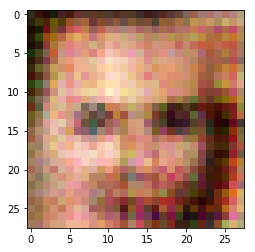

Discriminator Loss: 0.9038... Generator Loss: 2.1135


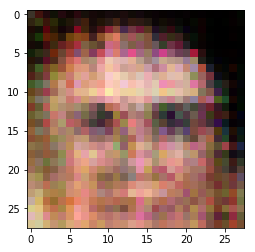

Discriminator Loss: 1.4075... Generator Loss: 0.4832


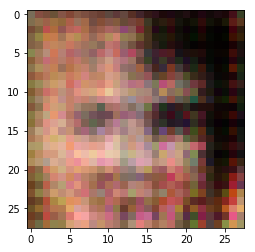

Discriminator Loss: 1.2066... Generator Loss: 3.2528


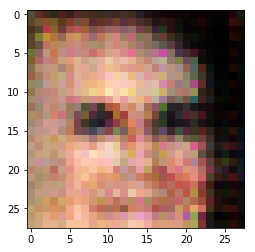

Discriminator Loss: 0.6233... Generator Loss: 1.8336


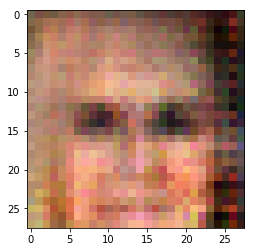

Discriminator Loss: 1.0324... Generator Loss: 0.7925


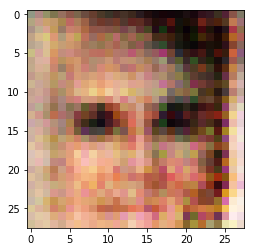

Discriminator Loss: 0.6916... Generator Loss: 2.7143


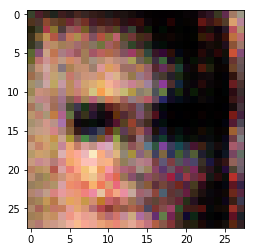

Discriminator Loss: 0.8526... Generator Loss: 1.1135


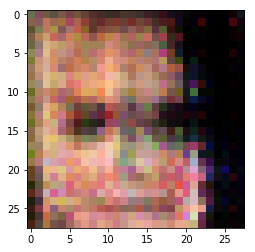

Discriminator Loss: 0.7967... Generator Loss: 1.2299


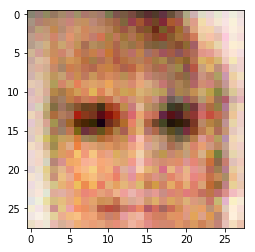

Discriminator Loss: 0.5108... Generator Loss: 2.8145


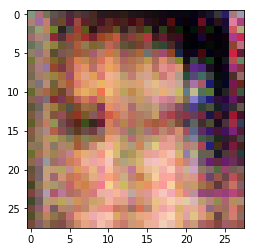

Discriminator Loss: 0.7960... Generator Loss: 1.1920


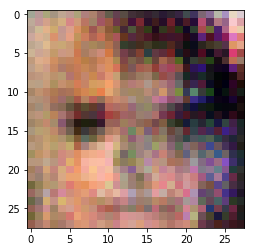

Discriminator Loss: 1.0360... Generator Loss: 0.8814


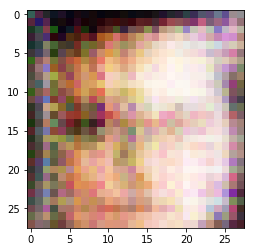

Discriminator Loss: 0.8925... Generator Loss: 4.2420


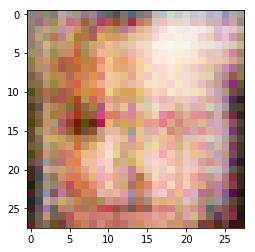

Discriminator Loss: 0.4965... Generator Loss: 2.4315


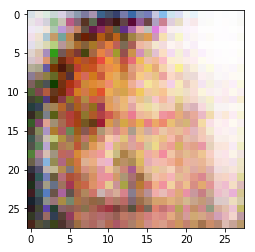

Discriminator Loss: 0.7931... Generator Loss: 1.2712


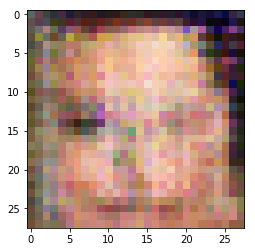

Discriminator Loss: 0.6580... Generator Loss: 2.3268


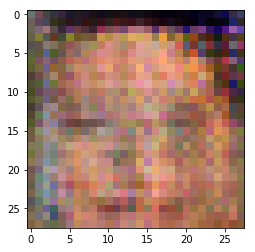

Discriminator Loss: 0.7192... Generator Loss: 1.5285


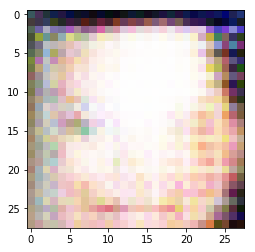

Discriminator Loss: 0.8363... Generator Loss: 1.2854


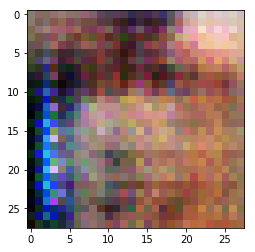

Discriminator Loss: 0.6326... Generator Loss: 2.5202


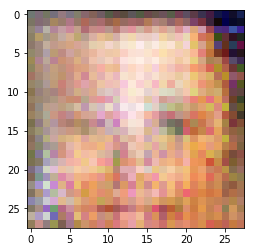

Discriminator Loss: 0.9516... Generator Loss: 0.8923


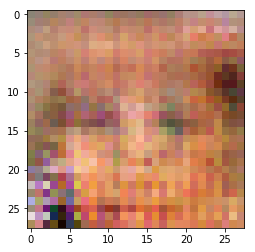

Discriminator Loss: 0.5229... Generator Loss: 2.2799


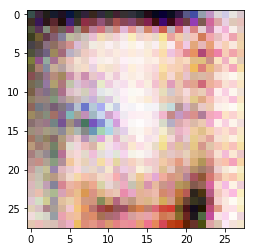

Discriminator Loss: 0.5607... Generator Loss: 2.3608


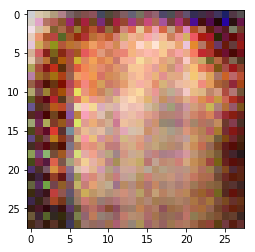

Discriminator Loss: 0.9399... Generator Loss: 0.9435


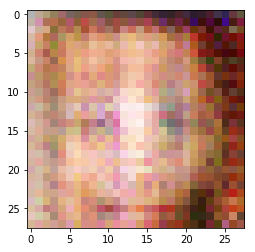

Discriminator Loss: 0.6736... Generator Loss: 2.8056


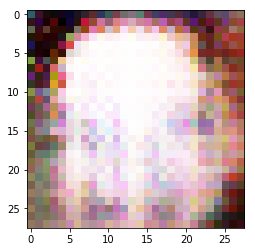

Discriminator Loss: 0.7138... Generator Loss: 1.4510


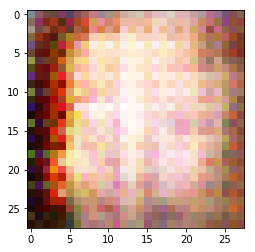

Discriminator Loss: 1.6717... Generator Loss: 0.3827


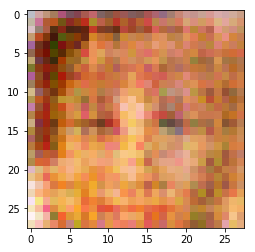

Discriminator Loss: 3.2128... Generator Loss: 6.8126


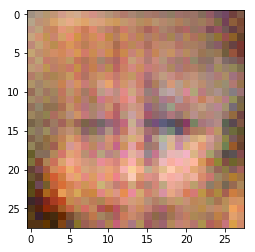

Discriminator Loss: 0.5781... Generator Loss: 2.4167


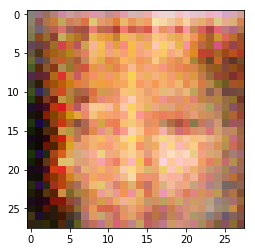

Discriminator Loss: 1.9347... Generator Loss: 0.2694


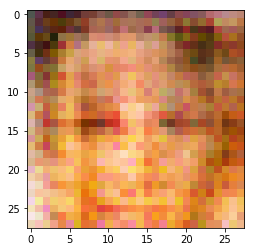

Discriminator Loss: 0.6011... Generator Loss: 2.3130


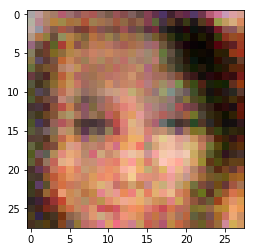

Discriminator Loss: 0.6362... Generator Loss: 3.3602


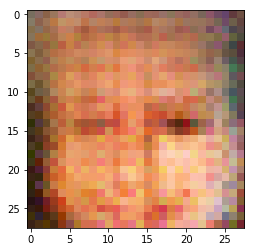

Discriminator Loss: 0.5250... Generator Loss: 2.2724


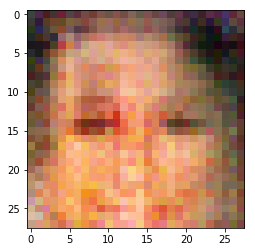

Discriminator Loss: 0.5604... Generator Loss: 1.7710


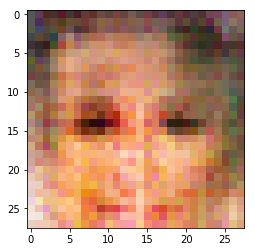

Discriminator Loss: 0.6731... Generator Loss: 1.4878


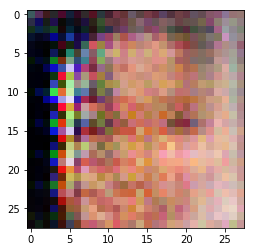

Discriminator Loss: 0.7218... Generator Loss: 1.4785


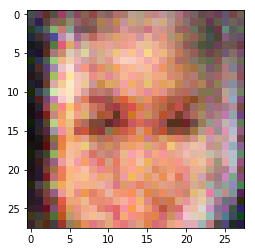

Discriminator Loss: 0.6070... Generator Loss: 1.8683


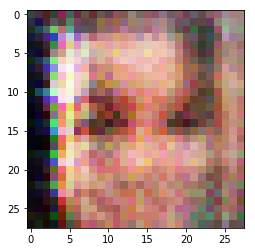

Discriminator Loss: 0.7931... Generator Loss: 1.3101


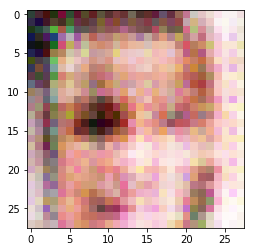

Discriminator Loss: 0.9344... Generator Loss: 0.9843


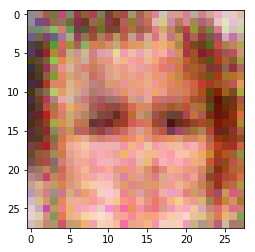

Discriminator Loss: 0.7250... Generator Loss: 1.8828


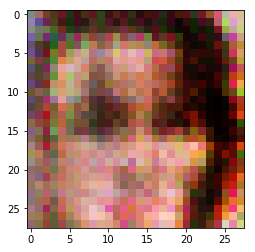

Discriminator Loss: 1.1253... Generator Loss: 0.8036


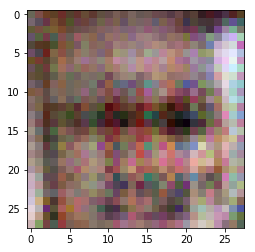

Discriminator Loss: 0.9174... Generator Loss: 1.0550


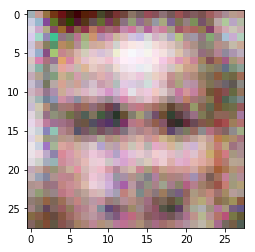

Discriminator Loss: 1.6972... Generator Loss: 0.3651


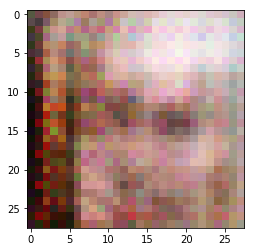

Discriminator Loss: 1.1064... Generator Loss: 3.9150


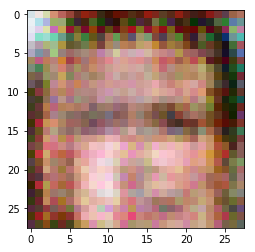

Discriminator Loss: 0.5964... Generator Loss: 2.1458


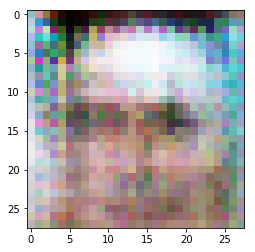

Discriminator Loss: 1.4249... Generator Loss: 0.4962


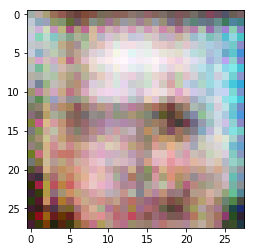

Discriminator Loss: 0.5224... Generator Loss: 3.4752


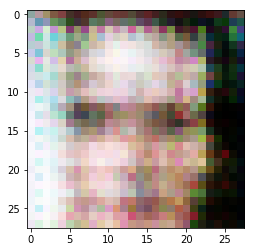

Discriminator Loss: 0.6747... Generator Loss: 2.1119


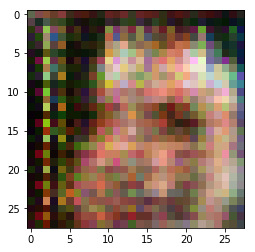

Discriminator Loss: 1.4689... Generator Loss: 0.5028


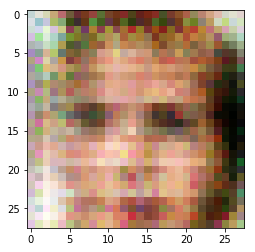

Discriminator Loss: 1.3705... Generator Loss: 2.8246


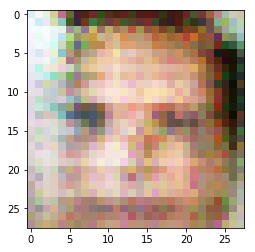

Discriminator Loss: 2.1977... Generator Loss: 0.2563


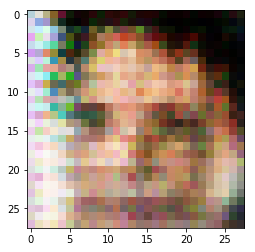

Discriminator Loss: 1.2202... Generator Loss: 4.1739


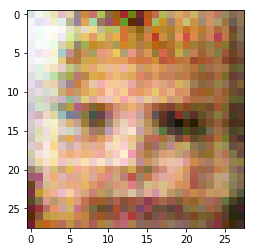

Discriminator Loss: 0.7740... Generator Loss: 1.7092


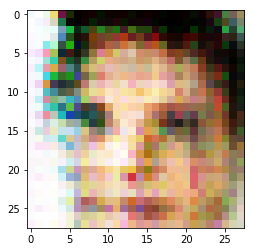

Discriminator Loss: 0.9138... Generator Loss: 1.1140


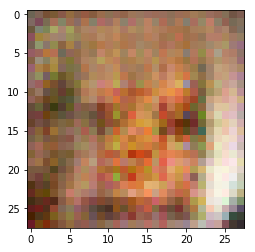

Discriminator Loss: 0.7355... Generator Loss: 2.3209


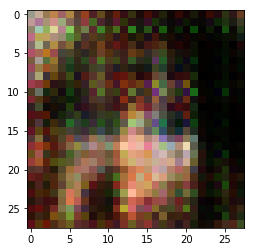

Discriminator Loss: 0.8342... Generator Loss: 1.1895


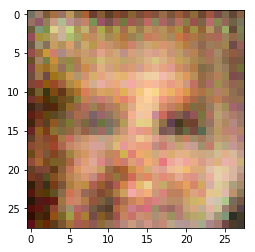

Discriminator Loss: 0.8916... Generator Loss: 1.4252


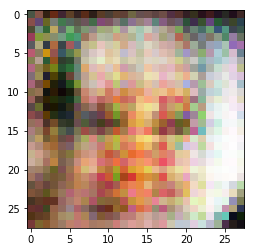

Discriminator Loss: 0.8853... Generator Loss: 1.1281


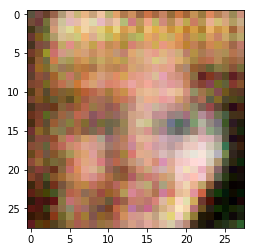

Discriminator Loss: 1.3561... Generator Loss: 3.4117


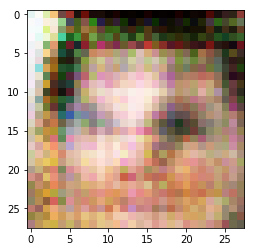

Discriminator Loss: 1.5419... Generator Loss: 0.4443


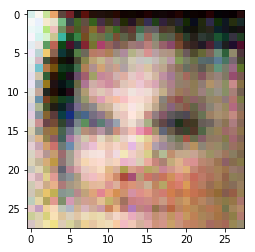

Discriminator Loss: 0.8451... Generator Loss: 3.5256


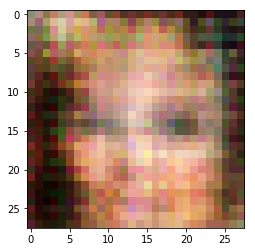

Discriminator Loss: 0.6443... Generator Loss: 2.2258


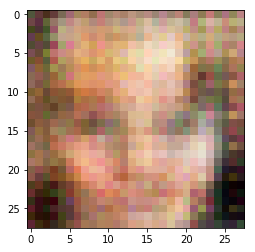

Discriminator Loss: 1.0021... Generator Loss: 0.8108


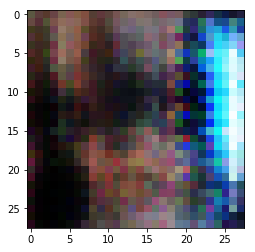

Discriminator Loss: 0.7412... Generator Loss: 1.4160


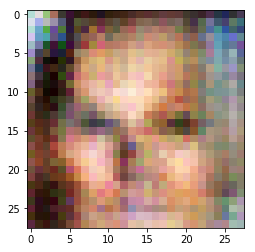

Discriminator Loss: 0.8931... Generator Loss: 1.3955


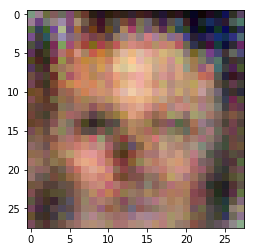

Discriminator Loss: 0.9263... Generator Loss: 1.2129


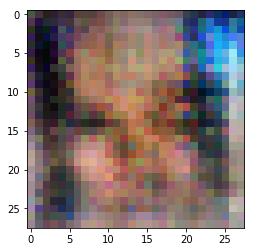

Discriminator Loss: 0.8916... Generator Loss: 1.2963


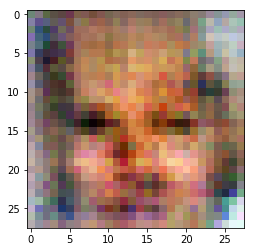

Discriminator Loss: 1.5931... Generator Loss: 0.4716


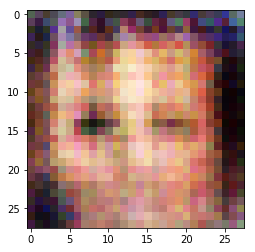

Discriminator Loss: 1.0508... Generator Loss: 2.7568


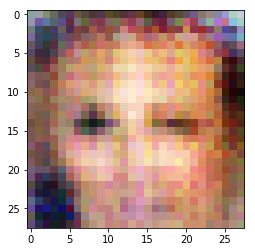

Discriminator Loss: 1.3934... Generator Loss: 0.6367


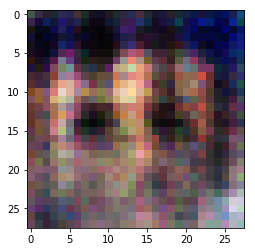

Discriminator Loss: 0.7498... Generator Loss: 1.4109


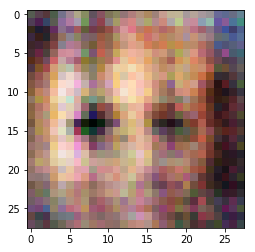

Discriminator Loss: 0.8592... Generator Loss: 2.2556


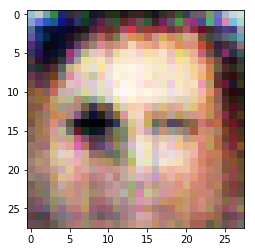

Discriminator Loss: 1.4324... Generator Loss: 0.4718


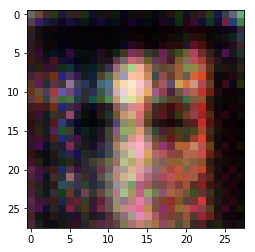

Discriminator Loss: 0.8557... Generator Loss: 3.2179


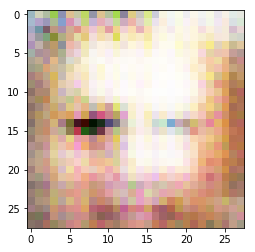

Discriminator Loss: 0.6913... Generator Loss: 1.5712


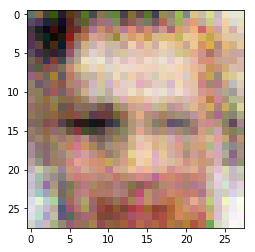

Discriminator Loss: 1.2432... Generator Loss: 0.6592


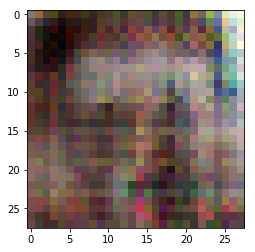

Discriminator Loss: 0.8900... Generator Loss: 3.8633


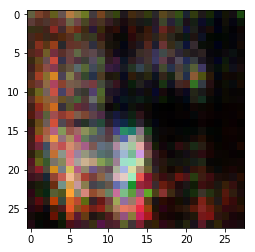

Discriminator Loss: 0.5128... Generator Loss: 2.5028


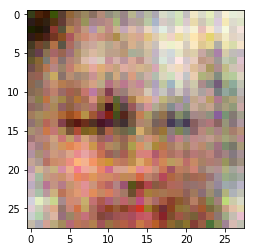

Discriminator Loss: 1.3011... Generator Loss: 0.5467


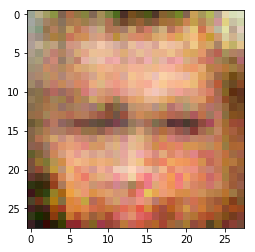

Discriminator Loss: 0.7082... Generator Loss: 1.8421


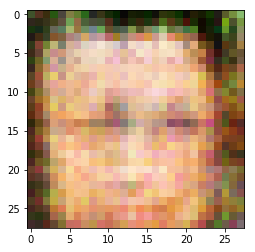

Discriminator Loss: 0.7904... Generator Loss: 1.6725


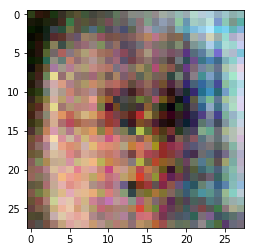

Discriminator Loss: 1.0338... Generator Loss: 0.8367


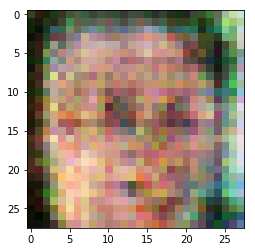

Discriminator Loss: 1.0820... Generator Loss: 0.8815


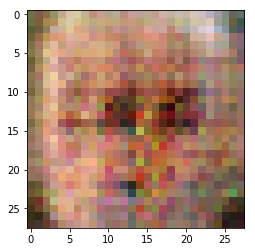

Discriminator Loss: 1.1155... Generator Loss: 1.8296


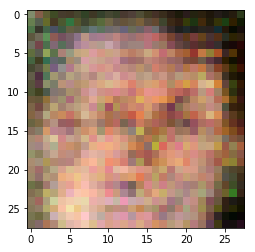

Discriminator Loss: 1.1621... Generator Loss: 0.7415


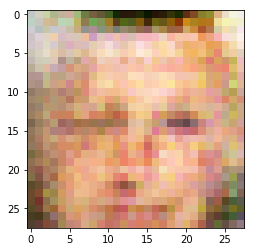

Discriminator Loss: 1.2710... Generator Loss: 0.8180


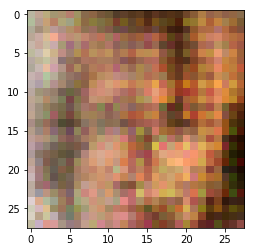

Discriminator Loss: 0.8304... Generator Loss: 1.8030


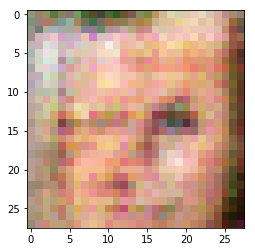

Discriminator Loss: 1.0618... Generator Loss: 0.8238


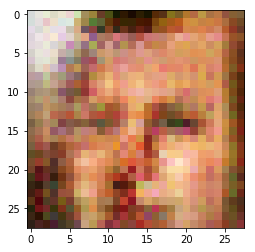

Discriminator Loss: 0.7475... Generator Loss: 1.5654


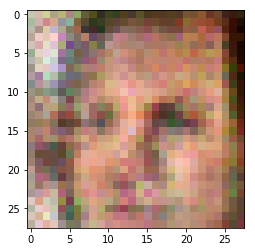

Discriminator Loss: 0.7088... Generator Loss: 1.4600


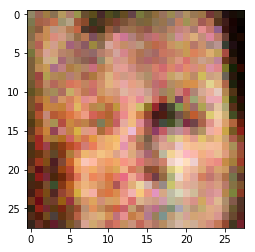

Discriminator Loss: 0.8037... Generator Loss: 1.1978


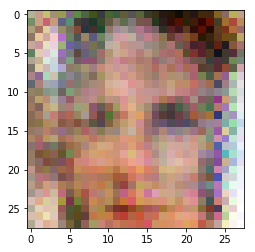

Discriminator Loss: 0.8606... Generator Loss: 1.1945


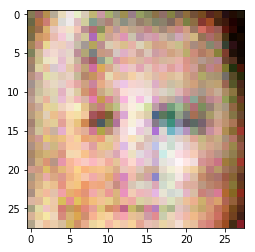

Discriminator Loss: 1.0925... Generator Loss: 0.9341


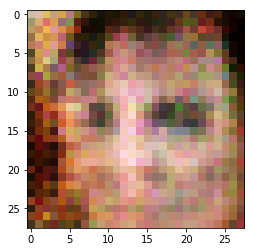

Discriminator Loss: 1.1094... Generator Loss: 1.3364


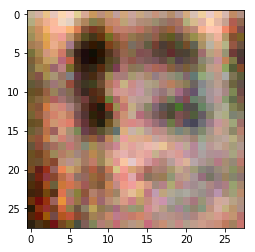

Discriminator Loss: 1.4913... Generator Loss: 0.4760


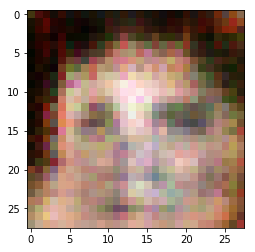

Discriminator Loss: 0.7131... Generator Loss: 2.9432


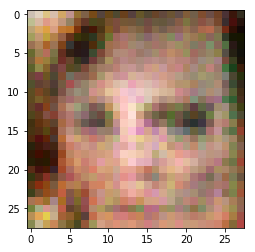

Discriminator Loss: 0.5815... Generator Loss: 2.1208


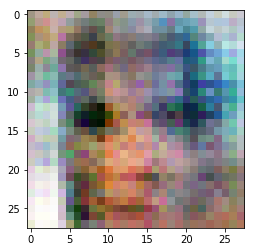

Discriminator Loss: 1.6729... Generator Loss: 0.3540


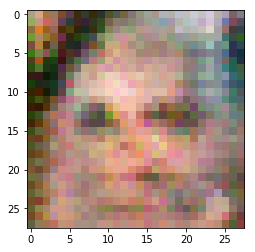

Discriminator Loss: 0.8687... Generator Loss: 1.2446


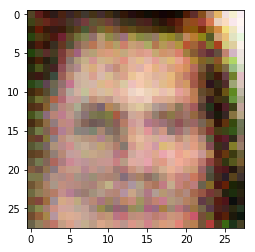

Discriminator Loss: 1.1066... Generator Loss: 1.2746


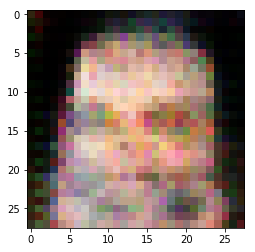

Discriminator Loss: 1.3436... Generator Loss: 0.5610


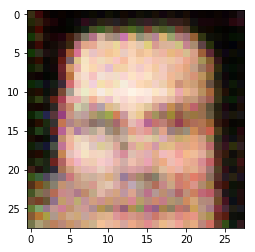

Discriminator Loss: 0.8979... Generator Loss: 1.7387


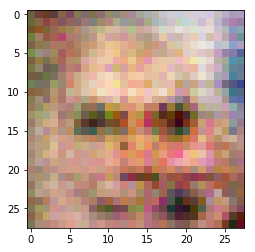

Discriminator Loss: 0.9817... Generator Loss: 0.9343


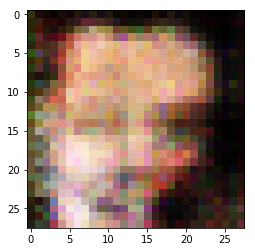

Discriminator Loss: 1.9090... Generator Loss: 0.2803


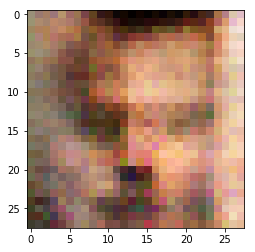

Discriminator Loss: 1.8653... Generator Loss: 5.0399


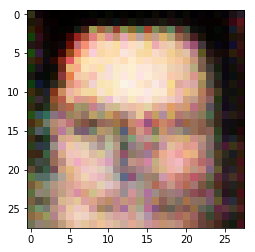

Discriminator Loss: 0.6717... Generator Loss: 2.5328


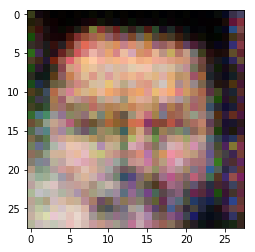

Discriminator Loss: 1.9694... Generator Loss: 0.2892


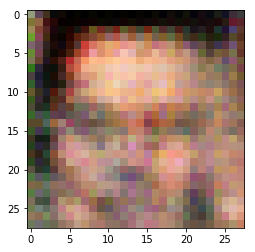

Discriminator Loss: 0.8739... Generator Loss: 2.8789


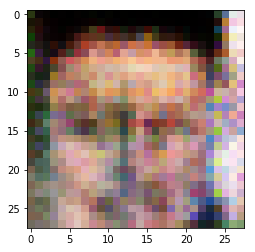

Discriminator Loss: 0.7491... Generator Loss: 2.1928


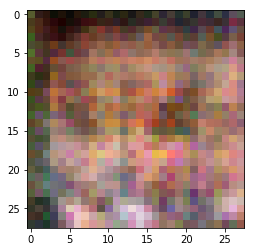

Discriminator Loss: 1.3535... Generator Loss: 0.5395


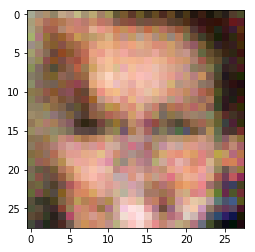

Discriminator Loss: 1.3404... Generator Loss: 0.7255


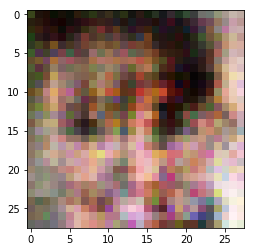

Discriminator Loss: 1.5746... Generator Loss: 2.8768


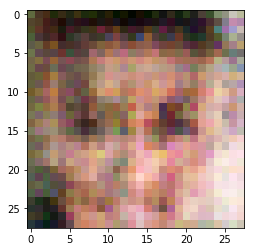

Discriminator Loss: 0.8768... Generator Loss: 1.8351


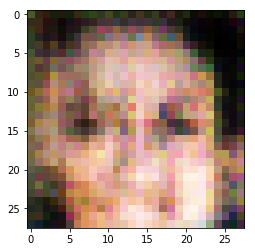

Discriminator Loss: 1.6660... Generator Loss: 0.3447


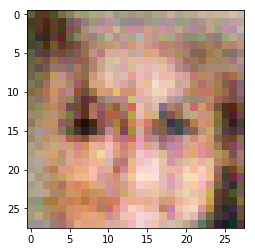

Discriminator Loss: 0.9916... Generator Loss: 1.4792


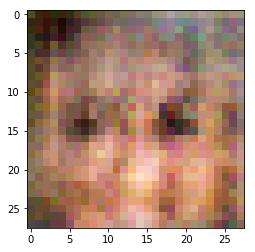

Discriminator Loss: 0.9495... Generator Loss: 1.3577


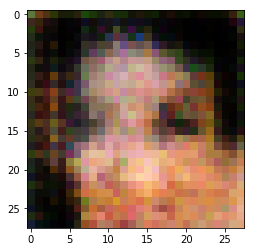

Discriminator Loss: 0.9707... Generator Loss: 0.9421


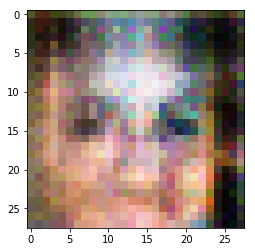

Discriminator Loss: 0.9122... Generator Loss: 1.0981


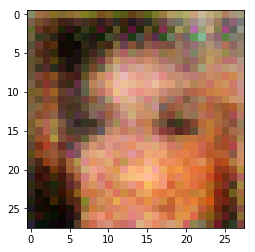

Discriminator Loss: 0.8524... Generator Loss: 1.5080


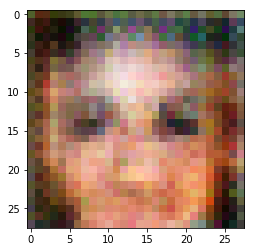

Discriminator Loss: 0.6911... Generator Loss: 1.6342


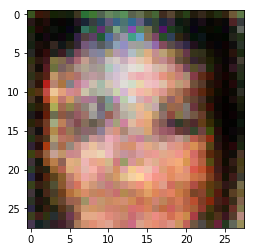

Discriminator Loss: 0.9130... Generator Loss: 0.9988


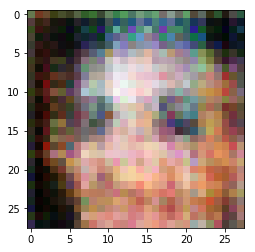

Discriminator Loss: 0.9103... Generator Loss: 1.2791


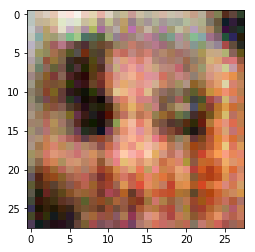

Discriminator Loss: 0.8846... Generator Loss: 1.1720


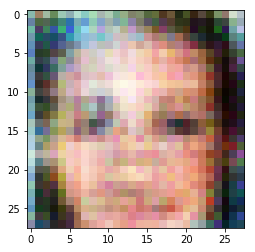

Discriminator Loss: 1.0558... Generator Loss: 0.8576


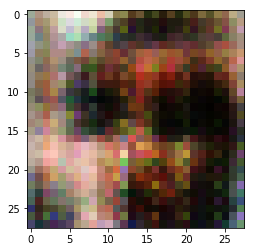

Discriminator Loss: 1.0176... Generator Loss: 1.0649


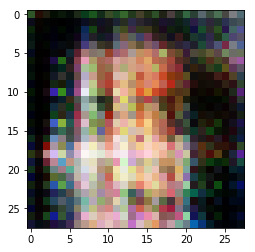

Discriminator Loss: 0.9450... Generator Loss: 1.1991


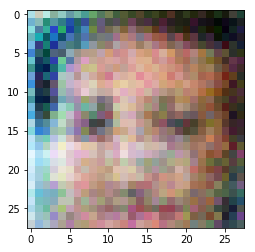

Discriminator Loss: 0.9821... Generator Loss: 0.9506


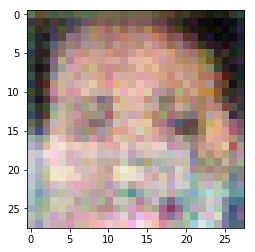

Discriminator Loss: 1.0289... Generator Loss: 1.1109


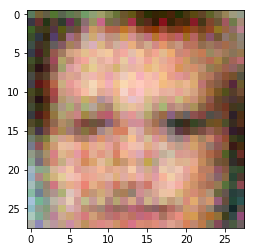

Discriminator Loss: 1.4992... Generator Loss: 0.4753


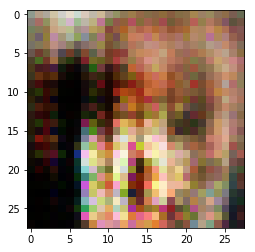

Discriminator Loss: 0.9520... Generator Loss: 2.4995


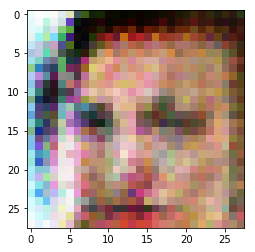

Discriminator Loss: 1.0754... Generator Loss: 0.9499


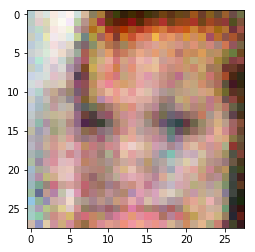

Discriminator Loss: 1.0562... Generator Loss: 0.8919


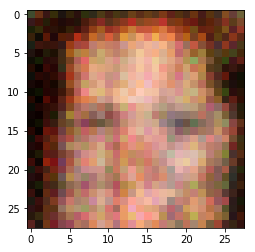

Discriminator Loss: 0.8921... Generator Loss: 1.5255


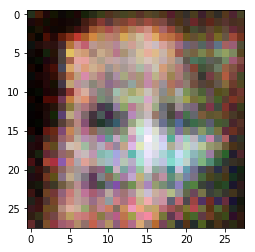

Discriminator Loss: 1.2628... Generator Loss: 0.5996


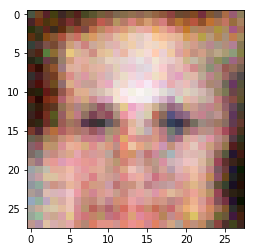

Discriminator Loss: 1.3360... Generator Loss: 3.7321


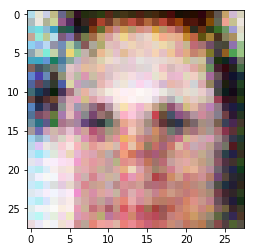

Discriminator Loss: 0.7951... Generator Loss: 1.2207


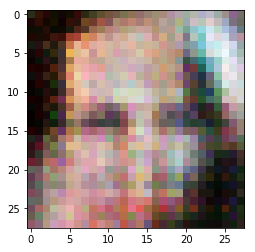

Discriminator Loss: 1.0854... Generator Loss: 0.7419


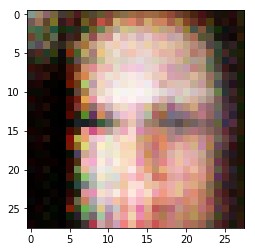

Discriminator Loss: 0.8372... Generator Loss: 2.4555


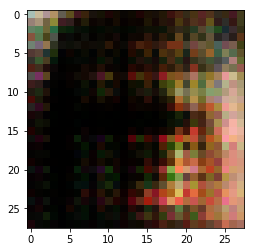

Discriminator Loss: 0.6960... Generator Loss: 1.5928


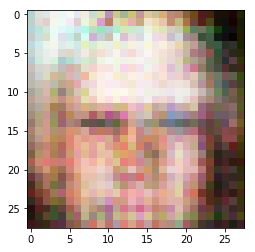

Discriminator Loss: 1.0158... Generator Loss: 0.8143


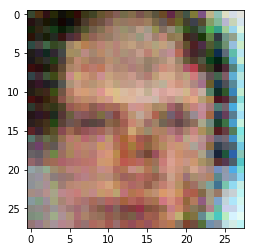

Discriminator Loss: 1.1454... Generator Loss: 0.8911


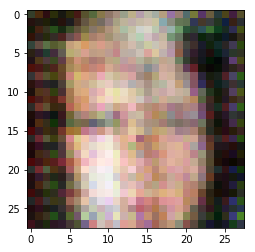

Discriminator Loss: 1.0132... Generator Loss: 1.1176


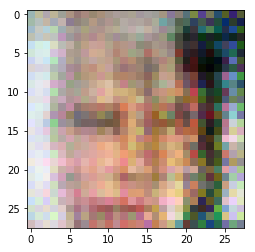

Discriminator Loss: 0.7028... Generator Loss: 1.5041


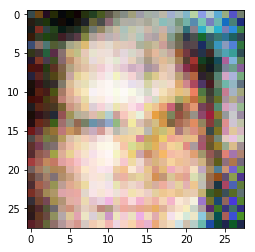

Discriminator Loss: 0.9884... Generator Loss: 0.9143


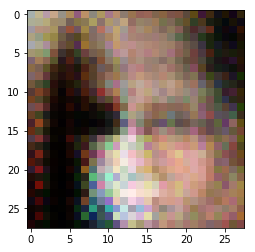

Discriminator Loss: 0.8113... Generator Loss: 2.2144


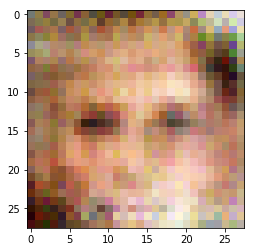

Discriminator Loss: 1.3857... Generator Loss: 0.5001


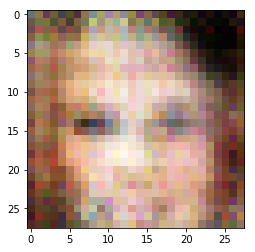

Discriminator Loss: 1.3918... Generator Loss: 3.9061


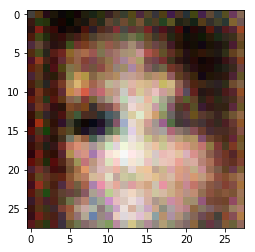

Discriminator Loss: 0.8228... Generator Loss: 1.2450


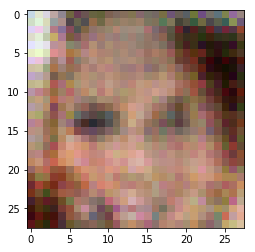

Discriminator Loss: 1.0241... Generator Loss: 0.8127


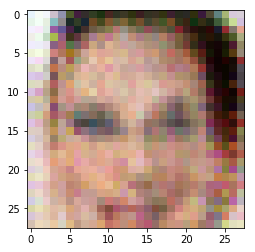

Discriminator Loss: 0.8786... Generator Loss: 2.6822


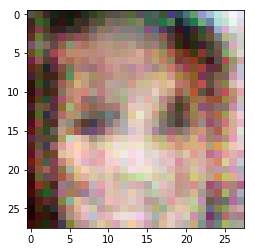

Discriminator Loss: 0.7604... Generator Loss: 1.6896


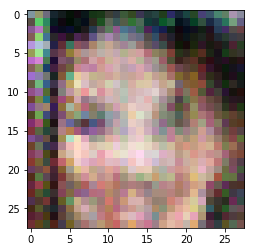

Discriminator Loss: 2.0381... Generator Loss: 0.2804


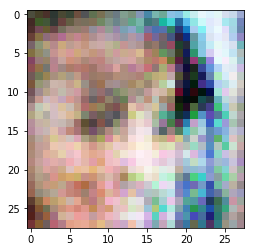

Discriminator Loss: 1.9162... Generator Loss: 3.2569


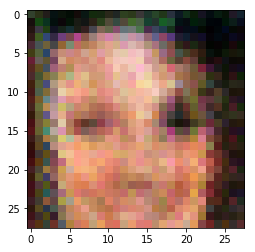

Discriminator Loss: 1.0828... Generator Loss: 1.2908


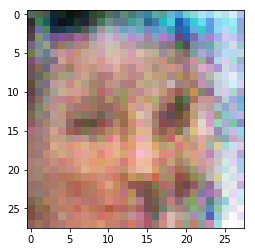

Discriminator Loss: 1.2302... Generator Loss: 0.6291


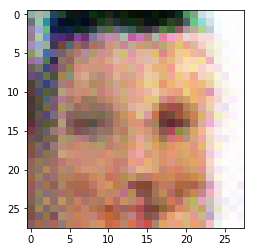

Discriminator Loss: 0.6607... Generator Loss: 2.1228


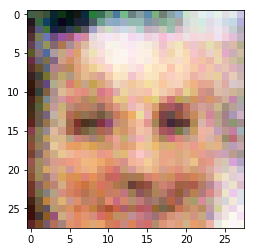

Discriminator Loss: 0.6603... Generator Loss: 2.3510


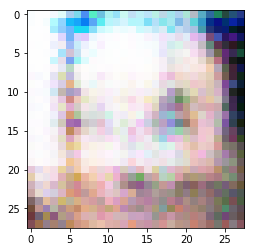

Discriminator Loss: 0.8093... Generator Loss: 1.3372


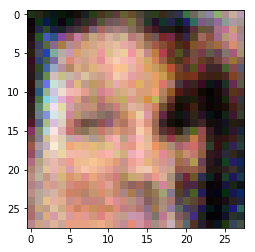

Discriminator Loss: 1.0180... Generator Loss: 0.8529


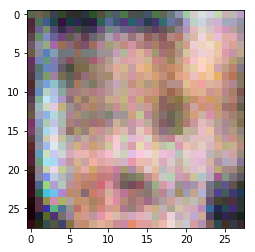

Discriminator Loss: 0.7353... Generator Loss: 1.6849


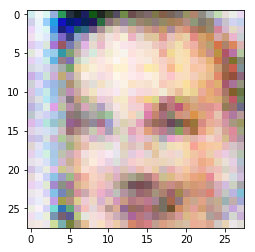

Discriminator Loss: 0.7935... Generator Loss: 1.4851


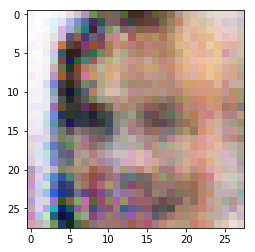

Discriminator Loss: 1.0536... Generator Loss: 0.8209


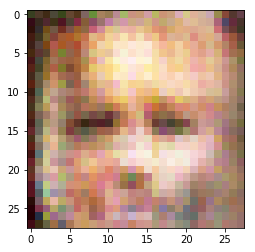

Discriminator Loss: 0.9071... Generator Loss: 1.1173


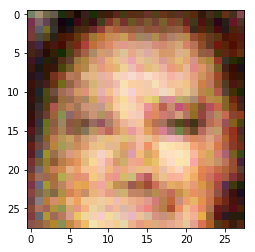

Discriminator Loss: 1.0563... Generator Loss: 1.2305


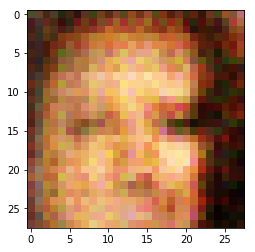

Discriminator Loss: 1.0645... Generator Loss: 0.9056


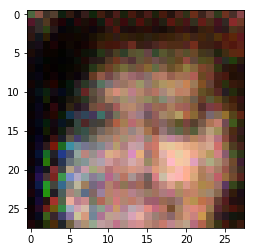

Discriminator Loss: 1.2277... Generator Loss: 0.8004


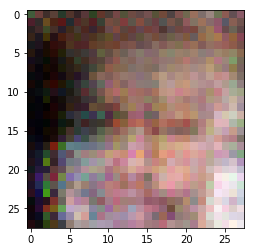

Discriminator Loss: 1.0949... Generator Loss: 1.2142


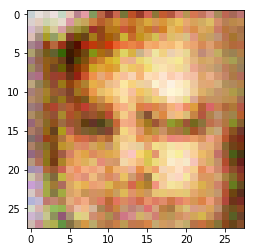

Discriminator Loss: 1.0022... Generator Loss: 0.8615


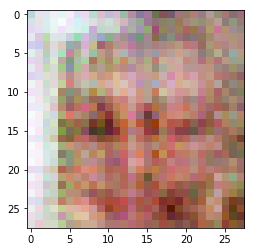

Discriminator Loss: 1.0476... Generator Loss: 1.2550


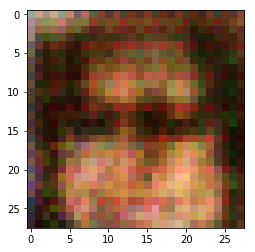

Discriminator Loss: 0.9921... Generator Loss: 0.8704


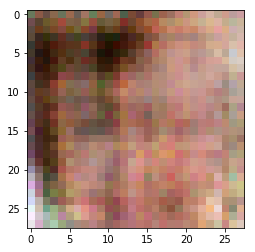

Discriminator Loss: 1.1708... Generator Loss: 1.8959


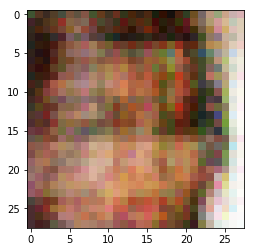

Discriminator Loss: 2.1853... Generator Loss: 0.2152


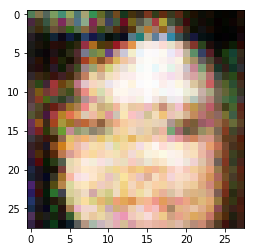

Discriminator Loss: 1.0124... Generator Loss: 2.2367


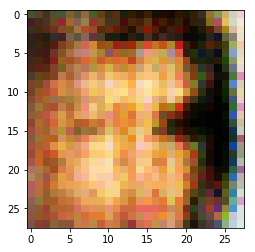

Discriminator Loss: 0.9185... Generator Loss: 1.0950


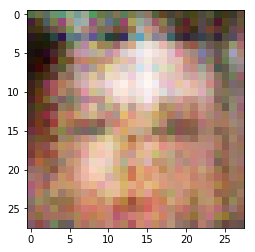

Discriminator Loss: 0.9695... Generator Loss: 0.8553


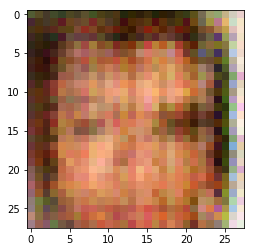

Discriminator Loss: 0.8035... Generator Loss: 2.1740


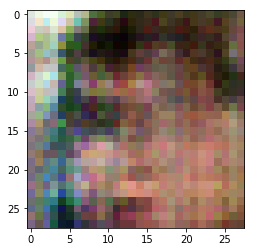

Discriminator Loss: 1.2934... Generator Loss: 0.6069


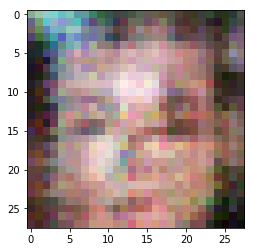

Discriminator Loss: 0.6287... Generator Loss: 2.4707


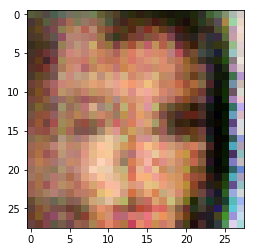

Discriminator Loss: 0.6873... Generator Loss: 1.4700


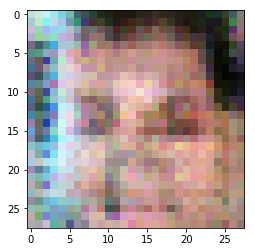

Discriminator Loss: 1.0323... Generator Loss: 0.8183


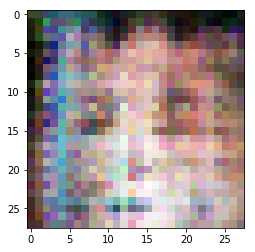

Discriminator Loss: 0.6172... Generator Loss: 2.5453


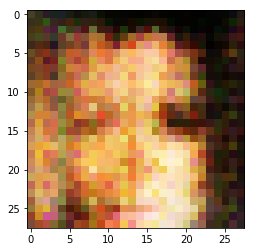

Discriminator Loss: 0.9388... Generator Loss: 1.1583


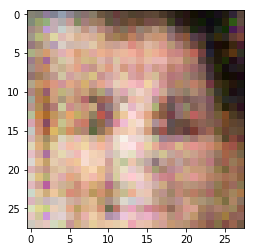

Discriminator Loss: 1.1210... Generator Loss: 0.8586


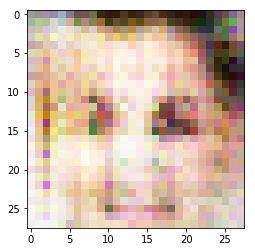

Discriminator Loss: 0.9519... Generator Loss: 4.0014


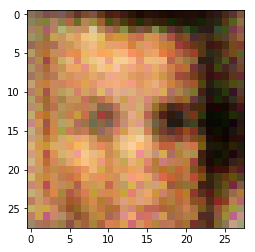

Discriminator Loss: 1.5346... Generator Loss: 0.4617


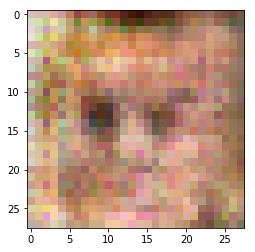

Discriminator Loss: 1.4817... Generator Loss: 5.0921


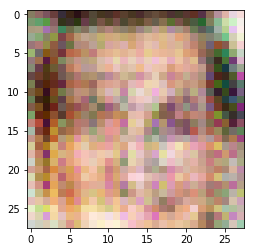

Discriminator Loss: 0.7142... Generator Loss: 1.3306


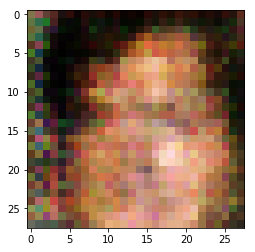

Discriminator Loss: 1.4263... Generator Loss: 0.4982


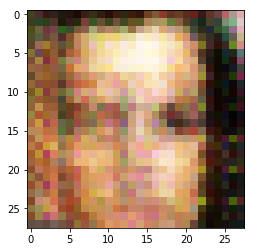

Discriminator Loss: 1.2381... Generator Loss: 2.8152


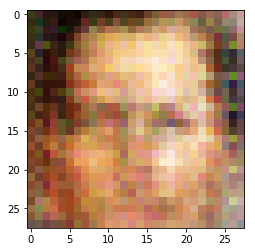

Discriminator Loss: 0.8386... Generator Loss: 1.3581


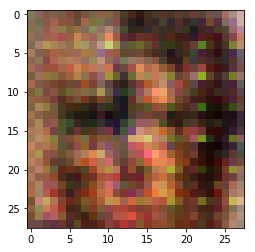

Discriminator Loss: 1.3836... Generator Loss: 0.5376


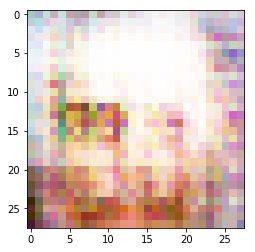

Discriminator Loss: 1.1783... Generator Loss: 1.7223


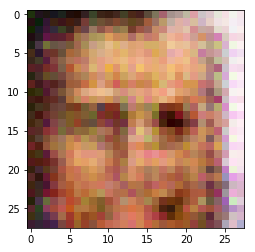

Discriminator Loss: 1.3306... Generator Loss: 0.6603


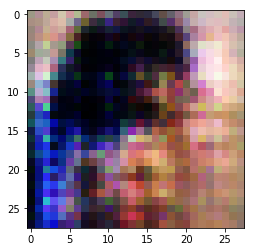

Discriminator Loss: 1.0947... Generator Loss: 1.8819


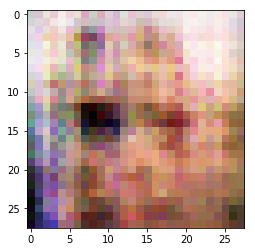

Discriminator Loss: 1.0442... Generator Loss: 0.8305


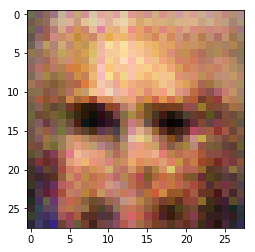

Discriminator Loss: 0.6889... Generator Loss: 2.0124


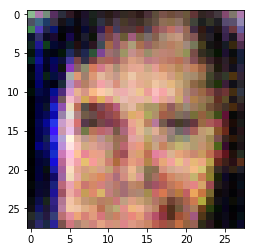

Discriminator Loss: 0.8244... Generator Loss: 1.2113


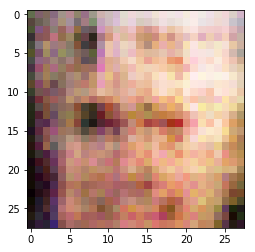

Discriminator Loss: 0.7958... Generator Loss: 1.2888


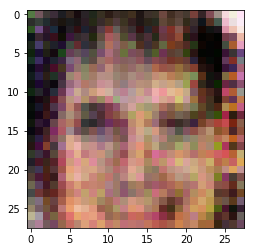

Discriminator Loss: 0.9422... Generator Loss: 0.9682


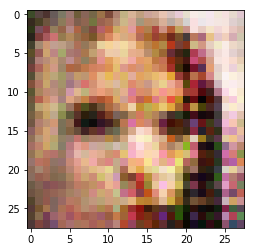

Discriminator Loss: 1.0128... Generator Loss: 1.6941


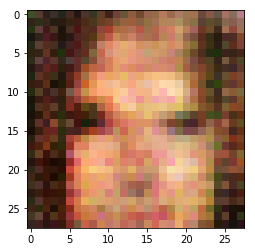

Discriminator Loss: 1.7561... Generator Loss: 0.3514


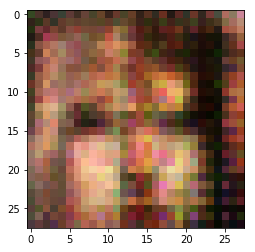

Discriminator Loss: 1.9082... Generator Loss: 5.0632


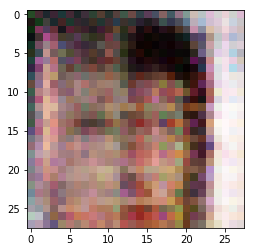

Discriminator Loss: 0.8068... Generator Loss: 1.1607


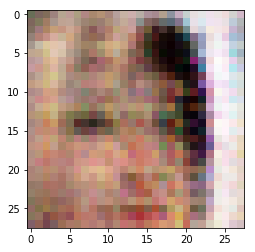

Discriminator Loss: 1.6046... Generator Loss: 0.4081


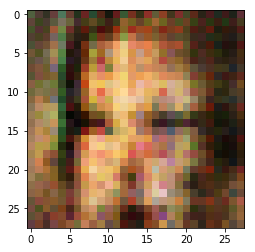

Discriminator Loss: 0.9977... Generator Loss: 2.6336


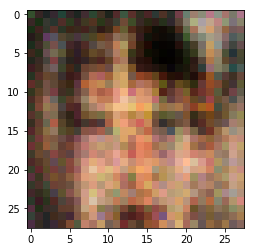

Discriminator Loss: 0.7735... Generator Loss: 1.6697


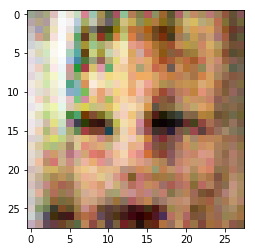

Discriminator Loss: 1.0963... Generator Loss: 0.7415


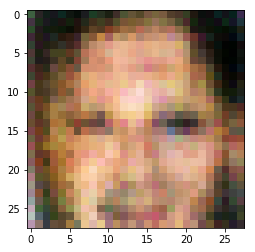

Discriminator Loss: 1.1906... Generator Loss: 0.7500


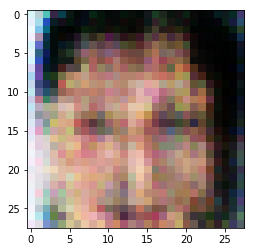

Discriminator Loss: 1.1925... Generator Loss: 0.8704


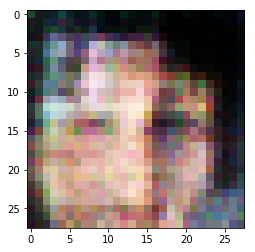

Discriminator Loss: 1.1414... Generator Loss: 2.5448


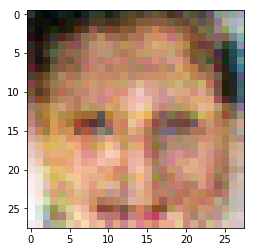

Discriminator Loss: 1.5759... Generator Loss: 0.3836


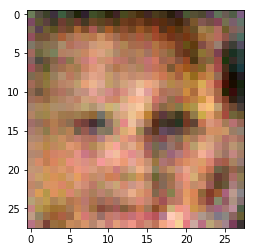

Discriminator Loss: 0.9341... Generator Loss: 1.6010


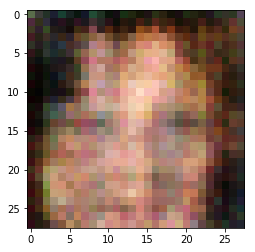

Discriminator Loss: 0.8301... Generator Loss: 1.4130


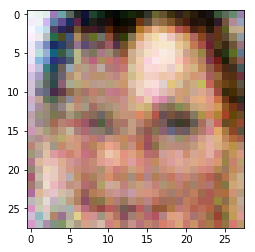

Discriminator Loss: 1.4235... Generator Loss: 0.5601


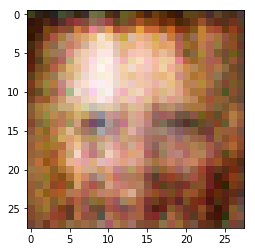

Discriminator Loss: 0.9717... Generator Loss: 1.2364


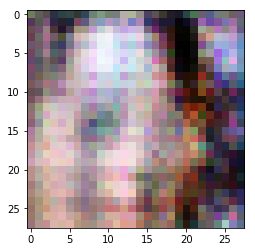

Discriminator Loss: 0.9422... Generator Loss: 1.7083


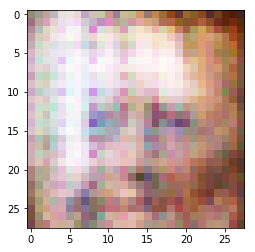

Discriminator Loss: 1.4743... Generator Loss: 0.4907


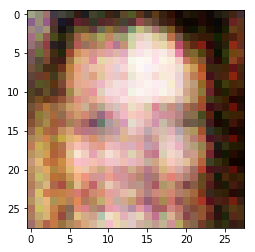

Discriminator Loss: 0.8619... Generator Loss: 2.6544


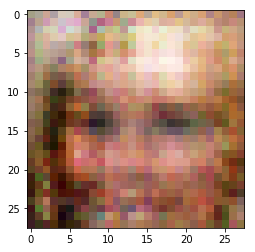

Discriminator Loss: 1.1023... Generator Loss: 0.7771


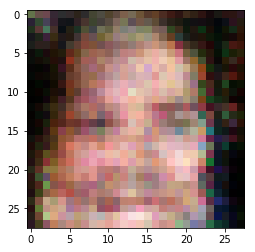

Discriminator Loss: 1.0707... Generator Loss: 1.2512


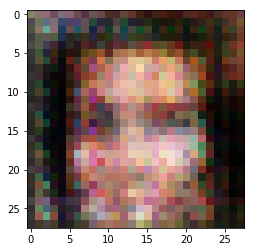

Discriminator Loss: 2.1001... Generator Loss: 0.2652


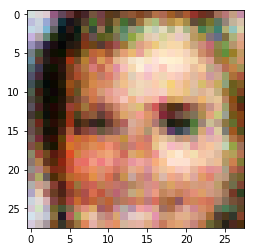

Discriminator Loss: 2.2909... Generator Loss: 3.8103


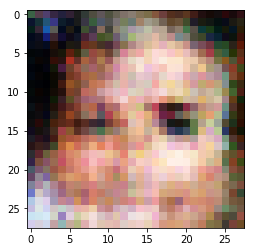

Discriminator Loss: 1.0513... Generator Loss: 1.4303


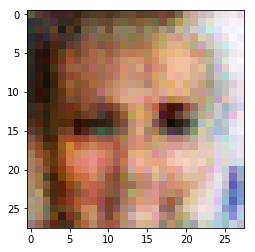

Discriminator Loss: 1.7538... Generator Loss: 0.6598


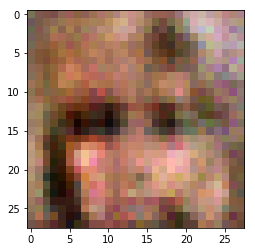

Discriminator Loss: 0.8022... Generator Loss: 1.3845


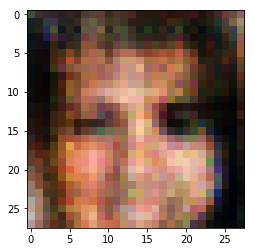

Discriminator Loss: 0.8416... Generator Loss: 1.9750


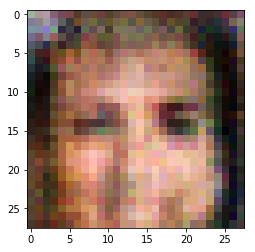

Discriminator Loss: 0.7625... Generator Loss: 1.6105


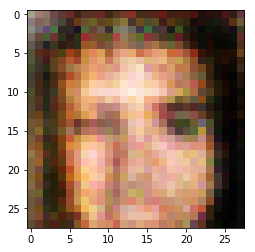

Discriminator Loss: 0.8721... Generator Loss: 1.2642


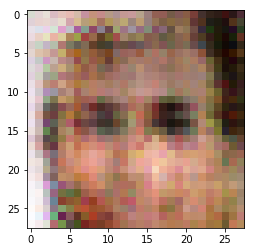

Discriminator Loss: 0.9973... Generator Loss: 1.1401


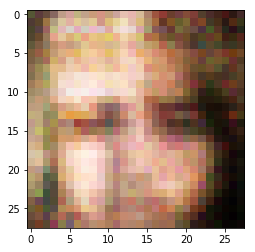

Discriminator Loss: 1.2696... Generator Loss: 0.8888


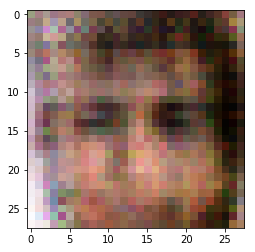

Discriminator Loss: 1.0149... Generator Loss: 1.6322


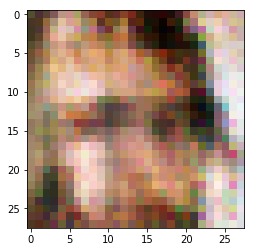

Discriminator Loss: 1.2978... Generator Loss: 0.6801


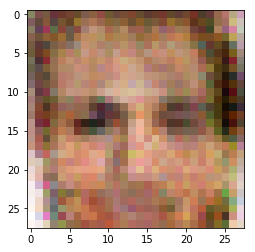

Discriminator Loss: 1.0649... Generator Loss: 1.6336


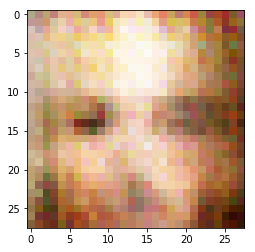

Discriminator Loss: 1.3677... Generator Loss: 0.5649


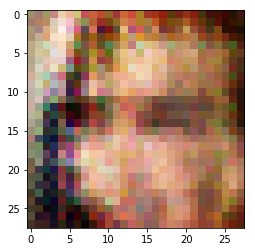

Discriminator Loss: 1.0498... Generator Loss: 2.0604


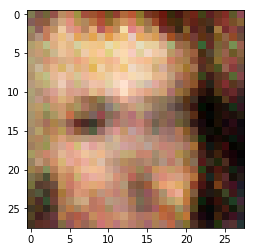

Discriminator Loss: 1.0274... Generator Loss: 0.9732


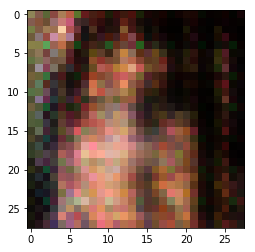

Discriminator Loss: 0.9969... Generator Loss: 0.9783


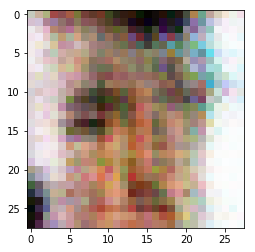

Discriminator Loss: 0.8452... Generator Loss: 1.2079


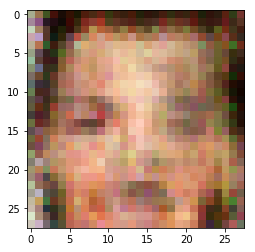

Discriminator Loss: 0.6144... Generator Loss: 1.8529


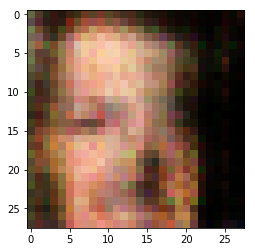

Discriminator Loss: 0.7320... Generator Loss: 1.4671


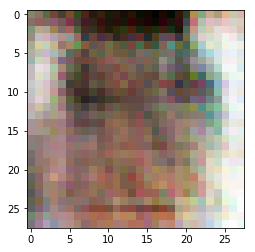

Discriminator Loss: 0.8317... Generator Loss: 1.1881


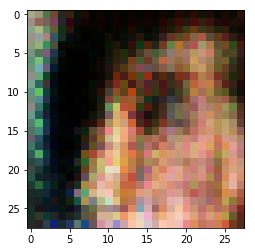

Discriminator Loss: 0.7839... Generator Loss: 1.5676


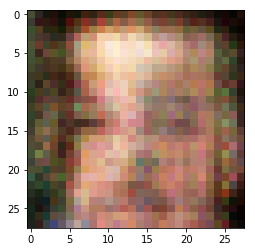

Discriminator Loss: 0.9713... Generator Loss: 0.9921


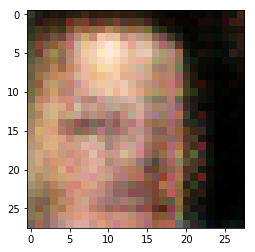

Discriminator Loss: 1.0498... Generator Loss: 0.9186


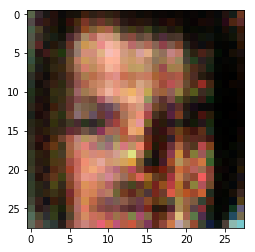

Discriminator Loss: 0.7816... Generator Loss: 1.7710


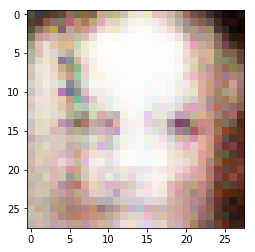

Discriminator Loss: 1.1231... Generator Loss: 0.7713


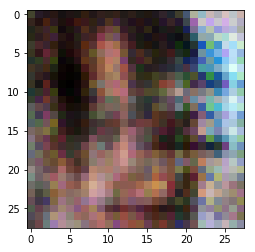

Discriminator Loss: 0.8615... Generator Loss: 1.9589


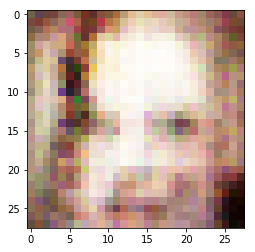

Discriminator Loss: 1.0268... Generator Loss: 0.8223


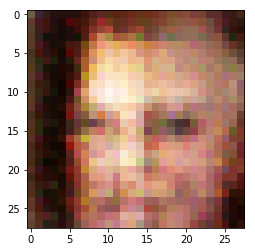

Discriminator Loss: 1.3393... Generator Loss: 4.0864


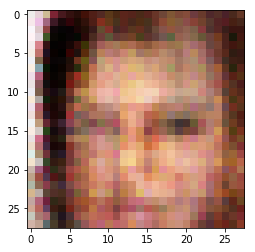

Discriminator Loss: 1.9987... Generator Loss: 0.3137


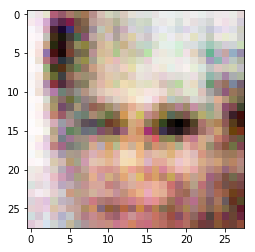

Discriminator Loss: 1.1403... Generator Loss: 5.3619


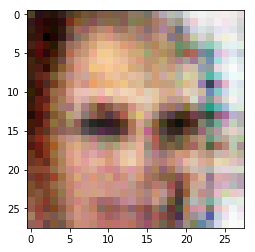

Discriminator Loss: 0.5070... Generator Loss: 3.3617


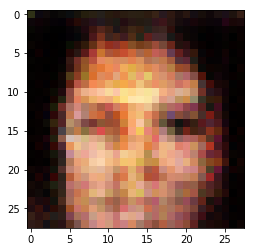

Discriminator Loss: 1.4994... Generator Loss: 0.4492


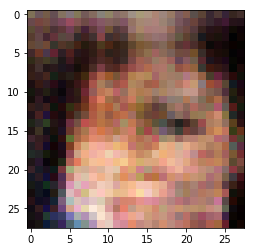

Discriminator Loss: 0.7634... Generator Loss: 1.2954


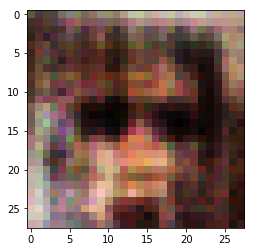

Discriminator Loss: 0.9019... Generator Loss: 1.9372


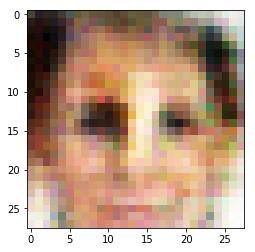

Discriminator Loss: 1.1289... Generator Loss: 0.8581


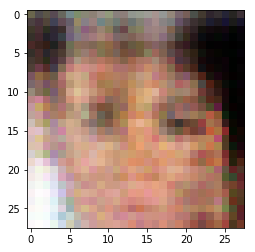

Discriminator Loss: 1.2029... Generator Loss: 0.6946


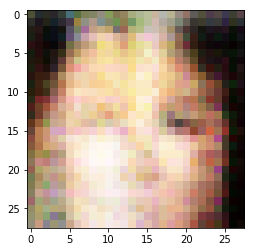

Discriminator Loss: 1.2020... Generator Loss: 3.4058


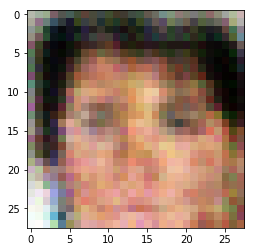

Discriminator Loss: 0.6932... Generator Loss: 1.4987


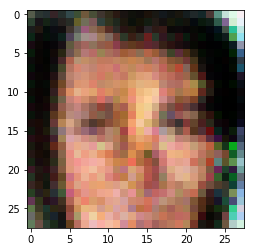

Discriminator Loss: 1.4214... Generator Loss: 0.4578


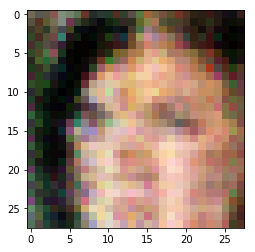

Discriminator Loss: 1.2287... Generator Loss: 3.2478


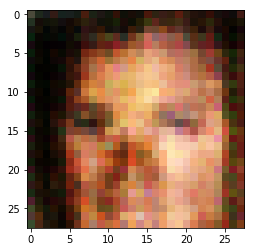

Discriminator Loss: 0.9558... Generator Loss: 1.0467


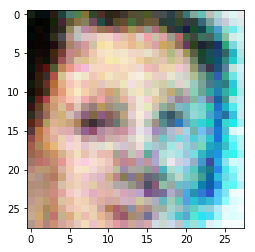

Discriminator Loss: 1.3411... Generator Loss: 0.5356


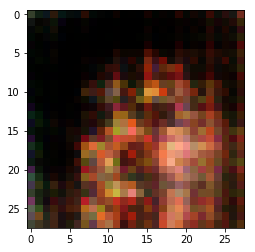

Discriminator Loss: 1.0619... Generator Loss: 1.7511


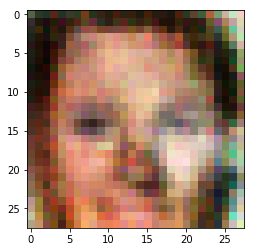

Discriminator Loss: 0.9656... Generator Loss: 1.1030


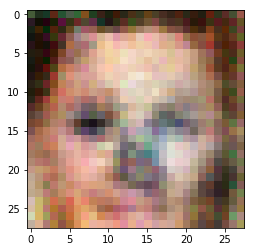

Discriminator Loss: 1.0782... Generator Loss: 0.7554


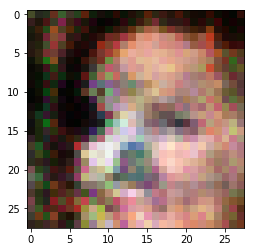

Discriminator Loss: 0.8192... Generator Loss: 1.4807


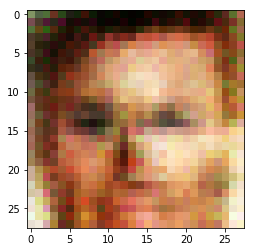

Discriminator Loss: 0.7031... Generator Loss: 1.5365


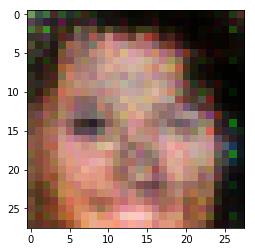

Discriminator Loss: 0.7188... Generator Loss: 1.9869


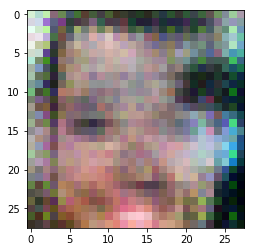

Discriminator Loss: 1.3274... Generator Loss: 0.5292


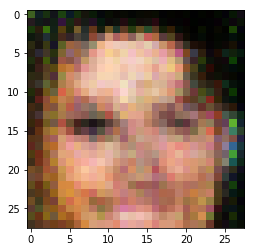

Discriminator Loss: 1.3014... Generator Loss: 3.5975


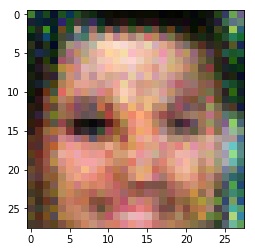

Discriminator Loss: 1.2665... Generator Loss: 0.6121


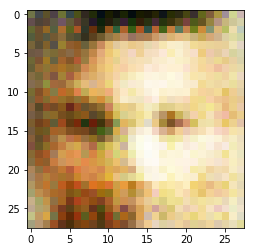

Discriminator Loss: 0.8458... Generator Loss: 1.5199


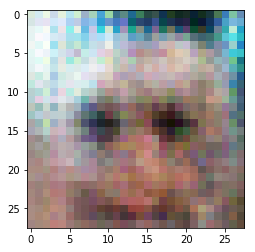

Discriminator Loss: 0.6545... Generator Loss: 1.7852


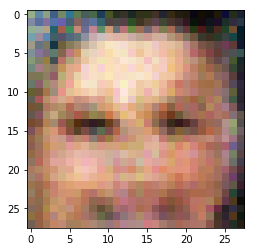

Discriminator Loss: 1.1548... Generator Loss: 0.6771


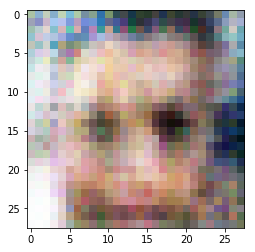

Discriminator Loss: 1.0126... Generator Loss: 3.1031


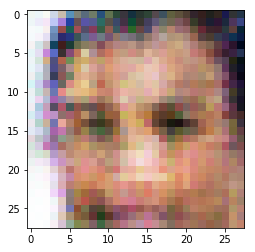

Discriminator Loss: 0.7609... Generator Loss: 1.2335


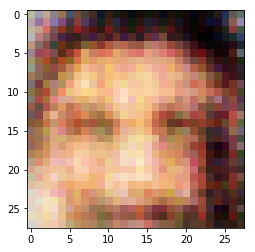

Discriminator Loss: 1.0017... Generator Loss: 0.8446


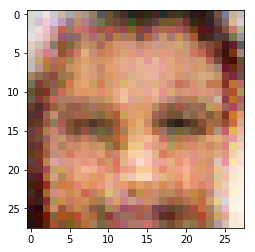

Discriminator Loss: 0.7615... Generator Loss: 1.9586


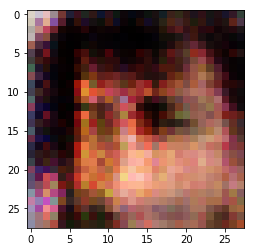

Discriminator Loss: 0.9732... Generator Loss: 0.9997


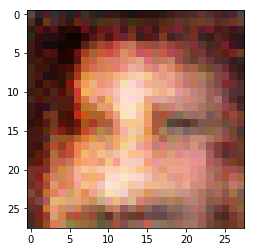

Discriminator Loss: 0.7496... Generator Loss: 1.8225


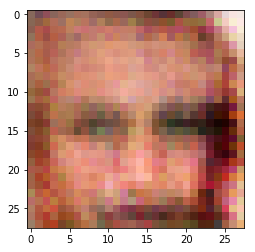

Discriminator Loss: 1.3220... Generator Loss: 0.5349


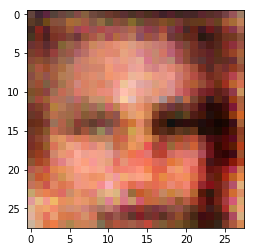

Discriminator Loss: 1.0625... Generator Loss: 3.9515


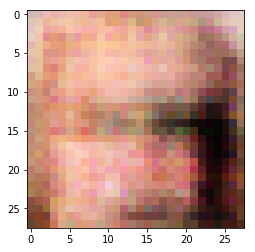

Discriminator Loss: 2.4478... Generator Loss: 0.2170


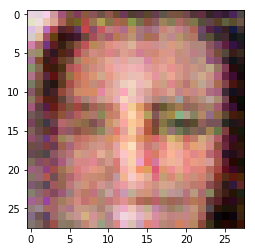

Discriminator Loss: 1.1895... Generator Loss: 4.8422


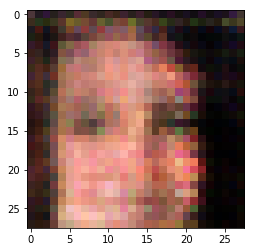

Discriminator Loss: 0.4856... Generator Loss: 3.3797


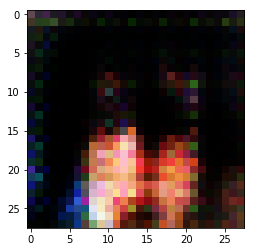

Discriminator Loss: 1.3531... Generator Loss: 0.5883


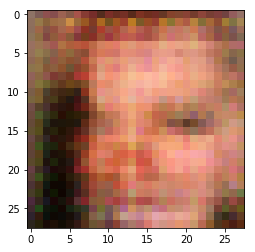

Discriminator Loss: 0.6990... Generator Loss: 1.9145


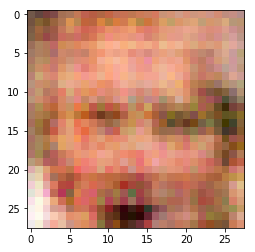

Discriminator Loss: 0.9406... Generator Loss: 1.2923


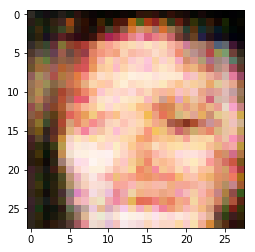

Discriminator Loss: 1.4106... Generator Loss: 0.5174


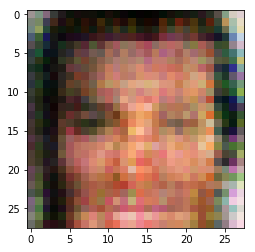

Discriminator Loss: 1.1641... Generator Loss: 3.0127


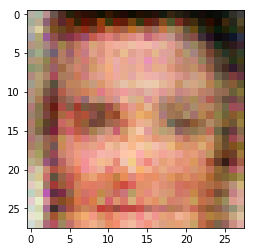

Discriminator Loss: 1.0473... Generator Loss: 0.8928


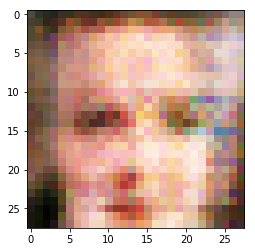

Discriminator Loss: 1.0169... Generator Loss: 0.8286


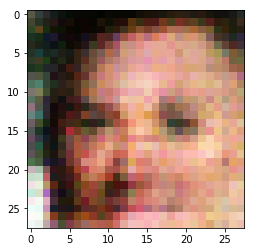

Discriminator Loss: 0.8345... Generator Loss: 1.4328


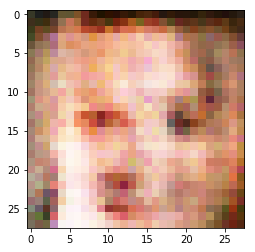

Discriminator Loss: 0.7326... Generator Loss: 1.9358


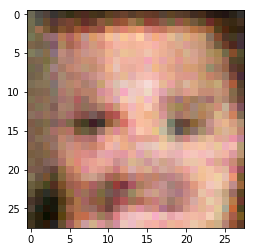

Discriminator Loss: 1.0070... Generator Loss: 0.8896


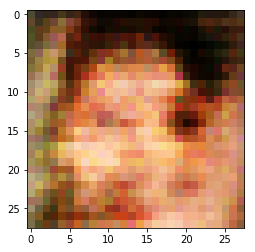

Discriminator Loss: 0.8832... Generator Loss: 1.4085


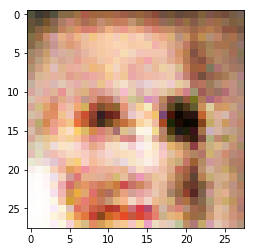

Discriminator Loss: 0.7813... Generator Loss: 1.6605


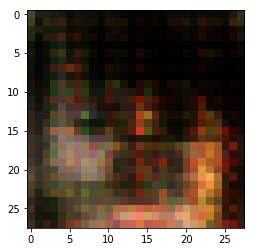

Discriminator Loss: 0.9280... Generator Loss: 1.0080


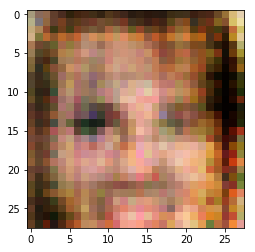

Discriminator Loss: 1.0410... Generator Loss: 2.4385


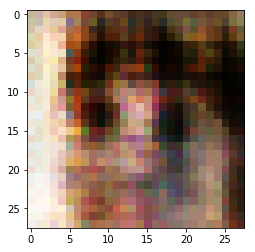

Discriminator Loss: 2.1939... Generator Loss: 0.2913


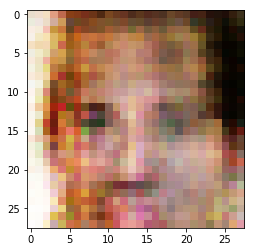

Discriminator Loss: 2.6040... Generator Loss: 6.4713


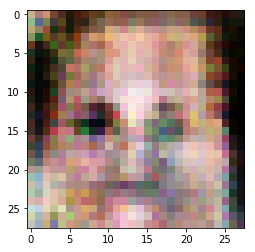

Discriminator Loss: 0.8642... Generator Loss: 2.8541


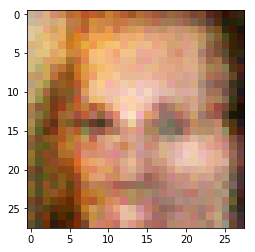

Discriminator Loss: 1.0717... Generator Loss: 0.7660


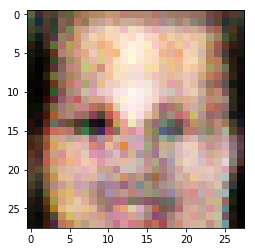

Discriminator Loss: 0.6878... Generator Loss: 1.4063


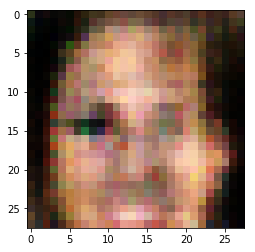

Discriminator Loss: 0.7315... Generator Loss: 1.8845


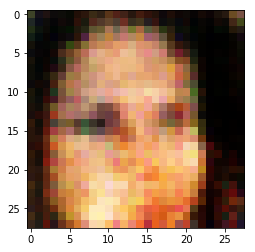

Discriminator Loss: 0.9767... Generator Loss: 0.9543


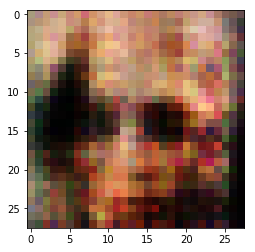

Discriminator Loss: 0.8588... Generator Loss: 1.3310


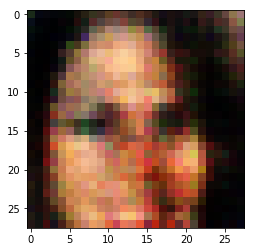

Discriminator Loss: 1.2997... Generator Loss: 0.6675


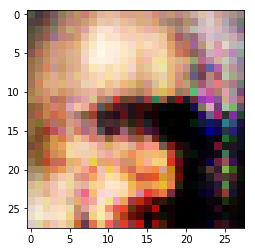

Discriminator Loss: 0.9938... Generator Loss: 1.4612


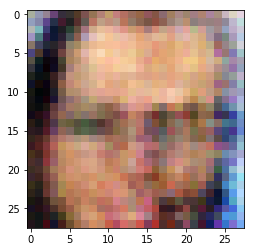

Discriminator Loss: 1.0138... Generator Loss: 0.9927


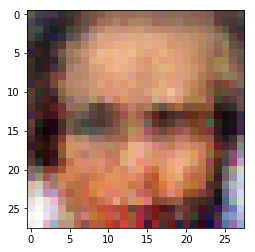

Discriminator Loss: 0.8465... Generator Loss: 1.5192


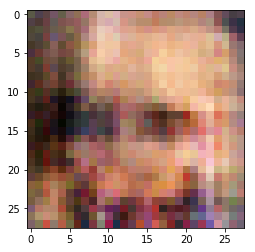

Discriminator Loss: 0.7298... Generator Loss: 1.4214


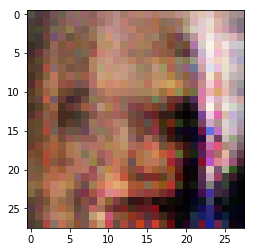

Discriminator Loss: 0.7389... Generator Loss: 1.3345


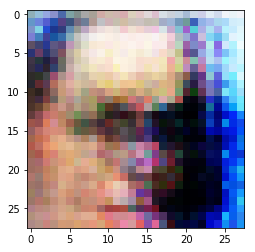

Discriminator Loss: 0.6436... Generator Loss: 1.6559


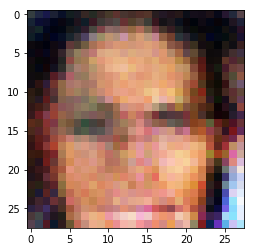

Discriminator Loss: 0.7862... Generator Loss: 1.2794


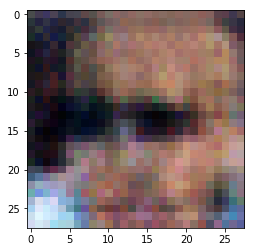

Discriminator Loss: 0.8784... Generator Loss: 1.0648


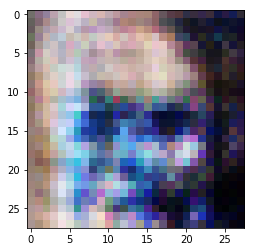

Discriminator Loss: 0.8435... Generator Loss: 1.3071


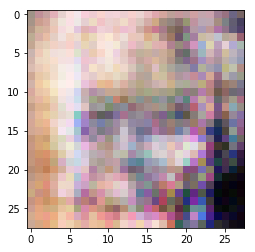

Discriminator Loss: 0.7692... Generator Loss: 1.3031


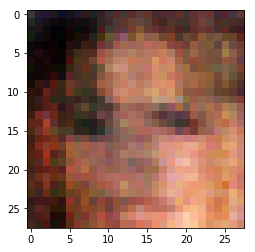

Discriminator Loss: 1.0369... Generator Loss: 0.8719


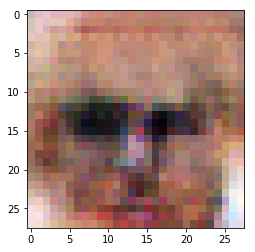

Discriminator Loss: 0.9537... Generator Loss: 1.3037


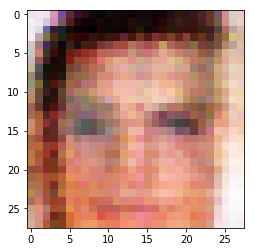

Discriminator Loss: 0.7711... Generator Loss: 1.4756


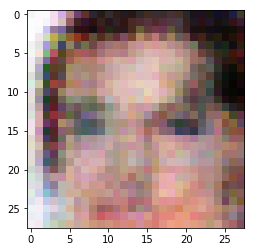

Discriminator Loss: 1.4753... Generator Loss: 0.4566


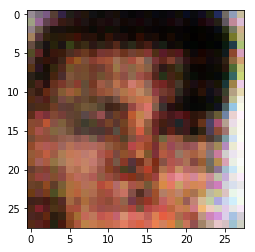

Discriminator Loss: 1.4246... Generator Loss: 4.1752


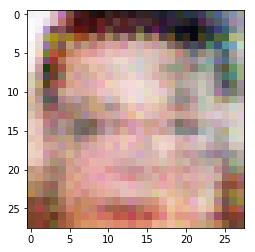

Discriminator Loss: 1.1263... Generator Loss: 0.7723


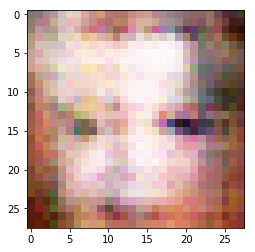

Discriminator Loss: 0.7944... Generator Loss: 1.1945


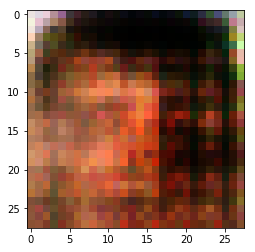

Discriminator Loss: 0.7852... Generator Loss: 2.0778


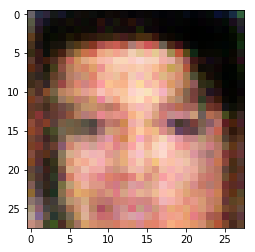

Discriminator Loss: 1.3376... Generator Loss: 0.5646


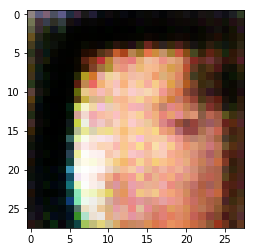

Discriminator Loss: 1.3891... Generator Loss: 4.1630


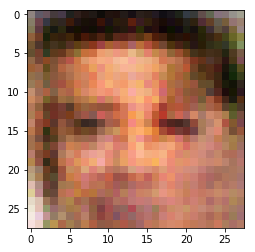

Discriminator Loss: 0.5969... Generator Loss: 2.2311


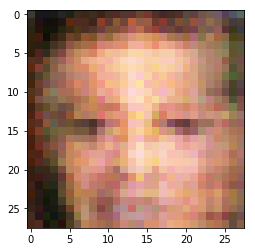

Discriminator Loss: 1.1043... Generator Loss: 0.7247


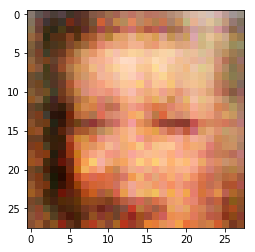

Discriminator Loss: 0.6653... Generator Loss: 2.0567


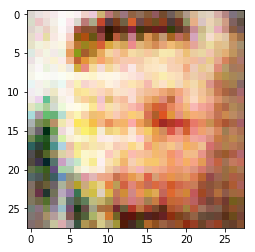

Discriminator Loss: 0.6585... Generator Loss: 2.2143


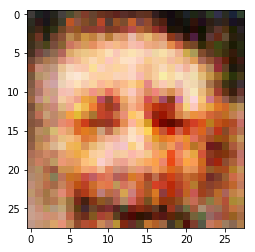

Discriminator Loss: 1.1490... Generator Loss: 0.7133


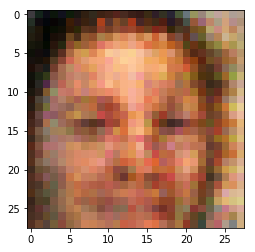

Discriminator Loss: 0.8997... Generator Loss: 1.3664


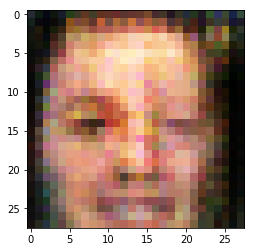

Discriminator Loss: 0.8530... Generator Loss: 1.3643


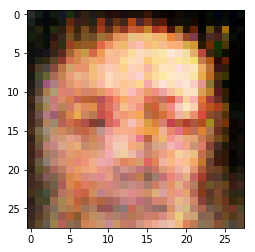

Discriminator Loss: 1.0891... Generator Loss: 0.8370


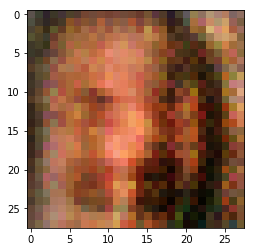

Discriminator Loss: 1.3602... Generator Loss: 0.5464


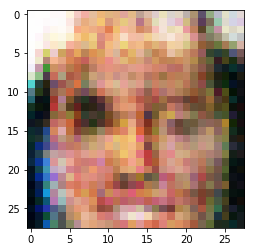

Discriminator Loss: 1.4592... Generator Loss: 4.2522


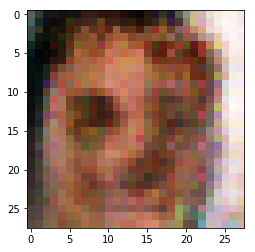

Discriminator Loss: 0.6371... Generator Loss: 1.6098


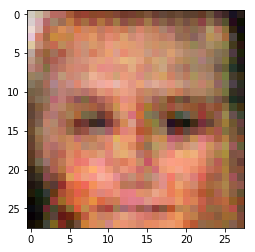

Discriminator Loss: 1.6709... Generator Loss: 0.3650


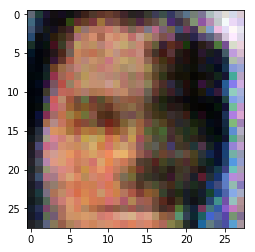

Discriminator Loss: 1.1531... Generator Loss: 3.3331


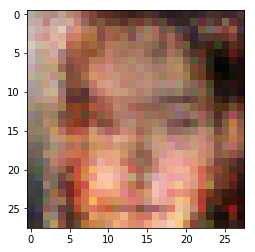

Discriminator Loss: 0.6675... Generator Loss: 1.7551


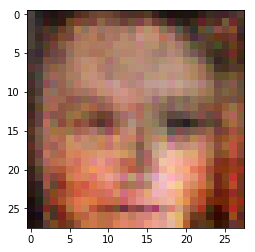

Discriminator Loss: 2.2324... Generator Loss: 0.1999


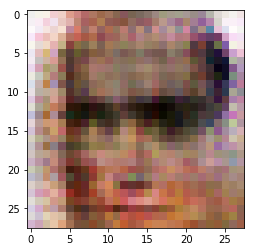

Discriminator Loss: 1.2899... Generator Loss: 4.1410


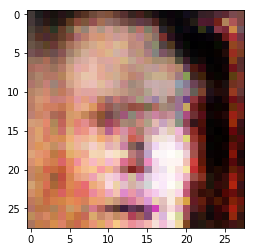

Discriminator Loss: 0.5660... Generator Loss: 2.4118


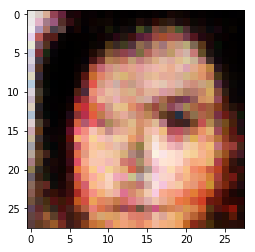

Discriminator Loss: 1.6329... Generator Loss: 0.4174


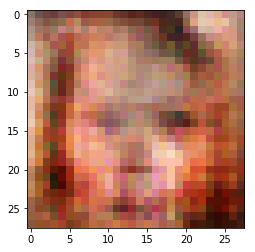

Discriminator Loss: 0.7361... Generator Loss: 1.7315


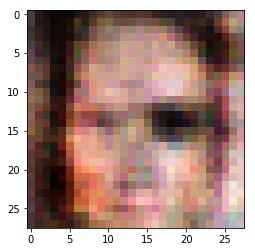

Discriminator Loss: 0.9702... Generator Loss: 1.7063


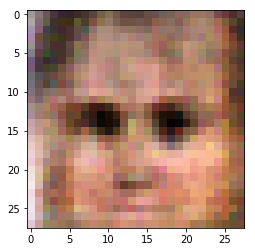

Discriminator Loss: 1.1072... Generator Loss: 0.8388


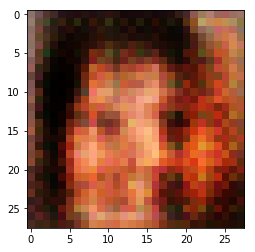

Discriminator Loss: 0.9907... Generator Loss: 1.1615


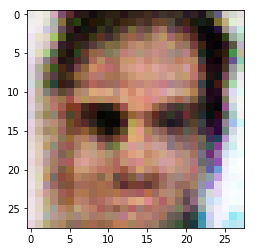

Discriminator Loss: 1.2722... Generator Loss: 0.7125


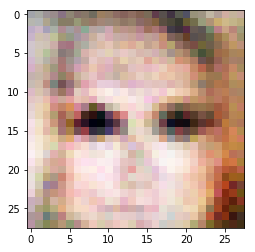

Discriminator Loss: 0.8689... Generator Loss: 2.4354


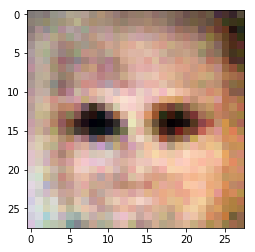

Discriminator Loss: 1.1981... Generator Loss: 0.7011


KeyboardInterrupt: 

In [61]:
batch_size = 64
z_dim = 200
learning_rate = .0005
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.